# Set-up the system

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/My Drive/Project_DIQ

/content/gdrive/.shortcut-targets-by-id/1D1_oIgnKlWffC18mAJXdv8o1jxX-DjlU/Project_DIQ


In [ ]:
import sys
sys.path.append('/content/gdrive/My Drive/Project_DIQ/script')

In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import dirty_accuracy as da

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split

from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

from sklearn.compose import ColumnTransformer
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsRegressor

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from matplotlib import rcParams
import matplotlib.pyplot as plt

rcParams['figure.figsize'] = 11.7,8.27 # figure size in inches

seed = 42
lb = LabelEncoder()

In [ ]:
#z-score

def ZS(data, threshold):
    mean = np.mean(data)
    sd = np.std(data) # calculate standard deviation
    outliers = [] # create empty list to store outliers
    outliersIndexes = []
    j = 0
    for i in data: # detect outliers
        z = (i - mean) / sd  # calculate z-score
        if abs(z) > threshold:  # identify outliers
            outliers.append(i)  # add to the empty list
            outliersIndexes.append(j)
        j += 1

    # print outliers
    print("The detected outliers are: ", str(outliers))
    return outliersIndexes

# Frogs



## Import dataset



In [ ]:
frogs = pd.read_csv('/content/gdrive/My Drive/Project_DIQ/datasets/frogs.csv')

In [ ]:
# store dirty dataset 

if not(os.path.exists('/content/gdrive/My Drive/Project_DIQ/datasets/frogs_accuracy_50.csv')) :
  %cd /content/gdrive/My Drive/Project_DIQ/datasets
  dirty_frogs = []
  dirty_frogs = da.injection(df_pandas=frogs, seed=seed, name="frogs", name_class="Species")
  pd.DataFrame(dirty_frogs[0]).to_csv("frogs_accuracy_50.csv", index=False)
  pd.DataFrame(dirty_frogs[1]).to_csv("frogs_accuracy_60.csv", index=False)
  pd.DataFrame(dirty_frogs[2]).to_csv("frogs_accuracy_70.csv", index=False)
  pd.DataFrame(dirty_frogs[3]).to_csv("frogs_accuracy_80.csv", index=False)
  pd.DataFrame(dirty_frogs[4]).to_csv("frogs_accuracy_90.csv", index=False)
  %cd /content/gdrive/My Drive/Project_DIQ

# retrieve dirty datasets

dirty_frogs = [None] * 5
dirty_frogs[0] = pd.read_csv('/content/gdrive/My Drive/Project_DIQ/datasets/frogs_accuracy_50.csv')
dirty_frogs[1] = pd.read_csv('/content/gdrive/My Drive/Project_DIQ/datasets/frogs_accuracy_60.csv')
dirty_frogs[2] = pd.read_csv('/content/gdrive/My Drive/Project_DIQ/datasets/frogs_accuracy_70.csv')
dirty_frogs[3] = pd.read_csv('/content/gdrive/My Drive/Project_DIQ/datasets/frogs_accuracy_80.csv')
dirty_frogs[4] = pd.read_csv('/content/gdrive/My Drive/Project_DIQ/datasets/frogs_accuracy_90.csv')

In [ ]:
# transform strings in int for ML

def frogsNoString(X):
  X = X.copy()
  X['Species'] = lb.fit_transform(X['Species'])
  
  return X

In [ ]:
# split in data and labels

def frogsSplitML(X):
  X = frogsNoString(X)
  y = X['Species']
  X = X.drop('Species', axis = 1)

  return X,y

In [ ]:
# testset from clear dataset
X_test, y_test = frogsSplitML(frogs)

## Accuracy 50%

### ML algorithm before outlier detection

In [ ]:
X_train, y_train = frogsSplitML(dirty_frogs[0])

In [ ]:
# evaluate with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.47600132406487916
Recall   : 0.47600132406487916
Precision: 0.2265772605115181
F1 score : 0.30701498273392974


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.8467394902350215
Recall   : 0.8467394902350215
Precision: 0.8490738875397335
F1 score : 0.8413568787469671




### Z-Score



In [ ]:
currentDirtyFrogsZS = dirty_frogs[0].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.095)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-6.997705439251629, 5.3293555027408335, -5.974992882784172, 4.182392852289103, 6.216974917236133, -1.4361390121063708, 3.095520470055829, -2.77278522274261, 5.228310813262404, 1.6382726634994578, -1.2073080219171626, 5.088455601059846, 5.143489433100993, 9.279870638270724, 6.346420717491208, -5.854625930988674, -6.014765419172891, 1.120868689943159, 2.405374385037625, 8.641921799732117, 8.717153858202039, 2.639897591392224, 5.716052001182965, 2.461034251693894, 7.03886002452521, -6.037664525971449, 8.524824574057522, -4.879700811590773, -0.107393547992574, -3.324471756286142, -3.432756177432675, 6.114386175892342, 7.75723413664451, -4.096339438931949, 3.980881730959021, 1.2932125845219824, 7.903475992159472, 7.766118035513811, 6.79839463172567, 7.253701268886352, 8.702238483376838, -5.861448787113364, 1.8769662463411467, -3.3014142957424597, 2.3702432239481173, 4.621635632394296, -3.4221591852072395, -7.156534499392177, -0.5802998199294507, 6.39921163362988

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


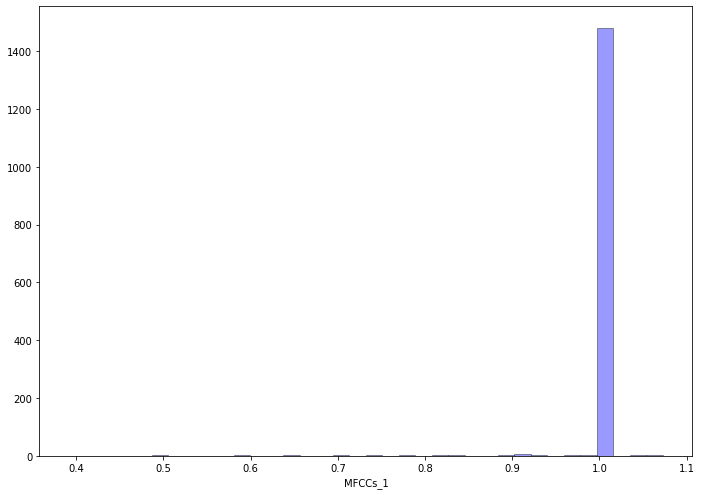

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsZS.loc[i,currentAttr] = currentDirtyFrogsZS[currentAttr].mode()[0]

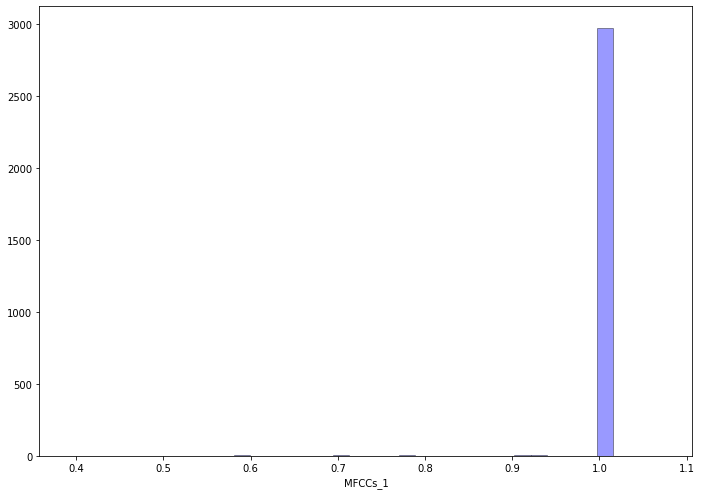

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.085)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-14.960276933313043, -7.048889227987203, 9.144212705069023, -15.245859648251404, 15.49605027348128, -3.776018019045392, 7.828831349768812, 4.737266720157653, -17.279214080940662, -3.6102314238536657, -3.491177177788309, -5.632981024683925, 15.056578115716244, -4.293179212110067, -5.333558212641053, 15.634833428743422, -17.251720570630038, 9.457548367206815, -16.17645743369351, 3.3068782915157287, 14.291655996392375, 10.822625453329618, -4.93783864490983, -6.326183218392567, 12.771457338853413, 14.035825187304532, -15.920510018741323, 1.7598150202824607, -12.865132366159823, -2.290752678090538, -16.82109201233062, -1.906282031385782, 4.009168451709182, -11.494500141682105, 2.4454805336259278, 11.197836251298009, 8.591386518929994, -8.476839592523579, 15.19527279272643, -17.18058483584492, -13.04068156215211, -0.771173188727829, 17.100803825985096, 15.96909273443708, -2.5136186021735405, 9.274354113377928, 15.13989579859216, -8.245643123903424, 7.560843237747

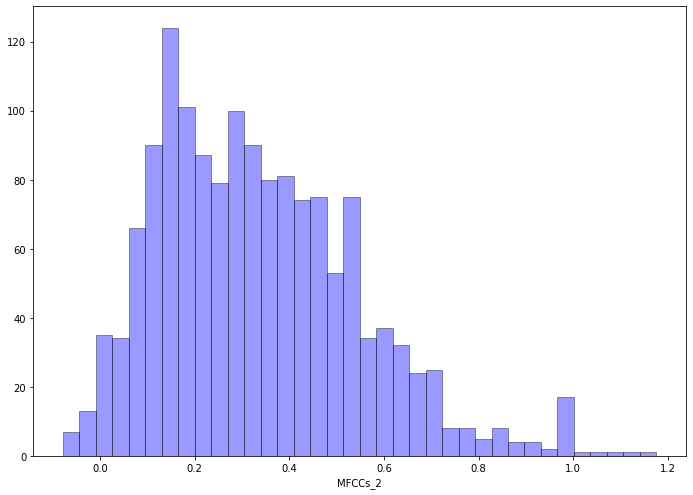

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


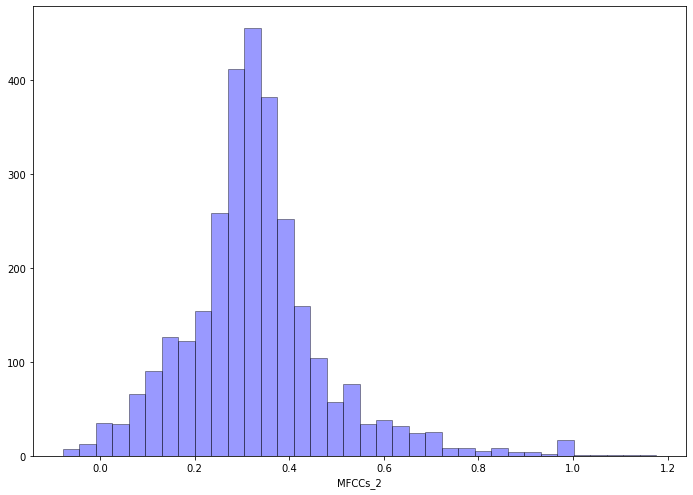

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.1)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.133090724804919, 4.185127631177983, 9.332764330954737, -9.25374296137288, -3.621850375212272, -13.52888407213348, -4.924565332026518, 14.005665239460098, -8.417037678090978, -2.641529658620575, -9.449345920490003, -2.1484033846666737, 8.475034166106195, -6.72513178936825, 10.765761564445848, 11.217933452738237, -6.491219588743, 6.945966042262559, 11.654187469910529, -14.33610721559419, -7.049879479919424, 1.934909729284556, -11.705779587713437, 7.185651389427013, -9.229451367369984, -6.257562367368179, -7.612206747927333, 9.24525080514448, 6.864990125685222, -13.403973182127384, 9.82152419947272, -0.9690932405244848, -3.6954736698936728, 1.9162747397318576, 15.023261760570154, 13.211008971680355, -4.768638850801864, 12.289532807846788, 4.17010660762835, 2.522920095079515, -5.115249704168363, 2.46715912525678, 9.1275256605279, 11.246568911516414, -11.269771931915766, 4.886193207140262, -6.072793971278193, -12.00858181693858, 8.667829466133501, 10.02361171

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


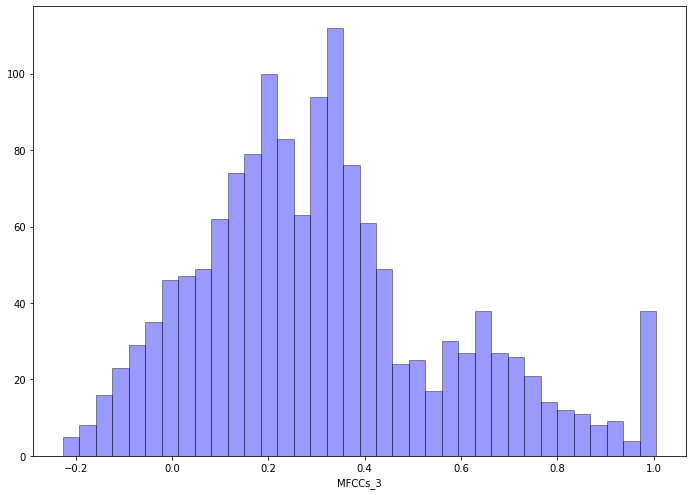

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


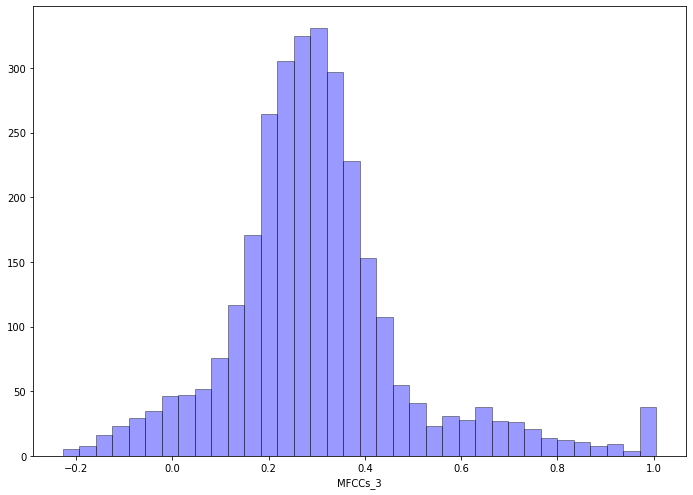

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.112)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-9.189972549498387, -1.2075721099487122, -3.302837588808167, -9.862865242446873, 9.880450713267848, 8.81880237644354, 4.902758949151133, -5.531935556930324, 5.867788047535385, 12.404000429642156, -2.806707731240732, -11.781956608507349, -10.57507887034116, -0.5509033733781763, 1.4210387752977018, 9.169917968490212, 10.145436556931775, -6.699479398487328, -11.745959794552244, 5.364034211836193, -7.087178311625395, -9.973028316057794, -5.327111526598554, -8.77777139928724, 9.539536525802044, -9.064773229571273, -3.867212961881547, -8.046099296575168, -4.510694765643028, -4.22869364915678, 10.004685910138983, 7.096362522880176, -3.6828910252779785, -7.354720665087431, 12.015101233444584, -11.712516172268598, 12.992605026377667, 3.592731830260448, -0.945758247699784, -9.79731545157779, 4.19806453210737, -5.054268342107213, -5.112044323451921, -0.2315232719471218, -4.007390232334313, 3.7378935234371578, 1.0672685082022988, -7.768178399676486, 2.085193174103103, 

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


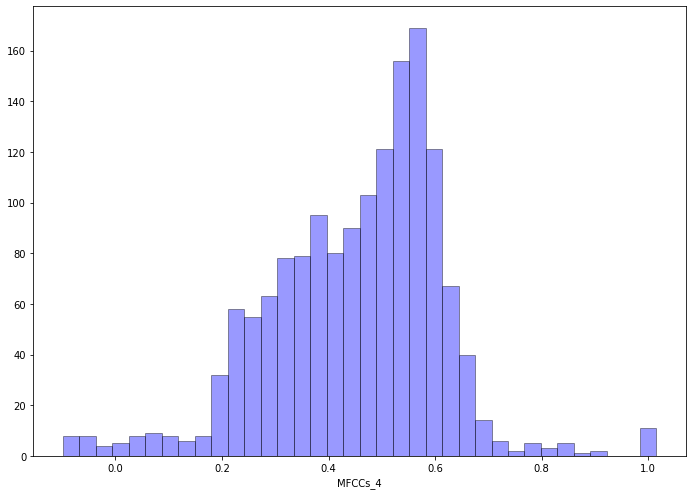

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


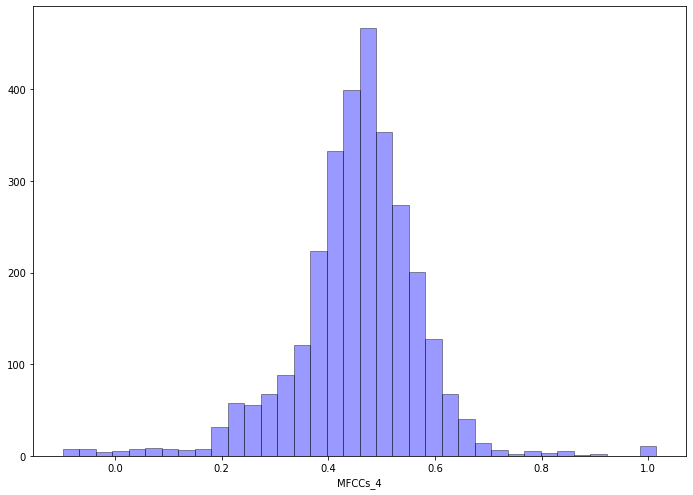

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [13.177041865578438, -11.26541133046151, 3.048163226628826, -8.463707508255775, 7.015386135150678, 2.905601076338597, -5.158934251468693, -7.959933204802019, 2.7009544116097843, 12.052011838690705, 2.24832913924718, -12.265050944285976, -1.023135665525155, -9.711234205387342, -11.01820451491668, 6.175111731539577, 9.191253907438512, 2.438616026569677, -0.6560810200598564, -8.331140267043759, -2.546489658558057, 12.071811339728214, -3.9567828046770823, 8.308311040403979, 4.049715638748356, -12.59785601431044, 4.657125874409029, 7.229841667312385, 9.480086023780409, 9.50975907513102, -7.54957768936446, -9.571805908848576, -4.825551994677864, -3.747194478471093, -13.047832424957546, 5.665757756556607, 8.008939716797242, 6.616342172863517, 6.635038659738326, -12.843139170318054, -5.672547128799886, -11.75019848581038, 10.011104247945802, 5.615008838626556, 2.4670709832115447, 2.0412702427629608, 6.724575680286719, -3.841230636636041, 7.265999793965564, 11.363436

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


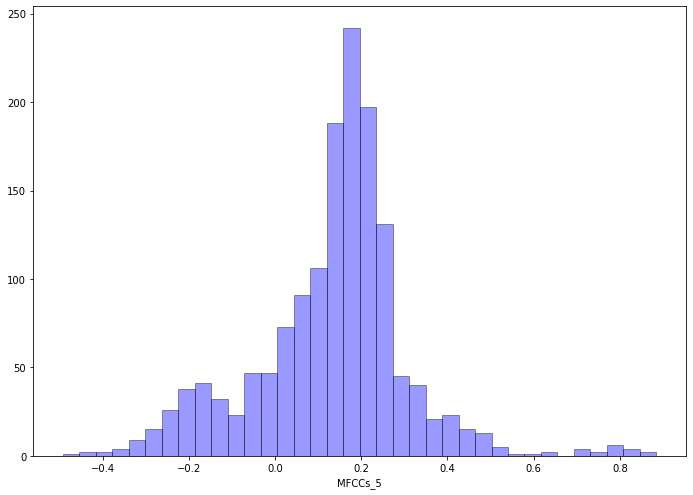

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


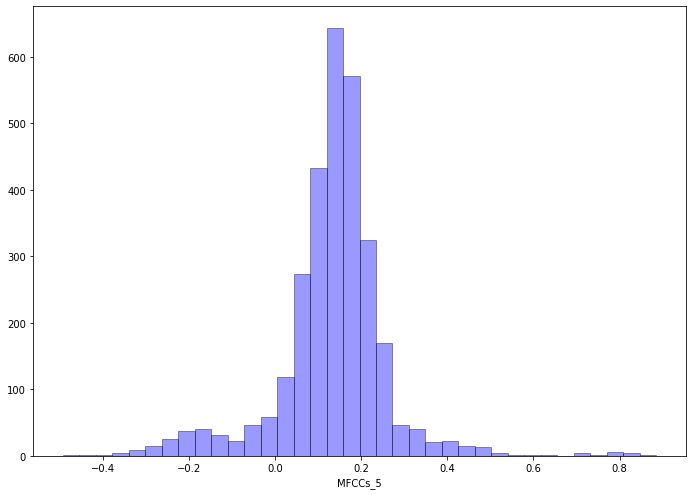

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.13)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [10.99669470236286, 4.668896872449197, -13.76379262878841, 12.687587196245907, -5.056309128640162, 3.8093516708290434, 3.197285527394595, -11.065878134279409, -3.5067393386939827, 10.354775781626223, 11.07251759534015, 5.12320846344632, -9.512214286478144, -8.355883788236032, 1.6581245130857292, 2.221110847526768, 2.680808800449651, -6.43715694903567, -3.5206525532351165, -3.713895080891941, 4.841935380662448, -5.621590339269355, -5.465934167259322, -12.551336180821838, -10.57055287510372, -10.552800932767465, -11.495253479108992, 1.3660492947234364, -13.997282032473011, -4.775982884401829, 9.755526986924462, -9.97414333325305, -12.708485632623306, 5.185472524548268, 8.83736929333343, 1.446727925969116, 7.525607028780409, -10.178032242745244, -7.388313703453596, 11.338731404162935, -5.969925556477849, 14.393479409550883, 9.885506953781976, 13.24531169988217, -4.615739682470197, -9.379435730476118, 3.202026830402017, 11.434618826583945, -7.284132205770674, -6

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


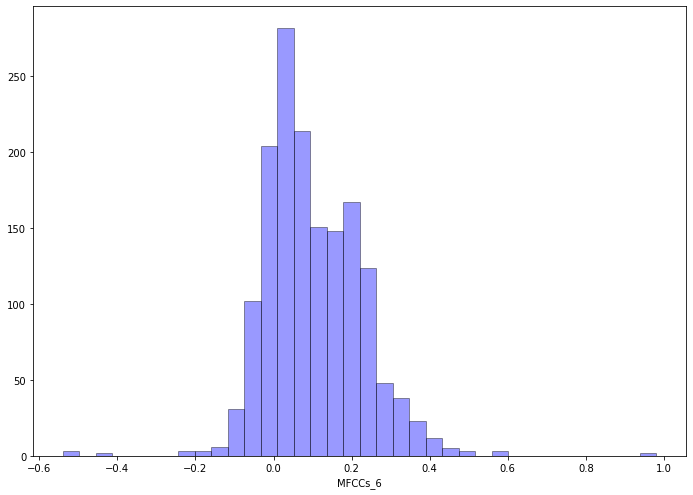

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


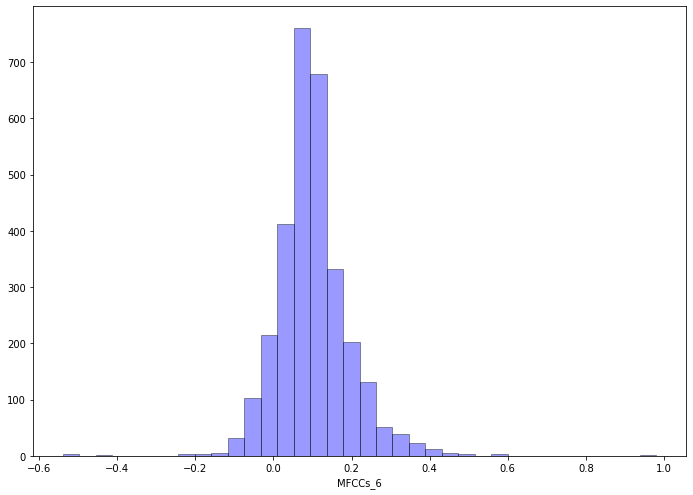

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.131)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-9.502951402708405, 12.468731986537604, -8.449684831545987, 10.629452375920527, -11.319938638029916, 6.948645287200722, -12.618311970190698, -12.621593122304866, 3.10995786538664, -7.275032482096932, 13.336734133334092, 4.348890554380057, 4.247098455607094, -8.61963371117512, 14.963085874946016, -13.141849881572382, -3.009612385015192, -12.168513639594655, 13.398109963712953, -10.283982835102416, 14.793578300115373, 12.229519881333816, 2.474698440739652, -8.037414957154768, -4.629325534286705, 8.980363555104073, 8.230876547931022, -12.340833882277622, 14.41019821578654, 2.525173550685963, 8.464220909740327, 12.054330070958814, -3.734840521181337, -8.629316364118115, -1.5950876392029727, -2.699983034375812, 2.749045678574736, -9.746256213234858, 7.374820521662763, -9.555756388652531, 9.722621298508496, 5.777475311682009, 12.49422098838556, 2.236510866954676, 12.65120265138257, -0.6834263242983347, -3.2011993471763667, -11.85831315691691, -7.535719621857718, 

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


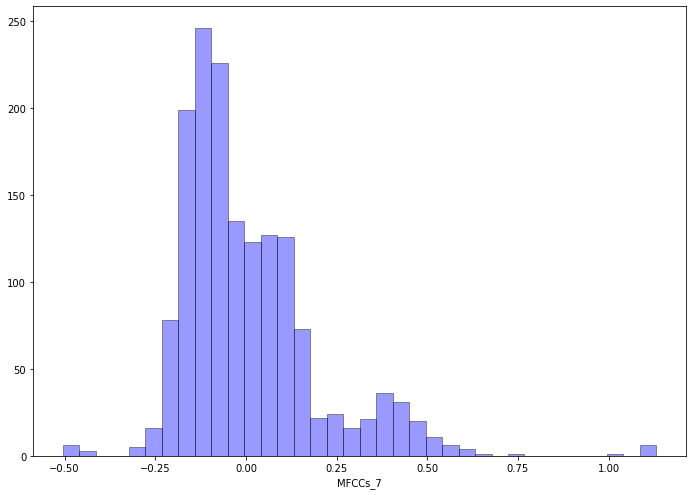

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


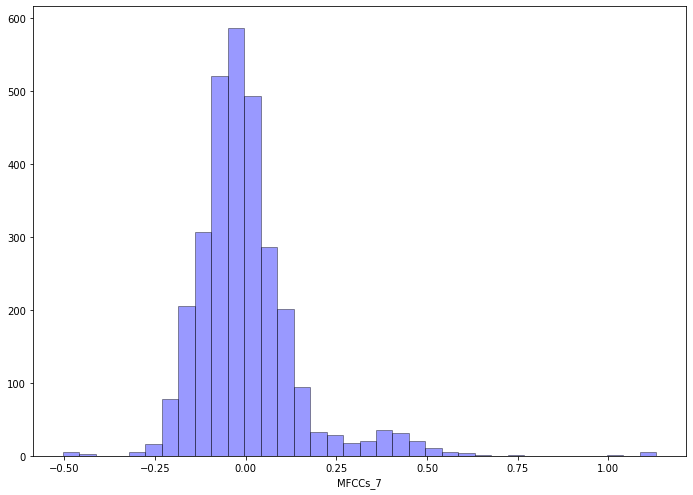

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [9.422303253136752, -9.953511581571725, 7.523535545145518, 6.1613891053530265, -3.338325110122531, -8.919625259927203, 1.299878103985081, -9.367004624401796, -5.613997878136148, 1.5024061655236385, 10.211976275785249, 7.729796586659249, -8.501316417496984, -4.553317184559084, -4.816405738829173, -8.802916394038542, -6.614505626748919, -1.5972197474589187, -9.610885144310473, -4.820513145741178, -8.084135917066497, 3.845343791882581, -4.403733972549176, 9.099191994700996, 10.365586984325358, 4.407857212191011, -9.153822023394014, 7.290772741166715, -5.527746027417792, -10.11269474076454, -10.28663225847289, -1.4310905198029626, 7.123820945292269, 4.468274144873091, -0.5793651798101092, 10.759134914690463, -3.9627894856980648, -7.120495151019131, 3.934639940590801, 2.1989864419595984, -10.266144825793887, 6.0293489557268, 3.4087138359772227, 6.930026662789208, -2.715175858790188, -5.542015261132549, -9.897841546298924, 8.124468535234806, -2.864113230214876, -4

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


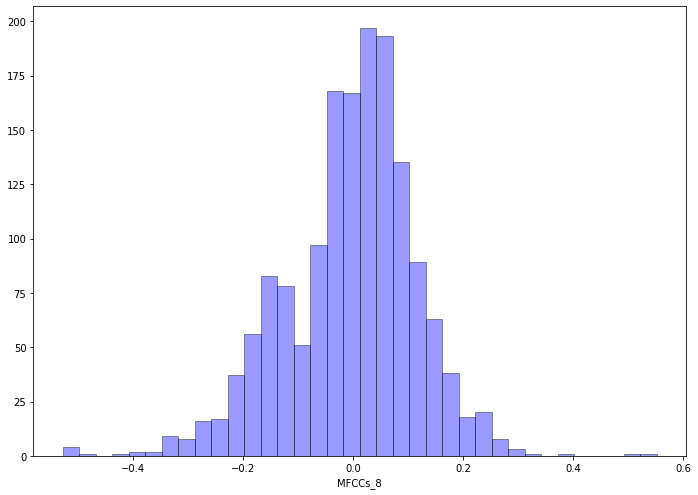

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


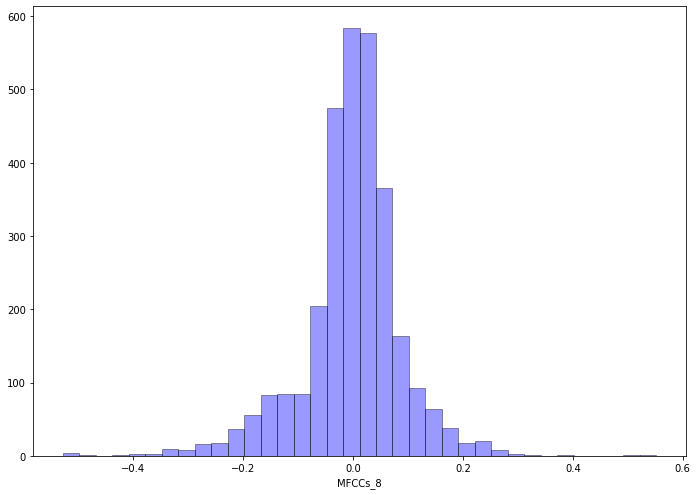

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [2.796698679030477, 4.956459138385832, 5.40579008238226, -9.687516611925847, 0.9473785969371968, -7.84151442194109, -8.07186979518427, 8.570106624142207, 11.4606723664244, -7.96863898287445, 5.435571706031954, 13.927566670947655, -4.598951114201343, 3.2639283637247045, 1.1874049634355002, 5.249101757967239, -8.09476900049894, 1.3969363857615638, 13.362391612686878, -3.550128386225813, -5.021680913231117, 1.6366631932235522, -5.358061294988913, -10.78351764548761, 12.160917009556314, 8.91943605263747, -8.400016337355495, 6.216518164599521, 1.1699753639155597, -6.393848343018164, 1.6188685847922295, -13.620319038990775, -3.5902962068861584, 9.079221591914989, 7.556665571036547, -2.8091134127485056, -2.0812118307984786, 8.941649975817025, 12.563357789508824, -6.423976640402336, 5.705117129175649, 3.480207700417348, -3.455050568874057, -13.691769391126527, 10.135727156179358, 7.932348108734295, 2.7202249954656588, 11.191553933764066, -9.999512646634017, 12.23210

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


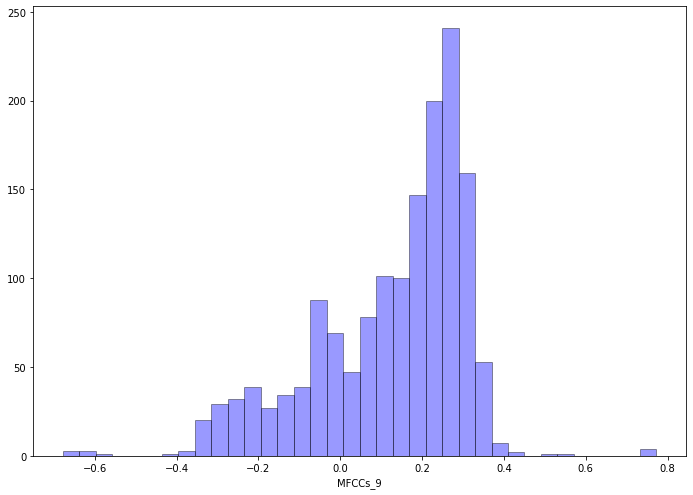

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


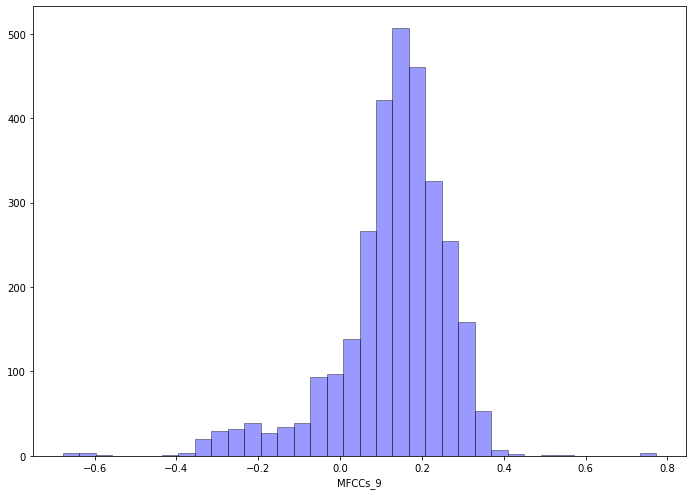

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.396657198492877, 1.6520387642520826, -11.43082759678915, -10.496140833301784, 11.827363294344512, -14.977660220477548, 4.38241974943342, -11.926155111062204, 2.0357381419523675, 4.4820950372494295, 12.64580270415976, -7.669061782492504, 0.9435835461168532, 8.438747224119727, 7.925013129656643, 14.17088246907417, 13.104226467656323, 3.804582687746702, -14.913128803168892, -12.692290642444846, -6.808946839304868, 1.3118991997512972, 8.470796018200636, -13.86119594492347, 9.531193188860565, 13.995212768426718, -13.105509227705452, -5.409785907512131, 11.83027469177254, 3.0064489729581005, -5.119455806844588, -1.2165023348801558, 1.0385635135605975, 10.24841416402606, -9.364000626298754, -2.759324661393592, 1.113764444376872, -5.248499921320681, -4.607669052681985, 5.433019543999504, 4.2038669051375726, -3.963443043091443, 11.988516275996147, -7.148909120443358, 0.94991502995702, 13.980425989410335, 7.786840583483578, 4.767991738491341, 10.813545895275457, -

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


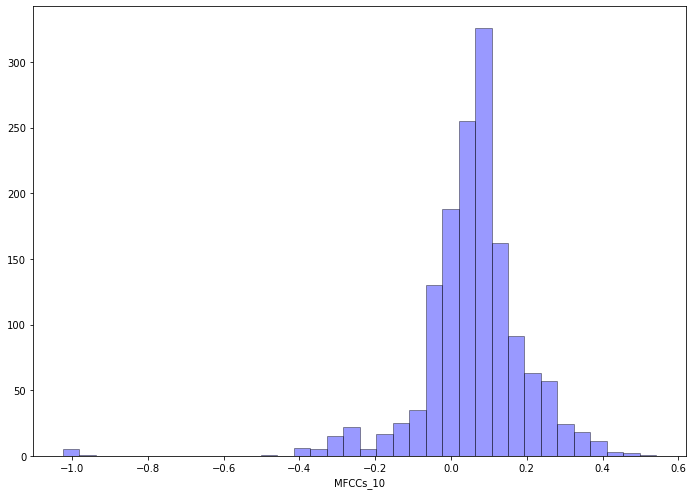

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


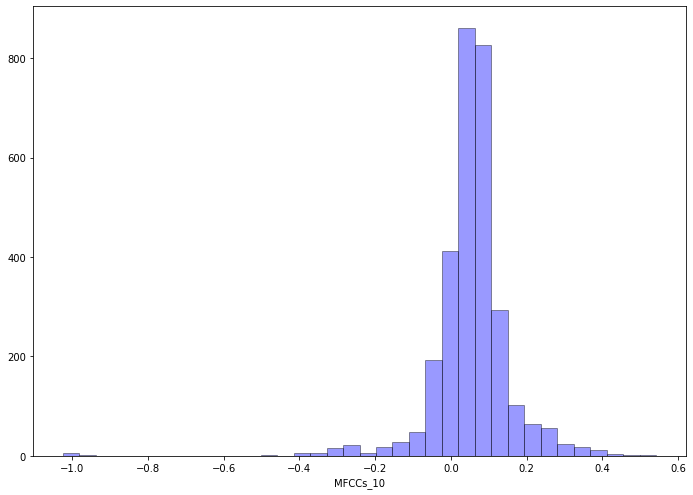

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [1.5609874242594963, 7.280669445092831, 10.181588813316631, 8.985943976963132, -12.947805751712773, -3.8579089339269057, 6.306462936229907, 0.6295030965142562, -4.785486241273118, -6.715037720591333, -6.320542842239734, -6.11869073499029, 7.053665738646066, 7.252968776081296, 10.596633698322323, 11.611348974563176, -9.13965099845771, 11.736107467847924, 1.045479153929442, 7.559213836238598, -13.953956313945792, 10.0059809273532, 1.1124652216185238, -4.585778808629563, 7.7659224526829105, 11.61397870686963, 4.009019134106911, -3.4927730843575304, -7.067468992432672, 10.6718996609329, 12.627982891302452, -10.384227482172694, -1.6829731807938035, 1.865031139532356, -14.294925876802656, 8.25996909497883, -9.45153256926553, -14.684354370891008, -5.459455397244886, -11.390693185933594, -5.088134665394145, 10.606138032787, 5.315011411231032, 1.1177433102807557, 11.805269474094768, 0.6106919262719196, 8.750154340458655, 1.4695173461594455, -8.85264802990859, 2.56260

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


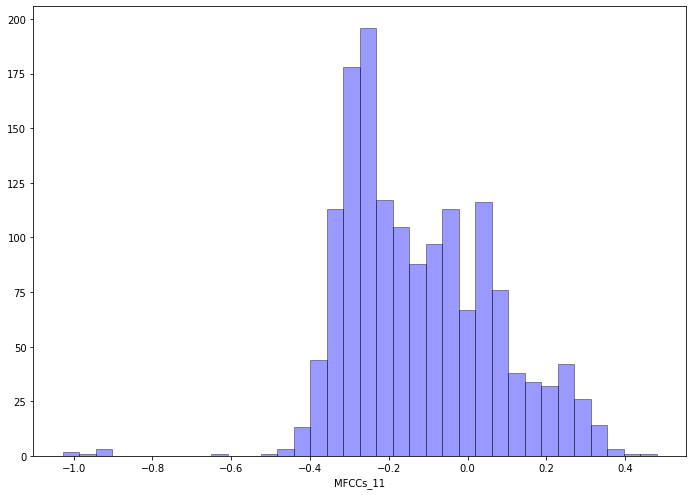

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


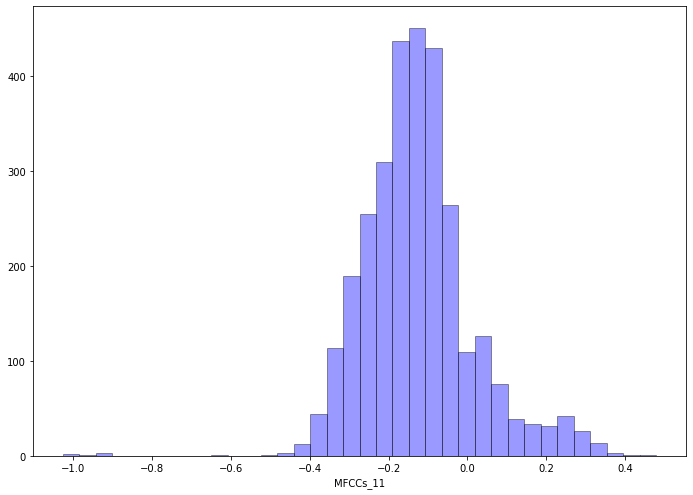

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.11)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [7.5173506483591215, 4.145770872212306, -11.579144339498937, 1.2951794920585384, -9.201052959222189, -10.640098322340938, -8.3620309302996, 7.819424633953023, 4.175733727396888, -7.210022667868065, 8.966821218485398, 2.72421031173001, -9.729893586538529, -13.780946181844277, -0.80741855810391, -3.655606999708663, 3.68147452119448, -9.941190714943604, -1.617226995884984, 2.364498885163955, -8.160327823474354, -10.278878581269376, 13.161571042925631, 3.53485023630751, -11.134153333563829, 9.695321394056885, -13.223903827673206, 7.446227278360436, -1.301618041266677, 12.232510418317514, -5.8071641346817575, -9.077494168417989, 9.192961065109234, -13.422506001886791, 9.20995403417629, 5.350509583222511, 9.685400008490737, 1.9176554464920756, 3.508788705001777, 10.209266254877267, -11.577176822025876, -11.087881612056918, 7.075298912424444, 7.251065090257216, -6.843627859089087, -10.421216261050294, -9.582712091240955, 10.66439733071055, -13.552072798194532, 9.22

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


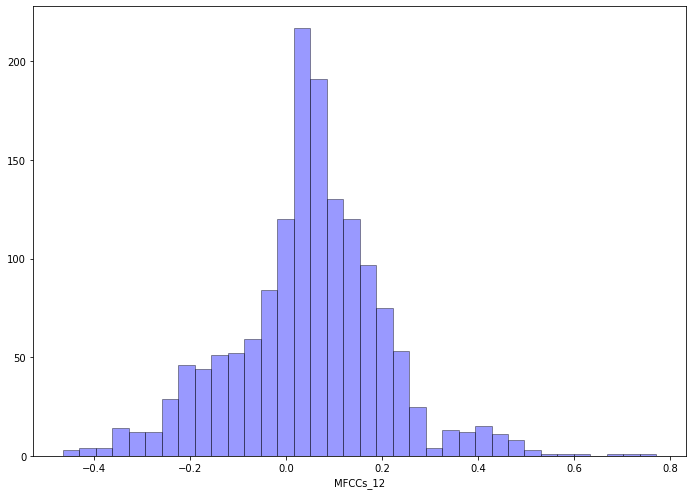

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


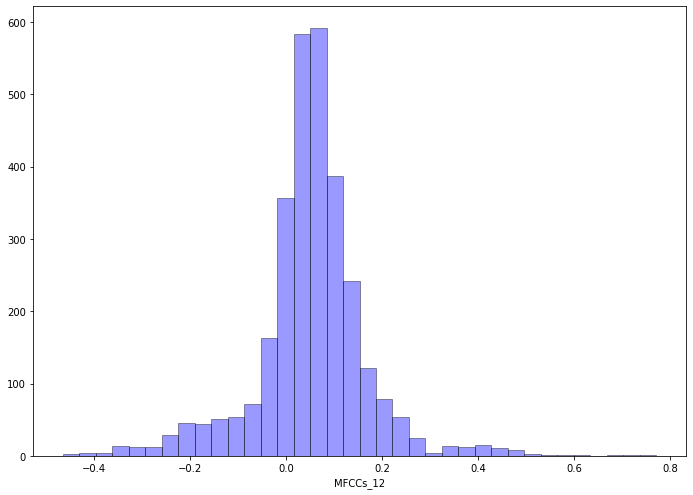

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [10.687563548903007, 5.79585043083008, -10.066018783892371, -10.052099800529746, -13.0753482369419, -9.47844109142959, -6.65075067836823, -2.7238903828079817, 9.71795191070279, 8.230380911211116, 12.887711728459498, -3.0218766755592963, 1.8598965971906152, 4.507033044629722, -5.42092863362387, 7.449108934661122, -8.65674619135261, 8.37175550714058, 1.4988803643963091, 12.333582018314262, -1.7059631690969557, 5.151089243303668, 12.49562547023346, -9.649444004498925, -2.1138387664417824, 3.862437358035287, -4.109810712875889, -5.635938870301922, 6.098265834115889, 5.155810619004653, 8.935966074863728, -9.5877177718183, -8.310226316493509, -3.302504998395742, -8.449823328305426, 9.00932032968564, -5.75540557693533, -0.7739833678731873, 0.9038790864818552, 1.6052817369493255, -12.473245668981557, -13.632657719881442, -4.97340096151189, -4.4653643821332345, 9.954788240313924, 7.520821796859063, 10.22725939323939, -0.7894049701043304, 5.51811265092621, 12.98025063

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


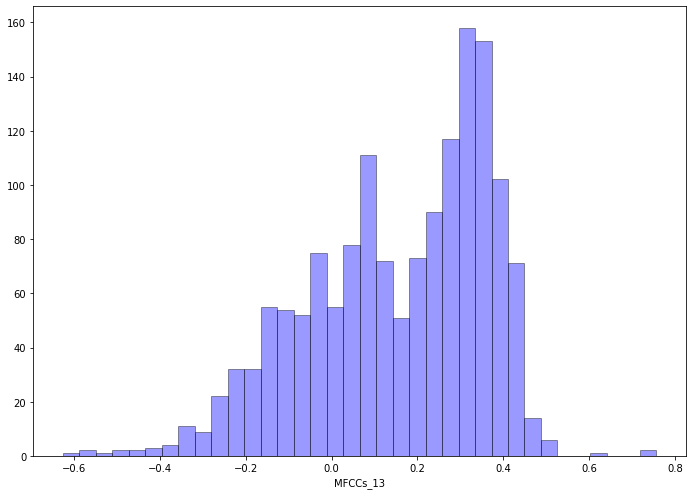

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


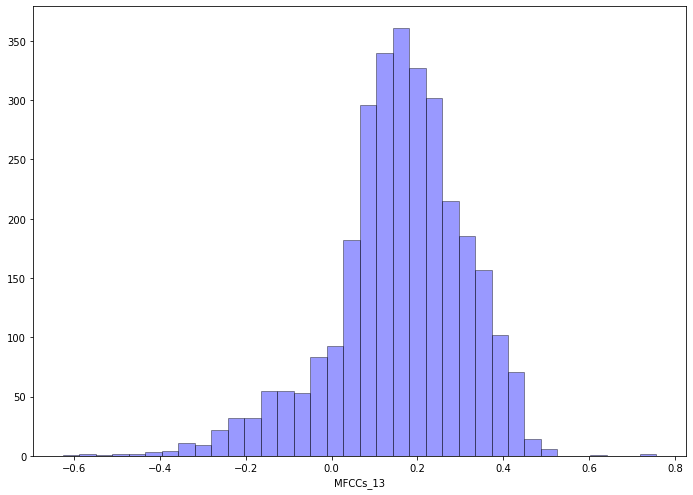

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.12)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-1.4298114647791298, -9.372362939238505, -4.670632001050356, -11.745715801507318, 9.657497289999249, 5.493022195068658, -6.153910395720841, 4.423904904645667, 5.312752200652206, -8.240092374318856, 9.459368621955129, 3.1076910451569133, -6.179099939010583, 6.893390922725817, 7.566918290739824, 8.245056114253332, 1.533257773037986, -6.394135134501369, 4.16438092179856, -4.455029669615547, 8.560845369455413, -6.720043542974618, -2.9149872714809426, -3.961943695810057, -11.393710738959584, -6.093702458882069, -1.9524714289787413, -10.011853381320494, 3.003130245671406, 5.6634557048096745, 0.8425117473010633, -7.361378476391421, -9.56783236941925, -0.7786610181504745, 10.260482367018, 4.760753610338386, -8.61564804048199, -6.433218569553339, -5.861607248542277, -9.12250641521012, -9.902802468772752, 0.9267864146774948, 12.014598389887992, -6.766099774732718, 11.52162418595586, 11.03330012088208, -3.3429246660794742, -5.66368801169278, -2.302009458000267, 11.713

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


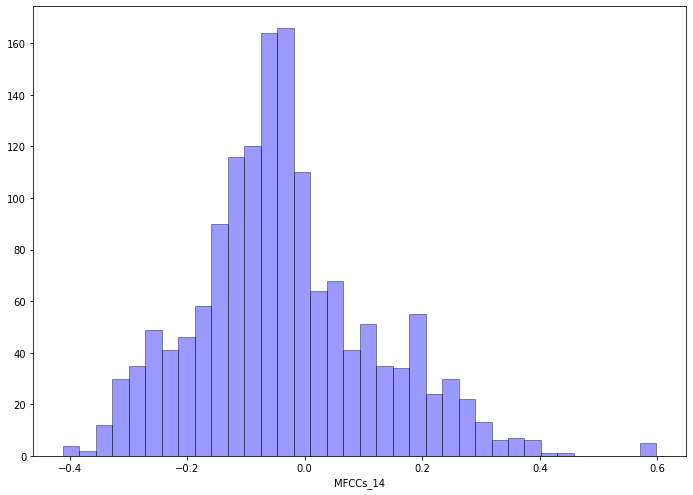

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


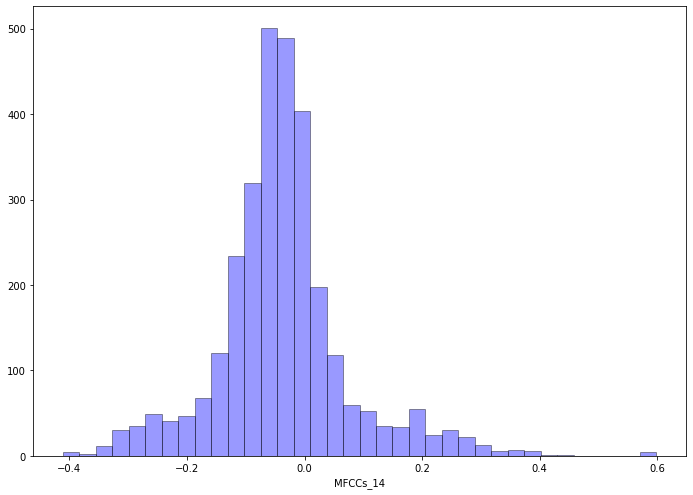

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [1.3206963771745177, -4.036247537768714, 8.685052371113533, 7.889875400217587, -10.965421297597713, -8.069417280095951, 4.613272378228586, 6.4386185328211525, 1.2400817736105578, 9.707587955061646, -7.893360024967871, -0.9658196544626368, -10.081959032153534, -4.451804392359213, 9.999286222135638, 9.566027421181076, -6.968092597551843, -6.539893200055648, 12.265816841904437, 7.59857925033697, 12.085096606939564, 8.670167386696708, -10.9703131212212, -2.164971640884937, 3.857225907394124, 5.860244881663416, 9.893233137908409, 5.404908352460397, 4.595148279922766, -7.731925789463718, -0.6461330552939764, 9.413365308695, -6.29191847546046, -11.318673188064109, -1.904057829187073, 9.304845477679216, -4.508735957650579, -2.24359982282218, -4.755817781666534, -8.928204590770726, 4.0257356668159465, 2.8356937273295197, 1.2351984964014513, 1.8647327743123976, 9.762218756181948, 3.3588951322589367, -11.710679277283289, 5.350407587936963, 5.018631506431499, 2.14958256

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


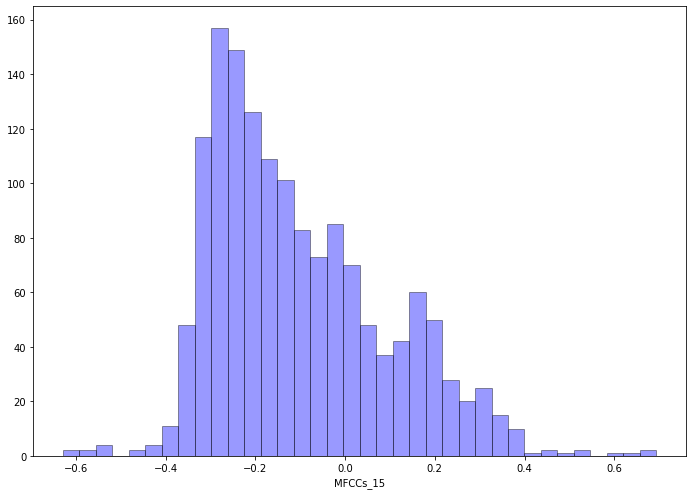

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


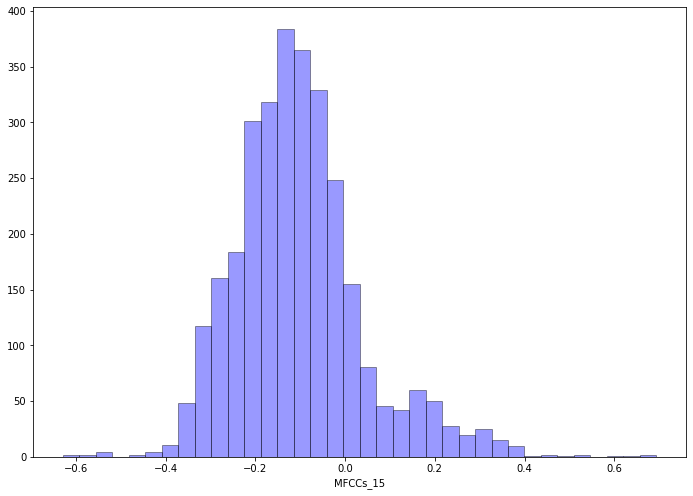

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-10.4242483852458, 5.417744272742926, 3.515081485592537, 7.700980381413951, 0.9708583626067602, 6.497002168096743, 10.35606510268562, 0.7251488702743778, -6.020294554349675, 8.999485331021823, -6.95549181400032, 10.34200225547567, 7.387936977176048, 7.172889562586122, -5.0709787765937975, 1.6922829533271169, 2.859712500006216, -8.704649248384118, -9.210353651689614, 1.726190610774852, -9.38741574704953, 6.178740347405916, 8.434157867168135, -9.03907780983764, 3.4189829209997464, -0.7628440345490244, 5.711118082300576, -8.79853562536825, -6.236270636878593, -5.258827626972754, 6.867221236169169, -7.30004446821712, -7.0858207626057, 6.355354571208037, -5.634430520193749, 5.749983290733274, 7.964234357582781, -10.147446760143175, 1.1194493235083682, 7.378194066669125, 6.235044891162307, -4.9707957688693325, 1.590240788397541, 4.226049005913989, 8.706110855025358, -7.972384535535818, -6.28147878482537, -4.803676474375278, -10.488168693423727, -6.335247317682784

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


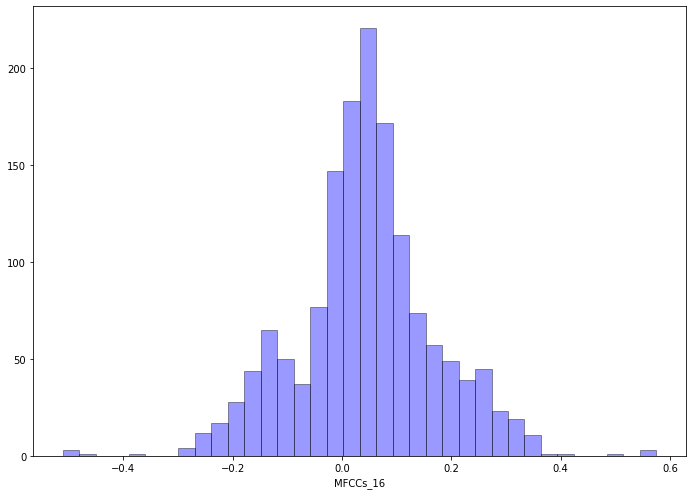

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


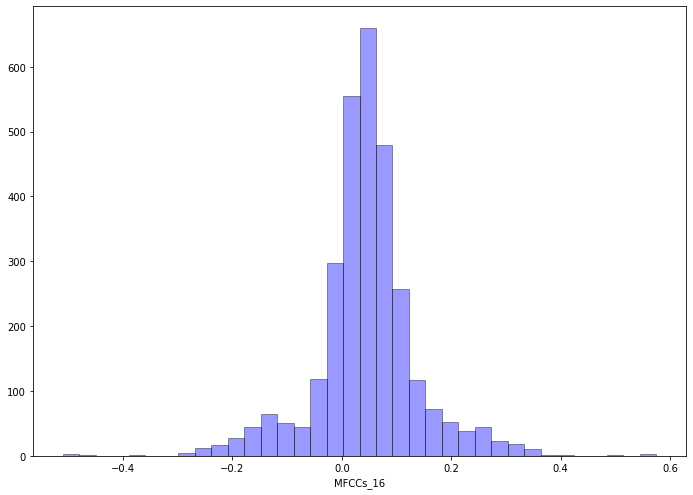

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [11.23724143552203, -8.913846455030486, 0.8870001031604914, -4.258098791787329, 4.880893670505586, -8.39130312107774, 5.273537801011374, -7.771405544045264, -6.3900612681544295, -5.905869307302111, -6.570590966912996, -8.44200561977501, -7.4379342856848, -3.6730699432641583, 10.530237231891157, -6.502941170205786, 4.202680671823732, -1.6721794415292417, 5.60930872251611, 0.8946951289941107, -2.6022682387608373, -2.2403208036001043, -7.666748035091453, 4.8129501286824015, -3.417214495547345, -1.9414433375158997, -3.1032272872031434, -10.021117027964255, 10.718777183569166, -3.026835142590232, 8.915782824656912, -10.90772627943527, 2.1251771013098395, 3.516825098346297, -10.31954420661114, -10.673067387858133, 1.604746991168594, -8.51241588388396, -5.375633413964824, 2.3753195343210622, -2.497385716777515, -3.3047217674641285, -11.265323023065736, -7.783730326566276, -7.930356491358738, 11.072217795062167, -4.598163693166896, 8.482053445168566, -3.114232523011

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


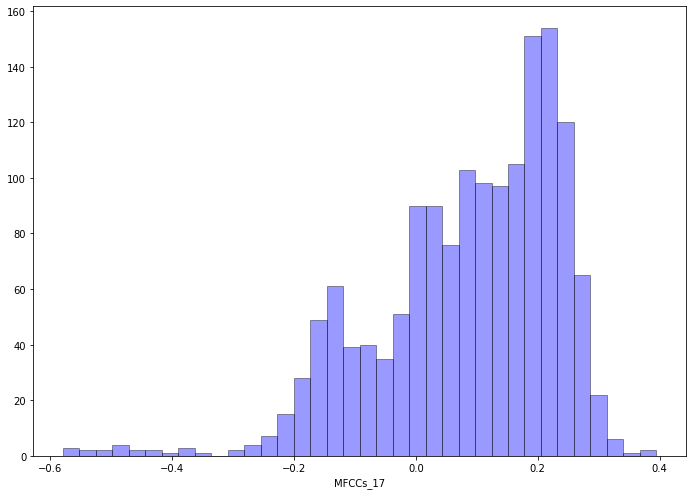

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


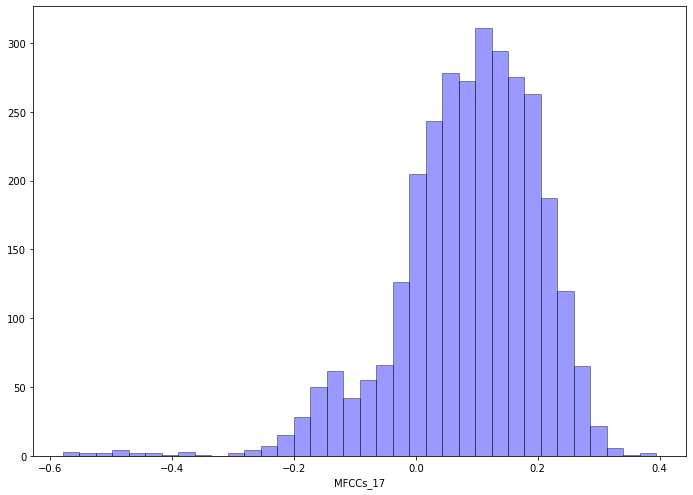

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [9.697863623641467, 2.8246784530681825, -10.566733315807223, 1.1843110761866904, -3.950436474016395, 2.114190683835224, -5.722826784440032, -8.967865235639891, 9.5011093893144, -6.628806551555353, 3.5907612214948337, -2.8576247075106007, -0.6482870568097674, -4.587373251192788, -1.0385220965236055, -6.299893901298374, 7.112714183986192, 9.381926205811476, 9.015854767314265, -3.736557364008136, -1.7564698249996376, -9.553151003753923, -2.4473921478656315, -1.7953962488688653, -5.485461978595421, -7.695984047588942, 4.032995377830025, 11.58390669333922, -4.379438163556106, 10.58655070571367, -5.795091895947001, -10.375878153059078, -3.809178617846113, 3.47727714732401, -4.607247929519039, -9.554569665503593, -10.9302555891986, 10.758729213214512, 2.418862914992528, -10.57920707348131, 6.7197895074265945, 3.490172014456337, -5.343380458540193, -2.590516655080812, -10.749007441768942, 2.978907269808219, 9.322716008599226, -7.477450001654489, 3.263571784606012, -

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


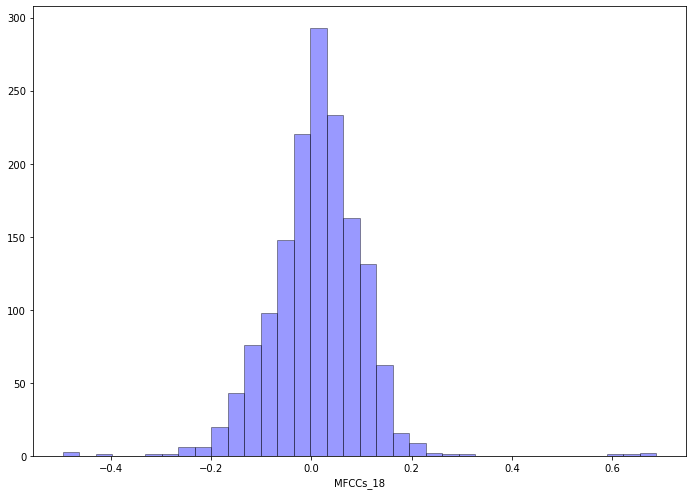

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


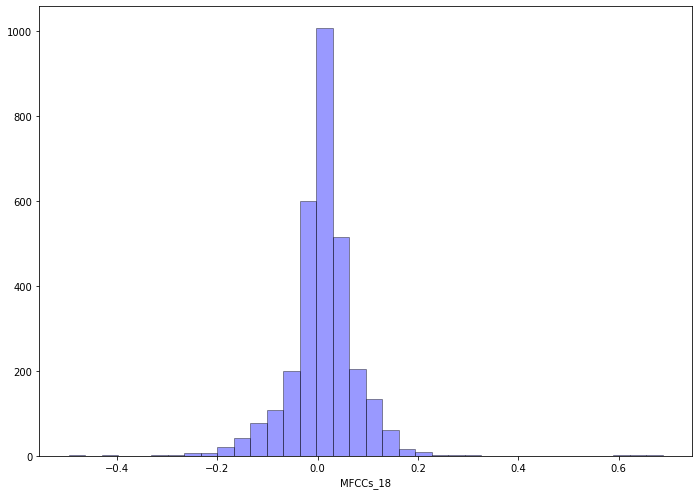

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [0.8976041540771661, 11.033623886207572, 12.960430052285709, 12.514893877592892, 8.54626490041247, 0.7146641838728607, -7.47413062357268, -11.975025547659923, -7.459837165271273, 11.82090723972313, -6.0672461014181645, 2.990506207272277, -11.775184870029609, 1.815036337134994, -1.5242859047961268, -5.760586134797085, 9.22246479960781, -5.319239315486378, -12.195420784772375, -4.498204121713709, -8.717281059695697, -5.812671569610489, 12.301914387226804, -4.581149426643167, 3.6507027239634393, -9.216825175186557, -7.812386825749517, -10.620689976536196, -8.03916781144173, 2.685002508041433, 4.105687497540257, 11.48890411723006, 7.26926217245321, 10.013343714114562, 6.270356242990069, -6.705321393001223, -1.1161413882305276, 4.440562626495382, 12.946737835736023, 4.534484737799049, 0.9301717349197366, 11.762018178951186, -9.15636806880898, 8.336132849355085, -2.05497753422894, 8.28838933933473, 3.904947451594918, 11.737558441272084, -9.335285443661933, -12.257

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


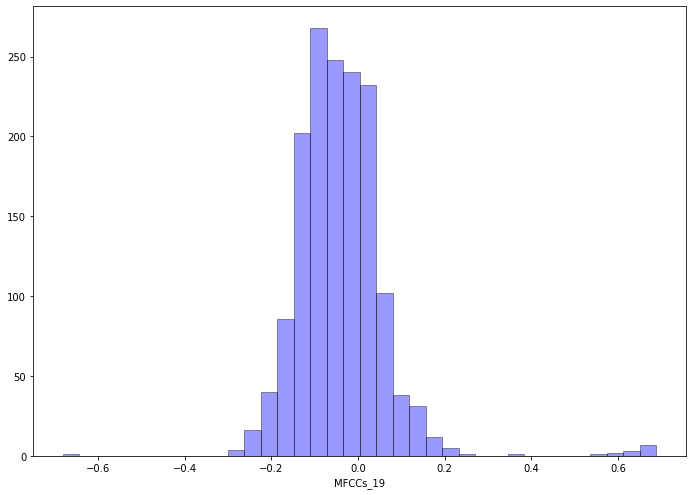

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


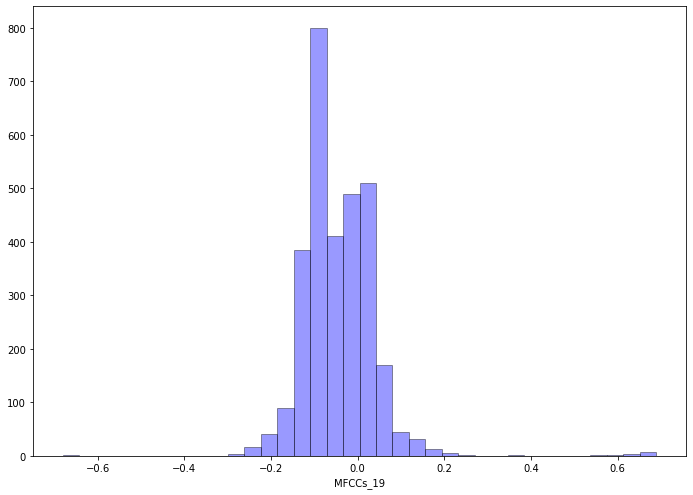

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.11)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.343060151948098, 6.353949175030012, -2.8994443865366817, 4.857583254535956, 6.980287832989605, 2.784632416596345, -2.7860563370822886, 5.403300274334075, 7.540112139786802, -5.909093390567109, -3.366288689759936, -5.502709644513109, -4.304031117070958, 5.5872715938143305, -2.689678448447672, 5.394881279943656, 5.871353171640084, 2.3201818495427142, 4.461008910860119, -2.647574486209767, 6.884896604155929, -1.9111506625340544, -2.7335538656965888, 3.4057445531214867, 3.925541900214789, -5.8465960416863165, 0.6610047839326656, -0.7708221606500221, -3.0552592054979435, -4.295250306625288, 7.144205645133931, -4.764070739004536, -1.4249158394663368, -1.1116885325976895, 5.080870042959115, 0.6356278801878716, 2.5636550855507547, -5.064381206779084, -3.355188025217103, 5.515230997999328, -4.822994496068527, 2.161750245749797, -0.660769698287667, 4.682987471442553, -3.682703485992095, 3.594019102341414, 2.482888011453997, -4.960395249811529, 4.842509747914122, -7

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


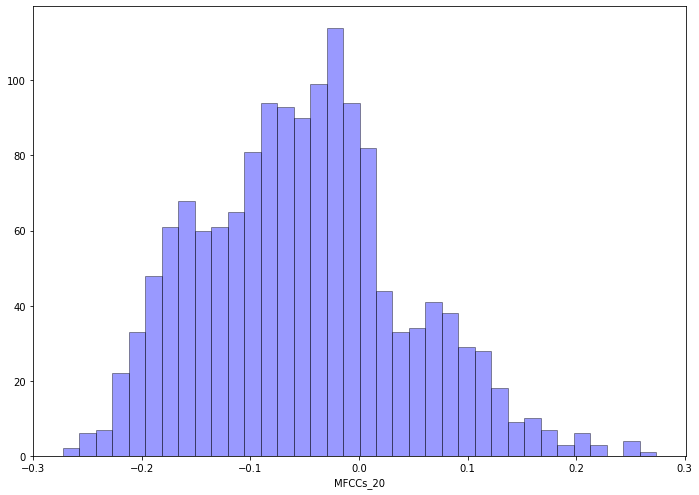

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


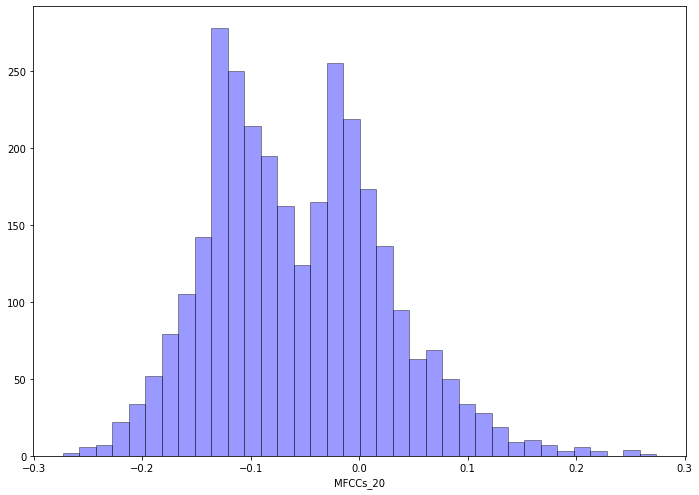

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.783581028615143, 2.691282172095386, 5.983695633307235, -3.470845981597583, -6.141149019648668, 0.8327238637603271, 5.201656098270922, -2.655741054841045, 2.5346942536256094, -4.703784259043047, -2.217430185029041, -4.017845131869629, -3.830629561098546, -4.091841281742351, 3.184447162592509, -5.105955908513062, 0.8966516178033983, -3.098202366628257, 4.410080660586605, 3.6162430037900894, -5.742428407623176, -2.9625529489467115, -3.0868499437914907, 5.014036137035278, 5.8168940360044274, 1.5218467386593617, 5.814535138645304, 2.6285912420252835, -6.290122435472987, 1.8193115120990648, 4.308171825585927, -2.607081362521334, 5.972177432745813, -4.316883039713692, 1.594488075212393, -3.482117535453316, 1.087928802834055, -3.0159630783032005, 6.307228366819693, 1.4776885884168776, -0.4857705569439856, 6.030235464152131, 5.02142779046161, -4.736501234716174, -3.0471636341575192, 3.015435968562467, -5.3066900020045225, -1.1609620463525836, -5.224482867907488, 5

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


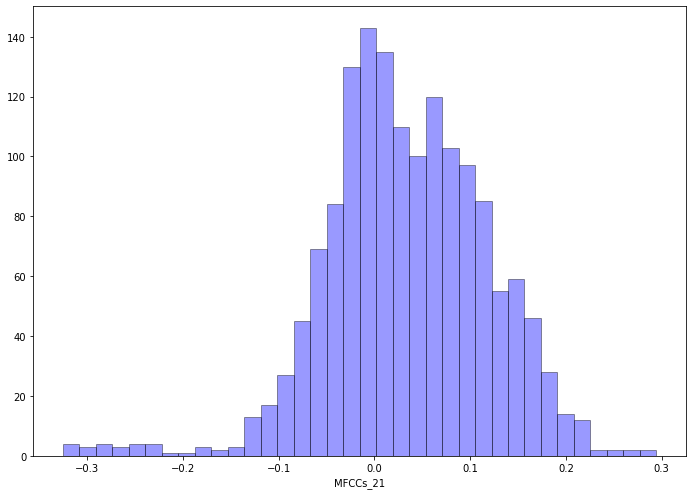

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


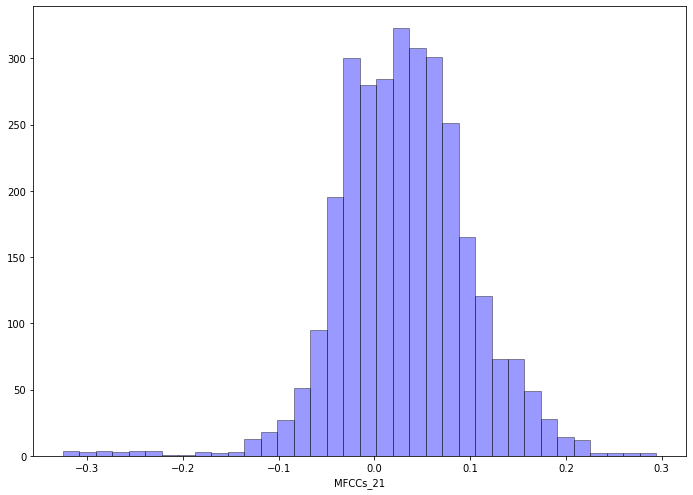

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-7.890771888303817, -3.498668195328465, -3.4613801740210945, -3.779339178615356, 7.298519245150347, -5.262689689804068, -1.1708938876156525, 3.9342336451945674, 5.202066640793283, -8.12218264307974, 3.5188642257090987, 8.228156978833441, -5.020634788853037, 4.007606774875149, -0.4270097637516858, 3.3992748475250063, -7.698844448332519, -3.234608266009598, 7.060172244472913, 0.5508989084143906, -5.893062377923741, 6.33290442647209, -3.965886850037718, -3.8321399437665633, -2.312429114425604, -2.2456751813302445, 5.922983649147591, -7.496619405528851, 7.161550518505962, 1.0319792153241565, 2.0761667570025804, 2.1968388176303817, 8.398840669291683, -4.701290272086955, -2.4352388429485625, -1.282862301368629, 4.5482488925940245, 1.8653924388483931, -7.785021689553122, 6.346330377629721, -6.115334861654052, 4.895271236323513, 5.074815655086572, 3.8376050108146553, 1.3144967402433778, -4.298143570903707, 3.852674815743165, 7.473685214273231, 6.254789541573847, -2

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


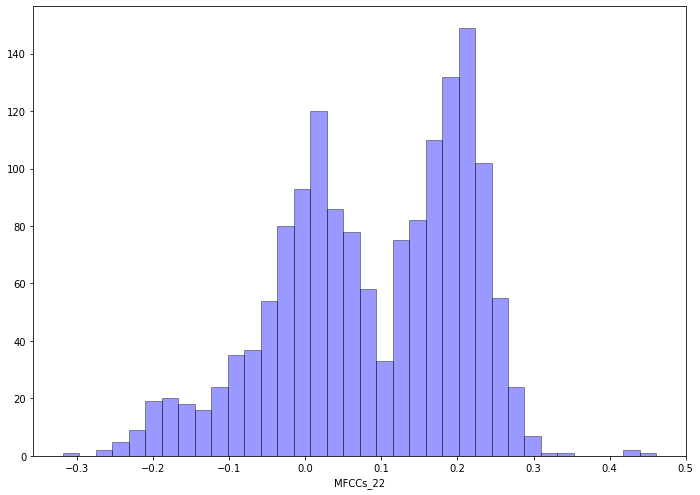

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


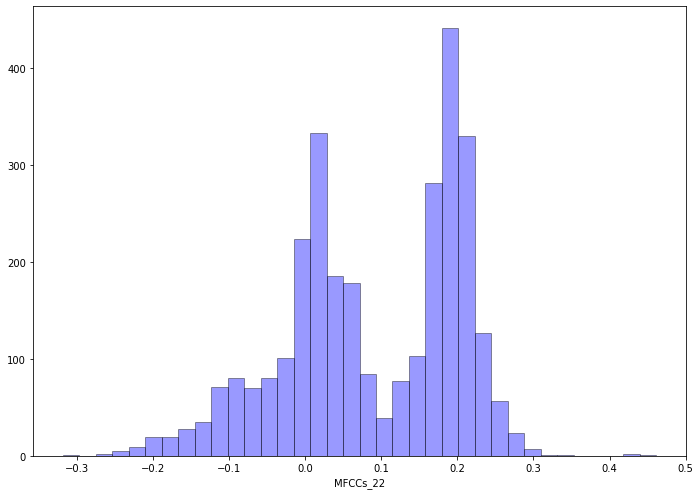

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})



### KNN



In [ ]:
# Dataset to clear

currentDirtyFrogsKNN = dirty_frogs[0].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

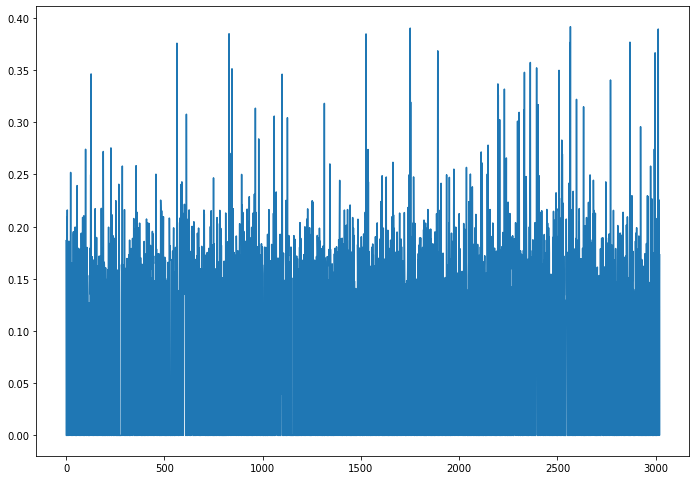

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

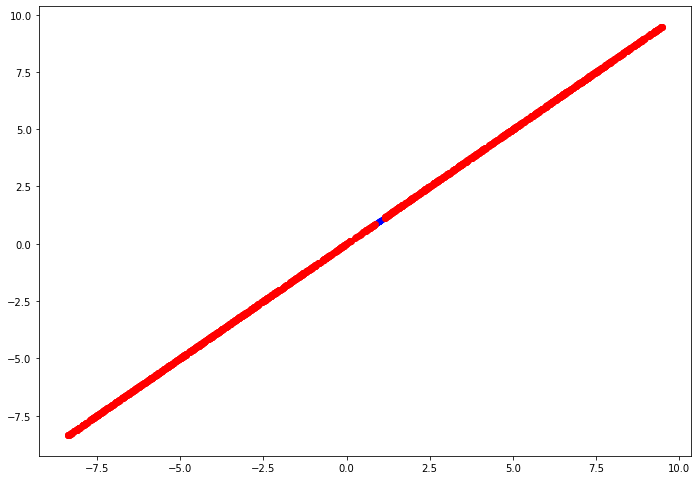

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.11)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsKNN.loc[i,currentAttr] = currentDirtyFrogsKNN[currentAttr].mode()[0]

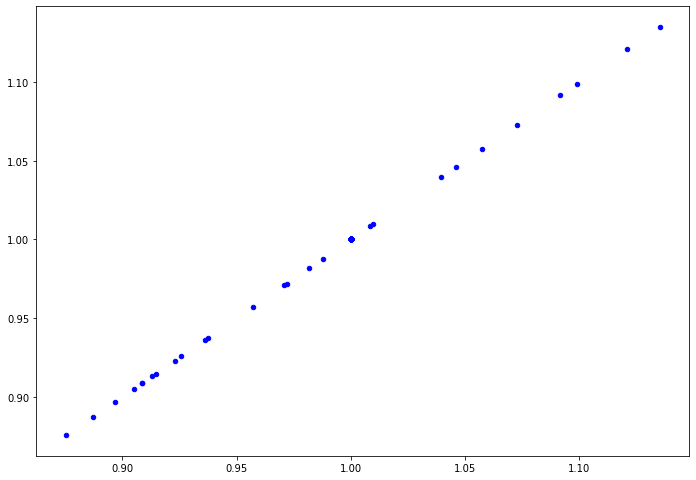

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2' 

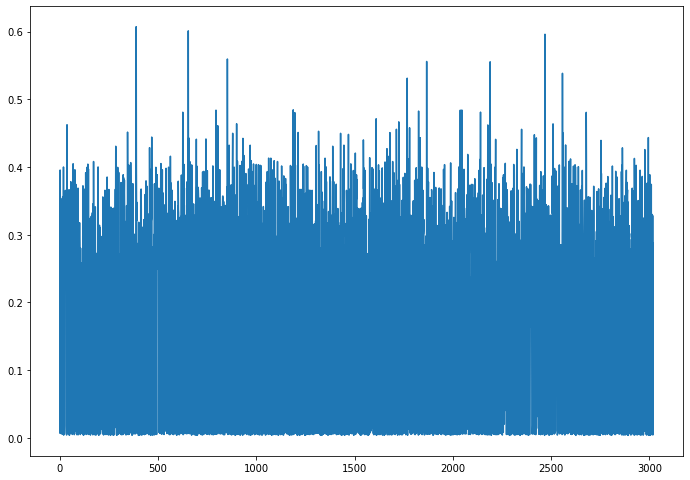

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

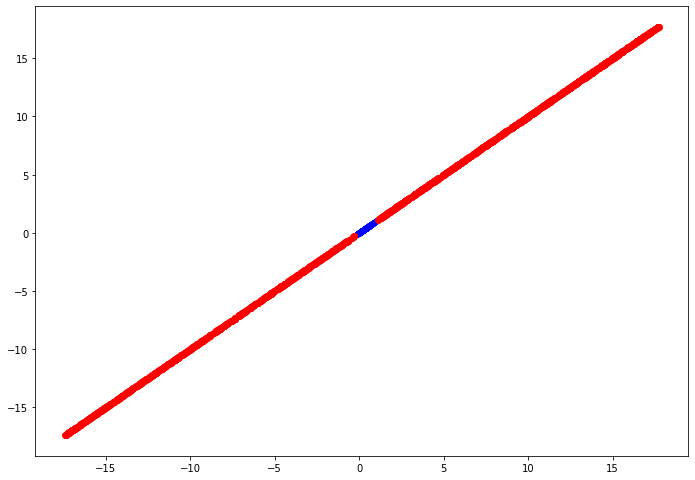

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


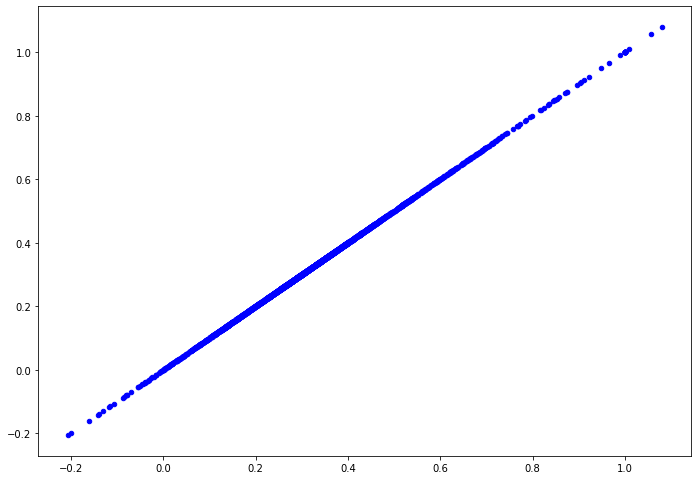

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

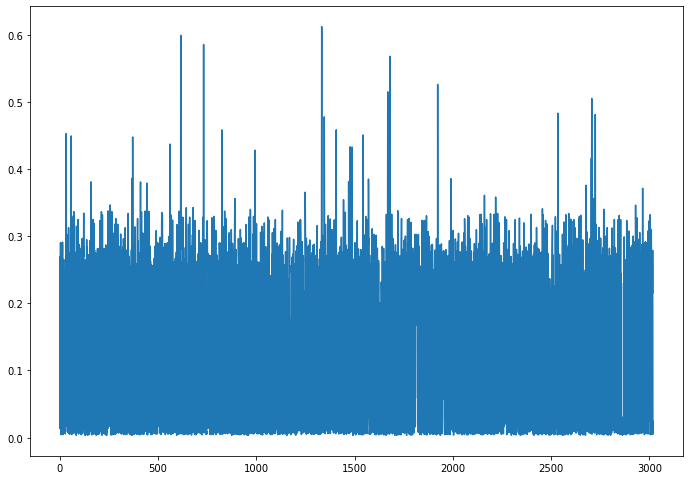

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

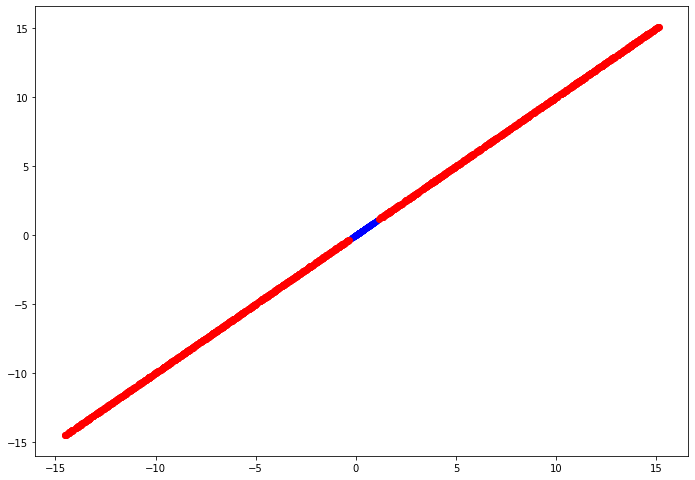

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


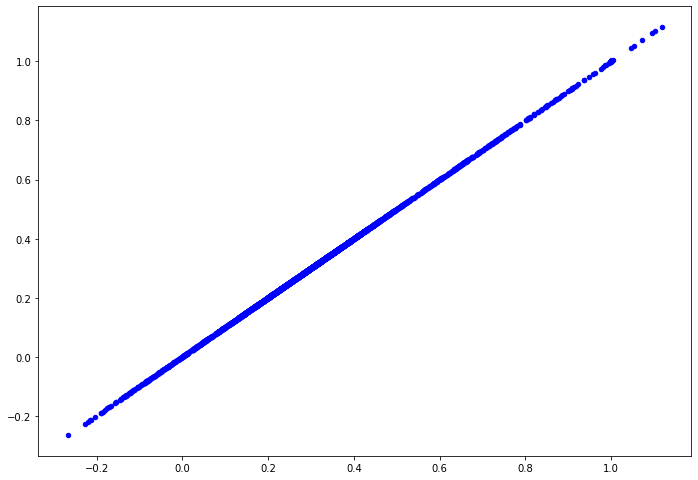

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

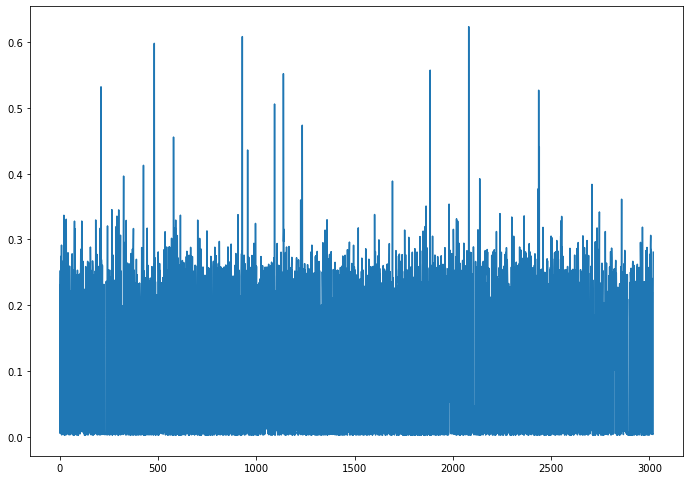

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

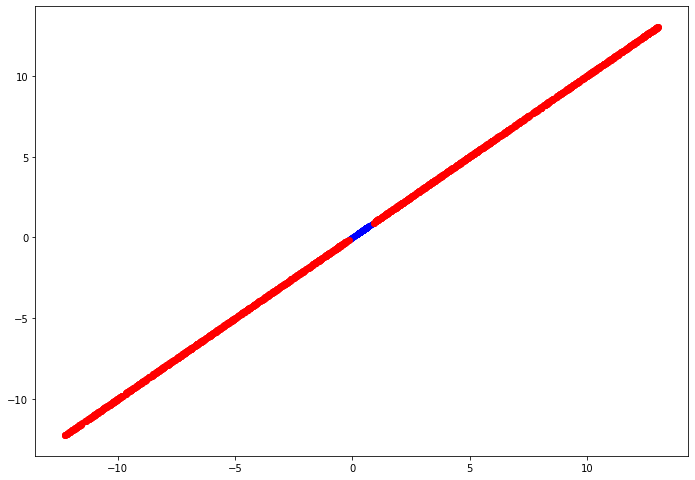

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


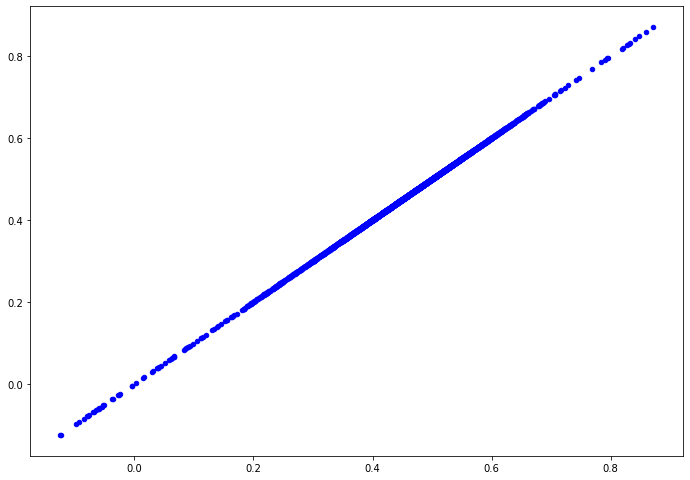

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

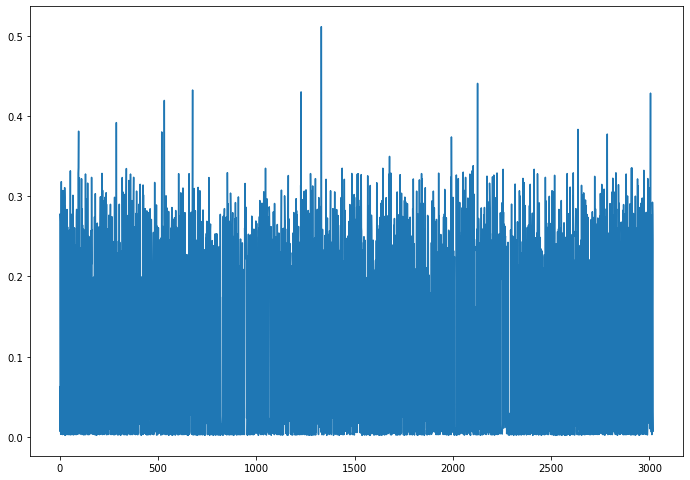

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

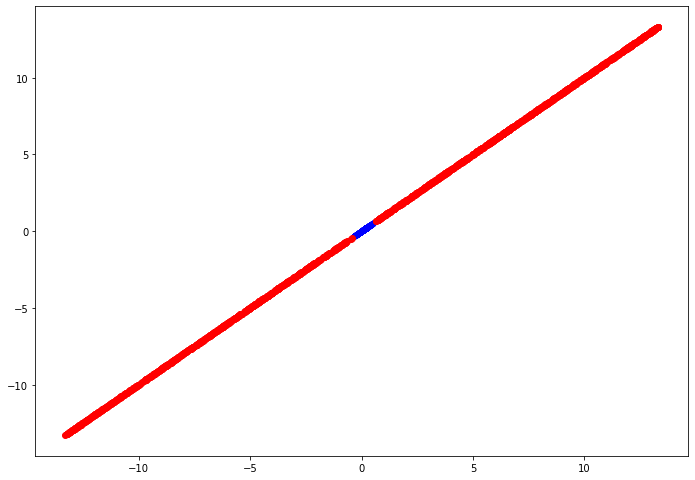

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


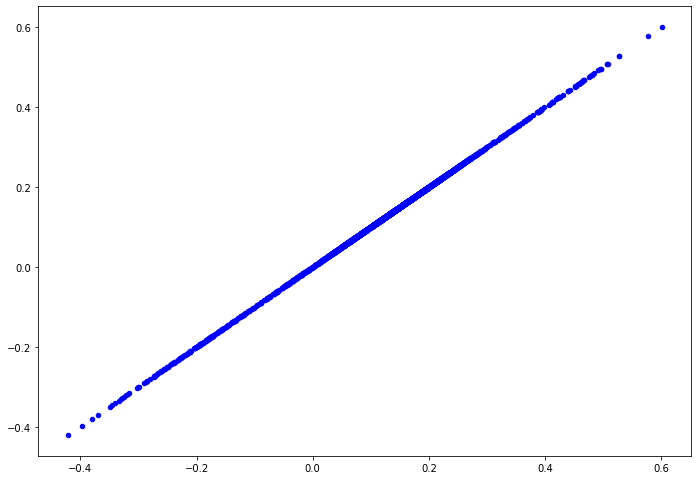

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

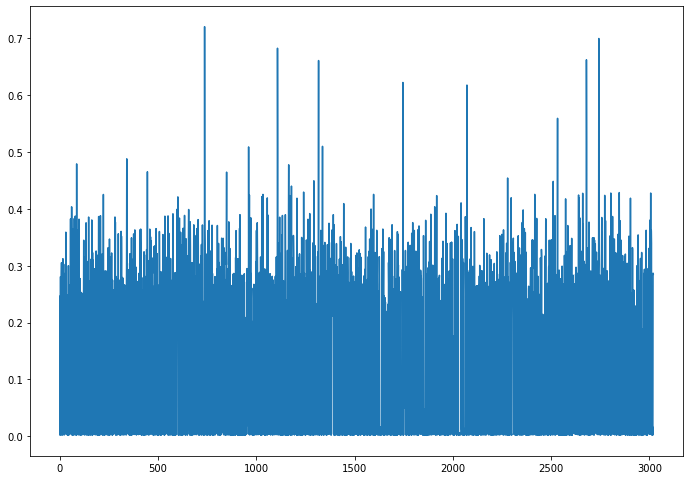

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

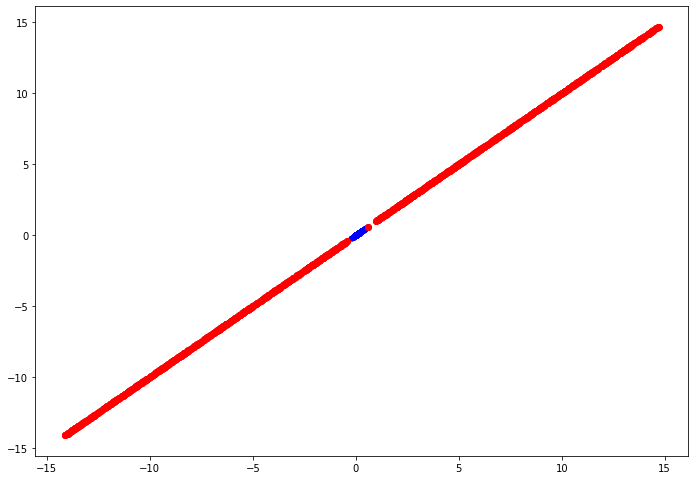

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


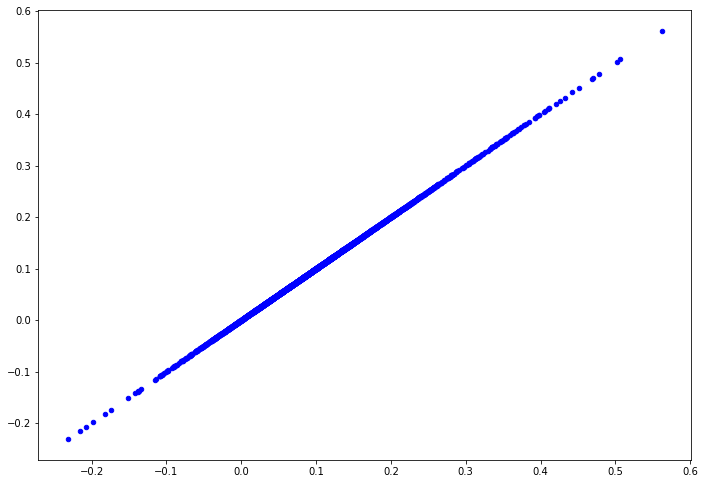

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

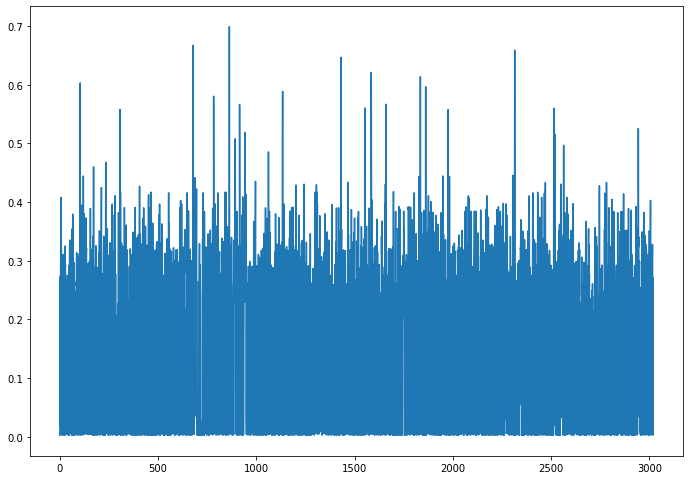

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

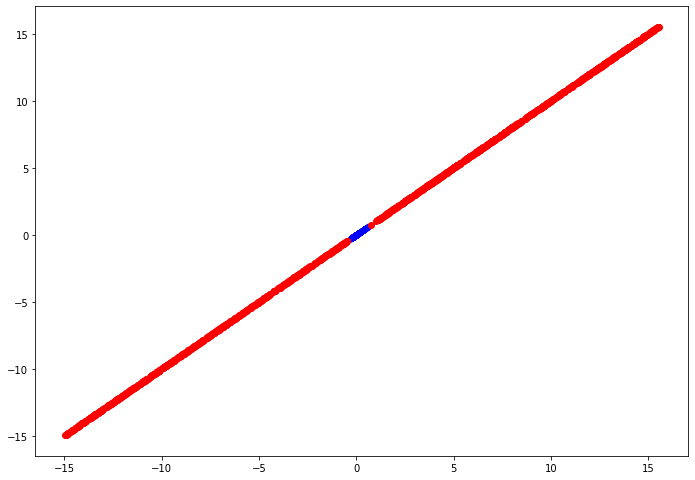

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


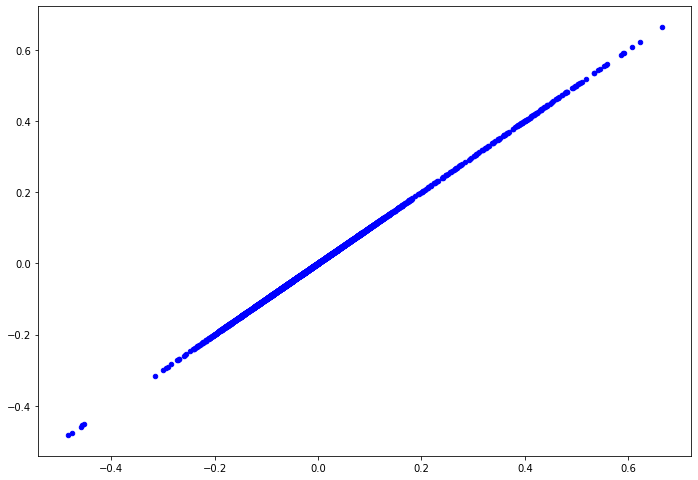

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

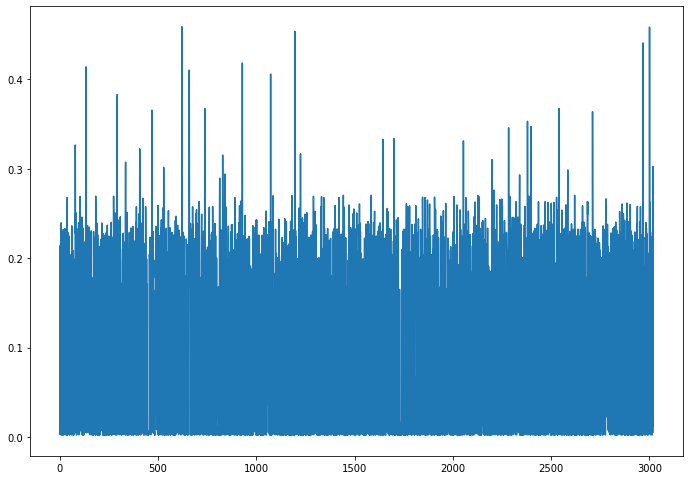

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

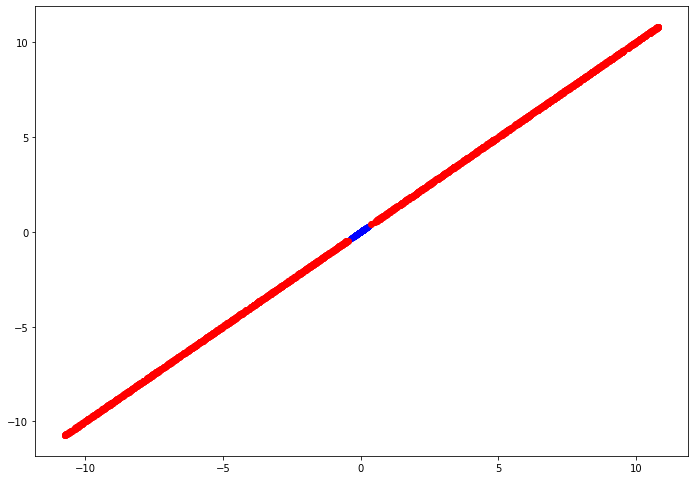

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


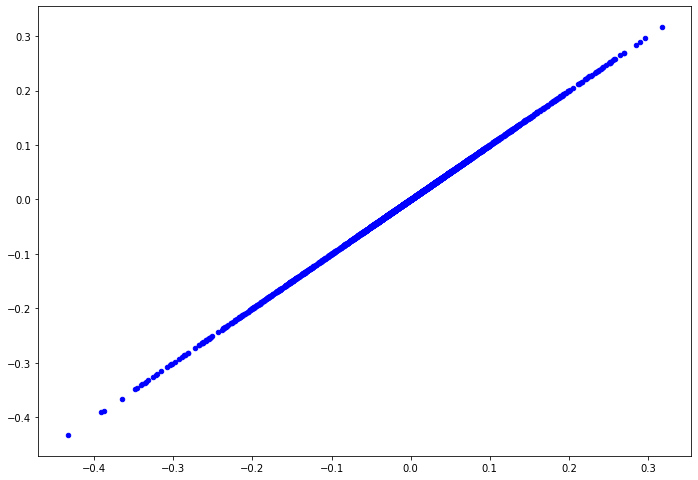

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

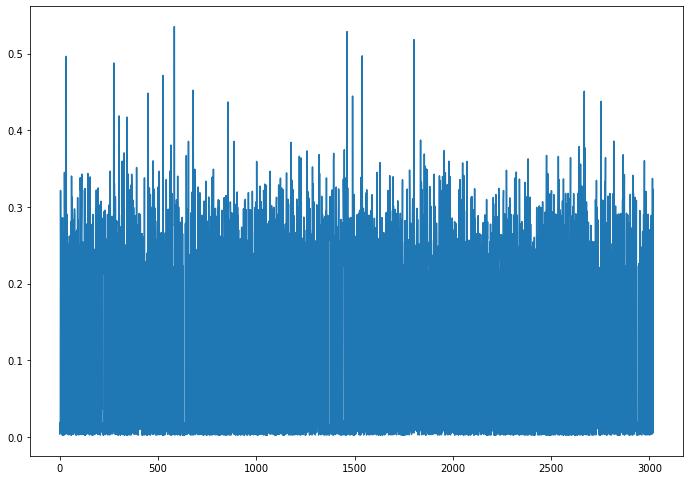

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

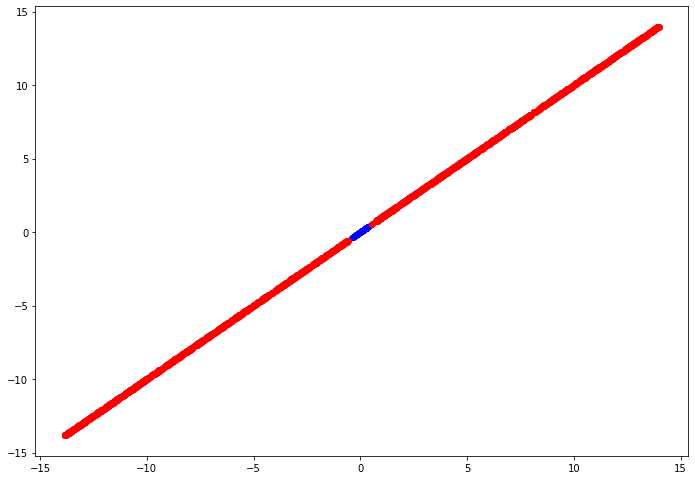

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.17)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


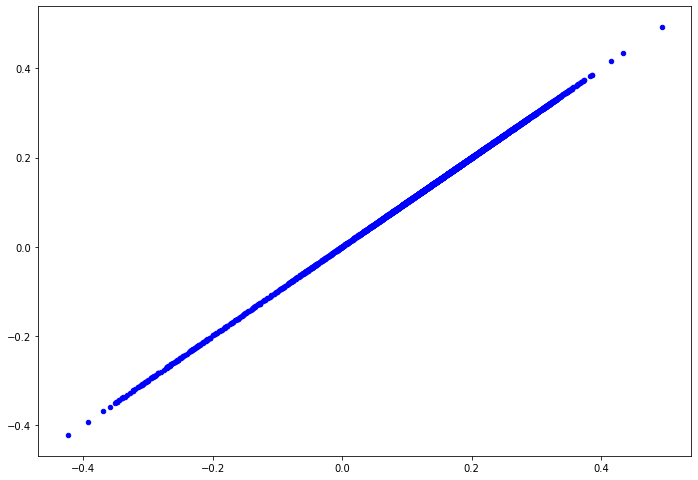

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

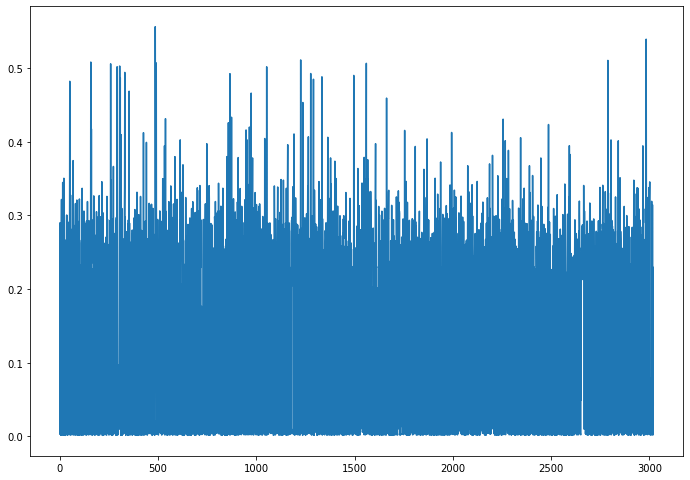

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

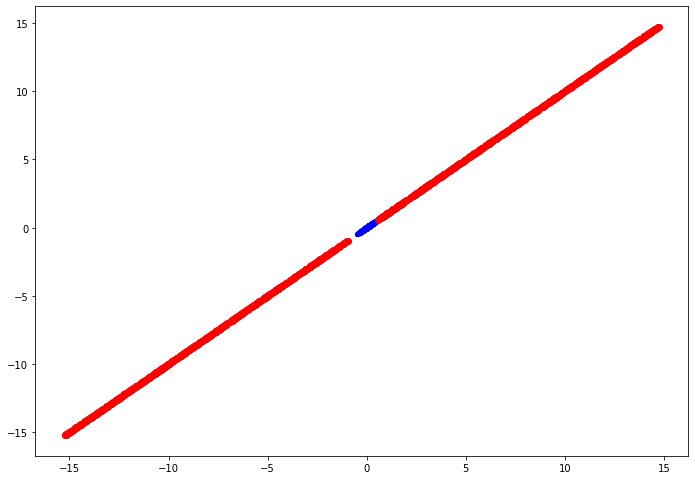

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


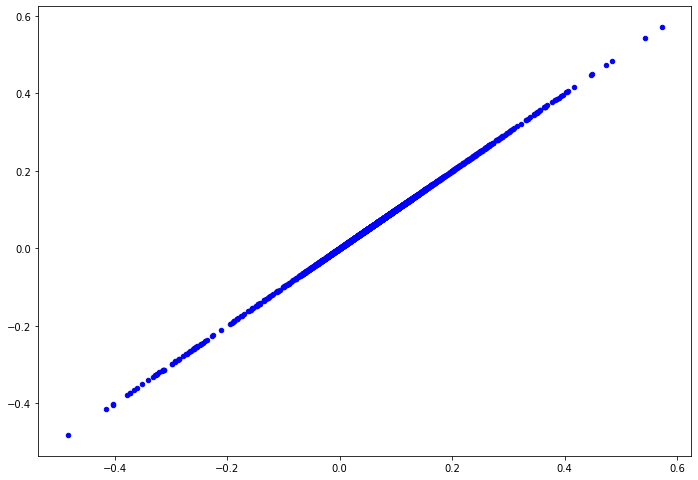

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

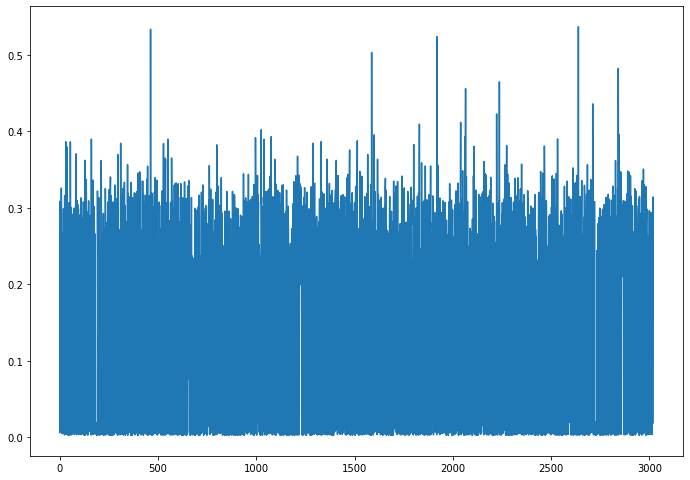

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

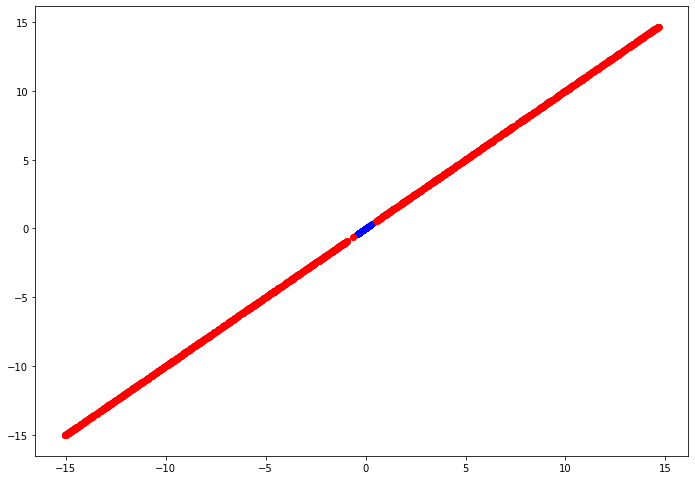

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


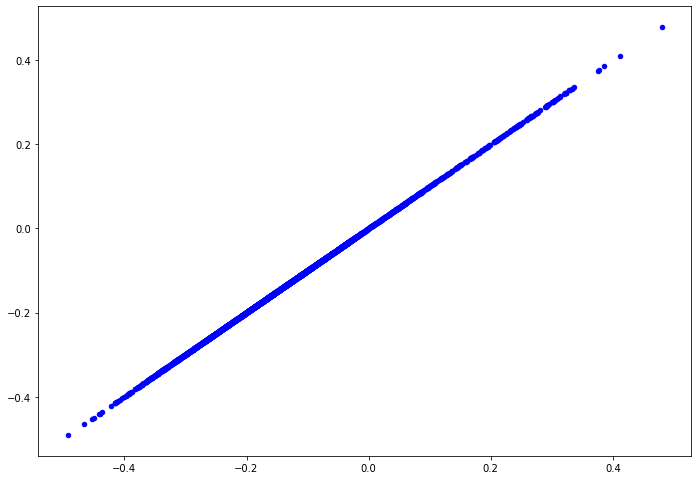

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

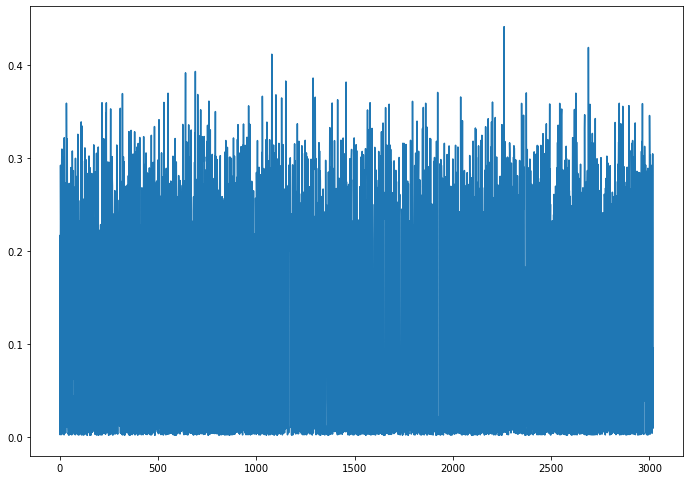

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

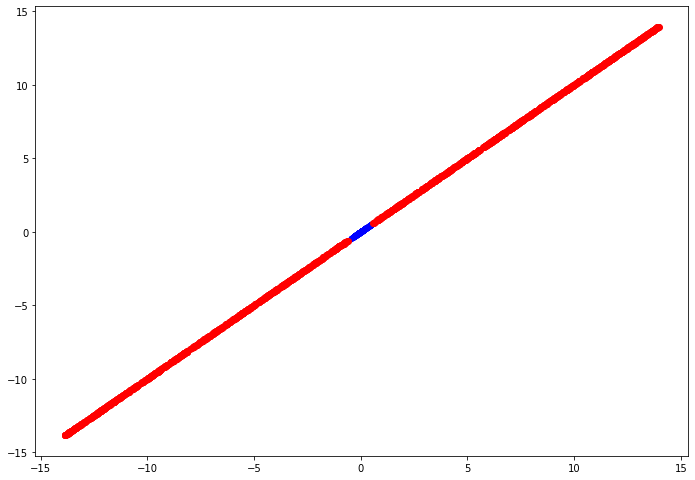

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


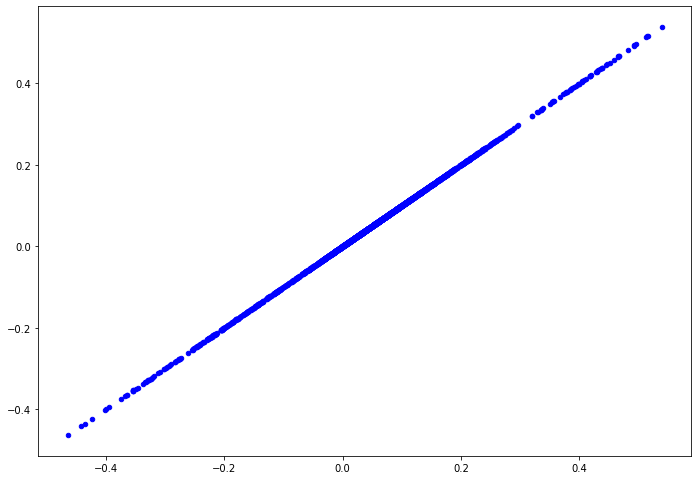

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

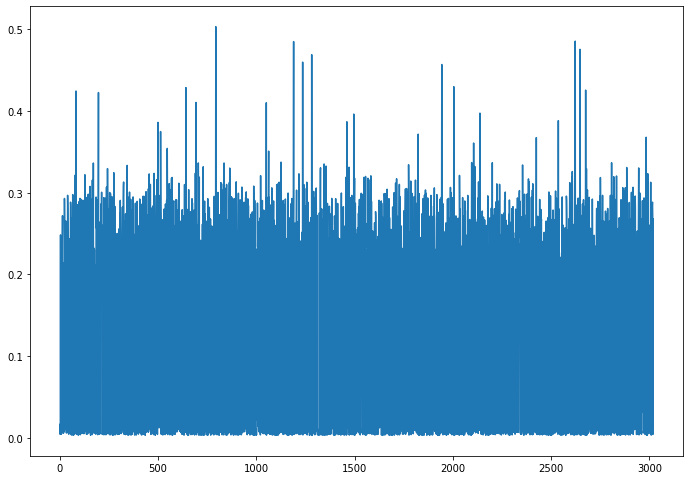

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

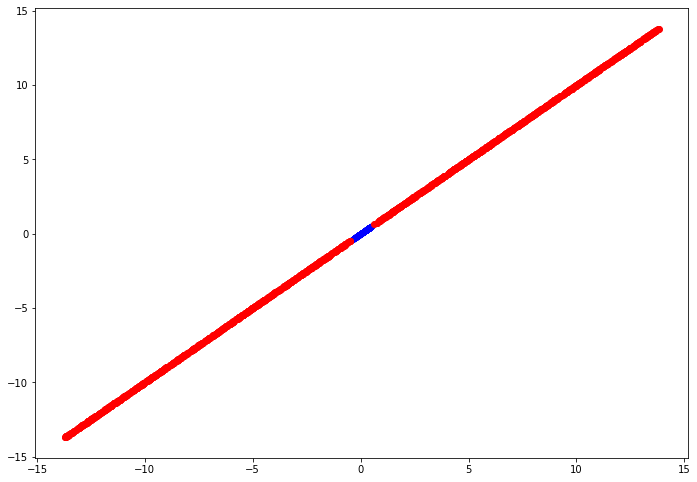

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


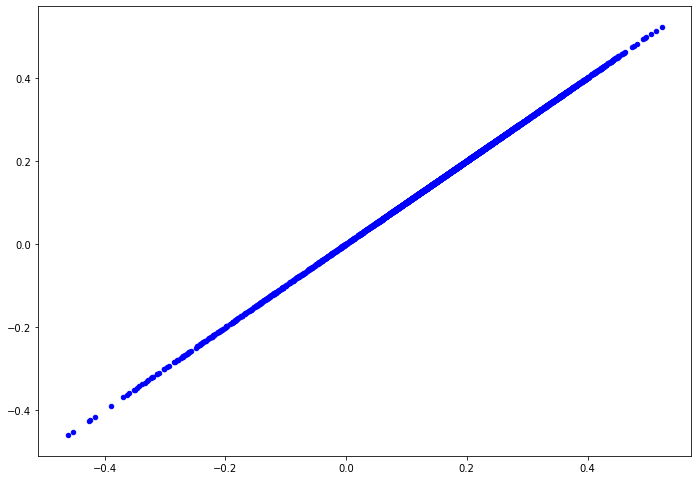

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

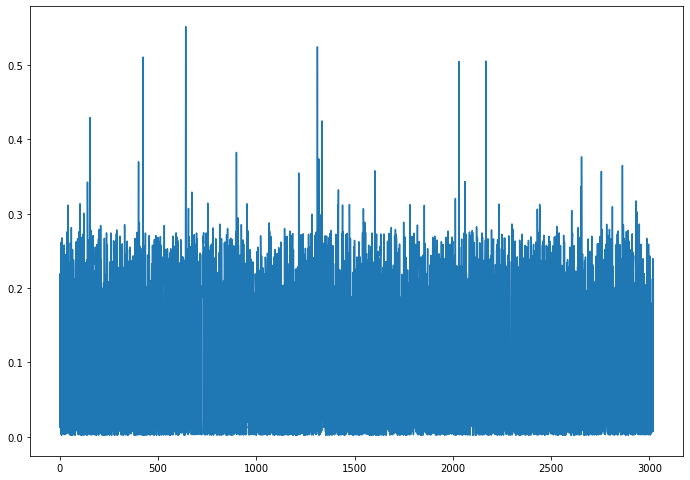

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

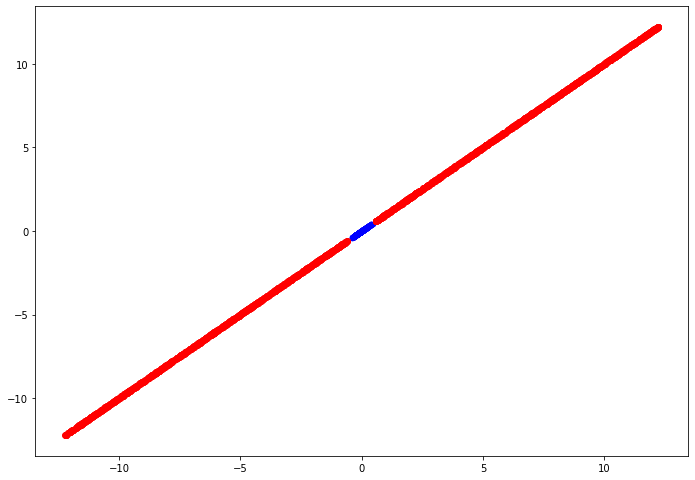

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


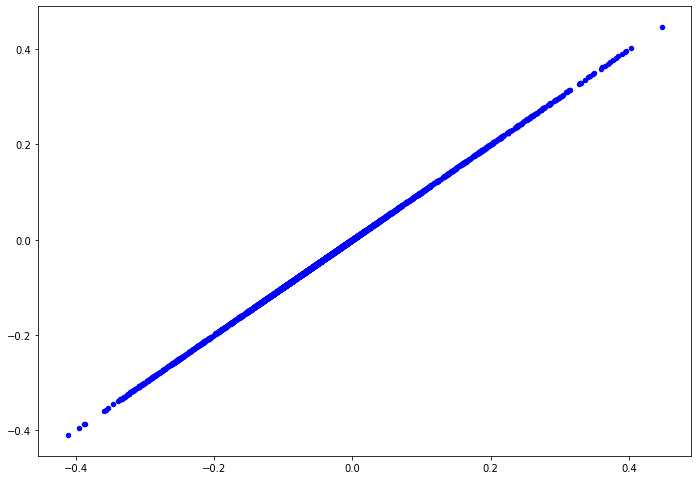

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

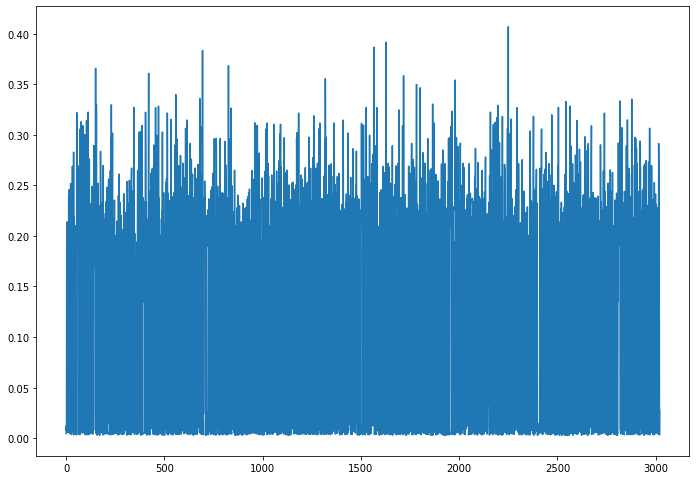

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

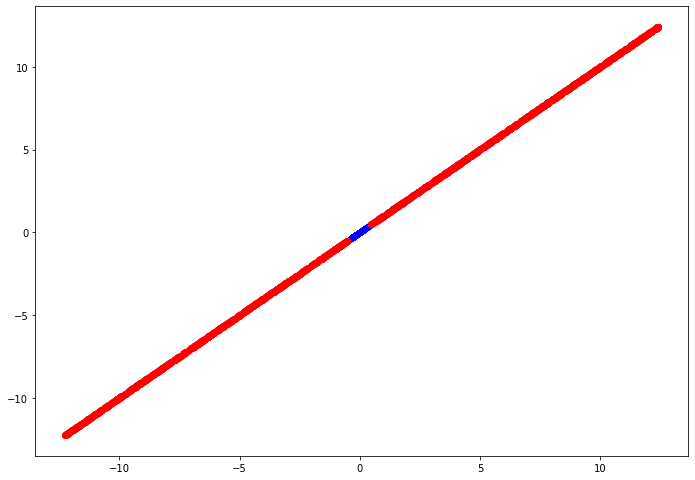

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


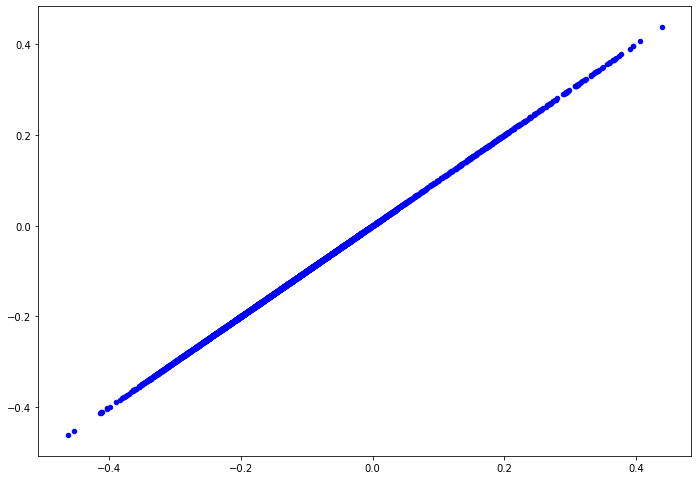

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

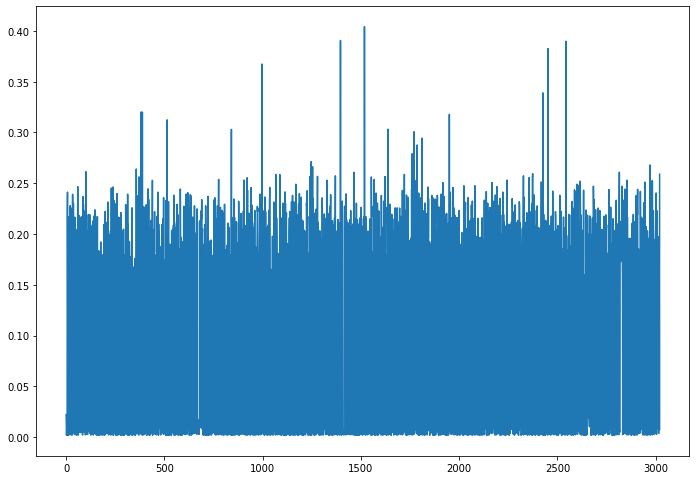

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

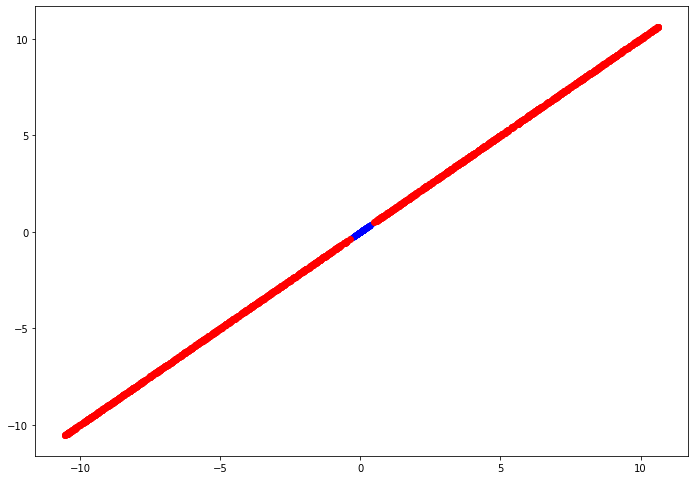

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


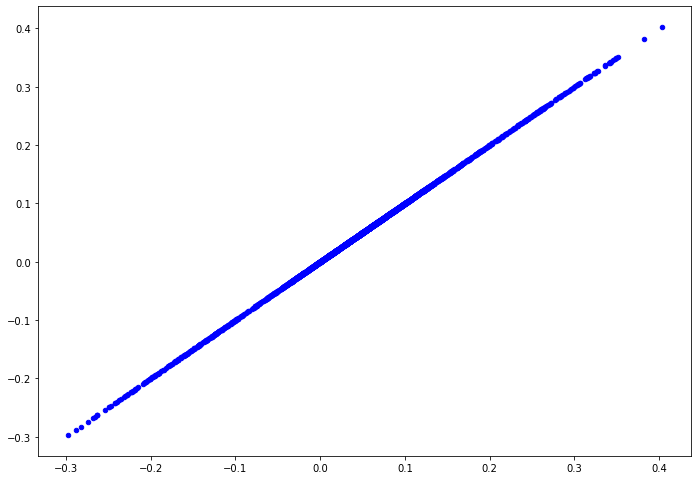

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

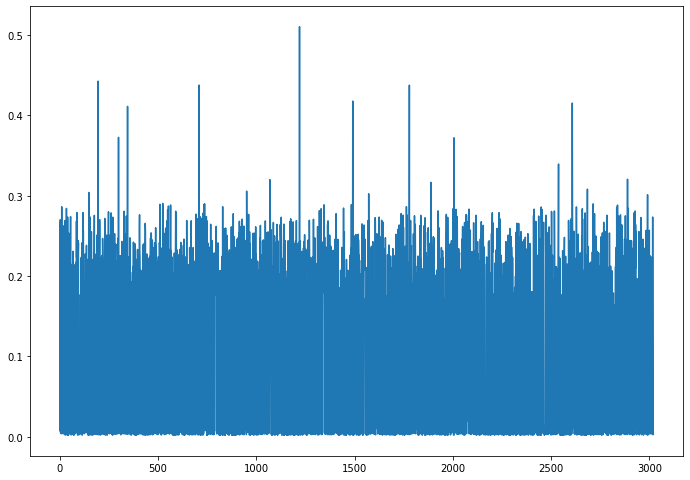

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

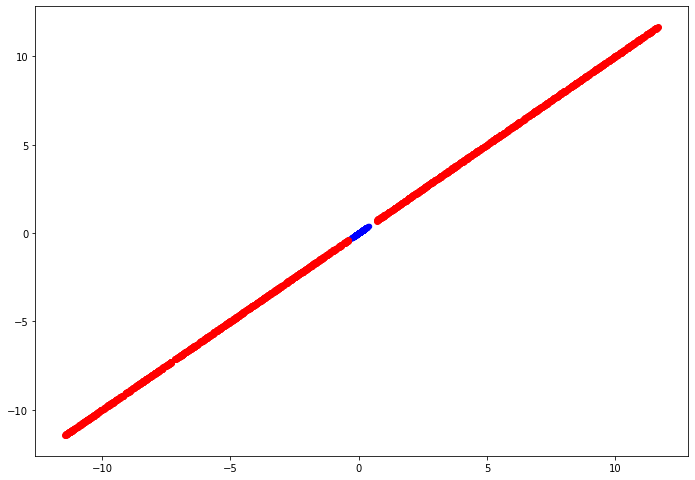

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


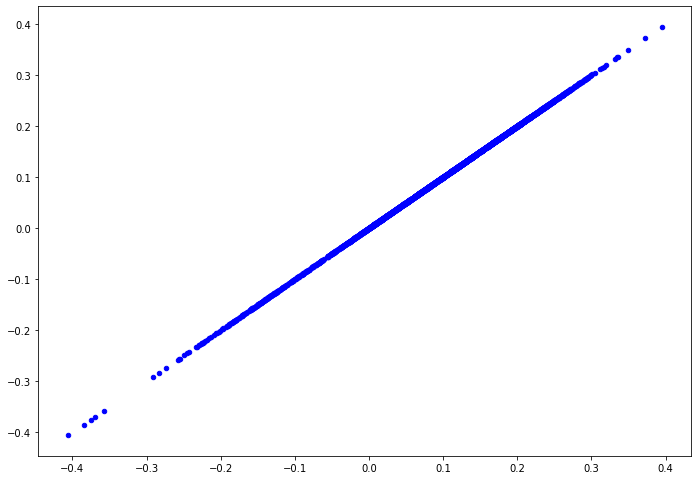

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

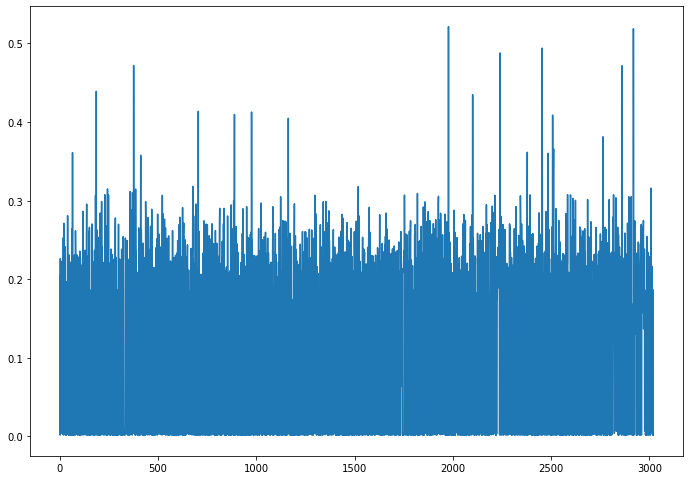

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

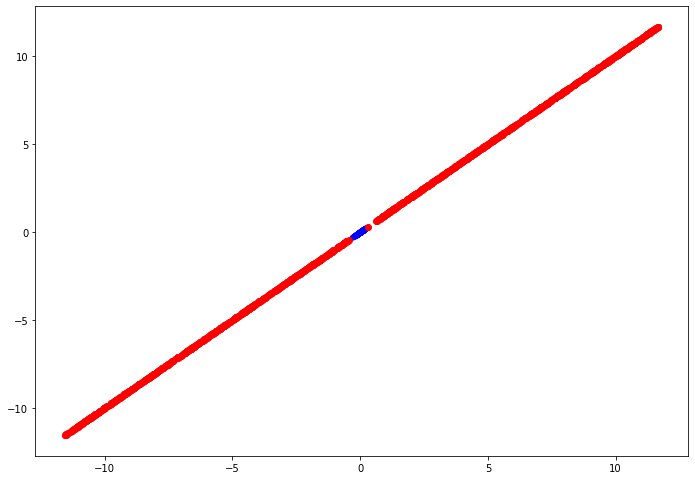

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


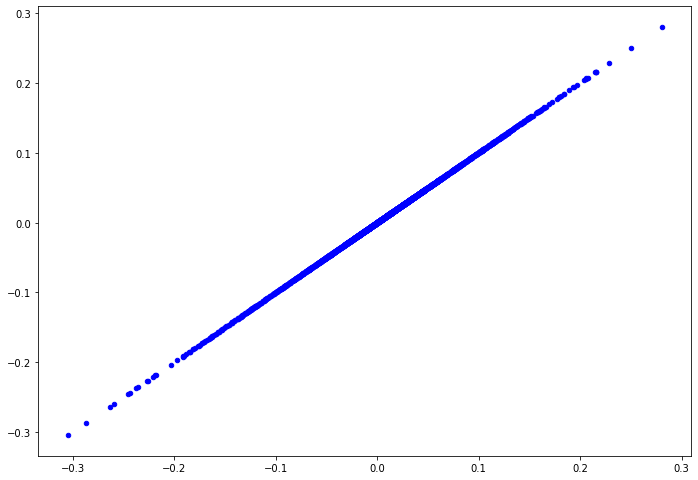

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

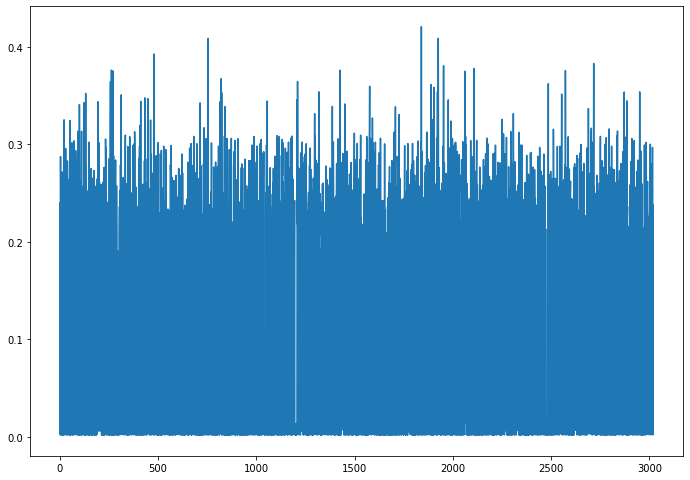

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

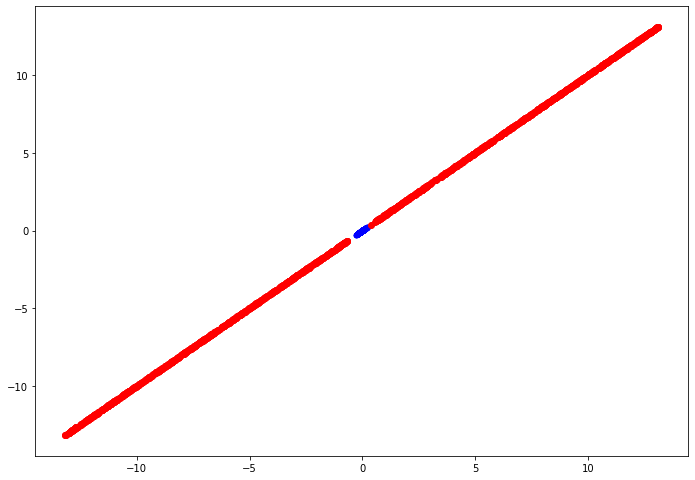

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1675)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


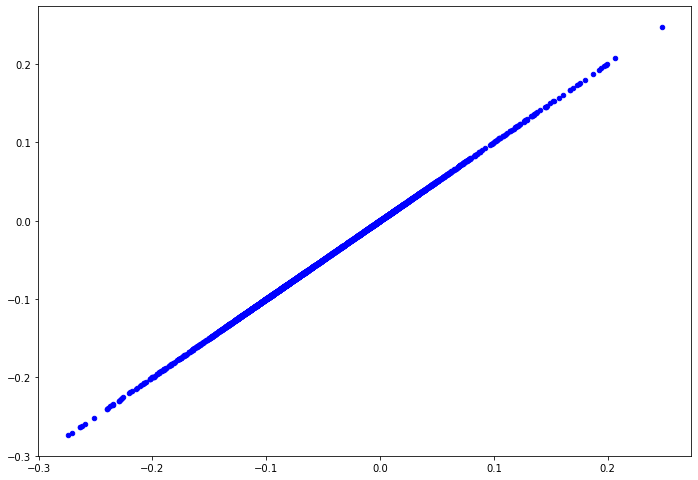

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

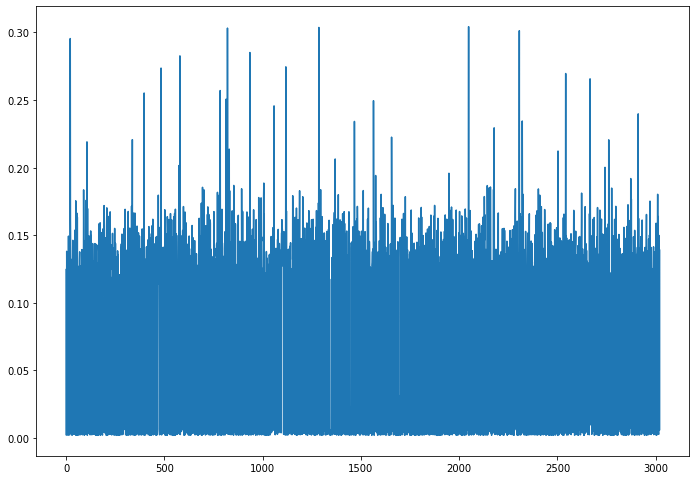

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

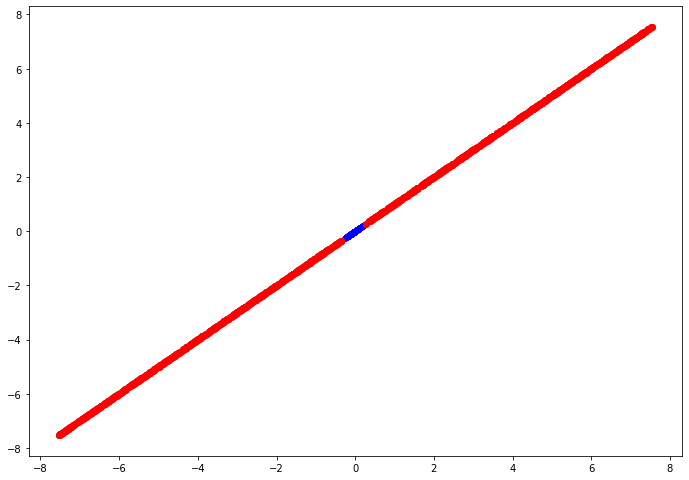

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


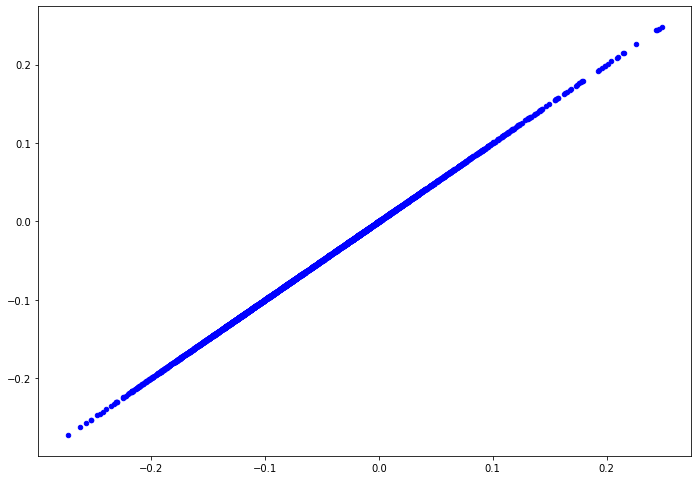

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

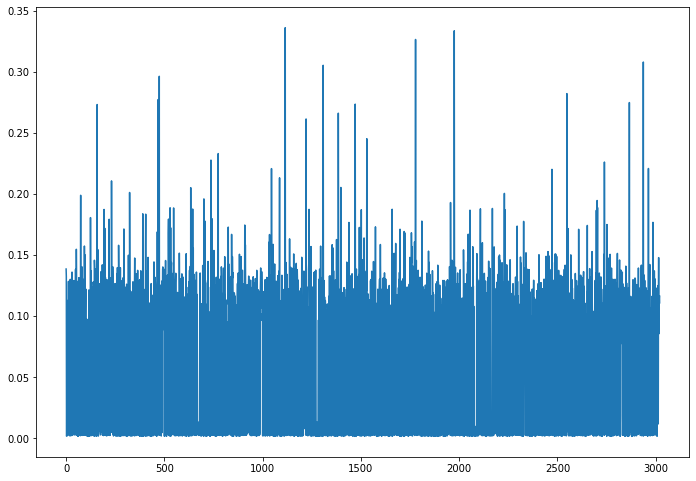

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

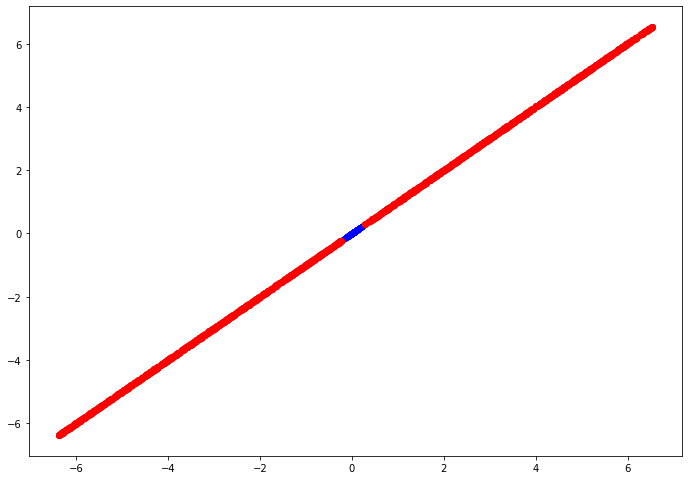

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.08)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


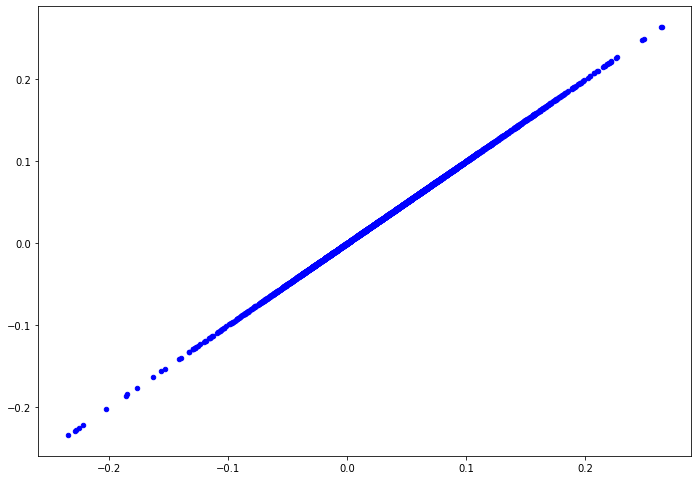

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

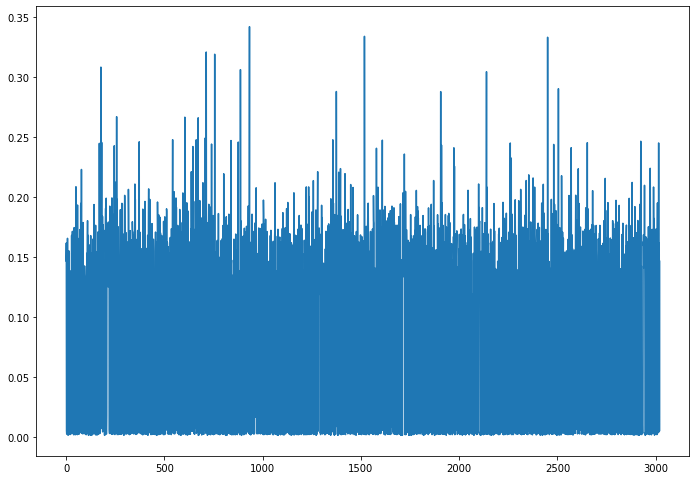

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

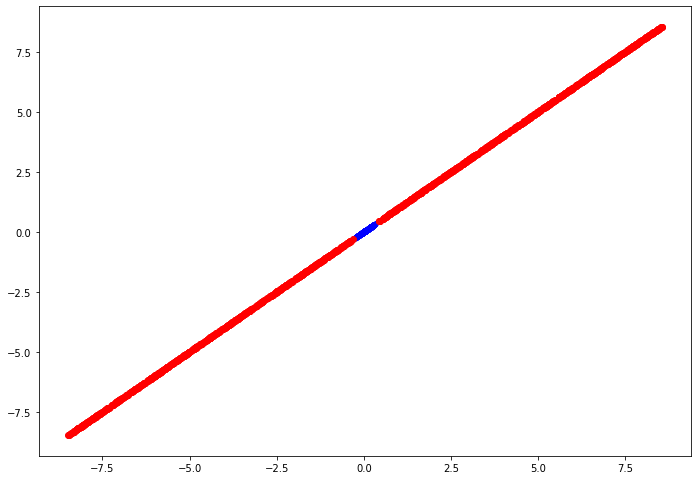

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


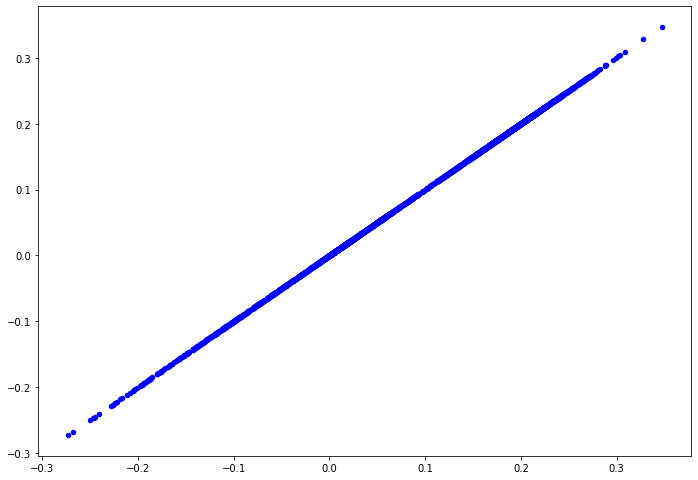

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

### ML algorithm after outlier detection

Z-Score

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsZS)

In [ ]:
# evaluate ZS with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8659384309831182
Recall   : 0.8659384309831182
Precision: 0.8428772398381646
F1 score : 0.8343350972904404


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate ZS with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.8738828202581926
Recall   : 0.8738828202581926
Precision: 0.8795414134524151
F1 score : 0.8747534402414908


KNN

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsKNN)

In [ ]:
# evaluate KNN with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8771929824561403
Recall   : 0.8771929824561403
Precision: 0.8510647464008753
F1 score : 0.8467873579773817


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate KNN with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.8795100959947038
Recall   : 0.8795100959947038
Precision: 0.8826215100518638
F1 score : 0.8802276145401446


## Accuracy 60%

### ML algorithm before outlier detection

In [ ]:
X_train, y_train = frogsSplitML(dirty_frogs[1])

In [ ]:
# evaluate with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.47600132406487916
Recall   : 0.47600132406487916
Precision: 0.2265772605115181
F1 score : 0.30701498273392974


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.8884475339291625
Recall   : 0.8884475339291625
Precision: 0.8870968770505433
F1 score : 0.8870385340234247




### Z-Score



In [ ]:
currentDirtyFrogsZS = dirty_frogs[1].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.095)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.020095725640427, 8.373153920397726, 9.374663881942425, 3.909166307977397, -3.906904973702352, 8.332383332418765, 1.792242804421523, -0.7393059102796151, -1.3891829160611104, 2.0323485067248512, 3.9629150126517576, -6.314032269143688, -1.098026027789763, -7.899105902464818, -2.9287597185187204, -6.892776326301902, 4.015001423470217, -5.920017806111224, 9.337493110329795, 2.1382711073290674, 8.309785978528538, 3.0634059298712537, -7.127519803791314, 1.8129286464772256, -1.8457847064645625, 2.9296762118033466, 9.12372043907477, 4.801586113071738, -2.6136146526751407, -2.802194145665039, -2.41288498498073, -6.873626213027394, -2.7298981625670558, -2.3099486281687733, -4.874034438384344, -7.509108785267419, 0.0053192320222965, -2.6745574429079166, -6.687285902997328, -1.495769669172759, 7.828037653810771, -4.1972450417637575, -6.564210767839153, 3.21028415596348, 6.40053548849968, -0.9999845045039244, 7.900139045480826, -6.717201013541556, -0.6715970506201403

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


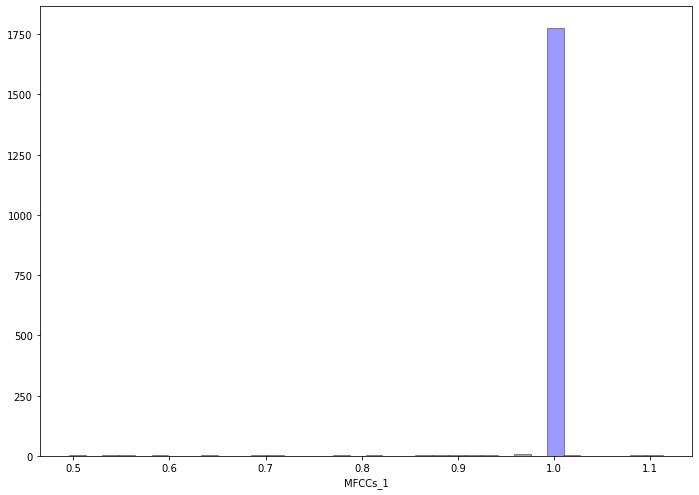

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsZS.loc[i,currentAttr] = currentDirtyFrogsZS[currentAttr].mode()[0]

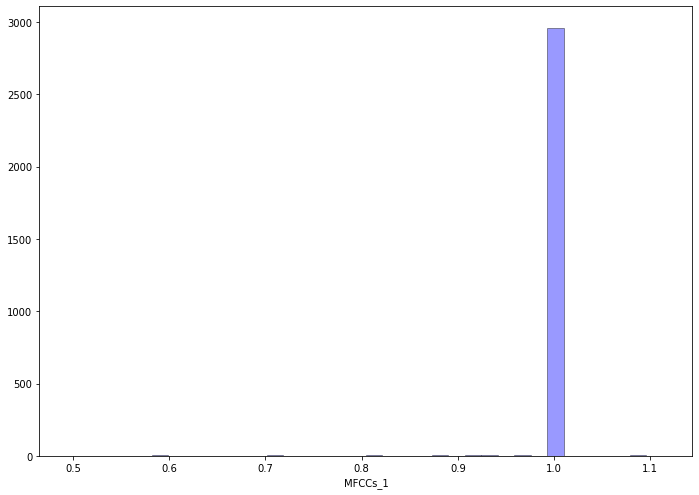

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.085)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [6.060206741175216, 16.36962976435932, 14.55625582158963, -10.004743179019204, 9.140547383458308, 12.101302877255891, 5.386256176841922, -3.3410743673199352, -11.766421726461816, -1.5612546639523348, 3.24581560815686, -1.4730440728337069, 17.59885967722587, 1.4694167233313942, 5.818205711059627, -9.055538302542889, -15.610680062073484, 17.42777622790312, 4.202355950900122, 3.516581128968072, -16.20840276118044, -10.981758660324456, -17.189488954382167, 7.146408913968759, 8.420869798423016, 8.920198904877342, -7.907566771125772, -10.76710228918776, -15.115552676594344, 5.367324754881942, -12.361095437990304, -3.120706561689161, 14.384983836916112, 9.450682675184684, -11.380289467777825, 16.281110130206805, 2.95901619008969, -14.549785798203567, 5.740589100128165, -12.78701903611774, -2.2877170289187454, -8.753484975303007, 14.765984758593875, 5.622614268301997, 9.704907755035697, 14.97694907590338, 8.38582069446426, 3.0393676669169305, -10.581675147600716, -9

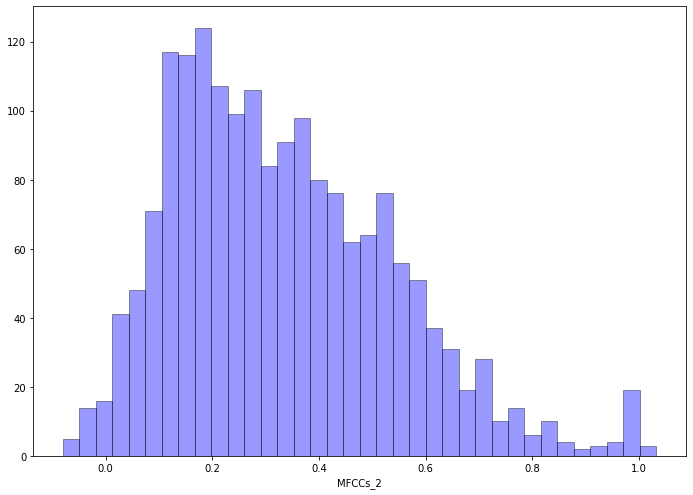

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


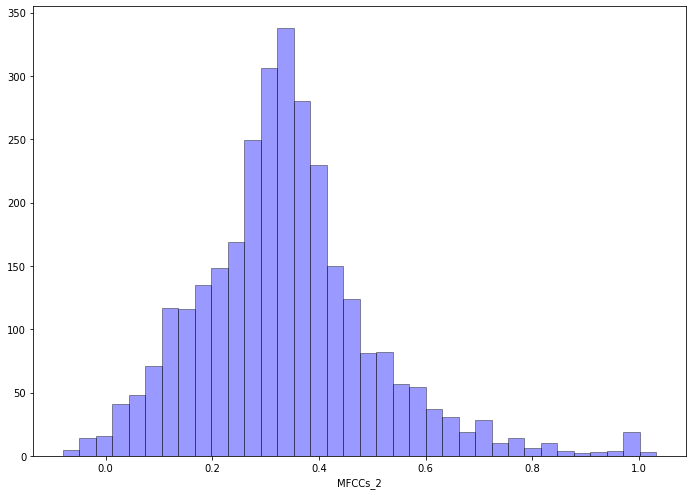

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.1)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [10.75718996506893, 7.103574790074012, -10.28582032397226, -1.0335131477656478, -10.87139475814758, -3.434178500128045, -14.497933085162346, -8.15290362305468, -12.888294698994066, 11.733731438084346, -0.4305240087347464, -14.36784807597506, -12.566926294770589, -7.9604000369033345, 12.995452812206382, -6.524515792584181, 14.922082332219526, -3.0758927235706786, 3.1844468330885234, 11.937948856191245, 8.36582561111052, 1.0, 5.800575461794758, 0.927010634043209, 1.2441016143927242, -10.11055885780882, 11.333369965054242, -4.061881057991876, -4.78113978238293, 4.726620196859465, 12.409891957462396, 1.0, -2.109339335645465, 11.52345396799036, -4.400905159793934, 13.919234175458412, -5.437606144864905, 5.473665649700052, 9.129530126545909, 2.844629129146086, 8.538759753687582, 7.53215050988194, -1.8633314173514304, 11.610045526005218, 6.832044645189242, -13.319848578478096, 12.817347407708272, 4.263175626741482, -8.832649627065633, 14.51896593290599, -8.42198507

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


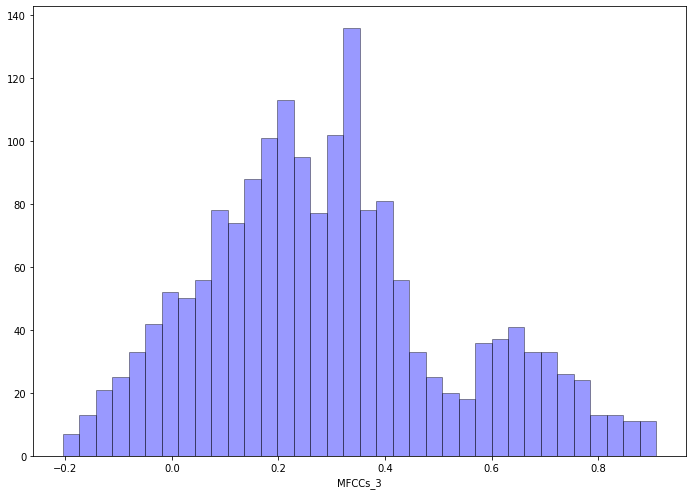

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


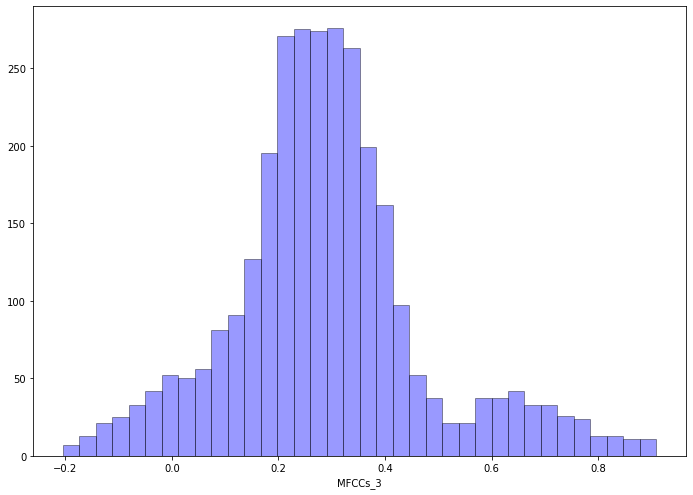

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.112)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [1.254693405928714, -9.942340079209004, -9.197247928825718, -11.785295741242642, -5.148407832648887, -8.012657260982191, 11.38450185715796, 2.814735387260649, 12.029398002246076, 9.12114807715154, -8.906788560166664, 3.4349629620594486, 2.239836271300954, -2.810905868513922, 11.838343271416791, 9.830275987961134, -10.992181219132943, -8.376134192590202, -5.791878135098143, 4.0641860209097285, 1.922005890769433, -4.085098692346445, 12.716649065259736, 4.274182437090564, -9.856191488115304, 9.589586484022158, 13.028089813839712, -4.204276321215657, 9.569527667934988, -11.628183407783265, 5.611804938540184, 9.480906108302548, -12.086499144461936, -11.917223789478324, 11.927102078769977, 5.56705988705685, -8.549817021413608, -5.953524889147699, 2.620261905592977, 8.295836504848541, 12.181600392673094, 11.796869670478122, -11.25181121073928, -6.055520798615239, -10.913374004677523, 9.36278858354931, -7.7289310398256434, 3.629399845424592, -0.397082616801077, 5.35

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


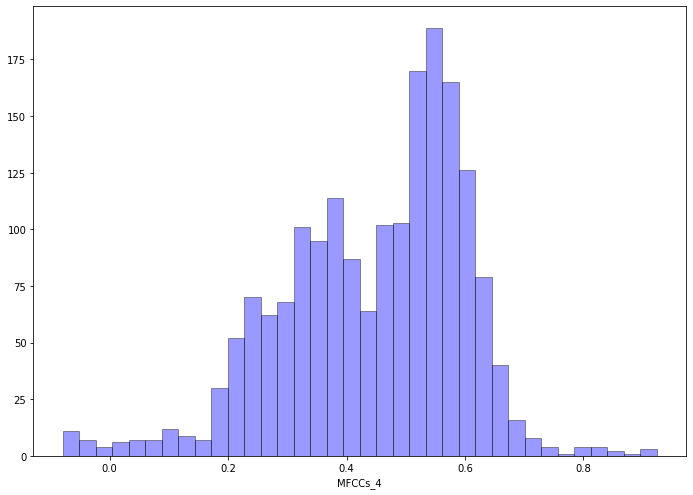

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


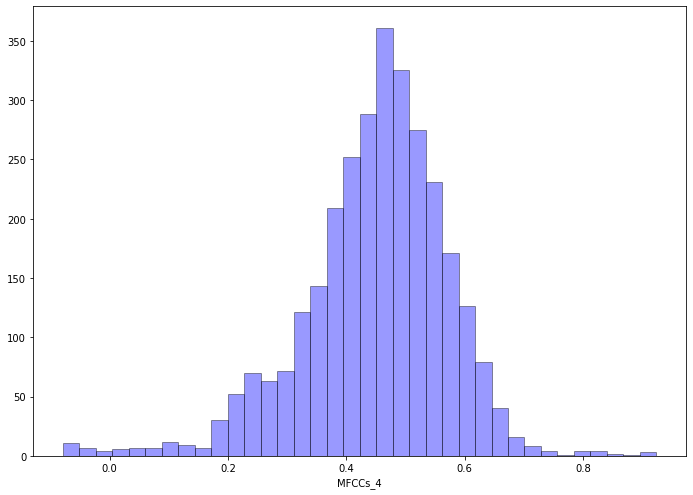

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [7.62387752469288, 9.502052258272007, 10.504399330270068, -4.2605111623763605, 0.7900933699048576, 7.28817432569552, 8.408111282604079, -0.990304261009248, -2.600400738006515, 11.394445602949904, -4.027676900691697, -10.836101227458744, 1.1997020468680326, 3.831958932114426, -12.201169223635931, -12.568503390357591, -7.585461499356289, -11.188587785589426, 7.064134040195826, -5.1303867791689886, 1.5410173602030692, -9.900613089217622, -5.928475299487617, -8.06462441298925, -11.33865839378064, 5.892079429199857, 4.843884614324116, 2.671096298450653, 12.655348750019018, 8.566013397024124, 5.169305428380193, -6.276625381846691, -2.516327875268283, 10.4270132890859, 9.309291105032154, 5.305703413420021, 11.587916428814298, -12.69835050838345, -7.220889614292398, 7.384942421144622, 3.8738649852264655, 3.87694046764453, -3.3817205784580158, 5.89948520653949, -10.661754994735958, -10.493710744856395, -11.929785074592877, 11.770683431455543, -1.1065255065885236, -6.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


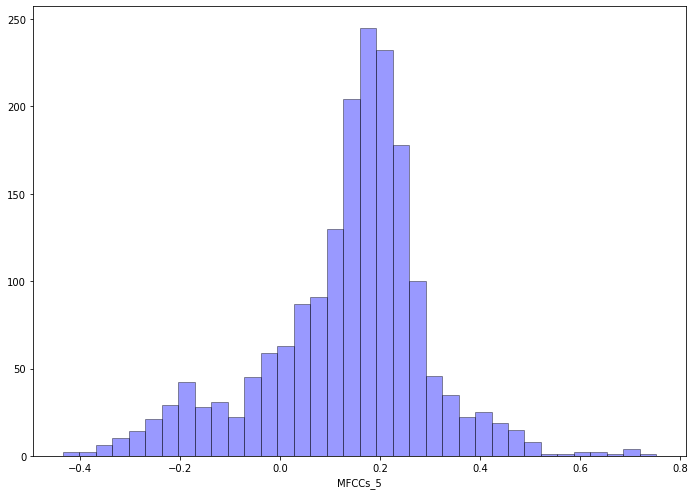

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


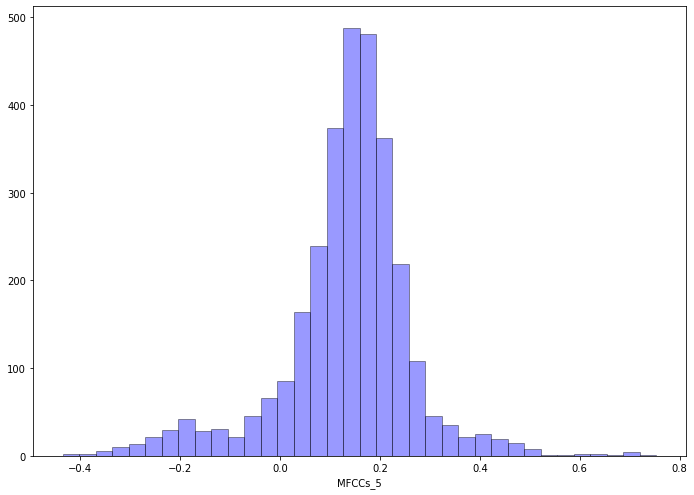

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.1)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [1.500049485175439, 1.1892023410551882, -4.654801891883132, 9.50160847201383, 7.55434380102522, -14.145764557988576, 13.61525829234368, 7.27044853330345, -3.1816114890981915, -9.794620619527787, 9.16128833032744, 7.909081722399428, 13.540410585053056, 2.9455020221827564, 5.582449628645364, -13.404977961066091, 5.768204737523442, 6.465554147286718, -12.091539697096568, -1.125921603702036, 5.225244723554142, -11.982800340078008, 9.635564270028686, 3.093103170947113, -0.6282018977631569, -11.931447331302335, -1.1996364830487831, -7.187740811698974, 7.7638079320829565, 3.722067788121687, -11.098912238405712, -6.78876740562985, 13.36123650214718, -1.7212048316341768, -0.4650611859685991, -8.461824634971011, 6.837762382543021, 9.164407448800434, 14.631582489190006, -13.256355569623706, 13.346747330031638, 10.01365359052834, -11.62711849732144, 4.546033589278932, 3.626551628932017, -7.57860177229152, 6.080102169589037, -3.485618044448364, 2.2254062892404467, -9.450

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


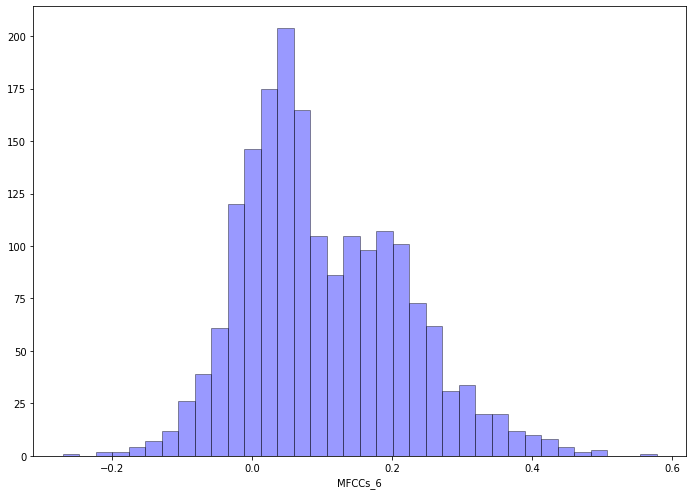

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


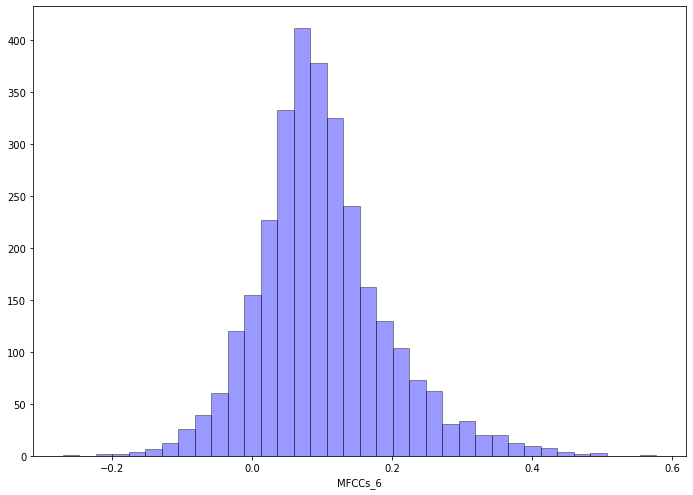

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.131)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [7.812140979665624, 11.608762809132786, 15.136487887310684, -10.906882384956656, -3.097589293245285, -5.196317265517672, 5.132155712210581, -9.848484851503692, 11.595984219513936, 9.490404693052673, 8.7286480026733, -3.926170002906888, 8.183987292979127, 5.92166930460336, -6.106084131706703, 1.6557324923462589, -10.322861282896628, -2.627152382367557, 9.9486959771773, -3.1498675883960896, -12.98784295099517, 12.943932933895075, -7.988089559555281, -11.221423522862462, -5.026758868796604, -10.361995862297531, 2.63698228957215, 4.1696129148593, 13.698583194680856, 6.039428193527782, 10.284603464816616, 7.177063252697462, -2.25633598066017, -13.208610927580027, -6.962779524575103, 8.388795543079524, 11.366541199735709, -13.481006435086588, 3.4435137621782808, -7.744106431940168, 9.42635225112661, -4.7981511332622, -1.824878188961419, 1.126326736242583, -10.911518252446395, -1.6789036167810316, 6.06621954710597, 2.579245562197812, -8.25927175704362, -11.00445112

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


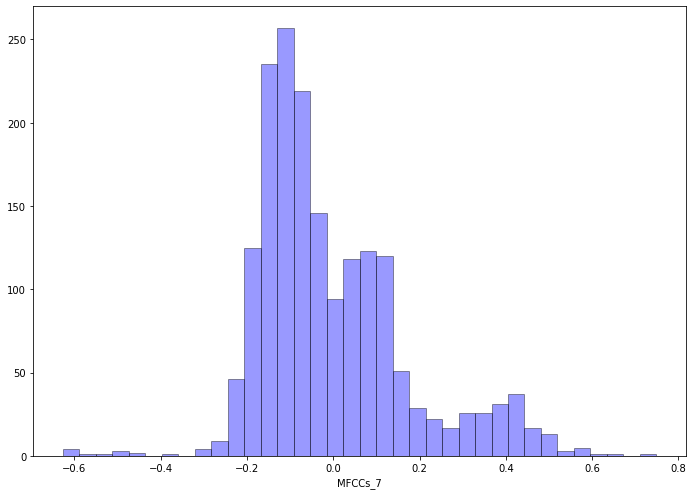

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


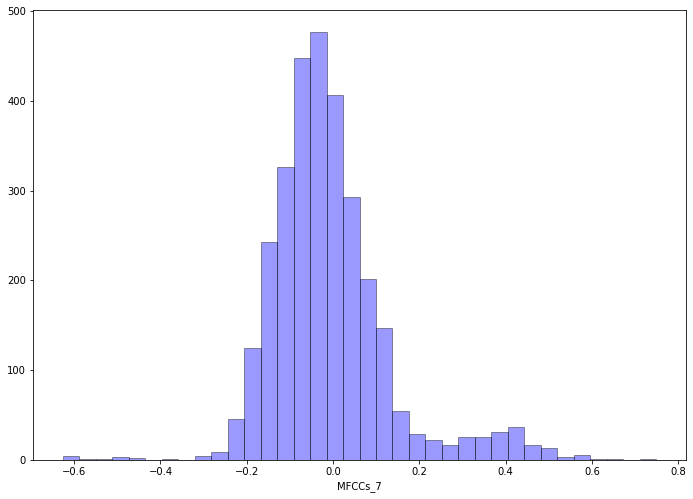

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [0.6617819391038207, -6.2216359375059165, 6.469878494616799, -10.196230849707923, -3.026266487363567, 9.686321323762009, 2.847180052413897, -9.25016537837488, 1.279273901588528, 5.070368359355979, -4.277801514265026, -3.0959800939458324, 1.9179052048871923, -3.595839023585341, 7.0904855265368925, 8.641339466464244, 3.100273012042454, -3.2340901341276997, -8.465325319274026, -4.828940283115172, 3.2893483913589203, 2.462891091584683, 3.5864931127030584, -1.1194876675703878, 8.110329130381345, -4.41815678127525, -2.1093587046509548, -5.714896213675475, -1.5869214862866876, -5.94098361644463, 7.855733205384764, 6.964711185592888, -3.318928437496183, 3.871022712980444, -0.5746461521205486, 0.9755006654915452, 9.177760334027791, 8.97949821581485, 8.430454409444646, -4.638079305568298, 10.31110334095003, 7.407331385299603, 6.157990544010789, -0.9182409545148752, -4.132988349614911, 9.811363503524582, 3.901263438161228, 1.4207261375351363, 9.50908484254908, 3.786401

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


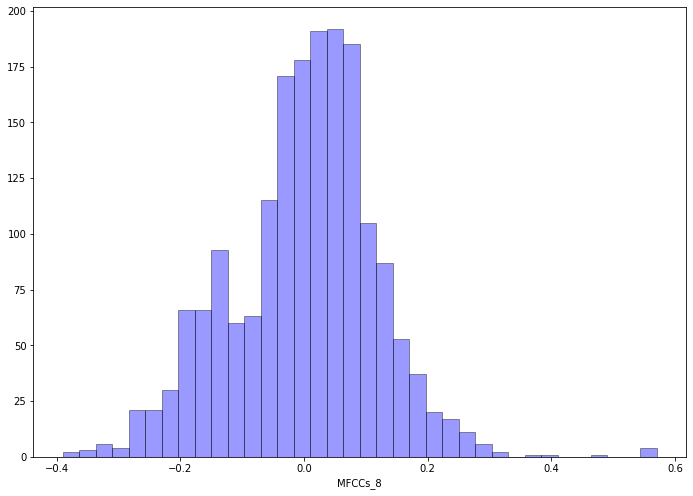

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


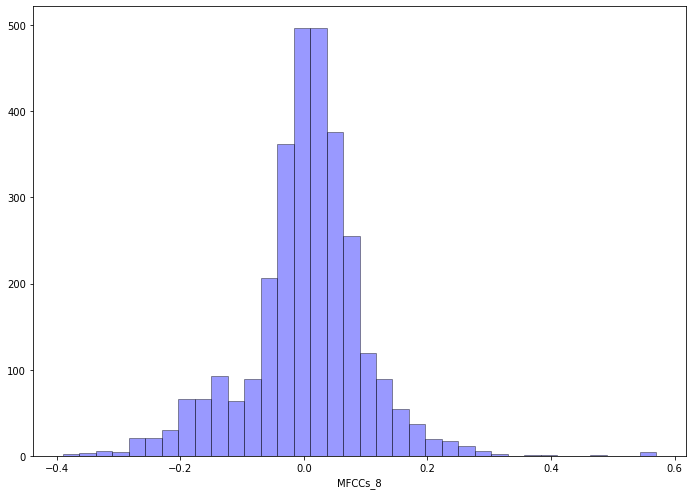

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [1.63088717066541, -7.0967502380451695, 7.140649998172663, 11.839496911437674, -8.71205898377795, 8.71570020026774, -1.6533134651077823, -12.83200359123806, -0.730357801711822, -7.0919553343897626, 3.68158085277763, -4.108525349269806, -13.33161484239957, -11.357949135424384, -5.061227358548749, -13.71812897818622, 3.129258343057224, 11.005638383065367, -12.360369286283294, -3.827165242304675, -9.827796888747482, 11.957458903770467, -5.688970721748873, -4.553740729256958, 4.216633035530268, -9.49823992501646, 7.833938256012001, 12.493281160734387, -10.310225607934864, -11.130395933065984, -2.41806493421454, -11.923489677411467, -7.58177128263277, -12.352083400760346, 5.196747724446561, -6.928365437665571, -9.794551607781829, 1.6141173748938125, 11.080226300126498, -7.706794341138271, 1.2059404762923016, 5.127914856898145, 12.908091953556845, -9.254530759262046, -3.0746041890497797, 11.548449827752332, 8.884813805374897, -7.370394355828184, 9.49714299284869, 

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


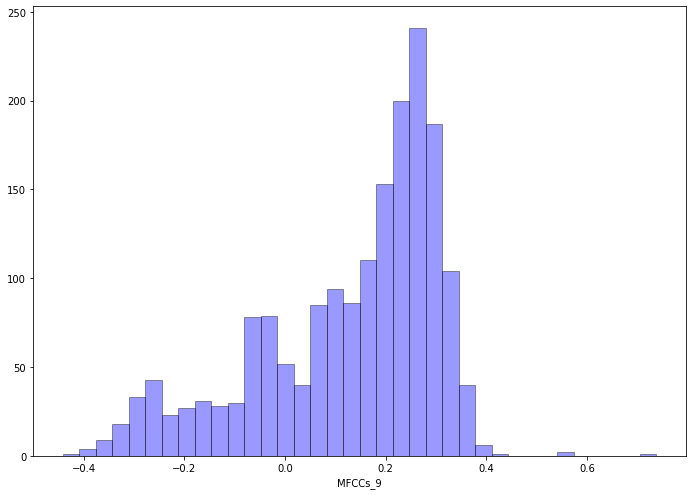

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


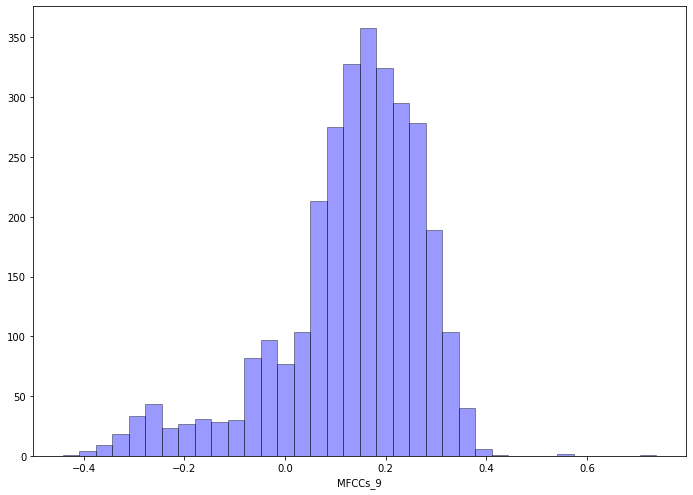

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-1.6490152738796642, -9.735069168873352, 3.079395165379408, -3.459259779548681, 3.775886817285454, 11.3959408786425, -9.627661735378386, 2.2799830628260405, -9.310148808514672, -10.458731380976484, -9.021509932512627, -5.741935210102156, 11.144422491667028, 6.107812245488432, 0.850755071056728, -8.683699274346106, 13.938905310138098, -11.396146847930272, 5.226707304114012, 5.872910714532938, -6.459195015805067, -8.031808278317143, 13.524886215741232, 9.290943209961668, -12.372942731203343, -1.2707879115986636, -14.11058957019464, -7.1857186328554405, -3.329842411071871, -5.030371922792872, -1.9652881059981784, -3.582830651715934, 10.384124213843144, 6.911111723473936, -3.9326213102365273, -10.497253554998077, 9.197723623766077, -1.96227964957766, 11.645543070135329, -5.823601447830917, -12.183037671428922, -6.5667382332183255, 5.434404701795475, 3.1567880647258137, 1.8799963699498985, 10.836664951661788, 2.247648710953325, -10.0548253443834, -14.69784807796

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


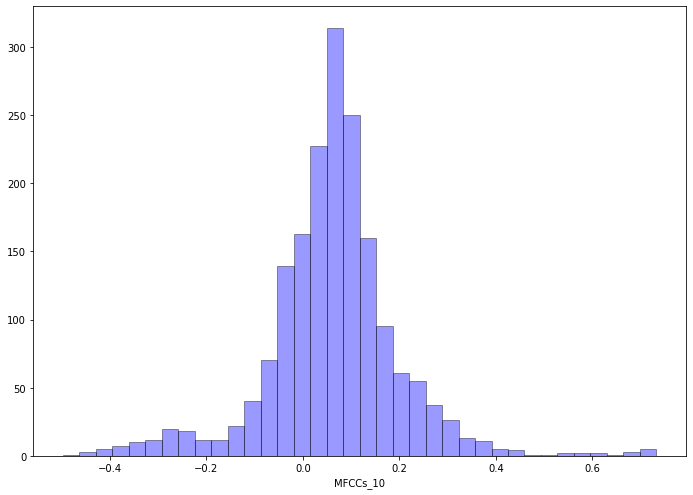

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


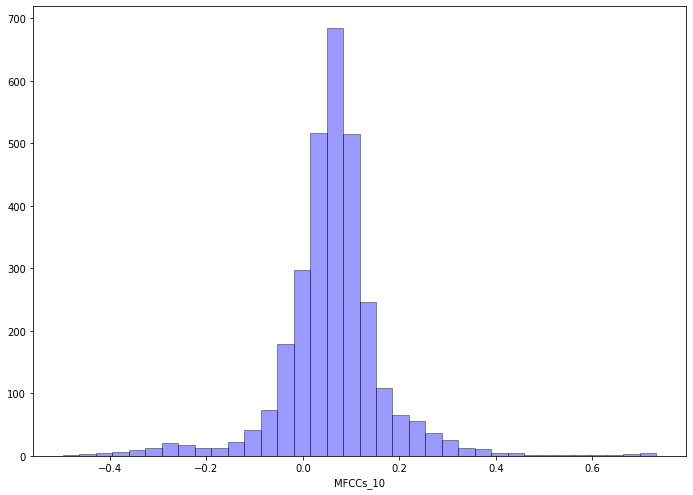

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [11.924464189341546, 10.025633522055823, 2.622974635358905, 10.07822527899735, -10.65251266603687, 7.470347443720445, 6.506400281195624, 2.096863169757113, -13.38785213427397, 12.99611930294699, -11.469419264892055, 12.828113623255565, 2.86673631864798, -13.392829874064068, -11.413094532861471, 7.470449546183966, 3.959929991533967, 6.950588051745289, -1.3519469726299889, 7.678602437466693, 2.852642038394802, -5.923958547892964, 4.906388525098882, -9.033775910270608, 10.506711848661183, 8.755436458491664, 9.990485677328437, 10.470843977252748, -6.687803423935623, -13.263149784204202, 10.737886986606162, -11.111169580032955, -5.603675187588001, -1.069162865743552, 12.0709281573254, -10.206169679638036, -2.475475676336961, 1.344428767275376, -3.172120299910299, 0.8465215746974184, -1.7007624727647137, 6.027406793828952, 12.967009308658284, -4.150153757947374, -2.1580122070874594, 7.771427074455072, -9.182865471937188, -4.006309466129373, -3.757243488683749, -1.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


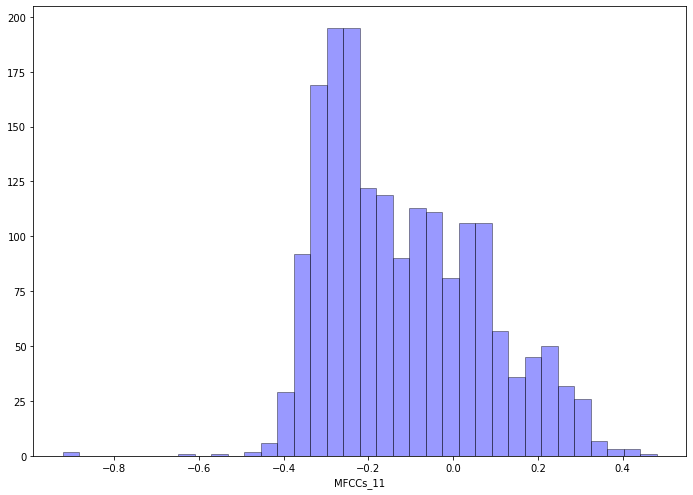

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


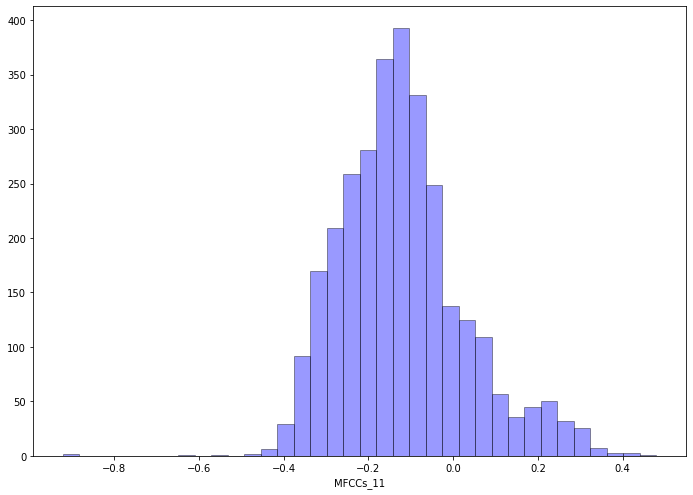

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.11)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.014155967200132, -1.018788469724175, -9.3067993228513, 13.455076877927455, 6.584609853492855, -8.006319689638715, 5.925132162971318, -9.785906077418314, 4.772364602777309, -7.087121414647327, -4.226105682323691, -13.535419822201323, 6.179450849399218, 1.405053222986993, -8.870347136284355, -1.5237506139971655, 6.214561855134438, 2.7471075416444632, -7.551469721473664, -7.217433644032894, 0.8305582557189904, -4.764403898766842, 1.202431095532151, 3.6625227497409822, 6.086772700525693, -10.383143281504934, -1.2929833211907038, -6.317245479904191, -12.919867602898227, -8.892695788443353, 4.152470693273719, -10.060403429863214, 8.3755208382601, 8.945259723507695, 8.868305974128047, -4.9717389840479065, 5.325678681366441, -10.387696990954746, -0.368823228908077, 2.761776071090444, -12.75134914391588, 13.322989194855534, 7.833032425735372, 5.617030595020567, 5.333149573818921, 3.5168668562775096, -6.595184222957137, 7.042657211995919, -11.677752676089362, -10.5

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


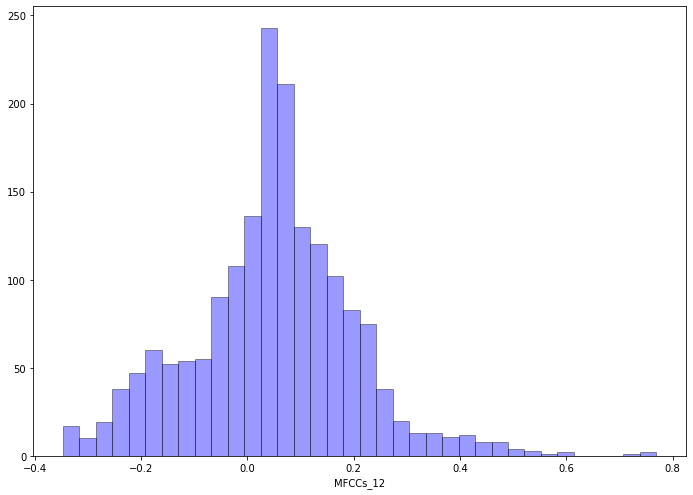

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


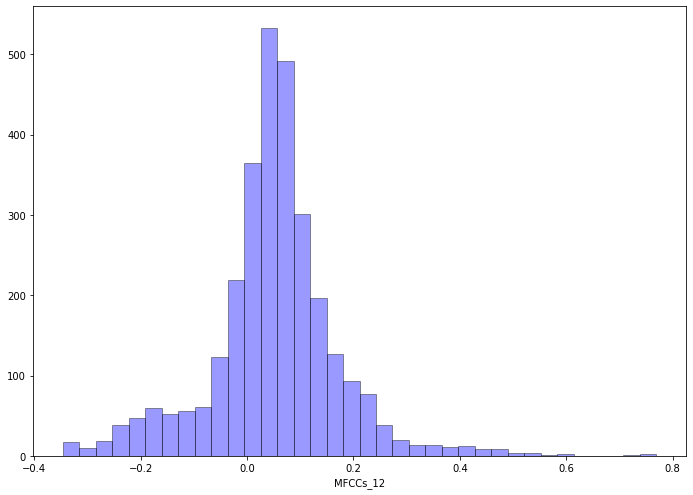

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.135)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [2.8579811077815958, 7.939999027741302, 1.4158252986040538, -2.0781203706274063, 12.8519851503288, 11.388857121626732, 3.0921147827158117, -2.8007303122010523, 5.75152226834716, 9.01424752384572, 8.432369284586041, -10.916369171434416, 10.530982934767628, 6.069698186550178, 10.491300087434176, 7.625276852046178, -2.521455461175359, 2.299942271964273, -11.95074766064161, 6.73250561033352, 10.349374685520388, 13.170232540593346, 3.309613799276561, 11.475812582063664, -7.555695072224333, -10.4243928264797, -12.148568499408665, 7.795646948431181, -3.809656723421465, -6.161250804279172, 10.61441612695066, 7.762089834730376, 11.806201238419964, -13.048779367627407, 6.944546164616329, -1.2666136812474529, -11.813445286134634, -0.8019037271869962, 4.446500720352914, -11.601359327321628, -6.418181518929637, -5.784873423161035, -2.872751753620589, 1.0751881747034226, 2.659418049828057, -4.265492200216817, -1.28647209554366, -8.946930572571425, 13.623653275479809, 10.3

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


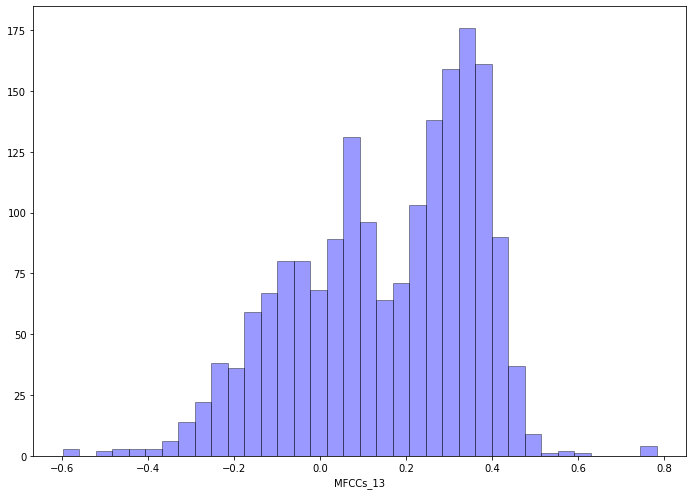

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


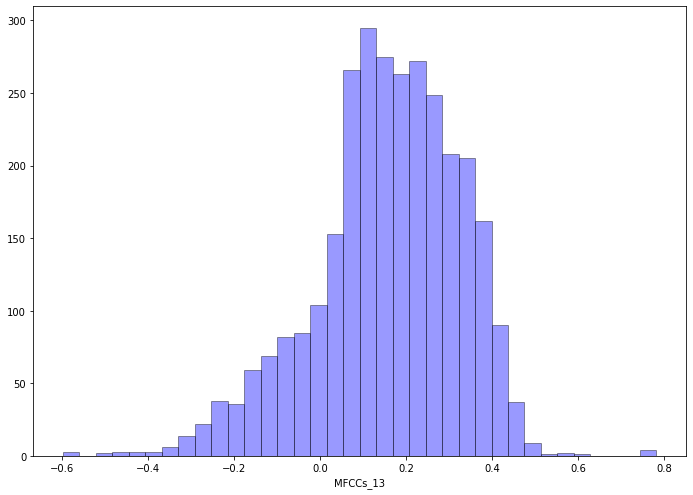

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.12)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [0.9383466039648564, -4.985096692427541, -6.662928190683514, 3.249077188848127, 8.612517399841074, 5.192108179542187, -9.865791132756511, 2.6822663973426404, -7.468022131644335, -5.81610191996651, -6.345300334392483, 9.046338979658662, 6.075680676761411, 1.372569241804432, -8.16662376617872, 6.126344142273197, 2.8557297909942267, -9.919651914339326, 7.917315525817728, 9.171156028508358, 5.7873144525075615, 8.818847348169621, 7.8125502540769745, 11.65956050594982, -1.8292829434413795, 5.093122656001427, 11.752357821108808, 4.821012627805511, -6.131785054251711, 10.081787762550167, 10.005199232124516, -8.619071505688813, 1.9899985238173563, -7.804711847087577, -5.091531924657988, 8.135585948868803, 10.122074920454216, -1.280860951697301, -4.2983708714903015, 7.524256869639612, -0.6444784349520187, -9.428314024668683, 2.7590426307834344, -10.215997319249029, 11.520897886064702, -8.151642650081172, 7.471559884531058, -11.149401350399955, 8.023744745111342, -6.19

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


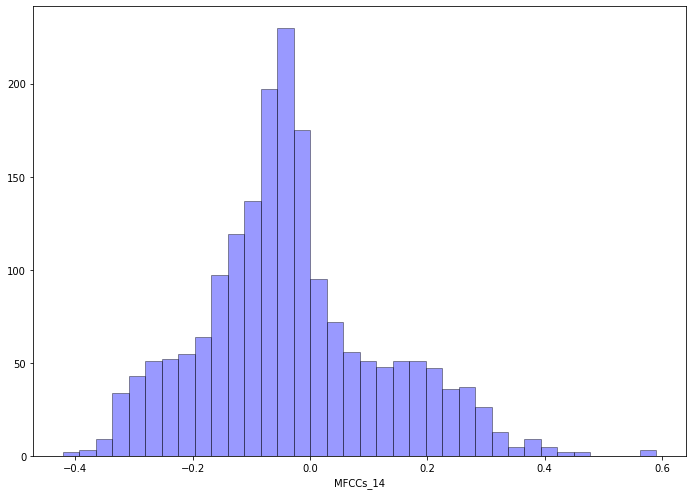

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


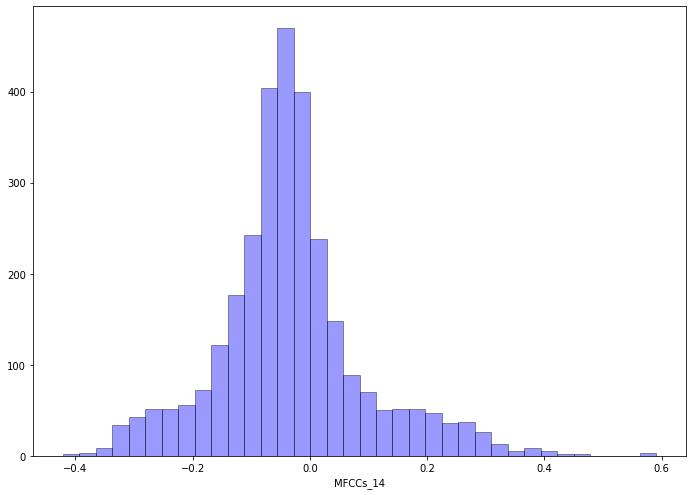

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-2.227566243190225, 8.904623915674073, -5.048917590977751, 5.156679470868888, -2.8981212812720205, 6.669152240167013, -7.695559545157101, 4.590407389881194, 11.931810419881351, 7.457822551857641, 3.972132297368599, 2.10510278517353, -9.877424827889886, -6.2336272553615, 10.83119519993213, 6.139422077241032, 12.403232154572777, 4.963541899217088, 10.8932672589377, 10.059526159279736, 3.4918582402772507, -2.1851374648308024, 5.613295826059787, -5.20380809086581, -7.33996008878564, -11.31136546547214, 5.014139380925987, 10.413572751380816, 10.68291518762014, 12.168307626725657, 6.465021979766135, 5.239930891653724, 5.34348783966957, 7.61517605484922, -9.62909119879083, -10.774628242378803, 12.223319147816374, 8.200191529061097, -7.087125222553415, 8.611064352384387, 1.8767343597583064, -6.801271810417503, -6.839483133923655, -9.406060215427743, -11.233639655872308, 7.112955539984491, -11.644720784591184, 7.855070636635374, -1.6888054874019929, -4.8764952642945

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


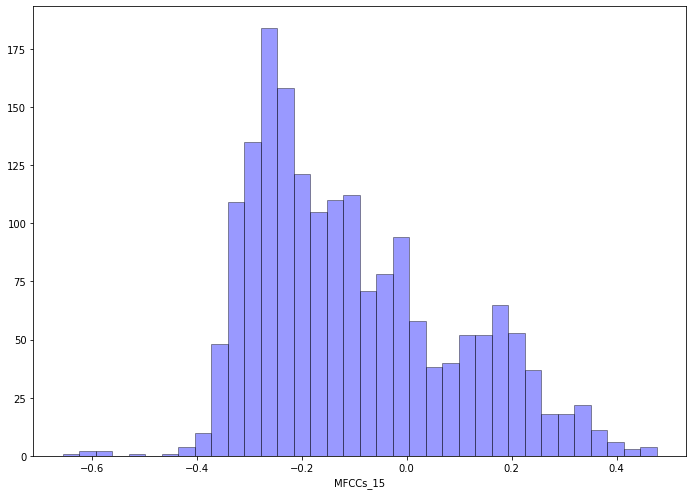

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


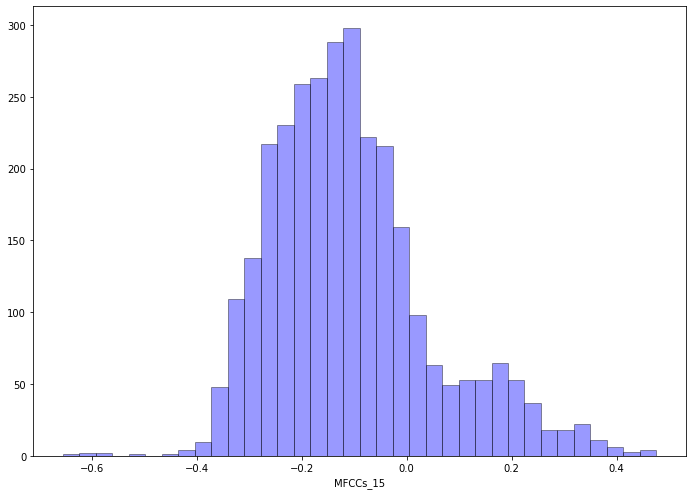

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [5.382229717511279, -7.607173117787076, -5.818357802217569, -2.0148368216882613, -10.462767751089558, 9.006026531592063, -4.355987821164838, 4.274195146843716, -9.589946759091935, -2.92945713220172, 5.756718094727622, 7.457954613403395, 9.524053701921943, 1.9083821653550048, -7.278444130728902, 1.8581870135468488, -6.358798287348137, 3.51502839747754, -3.267470965236922, 10.523863122529928, -9.923635656756971, -6.380803652303892, 7.332207116126391, 2.70683224475284, 9.069544268869333, 8.995718897501053, 1.5850075164992563, -7.349643576843707, -1.2241239563402395, 6.728165417263638, 1.9610917486747013, 8.032346224777005, -7.674587394291127, 2.785076971827628, 2.486410724617812, 8.64987030551919, 10.21939971711774, -1.3724463366155444, -5.948438966445941, 8.514368909791273, -9.234657111920312, 8.561880311840557, 10.045363427443608, 2.2027230666021325, -2.977507365254506, 2.9450038246617303, -9.75177692032243, 9.226599988079698, -9.11076346700184, 9.69197064836

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


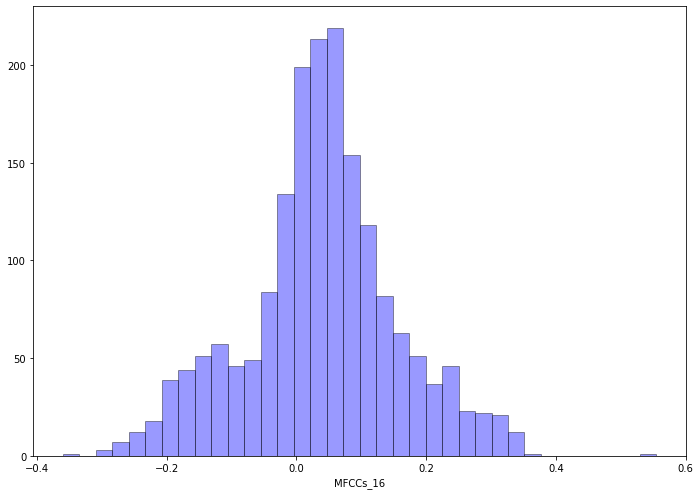

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


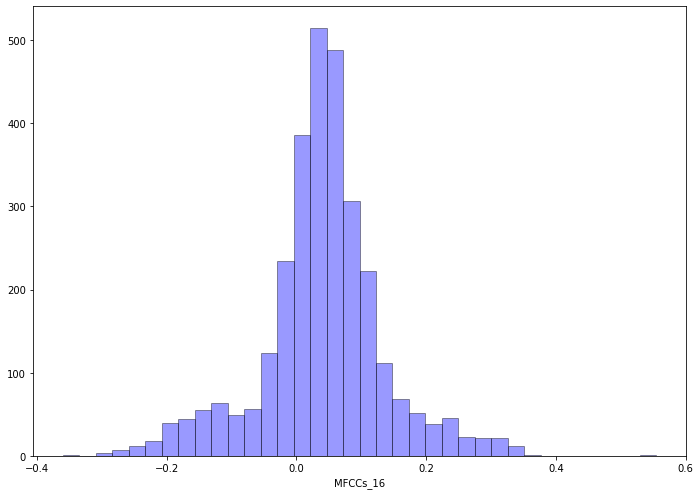

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-10.478827492166404, 4.585223916047226, -6.99011727654896, 3.0405332986845552, 3.6073073127075217, 0.6886076029175793, -8.521643924605534, 7.081253658428938, 7.594737373608995, 10.507202582438133, -8.098912898576467, 11.606065216408034, -7.965811273955671, -10.724216107811928, 6.5060042935993065, 1.233645798446004, 9.162990266871256, 8.167202443000606, 8.838374873586625, 6.095976223595324, 5.819758560162797, 6.8124574295193, -0.967814709072666, -5.981636296927164, -9.933329646278027, 7.495650720945038, -9.057190027444182, -6.598915696554906, 1.1426099632546245, 9.587476773088836, -8.07869274161554, 2.428724028757971, -11.432431507796217, -7.232742524641602, -10.935094028418268, -10.255183546997232, 3.085732109889319, 4.122857448852625, 5.890166372769956, -1.5720307595125025, -7.3309661670084925, 8.2130890177737, 1.3627609370884697, -7.245158380382586, 8.331961132027523, -11.003884593849795, -1.541106137923432, -1.5620594604584426, 9.56016030189575, -6.68168

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


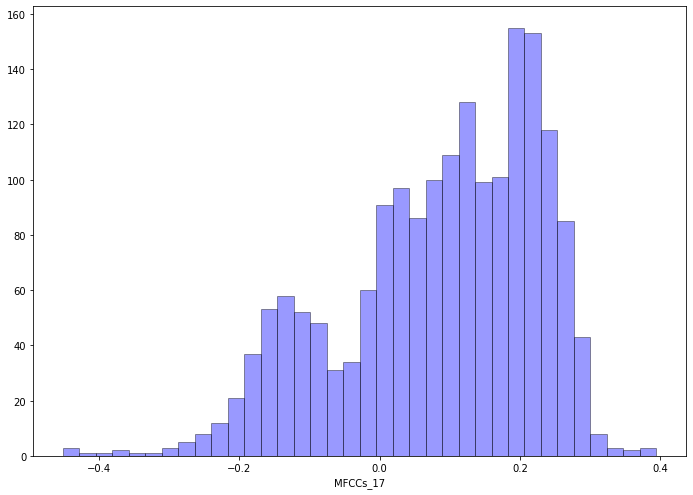

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


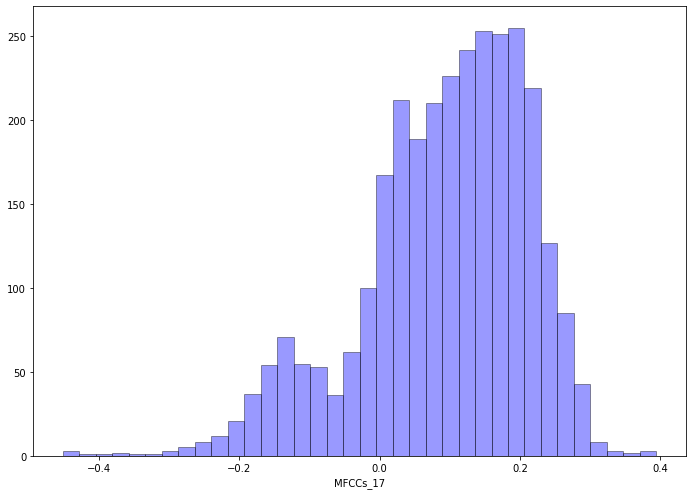

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.115581100863364, 6.84473838964713, -4.842274678350037, -10.721776657210762, 7.842361930195039, -6.988530951398866, 7.801270103062242, 6.152301893562251, -2.811275275859739, 2.453534584133994, -4.2599941826084295, 11.682513227802689, -9.871855101780032, -2.495510183094156, -1.8795729787702928, -10.290922274166505, 4.059921299229033, -7.6782927918273955, -5.08155473179529, -10.7281825180254, 8.140238314287885, -3.019355713525755, -6.9504975556212525, -8.739661680119513, -10.568656964894114, 1.783549553742929, 7.184591721911633, -3.409043049515628, 3.246512909687615, -8.42001871395549, -10.001883038231624, 5.695020707555589, 1.2539489339435868, -2.592115393053094, 9.703959801614811, 7.256497435866837, -3.611173401449979, -2.9376672859631547, -1.571532018090867, -4.033099618852957, -4.731778419310763, -3.72750163259468, -5.410614133494399, 6.112417339117648, -1.6887467734617123, 5.176489240925393, 10.595803922606386, -6.1743573292539375, 10.855503400043473, 

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


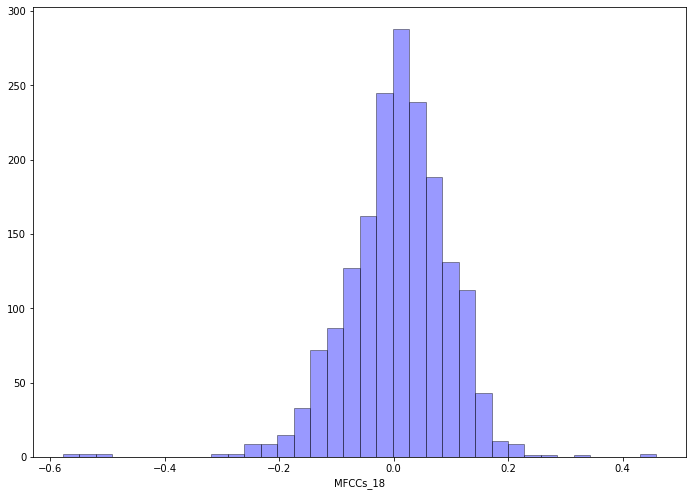

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


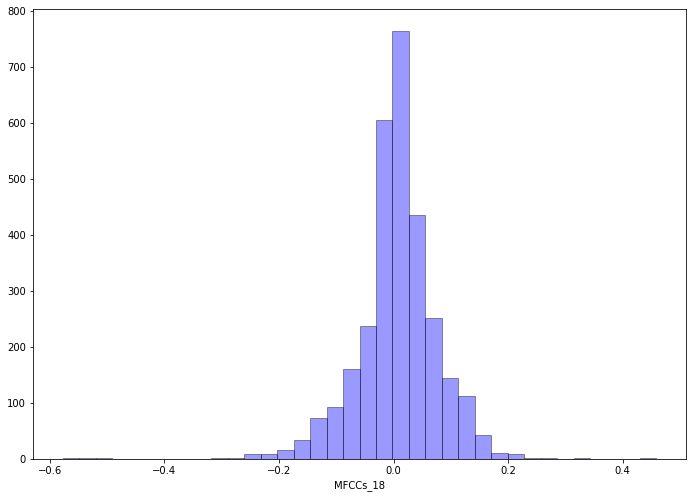

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-9.432263347598578, -3.9697492637890246, -12.777342096268512, 12.846193053274122, 11.055487810983458, -2.090808303195571, 12.930797856653935, 12.31728048501787, 4.425972444976695, -11.802860290439869, -1.849324171608897, -3.1057053572367828, -0.8824172959773975, 11.684543474901742, 12.026065742843754, -6.09647061462815, 7.723270750604807, -4.718787937510699, -6.389944784513355, -5.049919676403828, -3.131008226358388, -6.378097822784546, 5.233532588913556, 10.285080960750571, -4.905668546317534, -5.767786528701072, -10.875824148938836, -0.7311941893314664, -10.594964065052464, 3.0045845992243114, 2.14463113410175, 2.9642922233136986, 7.124245090931904, 8.729865593818296, 8.154432950088623, 9.877979556131388, 8.573296915805152, -5.099528490730405, -5.1274958650372735, 3.593400758055182, 11.518080455741986, -11.425669862980357, -13.00373803528154, 2.854176840158134, 7.108571660701831, -12.636350351946556, -6.276260760489111, -10.73548477844614, -6.864831596872

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


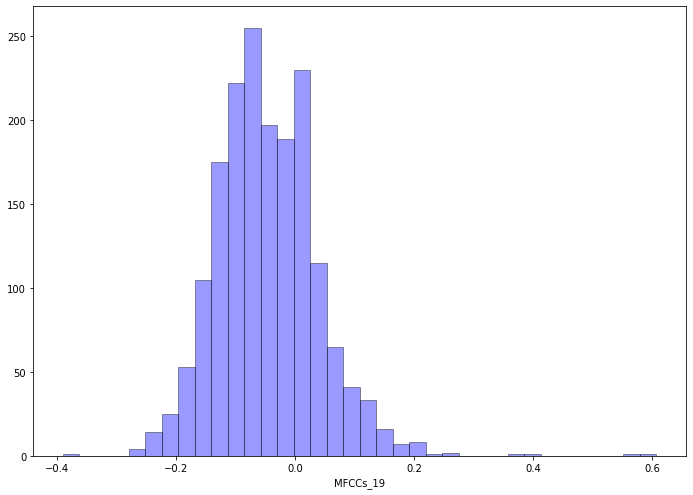

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


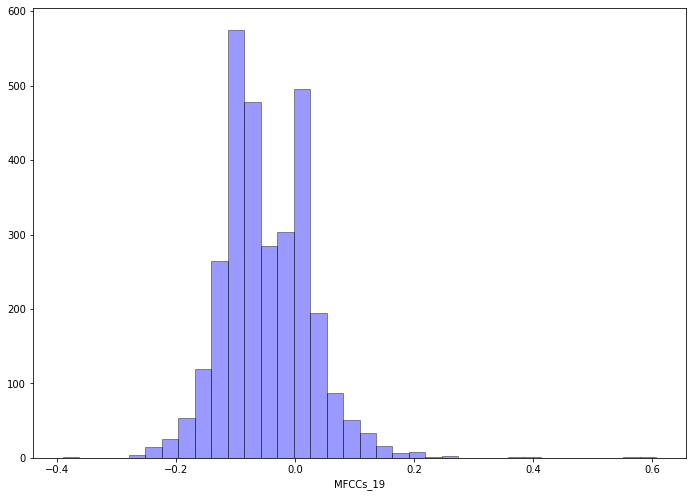

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.11)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [6.340624105535311, 5.563734800794658, -0.6940193828051049, -1.0818220439032429, 5.428762969124904, -4.35182745031972, 4.128995394646, -6.9607941726727685, -0.5973039820412636, 6.3324897696252895, -6.767275749706068, -5.452947412715575, -3.883533526372132, -6.413247311469826, 6.883388129613627, 1.8784938365977184, 0.98863337427867, -4.228147051263523, 4.720405392294782, -1.023960787178826, -5.707327314127795, 4.122204698765272, -1.8777143458677168, 3.7202068060739375, 1.3656826402322026, -5.172246791875925, 0.235131099890778, 3.686415272431767, -6.37489946154396, -0.548581126508811, -1.6324752609509412, -6.061083503869288, -7.274189466707054, 1.6588152198097676, -3.772018532893651, -2.459657330215437, -6.024592297886623, -0.9465073755751768, -7.274076098852386, -7.451603279463855, -3.1954053477366022, 1.279852316006573, 6.34430150991331, 2.109872523368012, -2.217835964140404, 3.724300923813845, 6.337662447522428, 3.311263005943121, -5.308163813761528, -1.175

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


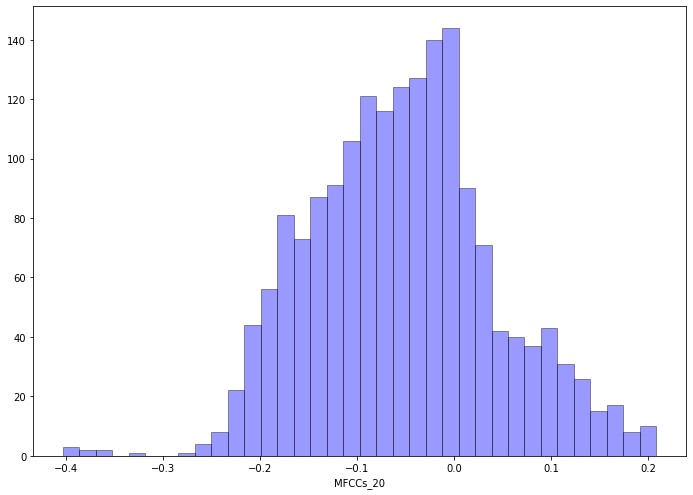

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


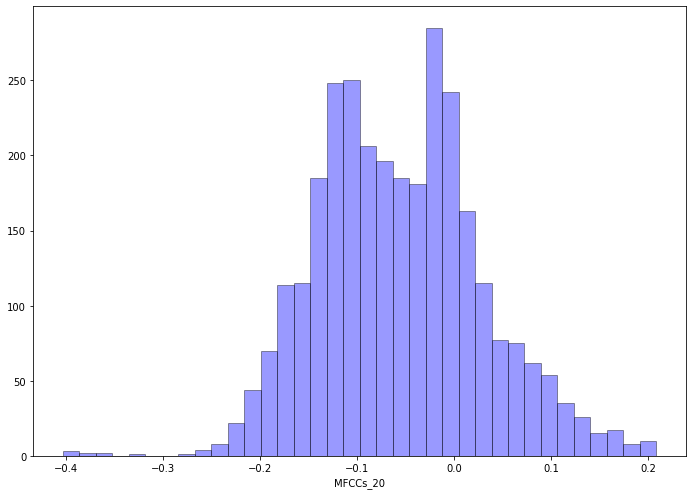

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.28629139242828, -3.52437169084016, -2.6879166666091905, -1.9894866068371089, 2.6386467725340483, 2.3581913294024366, 2.153417319864038, 1.1690879346659957, -2.7688232390233964, 3.137647132841951, -4.887198238811127, -2.468093496246073, 1.2238864703801182, -3.687137164864693, 4.734629884472341, 1.0136464463858683, 1.337295002591418, 6.013907360185852, -5.61397648120482, -3.481123972526305, -6.002831385052985, 2.1830623305840384, -3.6594936572104793, 2.350464399134455, -2.4610603738187398, 6.031806420681738, 1.782630825852563, -6.36602320431152, -2.387302427573298, 5.769618095072268, 3.181305010682229, 3.973553941721936, 4.097428449319798, 6.315742931182635, 2.189514649476096, 3.8332945418264543, 1.2111364062299534, -0.214601279988114, -1.4879676373350383, -2.1380051654763603, 4.012789117290162, -1.202029464231586, -1.2372437515945114, 3.518143554358077, 2.4578769973370607, 1.3996545283955033, 4.858764182403609, -1.604759630845626, -4.173330998093343, 5.68

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


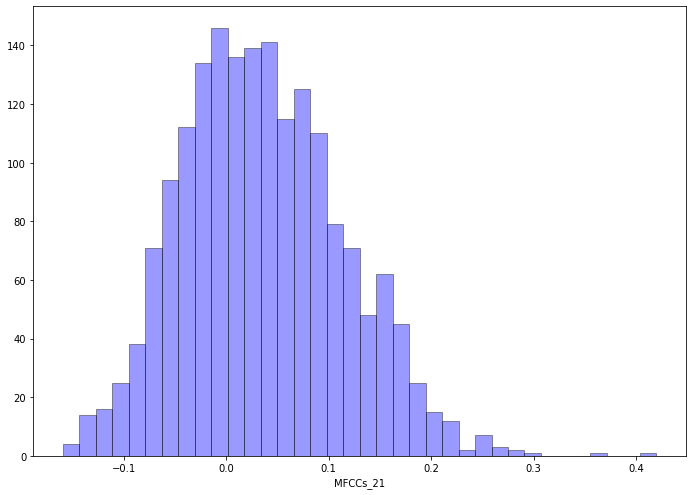

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


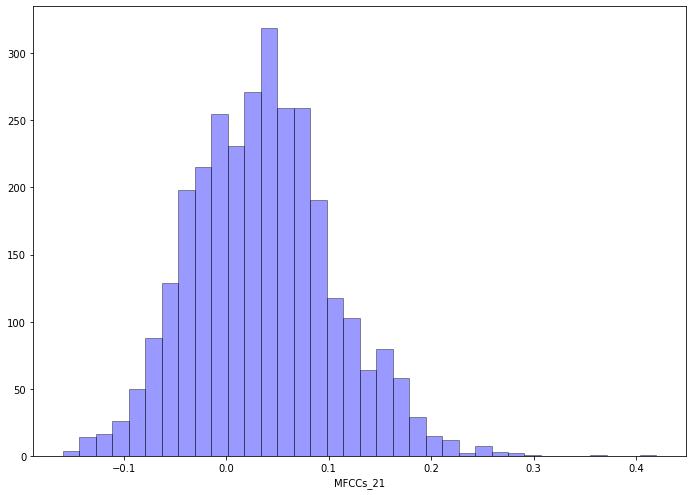

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-6.439576049588627, -0.890341878361002, -2.75658430139422, 6.089173164330112, 8.396673993902887, -1.0650322330987656, 5.92404797085832, 7.693234400828492, 5.263616906398844, -2.914923923009129, -5.952442942990267, 5.653782592437045, -7.017851199547976, 3.55168904309716, 2.899514074015453, -1.7514683461730698, -5.313889823772286, -0.6628521243226659, -3.893412375265285, 3.8233831046141, 4.483327105341783, 2.751851034852413, -8.40949865154454, 5.896782187322238, 5.047653635394819, -5.800980759588734, 4.593592357328686, 5.446627003913682, -1.6413377464360766, -5.898009470354878, 3.988053645541737, -2.883487801641569, -3.8903338884876018, -5.0489940181368524, -7.239180537364653, -5.832280726525097, 7.019916720931599, -0.9331631825791592, -1.2000472806254496, 6.661017224854108, -4.395555492718083, 2.6724518457932747, 5.9573444999377205, -4.382533416717839, 7.027354476842497, 7.30255556817018, 5.053455564328304, 6.818330213438939, -7.339726774080714, -7.926600230

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


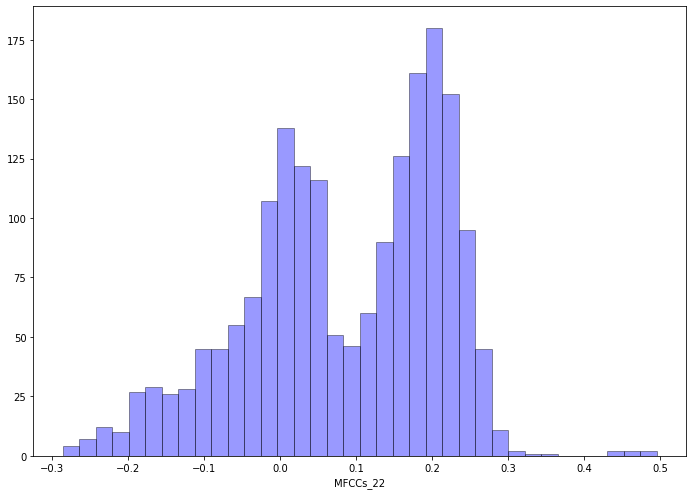

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


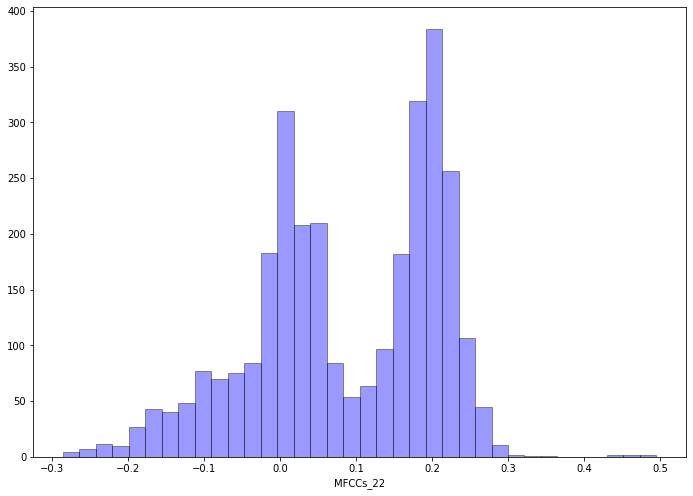

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})



### KNN



In [ ]:
# Dataset to clear

currentDirtyFrogsKNN = dirty_frogs[1].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

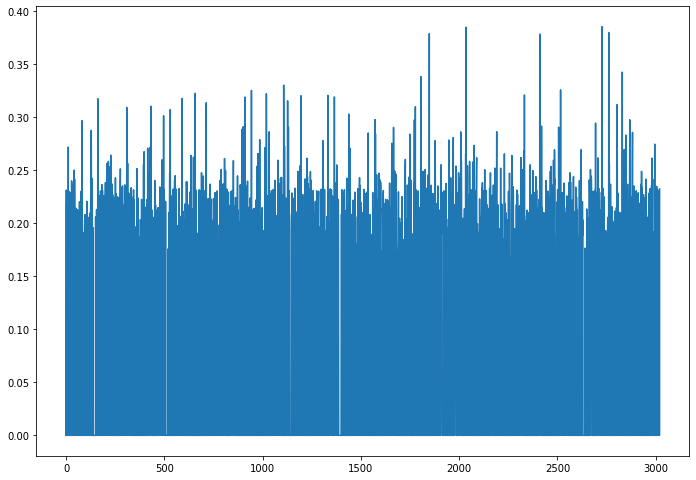

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

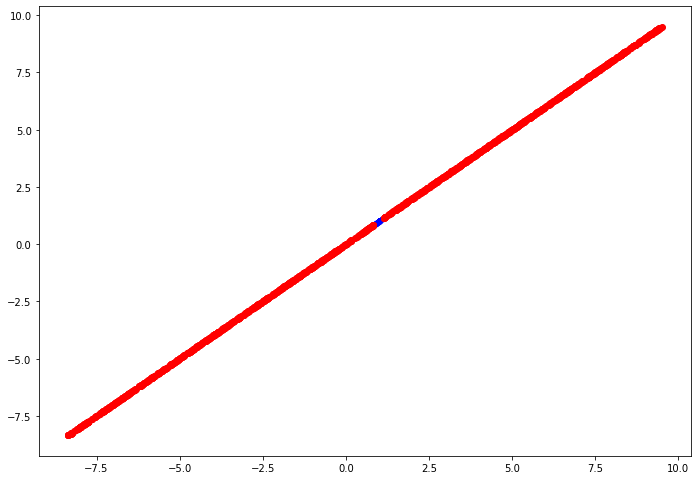

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.11)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsKNN.loc[i,currentAttr] = currentDirtyFrogsKNN[currentAttr].mode()[0]

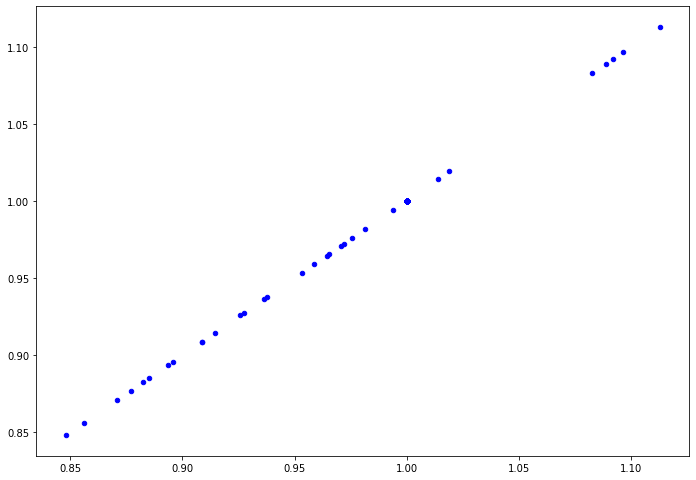

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2' 

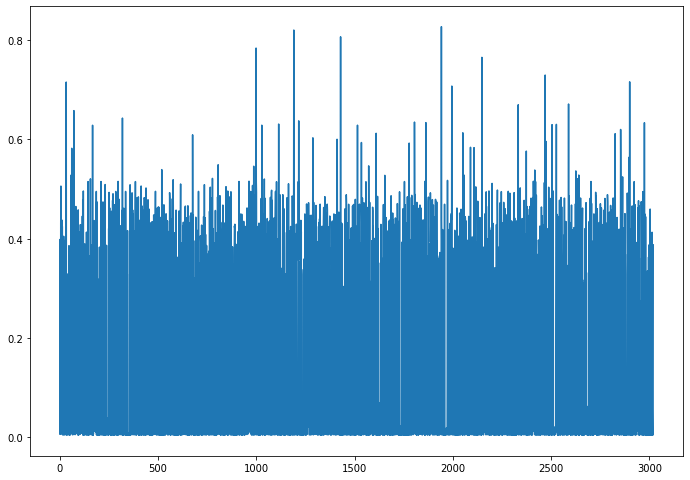

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

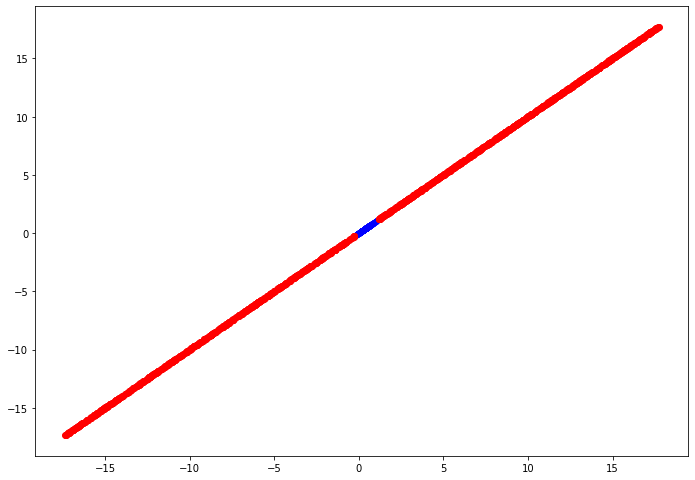

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


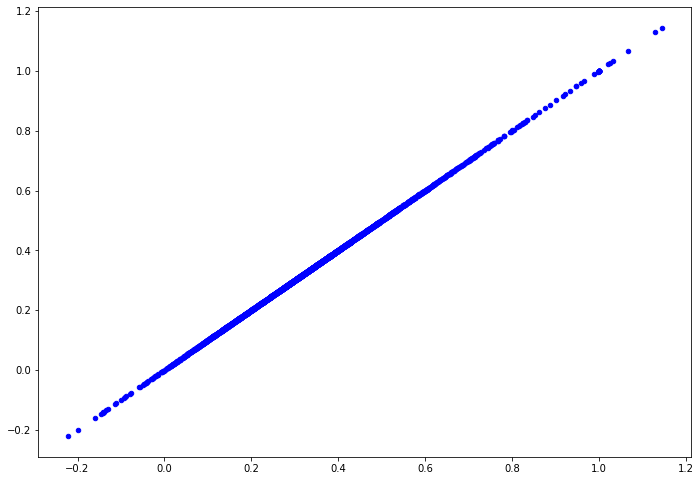

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

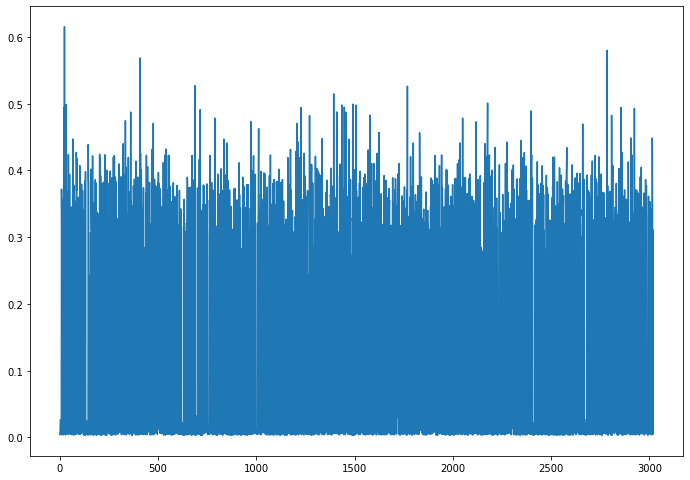

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

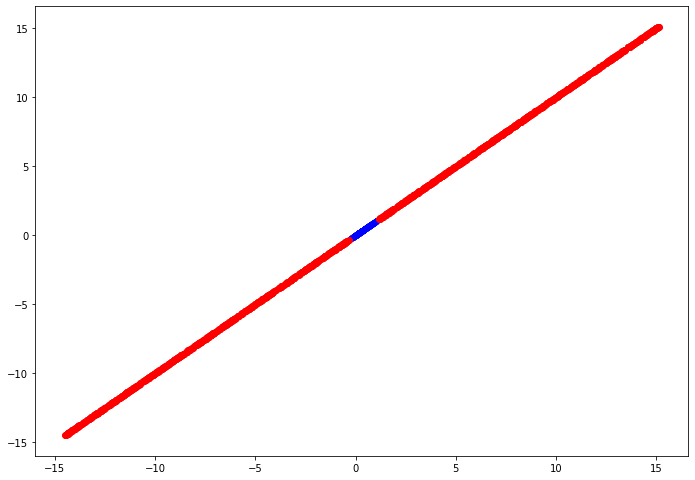

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


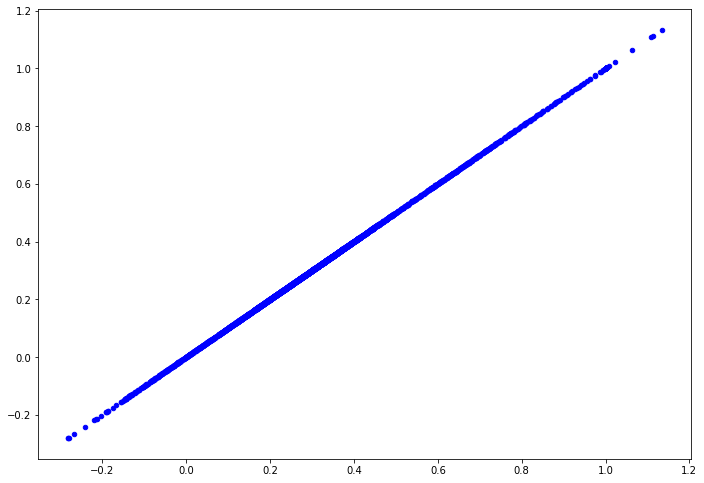

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

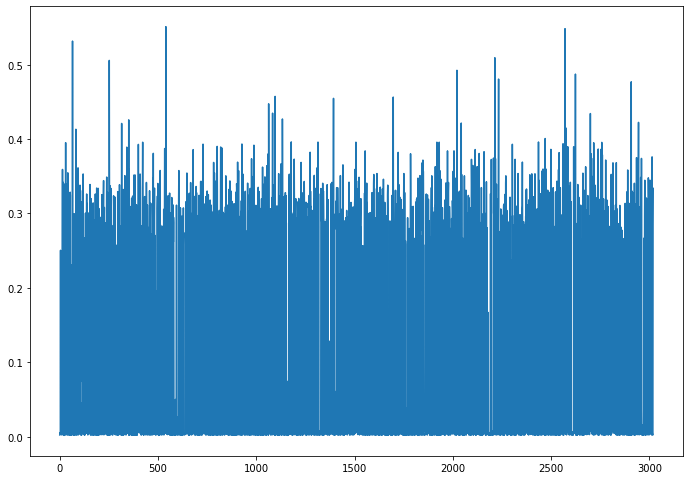

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

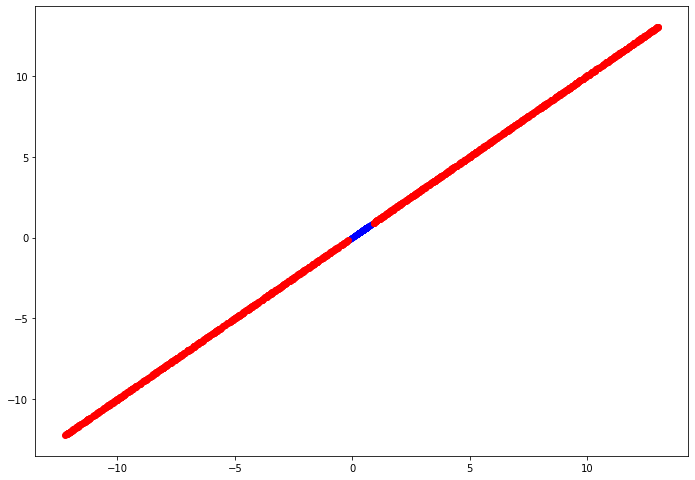

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


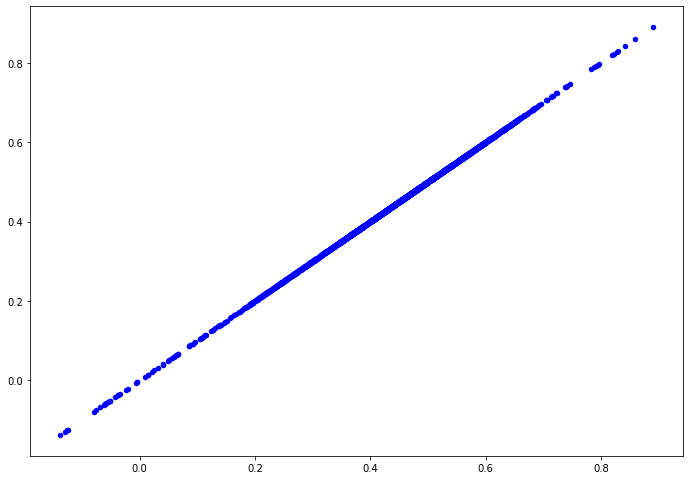

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

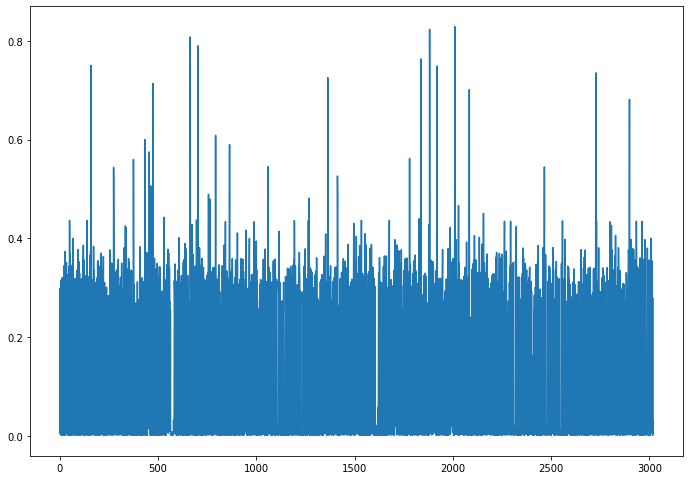

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

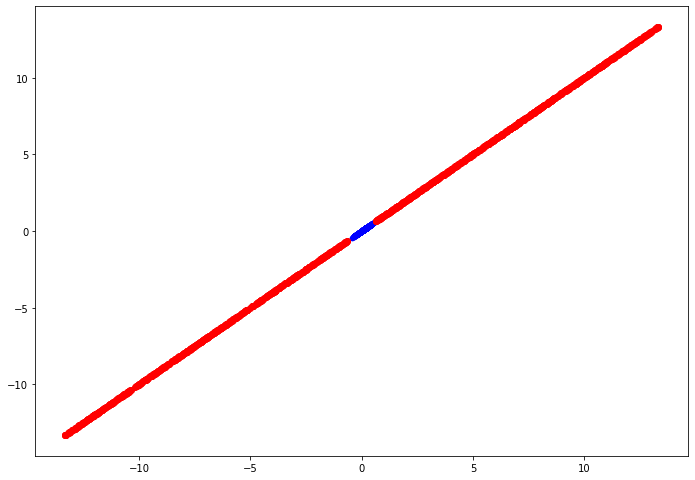

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


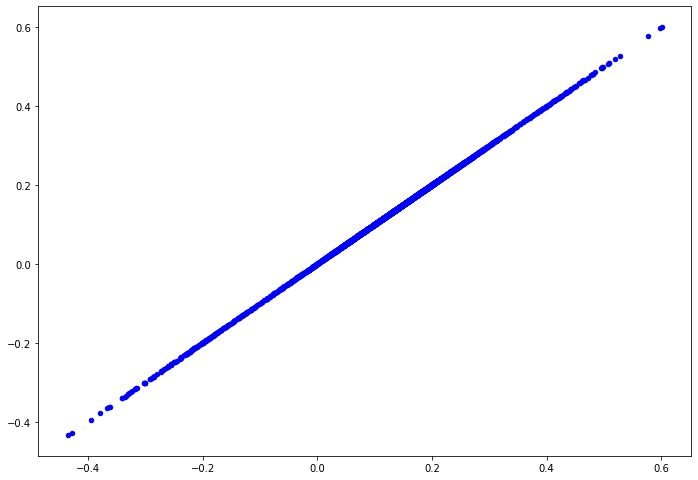

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

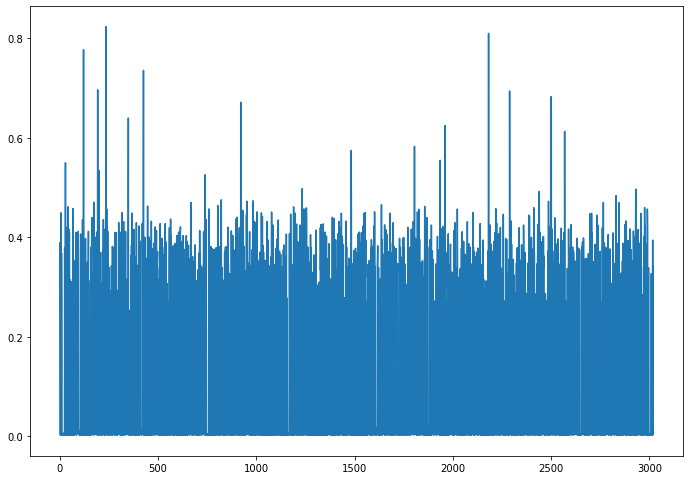

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

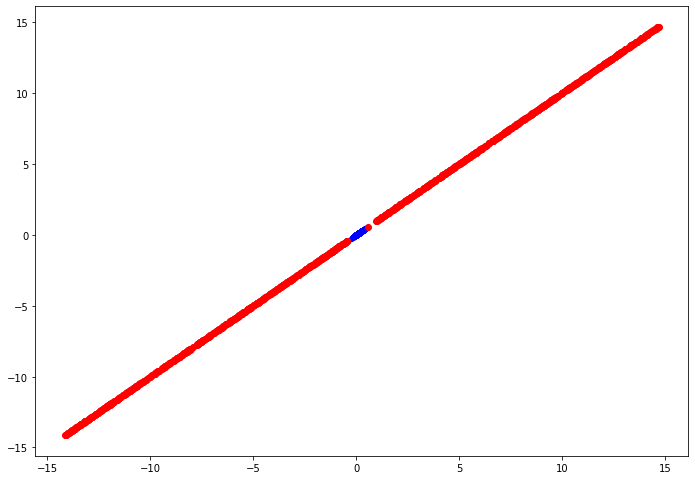

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


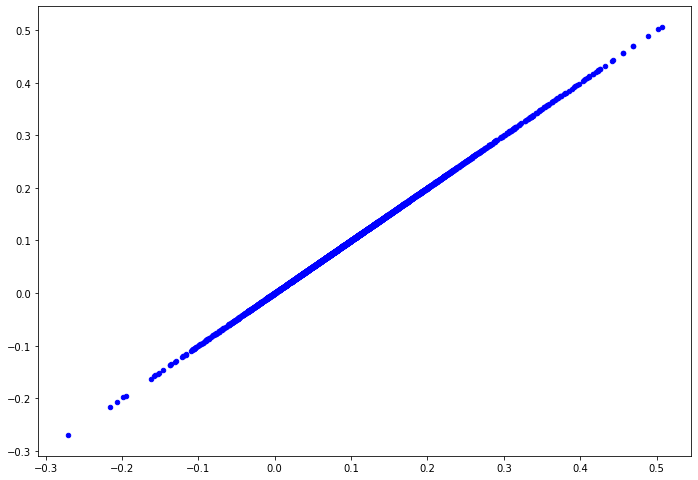

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

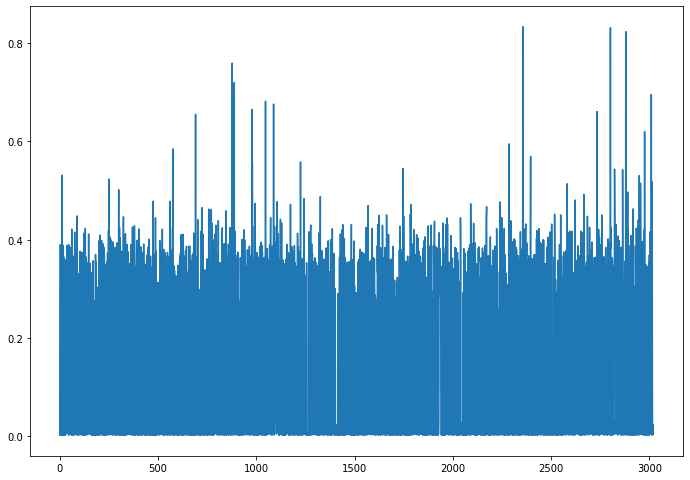

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

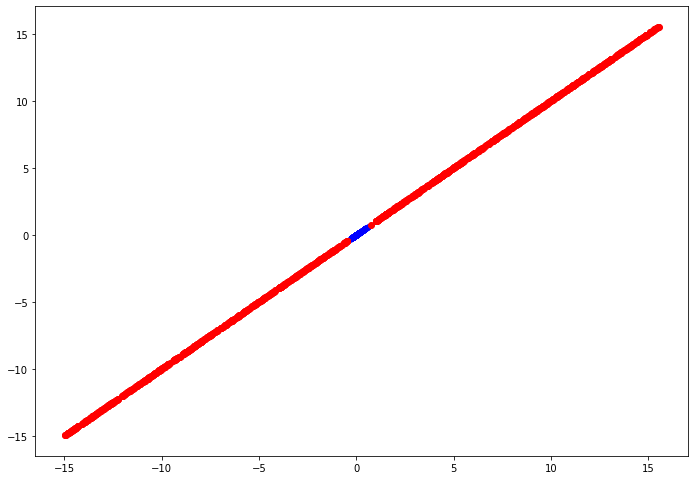

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


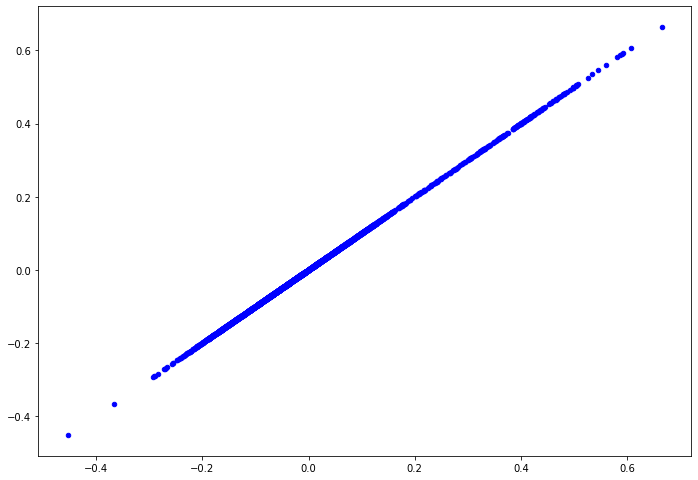

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

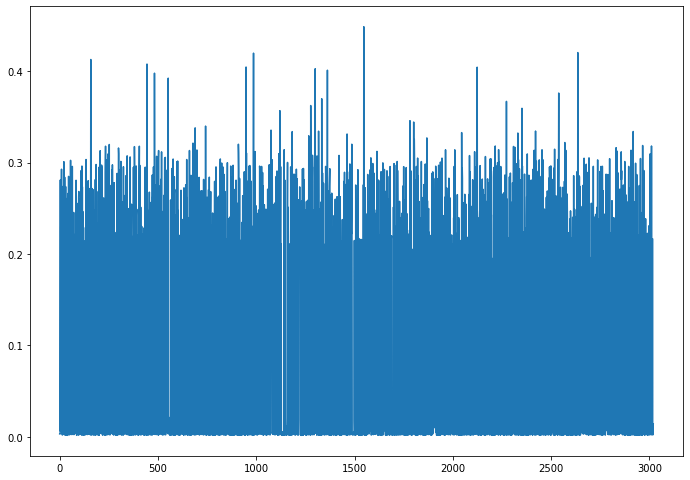

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

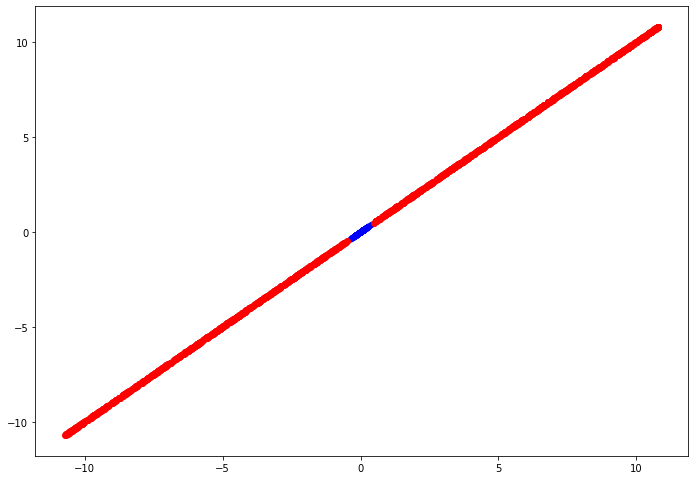

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


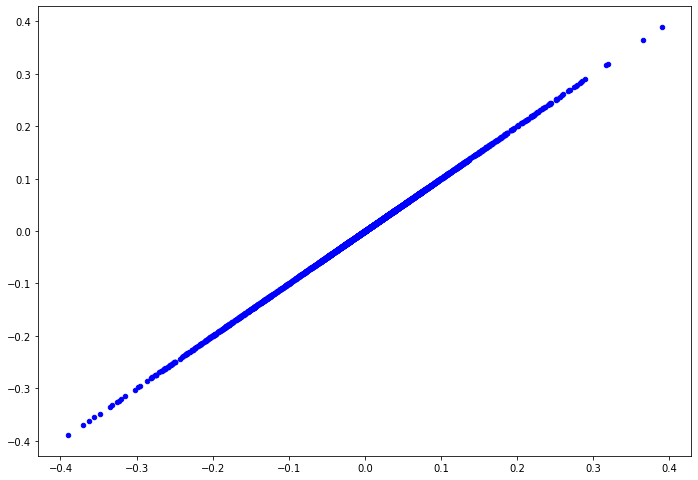

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

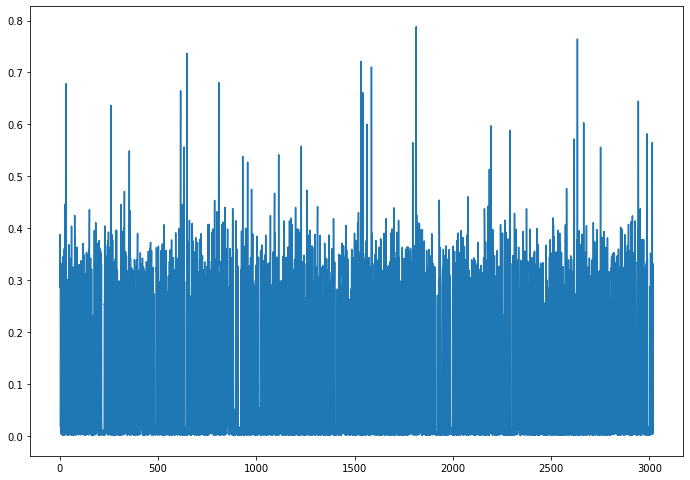

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

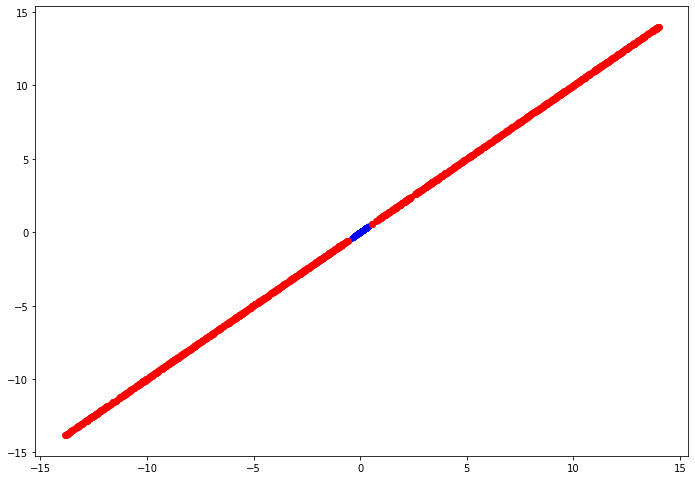

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


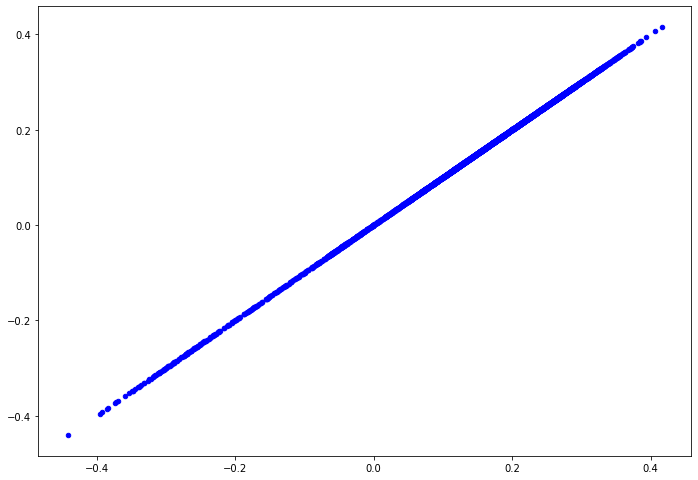

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

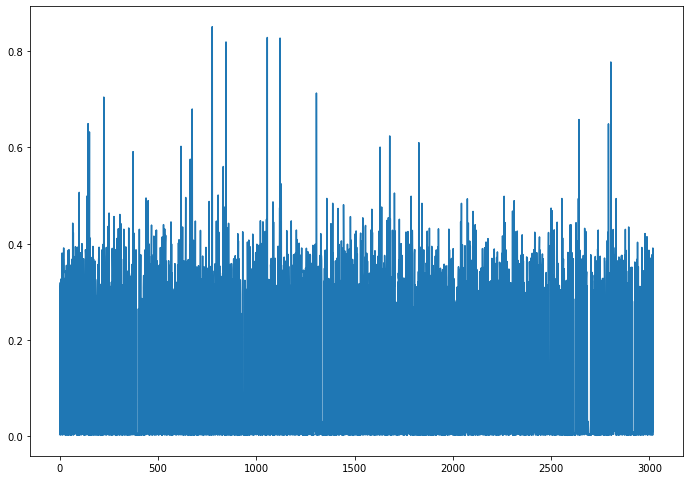

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

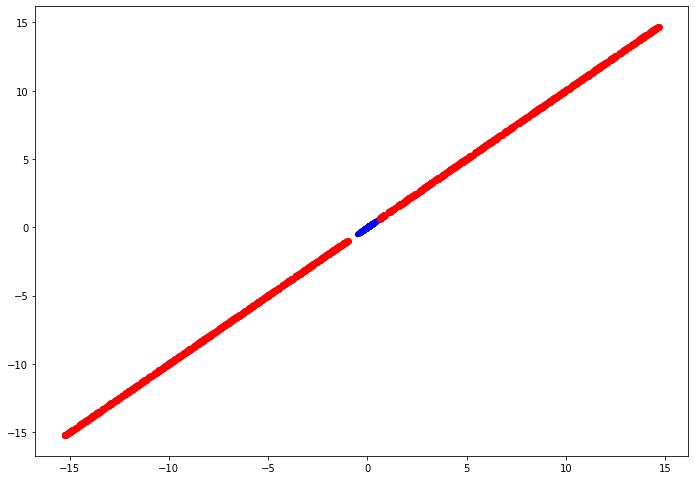

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


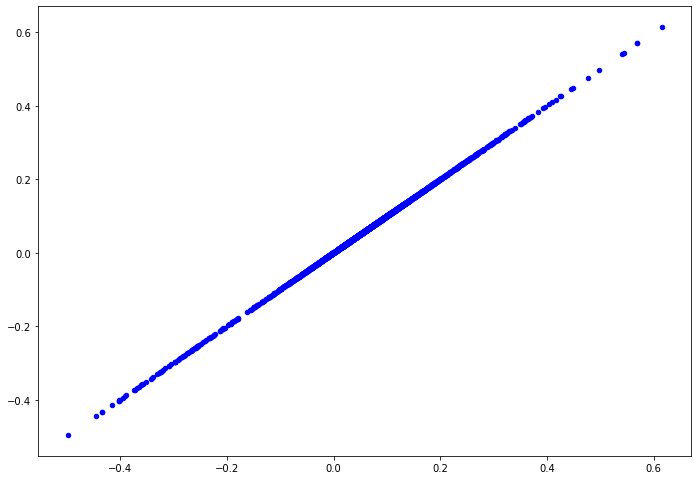

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

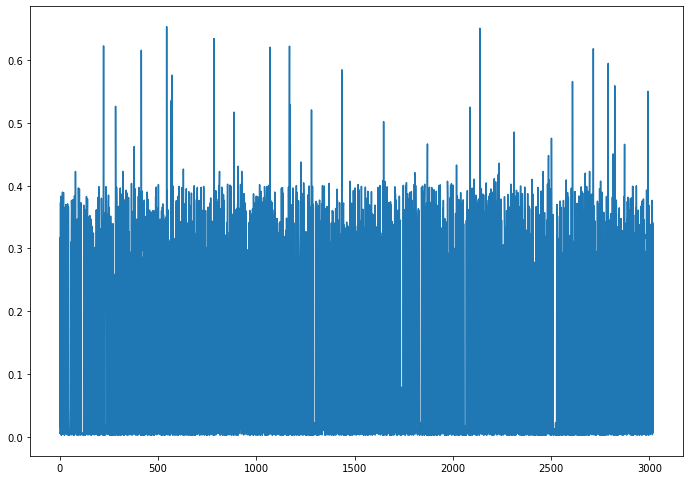

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

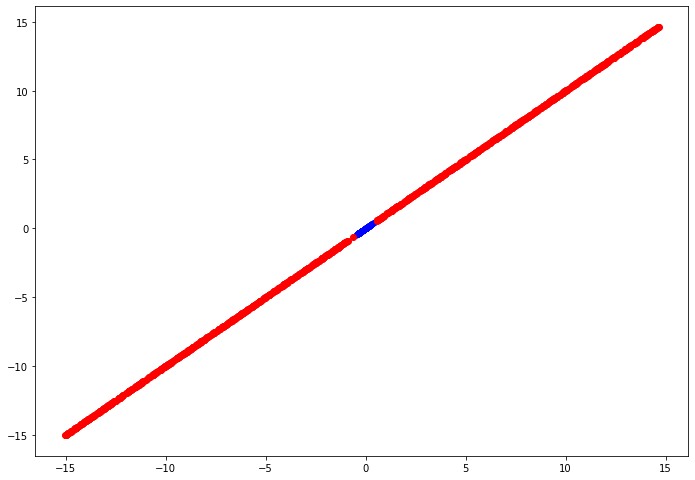

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


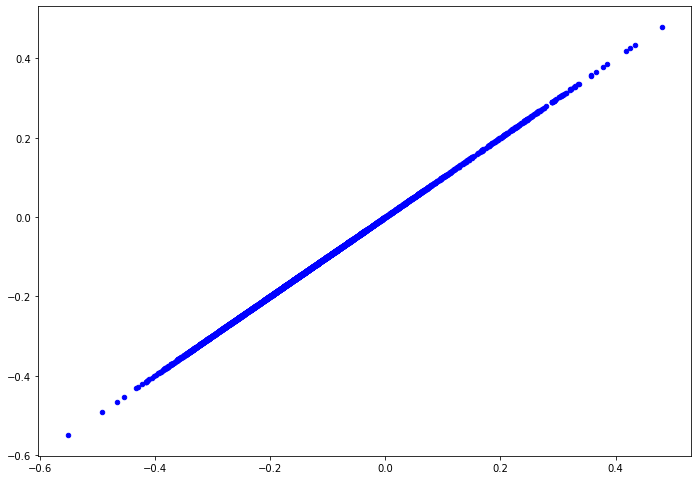

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

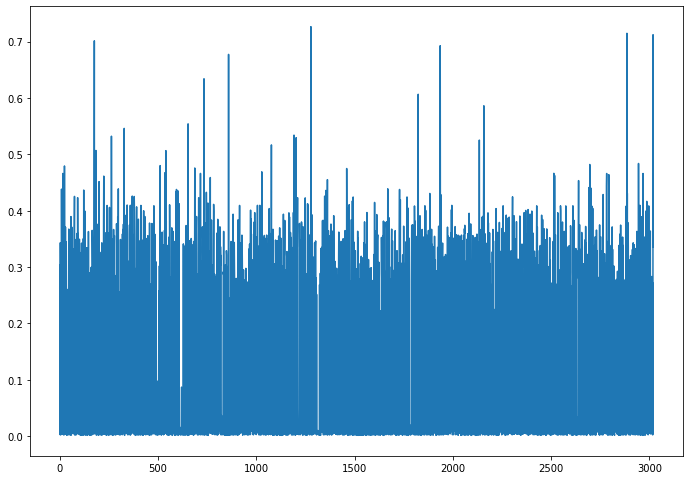

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

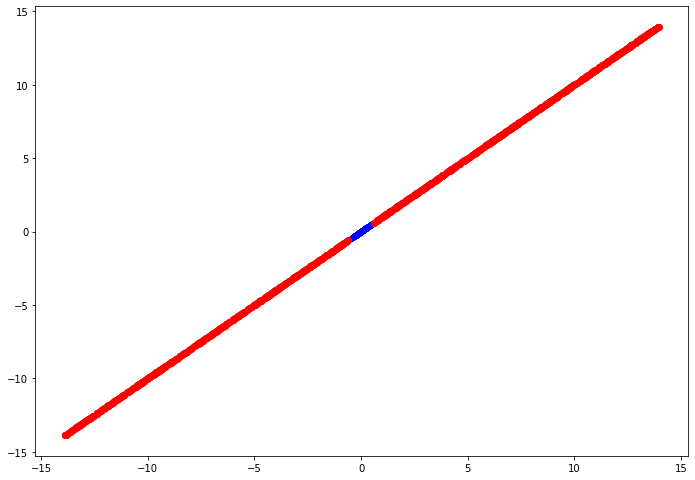

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


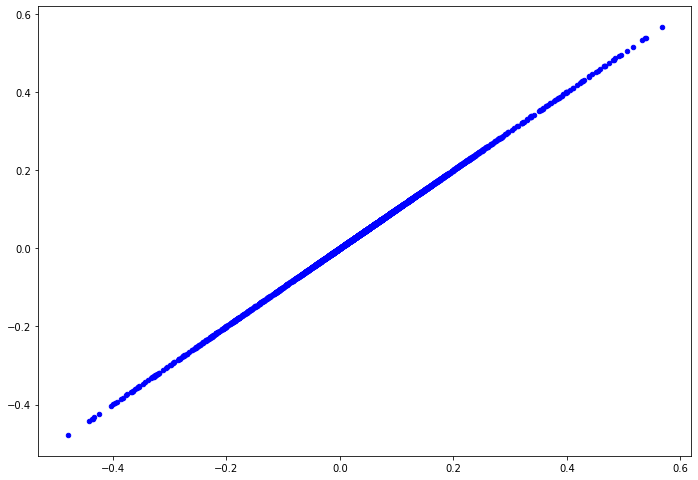

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

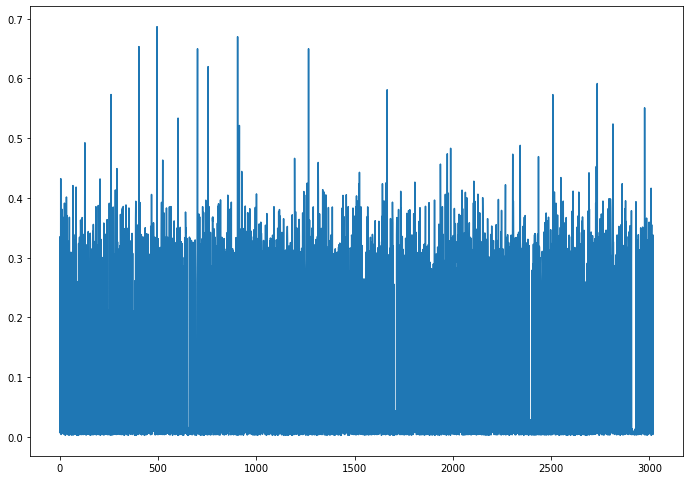

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

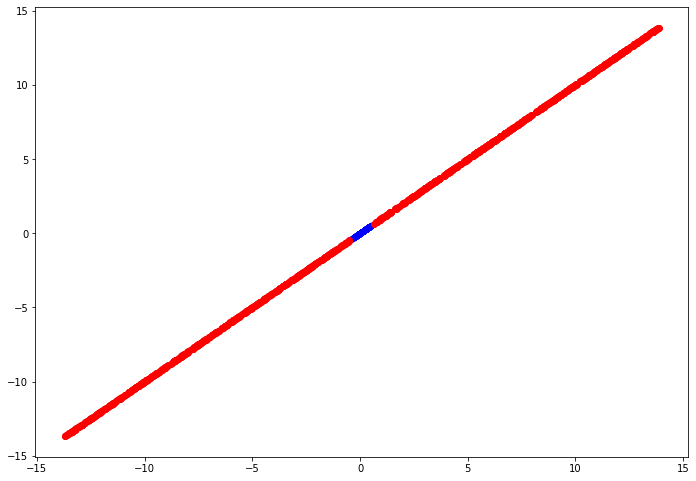

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


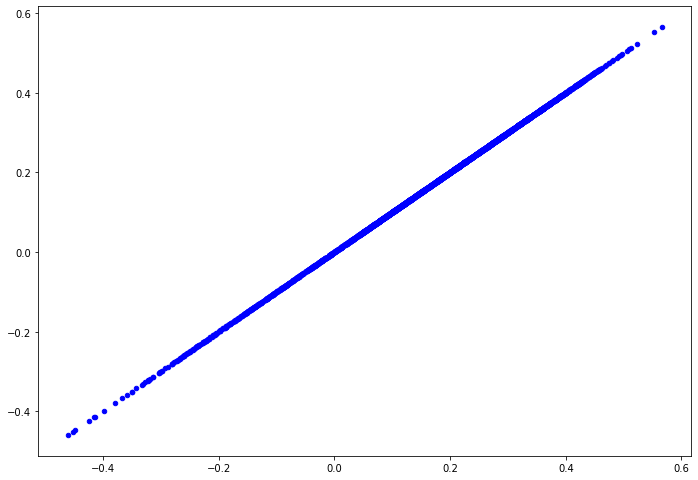

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

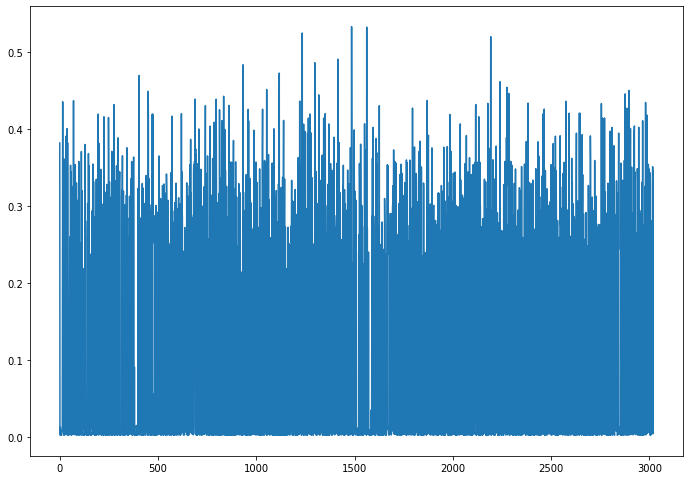

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

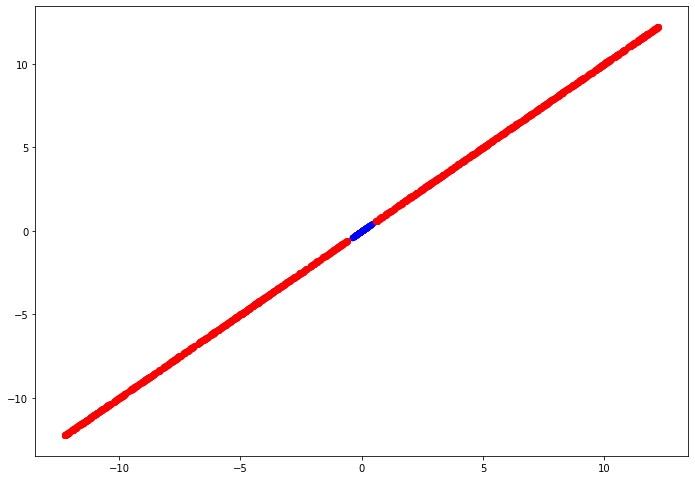

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


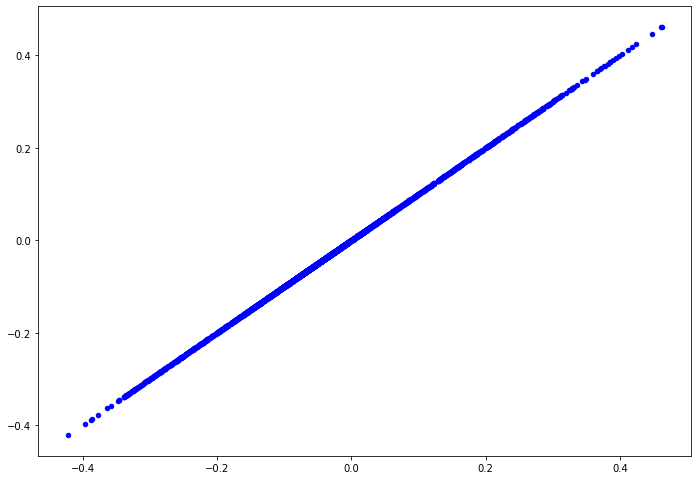

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

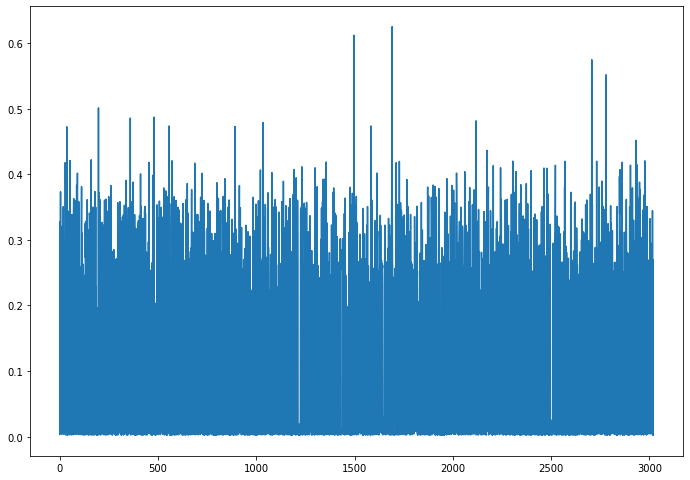

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

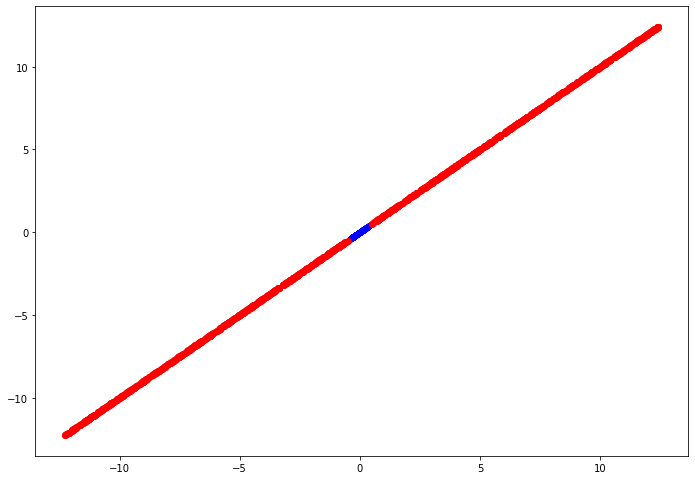

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


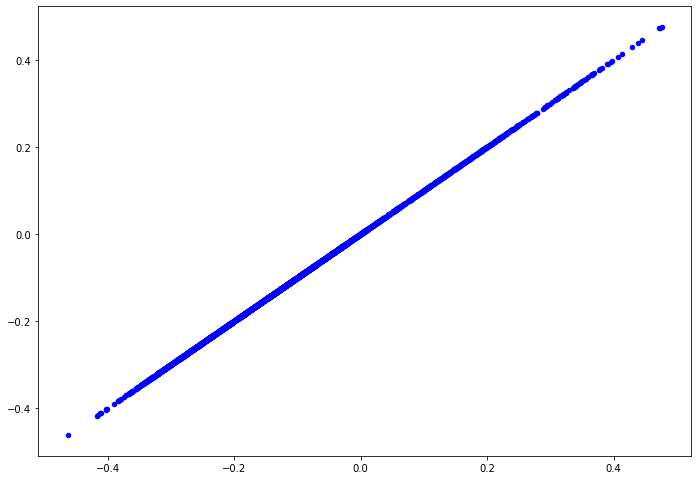

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

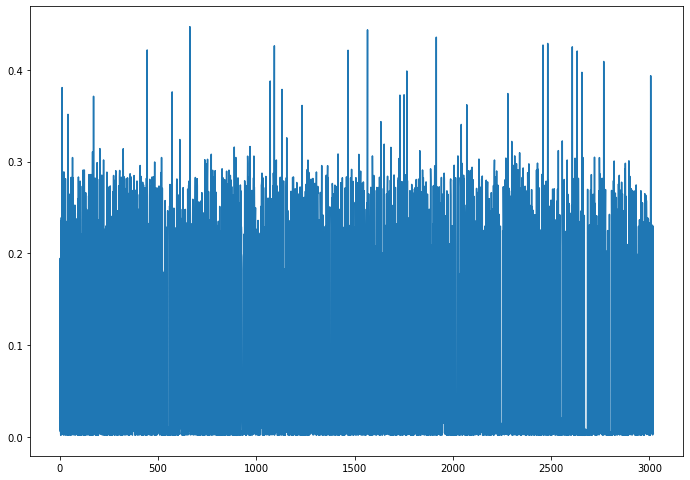

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

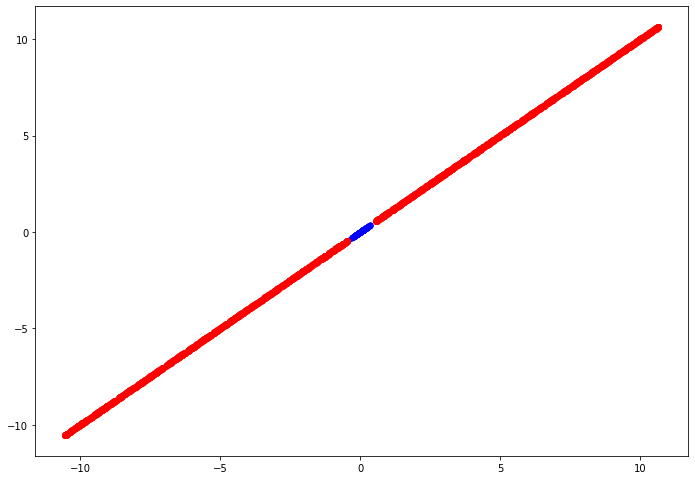

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


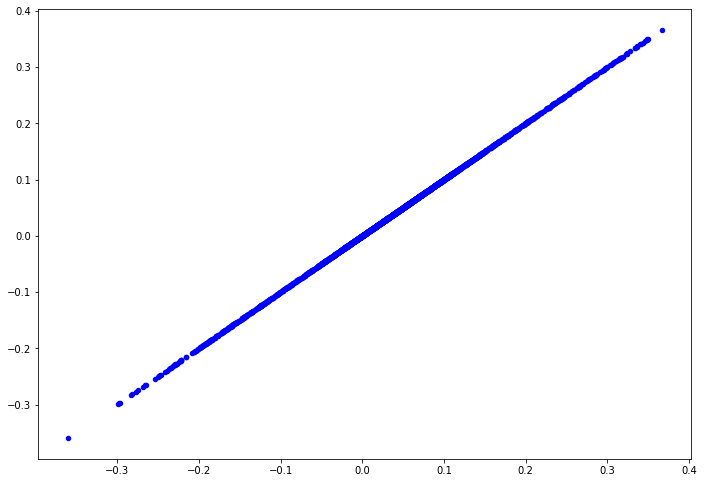

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

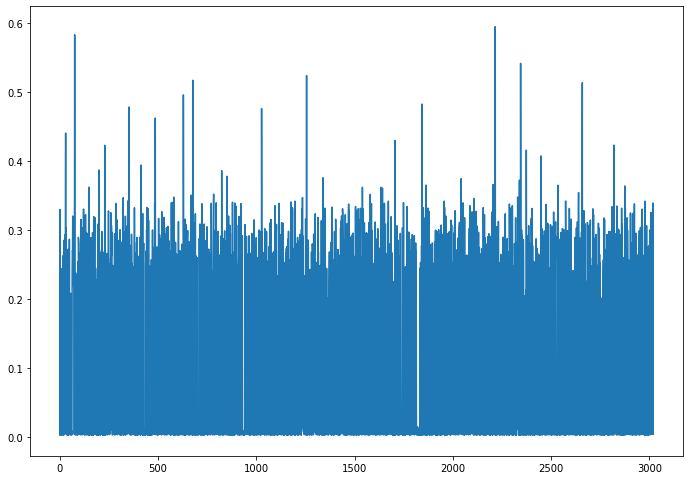

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

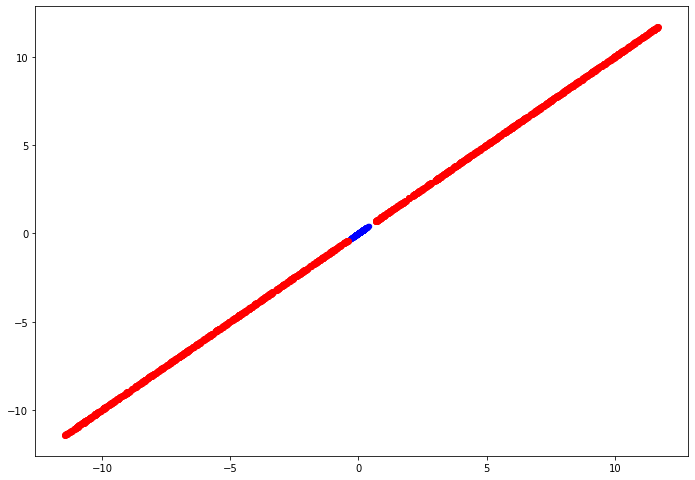

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


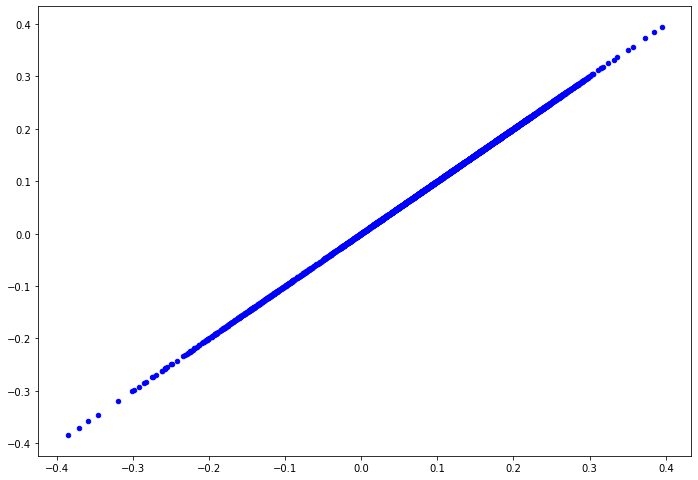

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

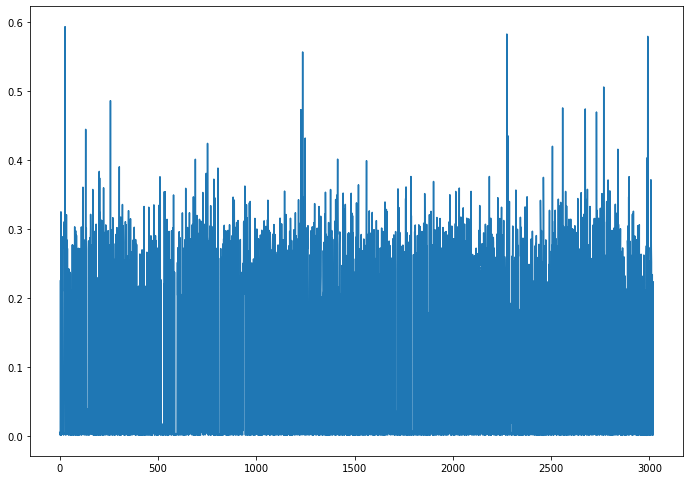

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

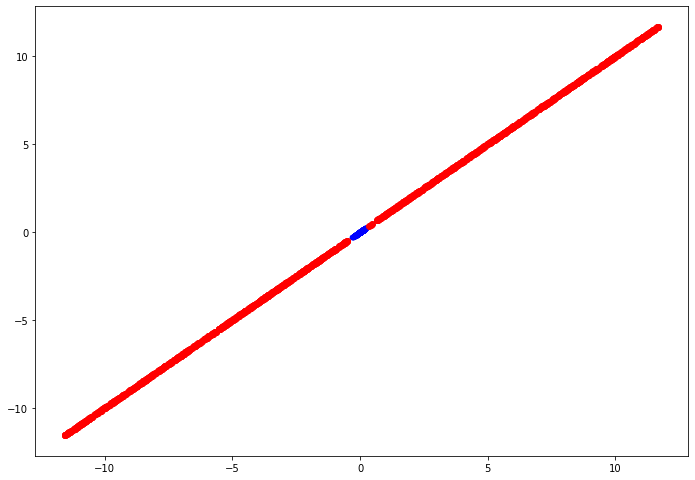

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


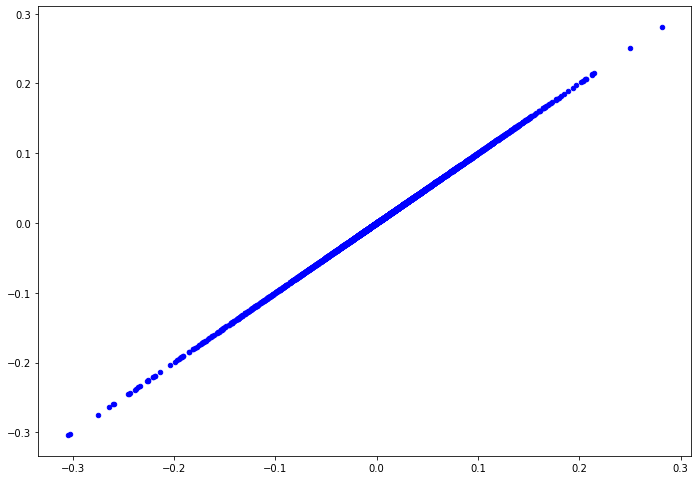

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

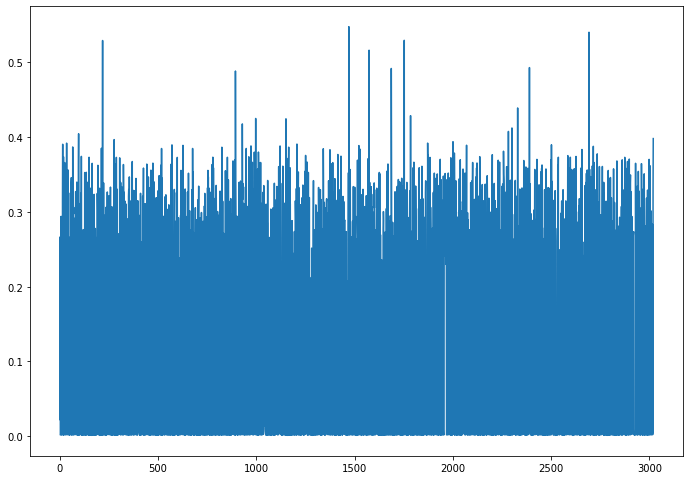

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

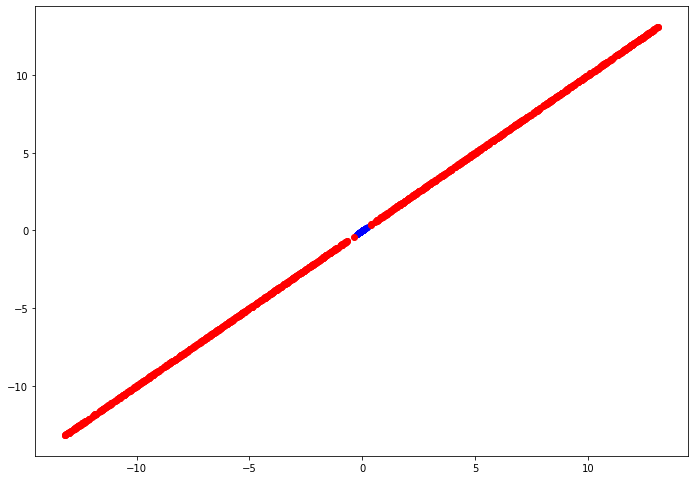

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1675)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


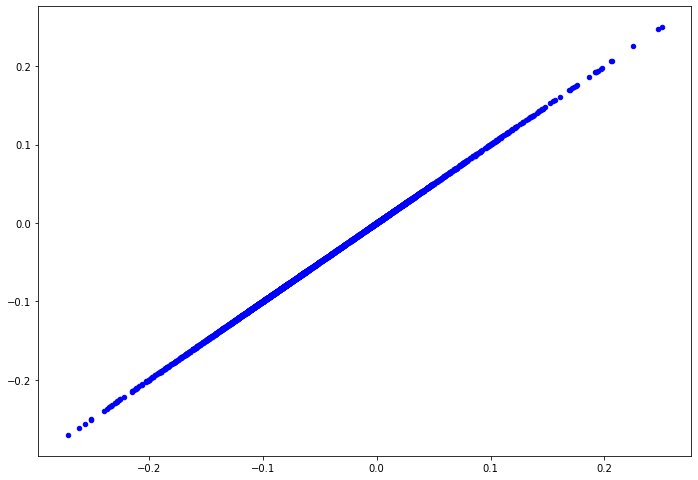

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

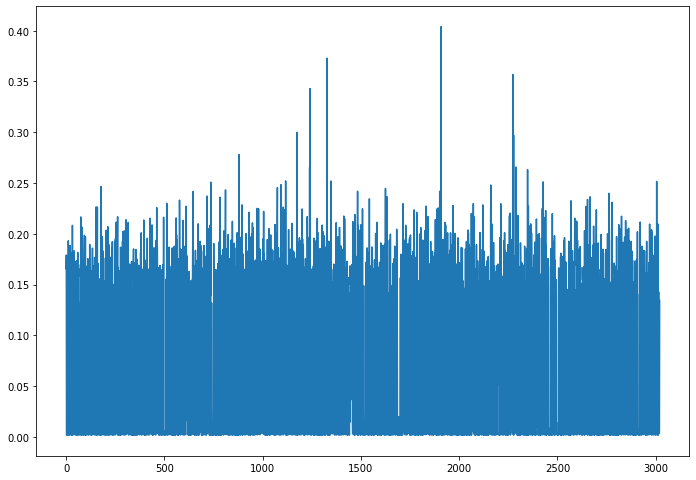

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

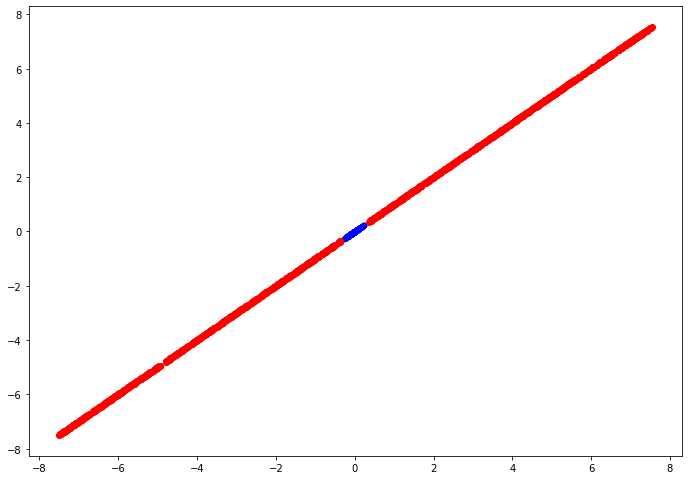

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


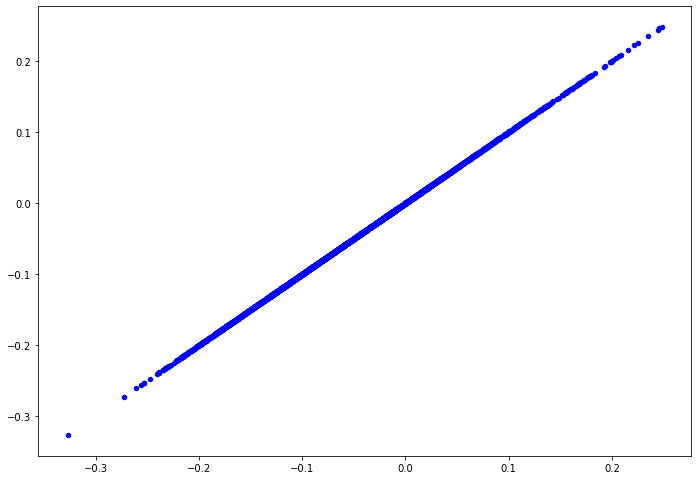

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

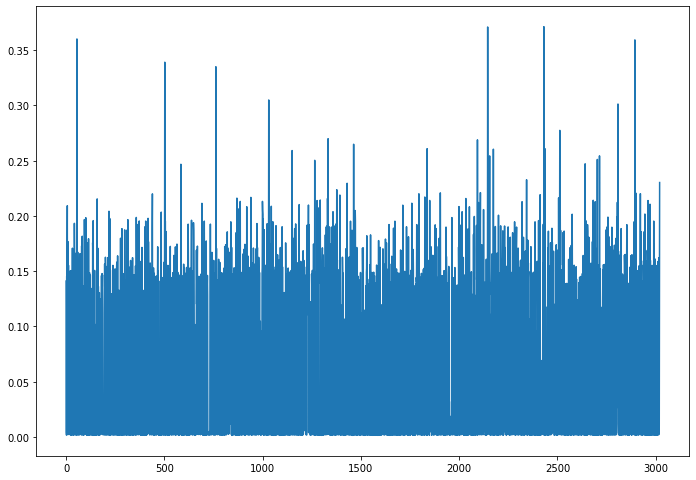

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

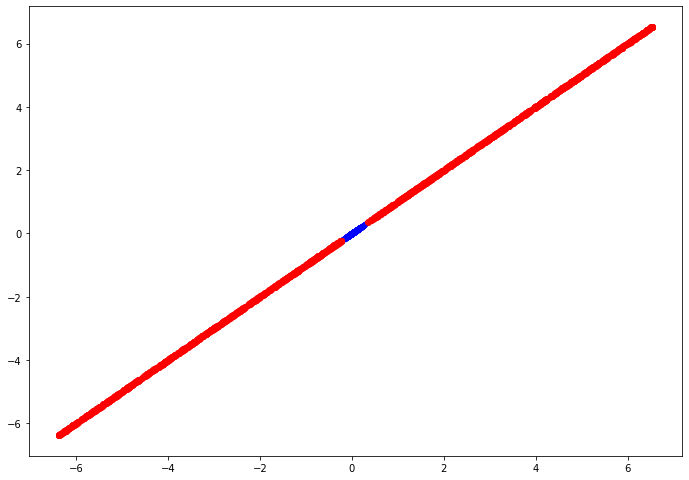

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.08)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


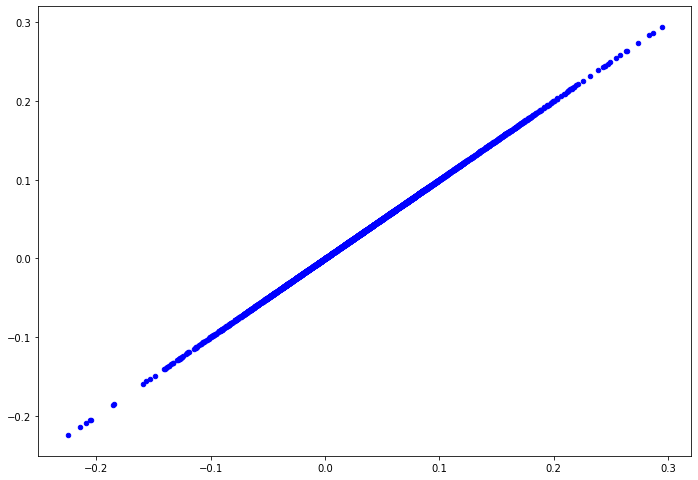

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

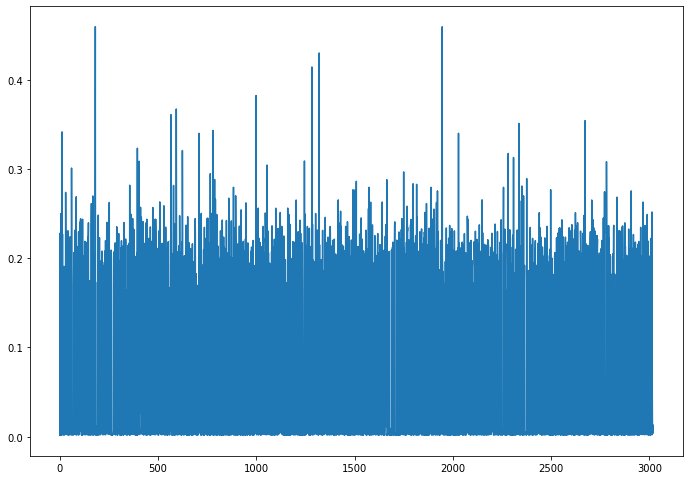

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

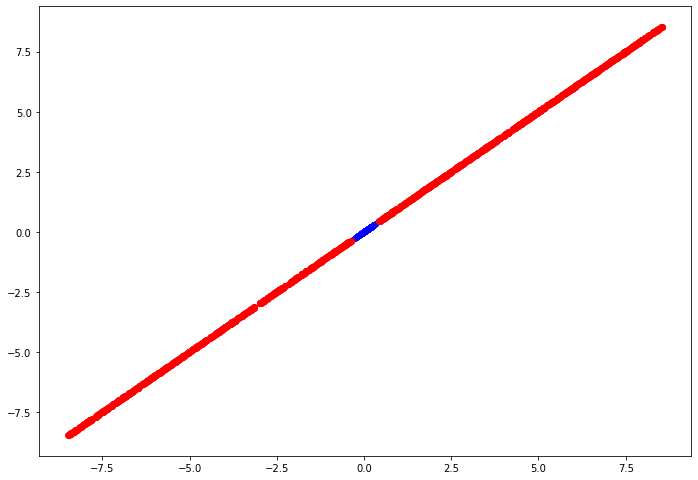

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


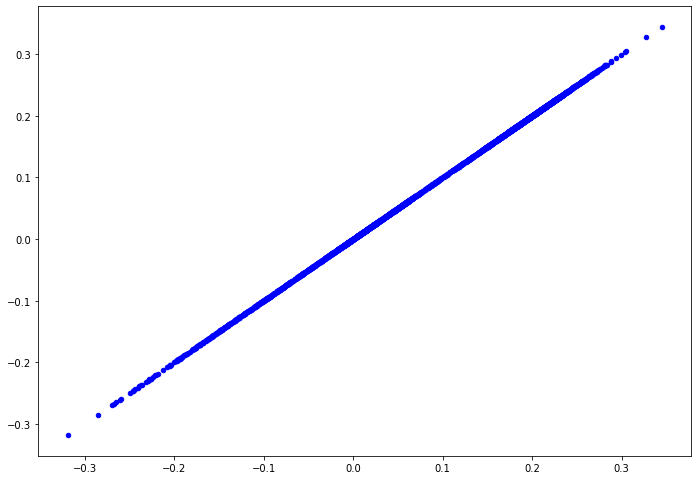

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

### ML algorithm after outlier detection

Z-Score

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsZS)

In [ ]:
# evaluate ZS with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8785170473353194
Recall   : 0.8785170473353194
Precision: 0.8525383552557554
F1 score : 0.8474595209859713


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate ZS with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9169149288315127
Recall   : 0.9169149288315127
Precision: 0.9170094382048816
F1 score : 0.9164934779846446


KNN

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsKNN)

In [ ]:
# evaluate KNN with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8808341608738828
Recall   : 0.8808341608738828
Precision: 0.8532840561709367
F1 score : 0.8499048638991332


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate KNN with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9149288315127442
Recall   : 0.9149288315127442
Precision: 0.915742714559501
F1 score : 0.9150864981990275


## Accuracy 70%

### ML algorithm before outlier detection

In [ ]:
X_train, y_train = frogsSplitML(dirty_frogs[2])

In [ ]:
# evaluate with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.47600132406487916
Recall   : 0.47600132406487916
Precision: 0.2265772605115181
F1 score : 0.30701498273392974


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9155908639523337
Recall   : 0.9155908639523337
Precision: 0.9171248292125397
F1 score : 0.9147551080900912




### Z-Score



In [ ]:
currentDirtyFrogsZS = dirty_frogs[2].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.095)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [2.351020739066799, -0.4850306081408533, -3.040673327187778, 1.6048283086112298, -4.893305693838863, -2.143852100109632, -7.192217921449944, -2.6696527051775423, 8.069844065955213, 5.00400893475736, -2.259510977990166, 6.310530754330112, 5.325435017118208, 1.1588035829283956, 8.335397508485322, 6.352264966869691, -1.8304641451521348, -6.906187504882372, -7.992689268434221, 5.836446616735728, 7.90073023128297, 4.420481770020189, -7.013761826703251, -8.026007682577047, -1.668024634214076, -6.930190368427675, -4.498898327004585, 1.8334634195896928, -1.920878231092142, 1.3792991668899612, -6.64868905815418, 0.391752095603959, 4.950626397392643, -2.6650335935997536, -1.6956613893678592, -5.082551964412208, 5.911644421177326, -2.4658589170606486, -0.5488934640706331, 8.75591112961543, 5.445941756192924, -6.73706038955936, 2.572669693198776, 8.314751212664754, 4.3753470513753925, 3.387102825056015, 7.335157437452296, 7.974047161322878, -5.303781985696698, -3.611470

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsZS.loc[i,currentAttr] = currentDirtyFrogsZS[currentAttr].mode()[0]

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.085)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.1)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


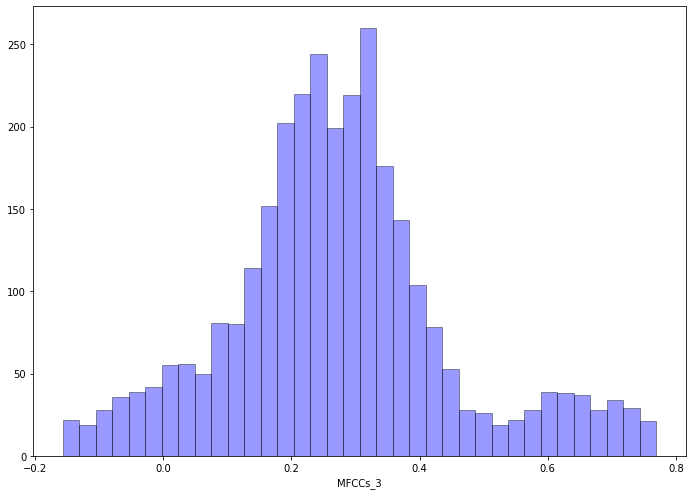

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.112)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-10.46036402921132, -5.474653815831533, -10.067702163900002, -12.210662673706366, 1.751346356849218, 1.217259710398101, 5.690542332973505, -5.027025349365582, -5.690212005553075, -7.16579990794098, 6.764578529992177, 2.47634662941445, 12.6587817112581, 6.021199533963902, -10.75693743683353, 3.184901132276288, -5.965860455297814, 1.7068728503950732, -3.0716388683261258, 3.286418227558848, -4.772001115559831, 2.155770061521681, 7.2554514007738575, 10.850959509981944, -7.081491142466064, -8.245090935766541, 7.133712442377026, -0.5177405440219474, 11.679440119875029, 10.694130871591792, -5.477713811120453, -9.450319072447584, -3.904643538436419, -4.020815705203006, 6.401157190593254, 5.369130889784004, 12.372829727640466, -11.8956593892744, 8.789960092350231, 1.0513814222759466, -10.98365535965705, -2.47332918053926, -3.621229762633188, -6.20038506269603, -4.140842470380278, -10.468274439263984, 8.388407822154523, 3.9091795731830574, -8.341985209441932, -4.2191

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


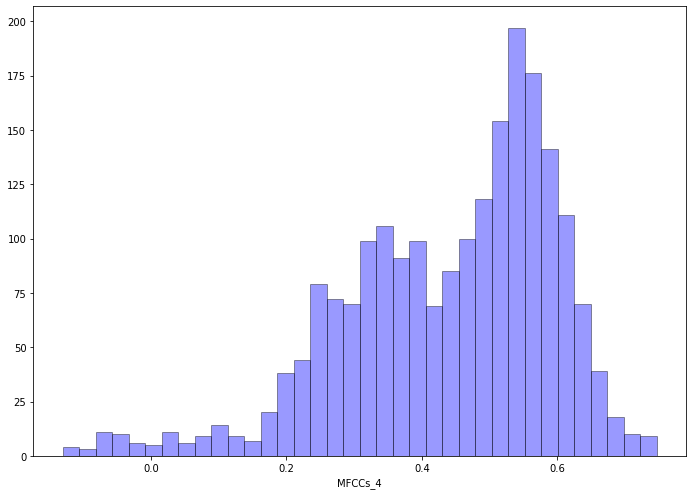

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


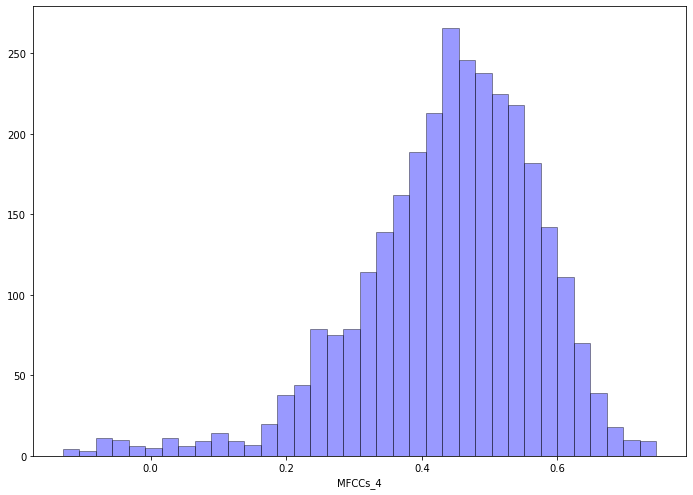

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [9.991300159737955, 4.744506043632613, -10.4049002677839, 5.086779643843615, 10.83130630686268, -6.208600479326586, 0.6756485708153299, 11.490921935630654, 3.8434088028658993, -1.8166546686852847, 9.480698351279951, 11.339763743894965, -7.744856988588747, 9.838528857427002, 3.4819341524261858, -1.9486930224312928, 1.520638862244092, 12.928912336933998, 2.3084575048647067, -11.653288832406565, 6.203788376374863, 4.319379062639349, 8.62233474697604, -6.217973715407292, 1.77693129044795, -9.662759324132258, 6.1359548944300855, 11.666792509114776, -12.846075099062183, -3.896656195639784, 1.9954148706591524, -3.342903044739849, 9.166762300021018, 7.725289629210058, -0.9838726196196674, -11.834338423399108, 2.499532678731666, -1.6086156581692777, 11.820827016204545, 10.391183820132808, 6.766583610263453, -10.472796238853473, -9.749766053006864, 1.6490307726589883, 10.257761072917528, -6.106860617834518, 4.778362284946429, -13.047276116015064, 6.28639625802853, 12.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


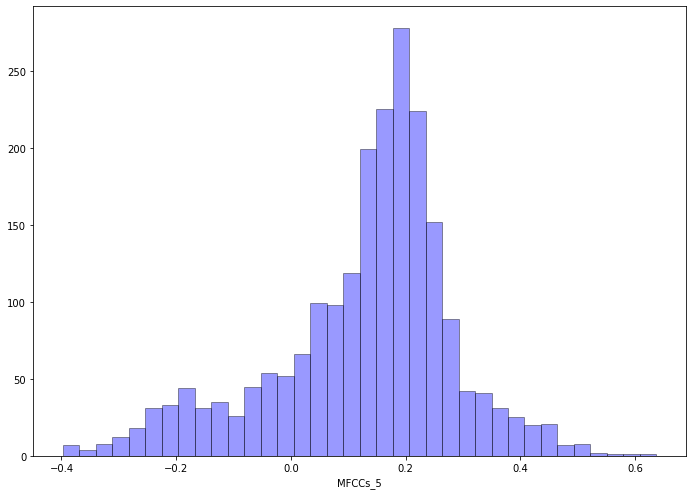

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


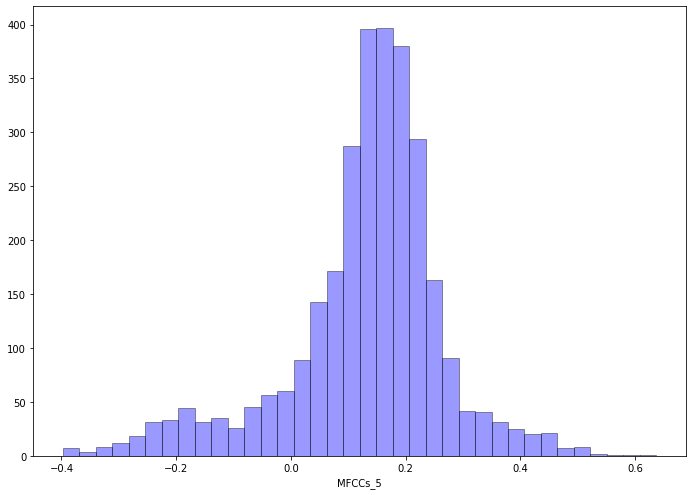

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.1)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [13.867720411730948, -7.281133795417093, -12.995060534172293, 5.553543405334096, -3.722203060723015, -4.389877882521223, 5.929451846314445, -12.050706961506304, -3.8165901452665736, 8.539018636837113, -9.158632550076458, 12.126967525862764, 5.483203210521587, 14.626886704850628, 6.551064464962093, 1.0612867853302808, -7.114134271476626, -5.779202923586917, -12.96762312368237, 3.6037428016842057, 4.915580316735345, 8.235189297471731, -12.798288827148916, -5.011550011697441, 1.7800741828979234, 11.357552650220365, -5.537339214011757, -7.97614264192846, -3.171437158879552, 4.098783327878669, -3.5155301505270966, 6.238191665745686, 7.485877090831164, 8.635747667480782, -10.532593994932505, 5.3691532498933245, -8.212123493982382, -4.601730309675521, 9.13563647084676, 6.203233750526536, -2.2970532628690243, -2.1875586058620677, -13.817046936944507, -1.9624074173608808, -11.688115134212492, -13.640182564614644, 13.067326046298357, -1.0694970081598374, -3.6768060270

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


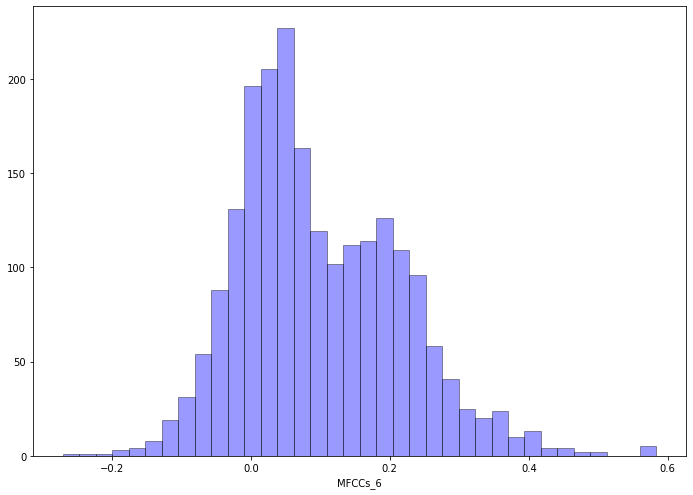

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


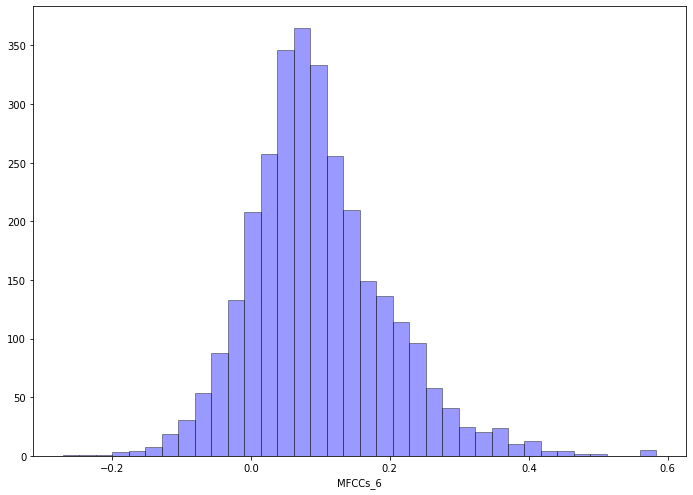

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.131)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [13.010710735487082, 2.1045505034029617, 4.370648127068831, -3.651706535603751, -8.397290508606924, -10.77998651481911, 9.762628838993514, -1.802006515586804, 3.212160867819505, 7.272111092183534, 1.9305537283456748, 9.776837558870543, -5.510180588509902, 5.356167286558146, -0.8457880399940958, 13.983212758596608, 14.528636397883764, 10.341129154489142, 9.04297078507954, 7.246033550113028, -4.16005390206765, 5.626737184593938, -7.308330667287136, -10.830554753814342, 9.20054426386818, 6.808332514478515, -8.677232056029908, -3.521383960229201, -11.663102323358846, -2.782358896104075, -4.309878600746352, -14.066174555780863, -10.214308173249515, 14.986654798058836, -1.0593918091357786, 3.044296871775276, 8.532587989390688, 14.032443805176026, 2.387884258958604, -9.776102144849675, -8.973600141265043, -8.054518514120213, -3.252466938977678, 12.373188690879536, 8.166919063871504, 14.19239786629658, 10.507241873308194, -14.47012481234855, 7.320739930969022, -7.71

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


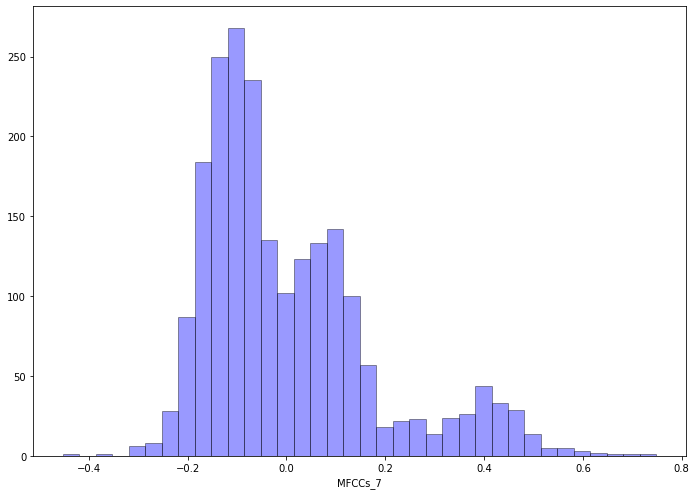

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


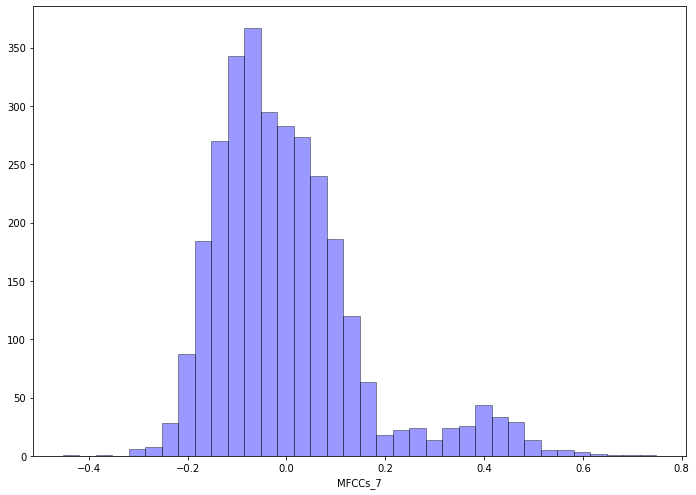

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [9.282491483194717, 6.788919206572872, -7.5035953497103165, -3.652812191166162, 4.012148796150562, -3.6243385279363727, -10.618242425634174, -0.57965022025979, -2.7147650767556684, 8.524314576855271, -10.465460256844487, 5.623098719773674, -1.1814770280399696, -9.756150567917343, -7.610967022864817, 9.19056704460642, -5.104750894371593, 6.323956945854512, -9.036739146101253, -5.918350381370786, 5.805927076838349, 7.660527559946549, 4.371423689595903, 7.988237855405574, -7.257107651752914, -8.450844279052314, -8.952049487230724, -6.929775724888414, -6.23780523344129, 7.869285478518899, -7.303167082774058, 7.077482705749786, 7.936952264207255, -5.541601327520858, 10.144229405753697, 1.1668652600071316, -8.878989871344647, -2.523661091424336, -9.578259794337733, -2.0307349940202126, 8.10986477796354, -6.701461690064234, 5.462712982303732, -3.832738870219549, -5.738273359104906, 4.739772399434904, 8.49523476134542, -7.33097984141225, -6.524646964170209, 10.15103

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


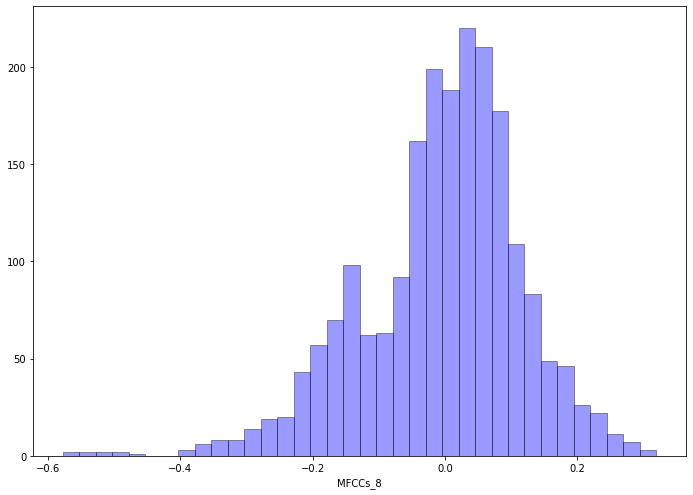

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


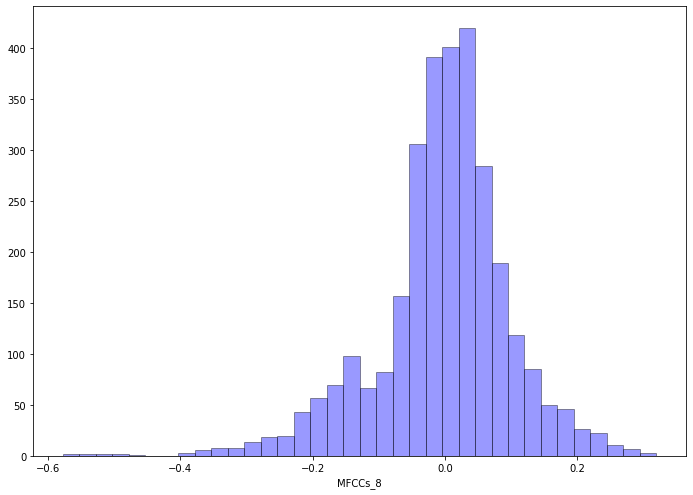

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [8.04183343304215, 1.063343185938324, -6.109606196705744, 0.957527180758508, -12.966994942199298, 6.277397554357223, 11.489928874769287, 7.303313468927372, -11.416843958491992, -9.940076922270622, -13.206625864934187, 0.7975252523391003, 7.9148392397067235, -3.9237980362725846, -12.69724414482494, -5.698531483901975, -0.6146719267907184, 3.111157216803602, 6.828636547321927, 9.289572256950528, 7.977356495495763, 10.473866553075528, 12.62411479477792, 10.358217231098278, -8.804739067639364, 1.3306379520214198, 6.058941931706003, -11.1914211056444, -1.7298442410284576, 6.846640528560894, -11.406718348835646, 4.1564779435037424, 6.617259137752737, -7.732668304921178, -5.242597403537713, 2.945252348178459, 3.7357295419098366, 8.996361418922577, -11.629475680801264, -1.7459693967187455, 11.10272034001658, -12.32944029346954, 9.983290209786784, 1.2012233986583878, 9.874733287522492, -13.50529156173234, -11.452610220518036, -4.652209779307805, -7.27849058331357, -1

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


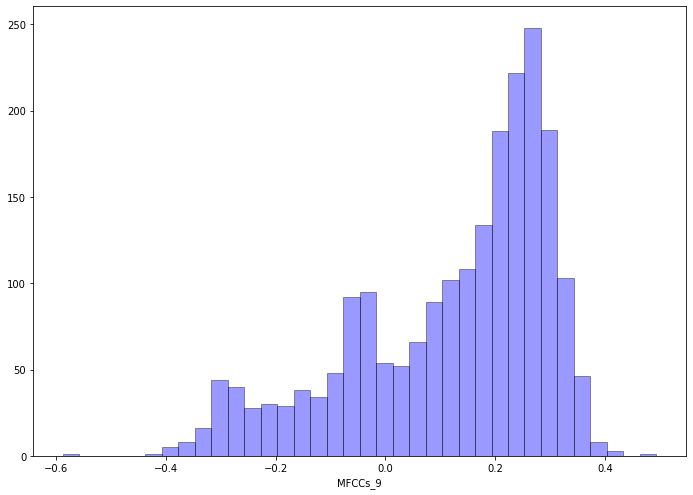

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


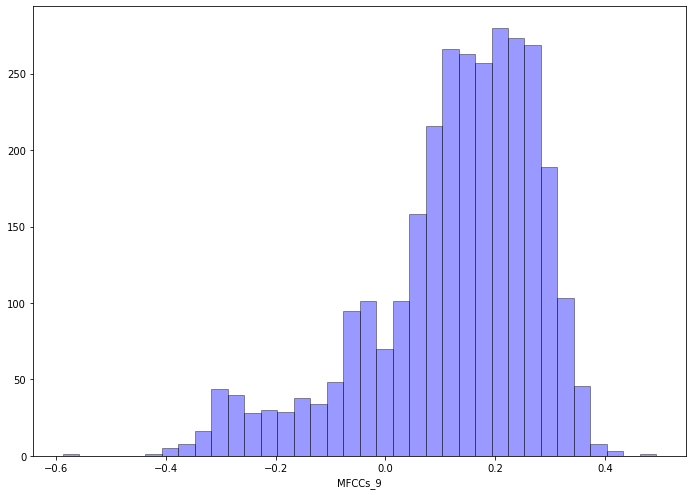

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [10.547126851997554, -9.750668883708675, -4.055612564937249, 5.7404716203321335, 9.44588396811876, 10.644692787551522, -8.359856429991288, -9.228589818428263, -12.517989966044691, -3.116537148076887, -1.8964581606670947, -7.105038921514948, 12.242938730649112, 14.136597378454384, -1.408771273801177, -1.6868766964908364, 13.179866641316512, -3.555632569005409, 13.677132818542407, -6.376906068197755, 2.510197342792604, -1.4959635198334382, 3.701339526802132, 13.290300855999044, -9.590271950045093, 13.18399436450662, 14.142554458644176, 8.410237382727717, -14.1253787450712, 11.822502941025371, -12.188400362942737, 8.306452218321489, -13.171121200145992, 10.937060028776592, 5.437623887149237, -10.3038220078206, 12.433982416493192, 3.40838871473361, -8.241815325086407, -10.201788728294996, -14.11504996186479, 7.243513844830958, -5.679113273369932, 9.084654776940289, 13.674954512511349, 9.532742432602292, -3.6653624638122864, -6.1440839206768665, -2.54847715431038

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


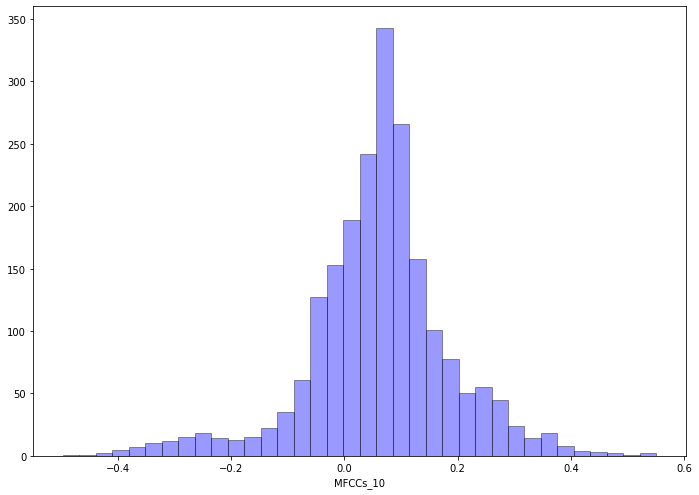

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


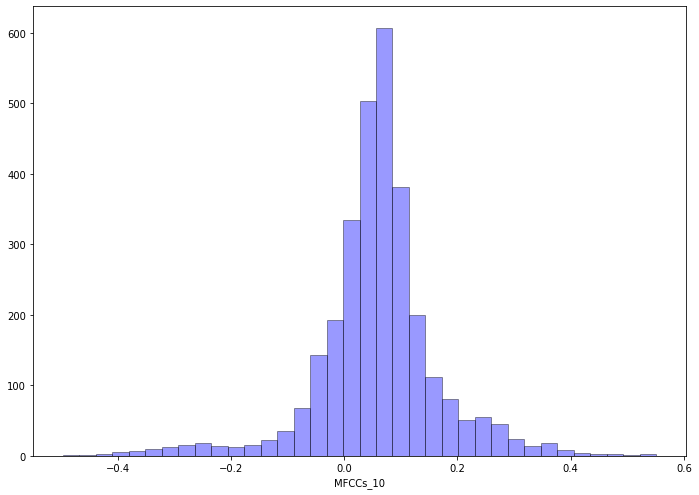

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-7.153417472228619, -3.1310290252894486, -1.979675887874345, -4.605494223328211, -11.874080456104448, -10.323839259245824, 0.9720397500850664, -1.7150165985840309, 9.648786125380466, 11.358587870242491, -9.875365163819827, 12.2144439372398, -11.006150727290336, -10.463647647825873, -14.626568020464582, 5.576050281954792, 0.5318188690372649, 7.412583728582281, -9.1941902592609, 7.729708706157835, -14.20781763793377, 13.97660982505112, -5.851822844665014, -11.331341260381004, 1.1255419568328204, 2.6613211311153853, 14.374967388438844, -6.052378342182626, -2.7456188278256395, 8.516574456952984, -3.4665216452312286, -5.6631313153464, -8.021633339727273, 6.8021535003050575, 10.39807157769603, 7.799525682850274, -2.682820963323227, 8.402044224314942, 7.177600467953844, 10.134490786096098, -2.6473654445191617, 14.1981035101902, 0.512229100363465, -14.291659057441594, -6.648821289223543, -2.934706438216674, 0.9700979182369656, -12.874255711047882, -13.2911050616635

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


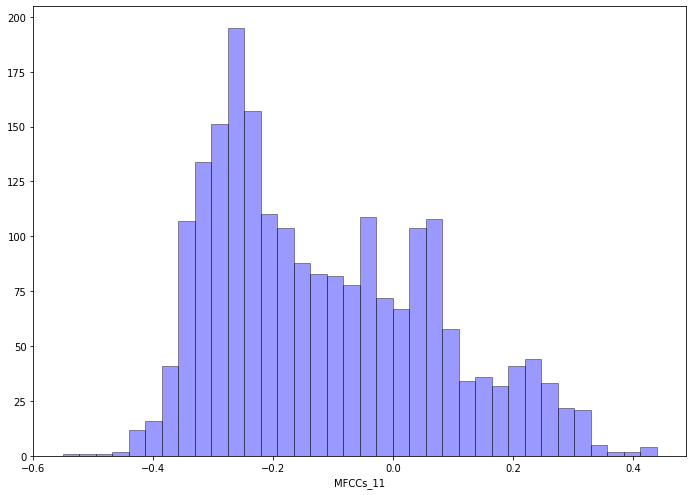

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


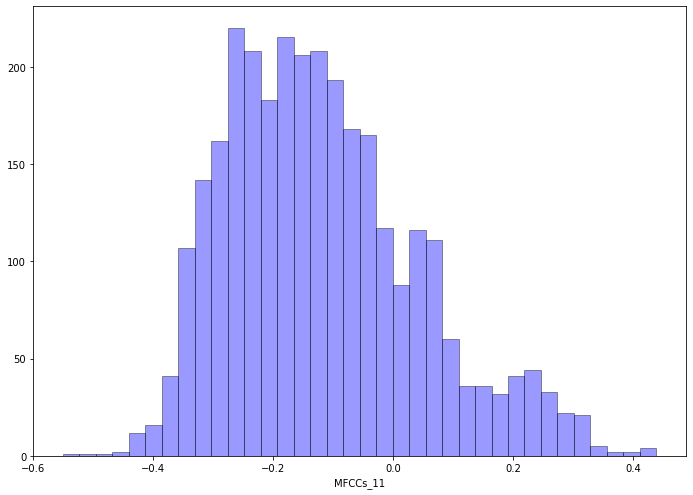

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.11)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [4.019851534427303, 6.185599430309861, 9.315679814647485, -3.4426401161810407, -2.9592047676639464, -1.0067483339454828, 3.937016729650347, -10.932459319300612, 9.036216562752744, 5.077304653453401, 2.4198924288410573, -11.828544448129003, 12.389480879411932, -11.187979624225395, 9.969607852509585, -6.311869794254592, 3.4724889228837537, -9.733343330179531, 10.830356736806571, 12.843180777577986, 2.171070792192239, -10.00205038211093, 4.147949932946065, -7.110242206599664, -7.17353625222668, -7.148826182110878, 7.459459386487245, 12.975644180838142, 7.150584422991903, -2.869052342365327, -10.73263429761074, -12.489565735290707, 11.542799659652662, 4.255758103596869, -7.461115563107581, -1.6448878034070231, 12.077240618225868, 2.906486843146781, 12.24018785342624, 5.734556101747338, -9.818989283330158, -1.2780039412447746, 11.575022359448011, -5.39103004749699, 9.11365587544304, -1.6130781171699606, 9.319175456975987, 10.91223903419854, 2.368351193688917, -1.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


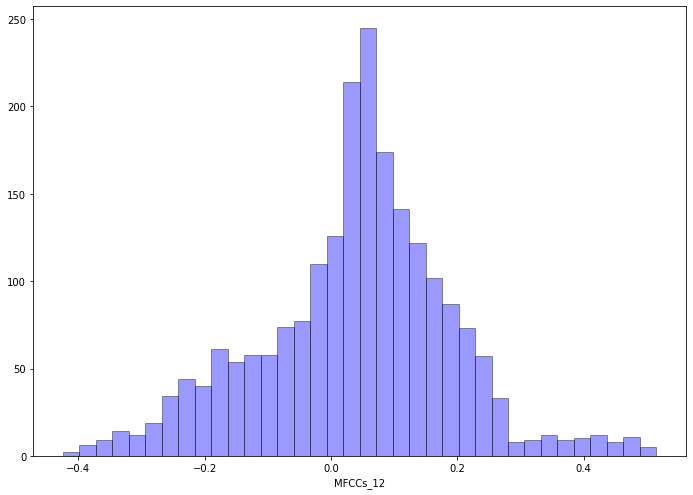

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


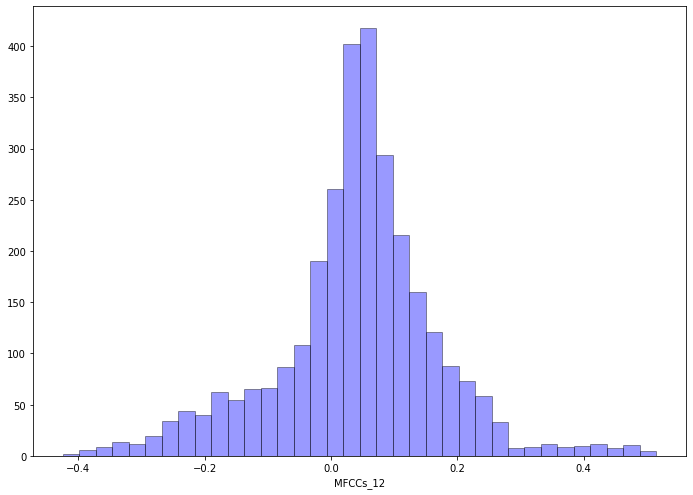

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.135)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-10.725977939620174, -10.77549057106065, -12.660785217701273, -6.06855655001117, 1.6028692565428675, 4.316556687616652, 4.003678091843764, 8.319077552435155, 5.702749064830236, -8.739539286952619, 13.151627762483493, 9.120288879742024, 3.4978156750982765, -5.230272563366928, -13.013621684580466, 3.293463698992661, -12.625598980821684, 13.447703375667045, 1.1876679826435828, 2.599907496800284, -12.782305032851658, 3.0629836997395614, 3.64460048246702, 7.029854398412874, -0.7916083598509722, -8.461192877697279, -3.599669045983646, -10.240949599519716, -10.485654751746296, -9.46393121729396, 3.595922401584222, -12.055173076364133, -11.41401585715422, 9.549370674852302, -8.197736507972465, 3.652984109350785, 1.5842813680694432, -6.329921266500888, -1.7835564452879655, 11.345069932614766, -3.944786770813238, -5.999439228748656, 7.043659987838175, 11.916277109673484, -0.9953437258587776, 10.39769534488888, 5.361867948475482, -11.130422332271298, -4.23508717314904

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


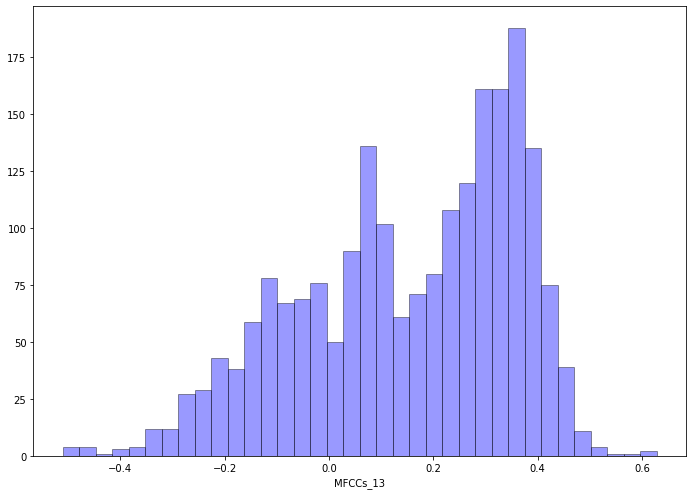

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


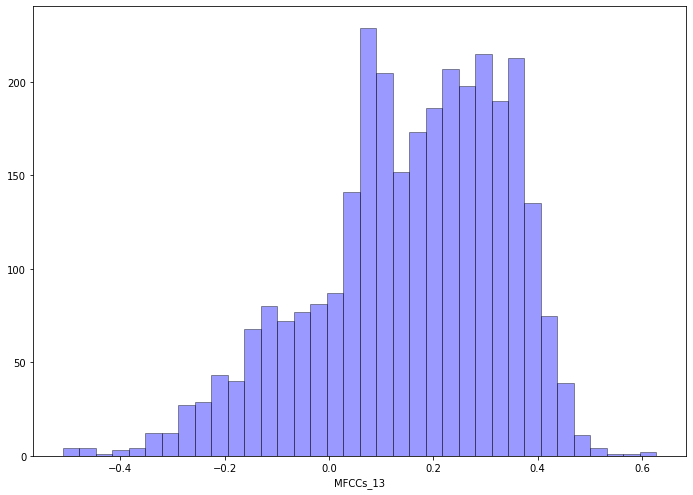

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.12)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [8.771201544255524, -6.488436679216365, -10.344102516661216, 11.551320163175909, 2.3106162680612106, 9.057551885293424, 3.802850243544096, -7.636873435690976, 7.354288372511871, -4.76506658317289, -4.46689450862463, -9.306184237269887, 8.743225641263145, -5.407107836405599, -4.890504179925243, 9.22261312022138, -8.234668648664634, 4.212671242560994, -1.9545449416769909, 5.429689218710677, -11.198526859213796, 5.229745127876554, -11.580405311922332, -3.31511948392696, 2.760407397740643, 9.61319371381587, -3.6579089663052073, -3.0388058545209944, 4.895135531782739, -0.6346010274889871, 1.9684073487872715, -3.1913360776616564, 2.613330480855419, 10.111134858702249, 10.113532796821229, -4.778088503485179, -10.60717556377775, 2.9690984070734707, -0.7021029784516308, 1.090696550494617, 6.4477184720688445, 8.238240756540595, 2.8731951819894497, -10.54859805545188, 9.061111312888366, 4.362760039751464, -11.3426056929079, 4.561203836969983, -5.710266864787923, -8.432

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


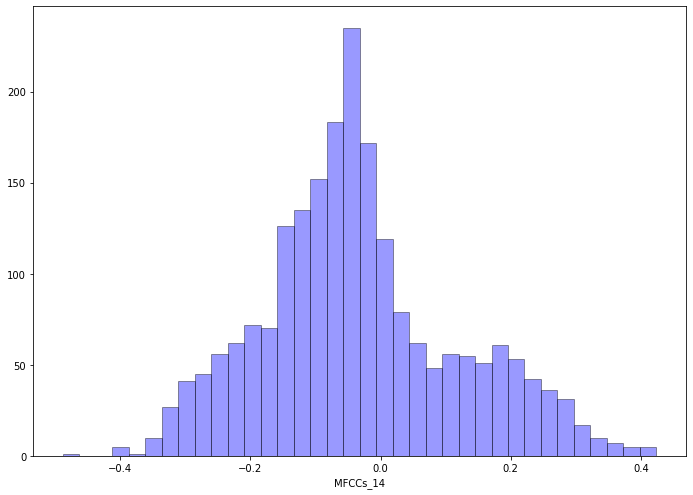

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


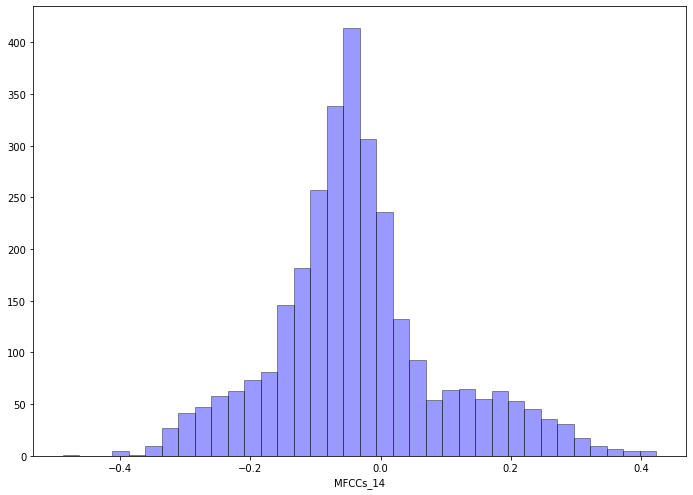

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-11.19872419978437, -7.8586428124826675, 4.95320671206869, 5.314607570514287, -1.8817919505847804, 11.457009958075368, -7.965423842944624, 0.74456957538238, -8.903809760835324, -11.31205848022944, 8.785454924826173, 3.450258857378369, -10.81948215410744, 7.394498186303608, -9.486257930517194, -11.234427752381482, 2.865321489996787, 4.530048204635515, 8.610548939288151, -1.867361074567551, 1.8046059188811228, 6.186481084835498, -8.911689892278472, -3.941175141597308, -4.448567911448727, 10.315294641644147, 1.752415252413829, -5.747622226761191, -1.7713858586908522, 10.7439695556692, -6.474228284005449, -7.531821386307149, 11.131091140867138, 9.077142785822382, 5.904206844449693, -6.479368589616904, 2.3709769037868784, 2.0644545415319486, 2.730787292670774, -10.762171724170448, 4.683285757349937, 6.165004131676089, -8.932001222757314, 2.1344805654548598, 4.845992418171304, -2.6176297119092844, -9.68576446283798, -8.311612779959946, 0.413627518224884, 9.907361

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


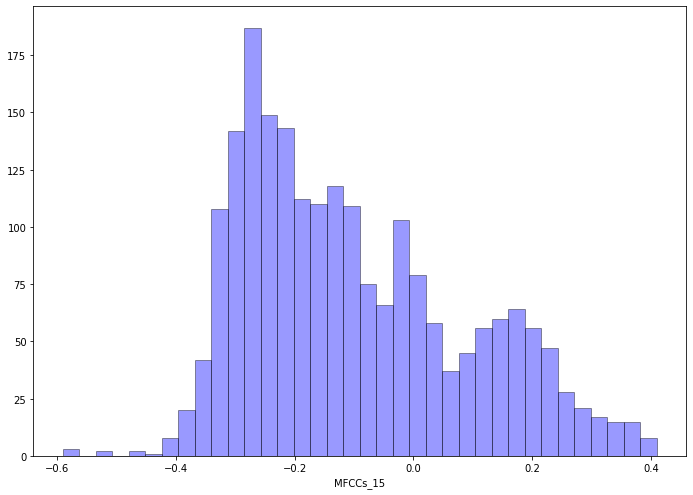

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


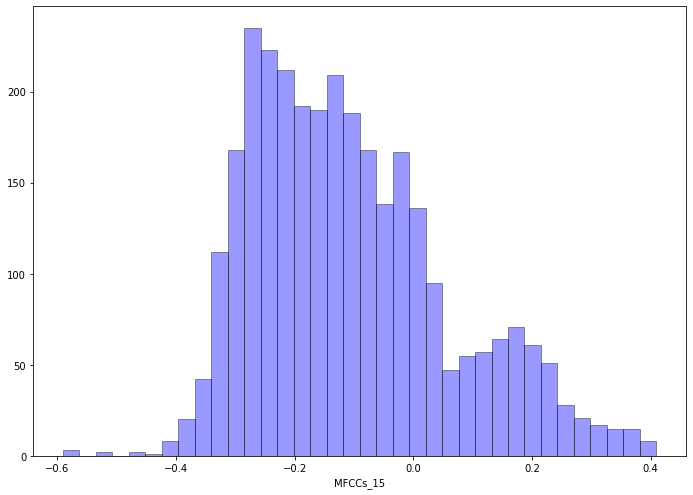

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-1.5499617694698706, -0.7617244913044345, 9.921995943315466, -7.937659588995509, 0.6133163578966457, 2.4214038232413304, 9.822035708240296, 8.671879303654954, -6.145322638558368, 5.886454936443292, -7.196740244068652, 2.429074318494705, 1.7879927639655069, 7.20520597045875, -4.43697672627979, -1.0810989494426568, 5.341482416459928, -8.340369382833002, -10.47840415459946, -4.740465208590969, 7.737936316772077, -7.450008195970707, 4.763870177108873, -4.699926996568617, 4.1086514546017305, -0.8860474253964696, 6.619671572621646, -2.0034704617109647, 2.136329153626935, -1.2834080332584694, 3.073688013995373, -1.7554453385894568, -1.3976763041357714, -9.288413403934234, 3.596544126869456, 9.379538328013911, -7.35528793242138, 8.416429412969222, -2.4837740459246955, -4.819575038183136, 4.889360085615562, -2.8138455078269557, -2.849326317868287, 8.469741070017824, -0.6026992265115023, 7.814790947541685, 4.8732106596605576, -3.2939371570362868, -6.23843250452118, -

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


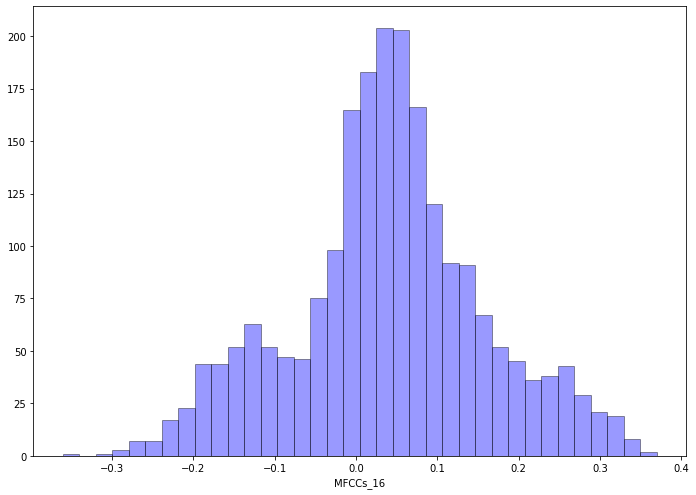

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


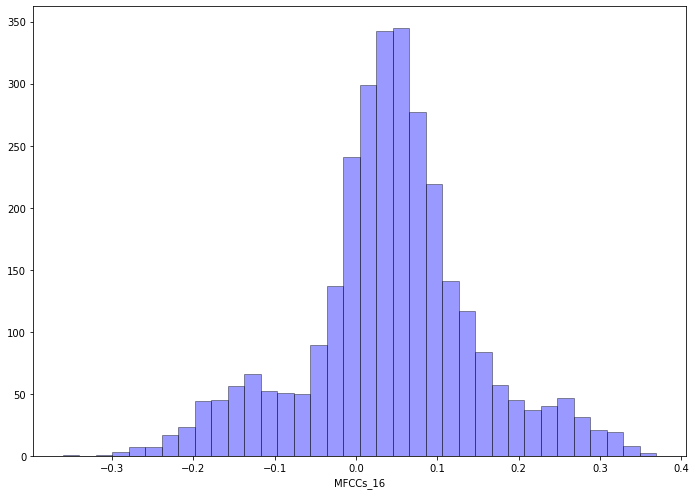

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-1.540717302602724, 8.291757790119814, -0.7502041470559231, 5.911772348624264, 6.084819680956239, -4.139660853757409, 5.1011116950360185, 7.606208551008947, 1.3681640255407197, 6.08787683150766, -8.37522564609376, 7.142324343878928, 8.527403404612155, -6.36012512404471, 1.0447497821009049, -6.392044076439204, -1.271925932057611, -11.05026700695034, -9.320858755072052, 2.928451379259389, 4.319780146191661, -1.6893102402621896, 8.744752441233226, 7.078119281377061, -1.1826862373025175, -2.953087870093688, -3.457942044700298, 10.82549560997357, 9.928844619543062, -3.588890942475616, 4.023958956559769, 9.490150982181884, -2.3763863510324192, -6.776352514863886, 7.880036308345018, -3.544834363051458, 5.770913491994665, 2.3967401443080893, -3.1734797726721844, 9.918143705409369, 10.906119494826946, -8.601853129456586, 10.937838926124666, -4.7091717734326215, 3.60288117978257, -10.722508945674004, 9.699186980777204, 2.209355646687965, 3.7711864750858983, 2.4963828

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


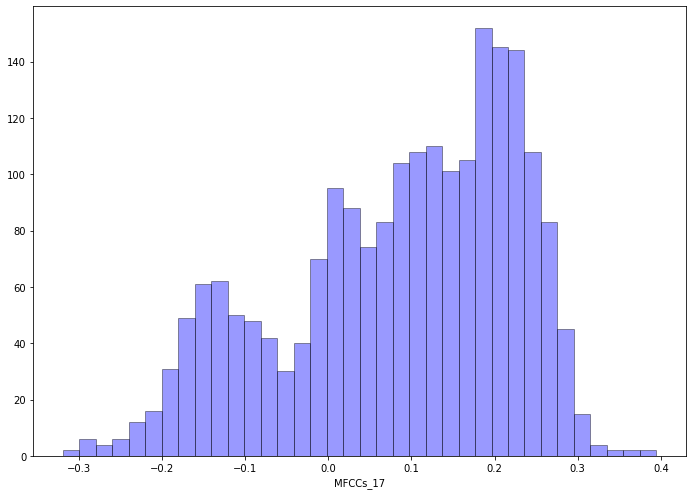

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


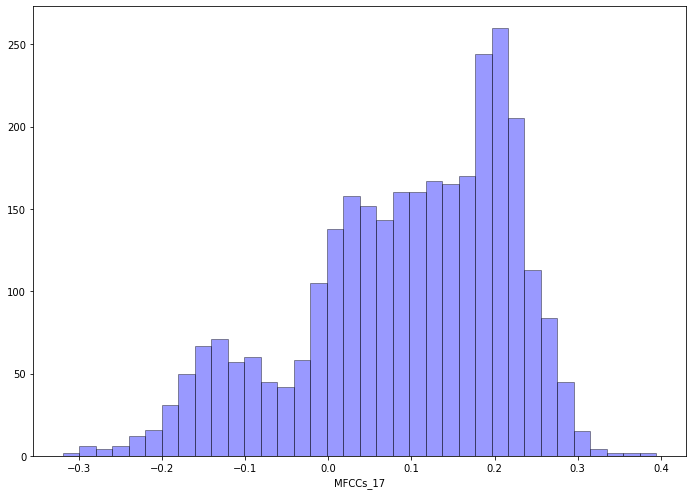

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-9.905943789795527, -7.835660888154001, 8.083716197062092, -9.624787204797098, -10.802668295129264, -7.404627859796997, -4.842504598442314, 7.107102101033931, 10.810536554029838, 6.510020824174357, 9.31584373444036, 1.3486332219627415, -10.973542288092288, -5.150526523939715, 3.706128404836656, 3.9339671305943975, -0.8507439843579174, 2.1678778861017785, 6.9732573991208575, -7.958789986806195, 10.622061279157265, -7.648553695686637, 6.8554770838092205, 3.963513821580176, -9.986118977261771, 7.094477027721998, 10.246078412900417, 9.60705414973629, -6.726931870590534, 6.934360900850305, -3.6398823830357134, -7.2402246303576865, -5.356896082834637, -7.008573095276326, 7.658866024122568, 11.649975477267892, 10.967069032022328, -1.3888317976844409, 7.564977351383723, 9.672160947326123, 2.353190336590495, 7.686381681604701, -5.4840982420092015, -6.900070891741651, -5.099666525610223, -7.313740282097377, 5.51434408626614, -2.772100703414276, -1.5211080606256306, 8

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


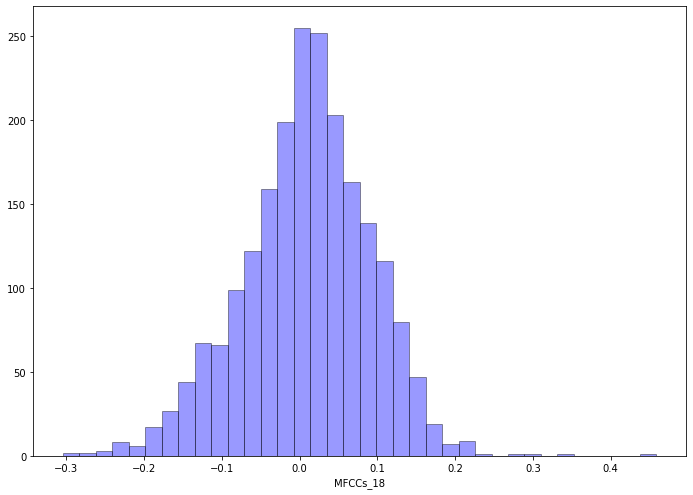

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


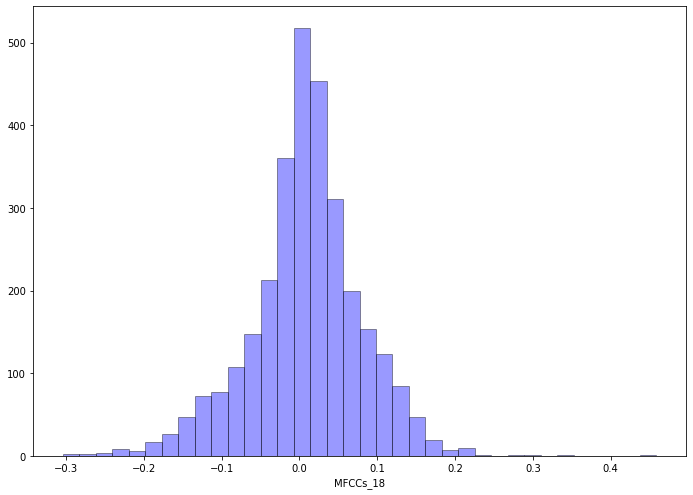

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-11.14228344000537, 6.033060319860622, 4.039289513434834, -6.258560228268437, 9.053268971830052, 8.687977894162534, 4.65935636826775, -5.783383218950339, -10.75871286401695, -6.055181347516833, 1.087308952778164, -2.583092258693748, 4.13678725019517, -4.6195042217446485, -4.065143488690694, -4.729755863817836, 7.150426890907909, 5.314504573881955, -11.098467884780773, 5.235450350411078, -8.947826602144762, -3.1368818315997125, 12.288490970537804, -7.563968264765361, -0.682251732510192, 9.63381677333467, 1.833802145148436, -1.8368695260146364, 3.718146358741624, 9.925653486292386, -5.563967972494486, -10.739830810209329, -8.298884553508405, 9.21168184792556, 11.34205231915255, 10.25771917654113, -6.779253217062012, 1.9406584236967857, 9.11954837196104, -2.015527004212993, -9.343868715757122, -11.119129869708754, -3.633519127077357, -1.2829700006968086, 9.4233173529571, 5.982211958647832, -1.173676132117034, 10.677310653984302, -7.860799357622417, -11.4132960

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


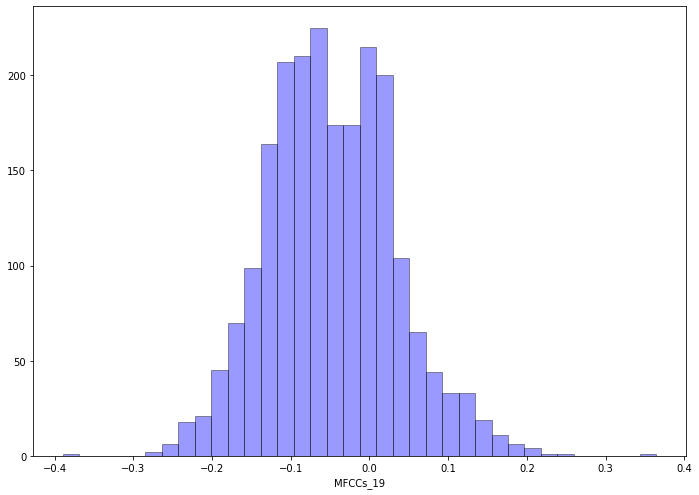

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


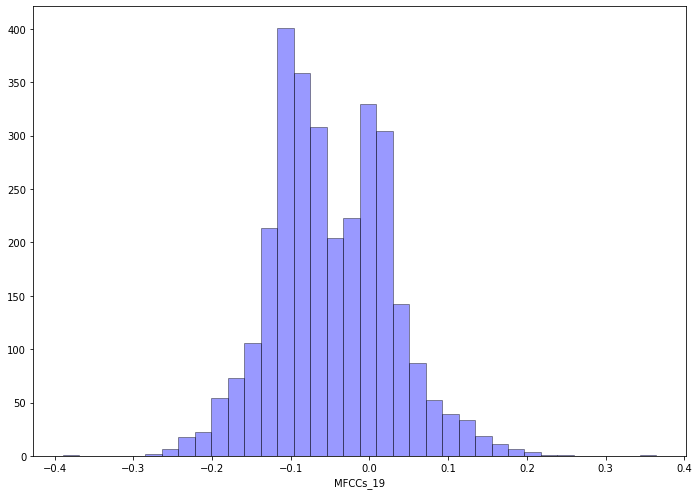

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.11)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.114418105268776, 1.4080675722507097, 4.2350551319753285, 5.652172686876793, 3.4143187179294587, -2.2362266426113697, 1.6902414294146773, -7.261234079028869, 2.7163950030638766, -5.410109342476476, -5.999562208939491, 0.243281577975128, 6.005331476728882, 4.785624656850824, -7.21187881595027, 0.235131099890778, 4.520410745992764, -7.204662465078016, -2.939109326608816, 1.0349393053567546, 3.5659179869855144, 4.376726369060789, 6.928628627611484, 1.0406854820128046, 0.206888602568797, 1.5080010817533016, 4.088547281816337, 3.131110326108326, 4.502043311087563, 7.302094549394211, -6.105034952721125, 7.3680884598534195, -5.24599582620931, 3.283186204577267, -1.472130335297547, 2.74064572638017, 2.8090560681217145, -3.1528686236747703, 4.665953072317095, -0.5183159950765353, -5.474313314403656, 4.871699410453161, 0.8663251313726517, 7.385075890536278, 4.155207209611429, 2.304299520138814, -4.189361044346831, -4.65314999747841, -0.3793425701393218, -7.257711866

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


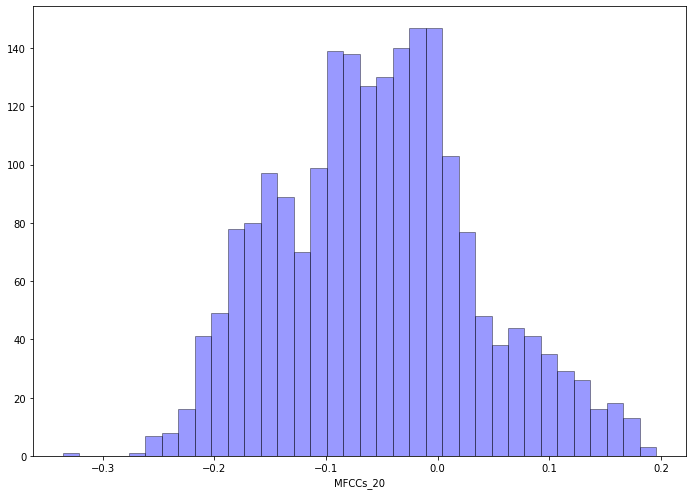

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


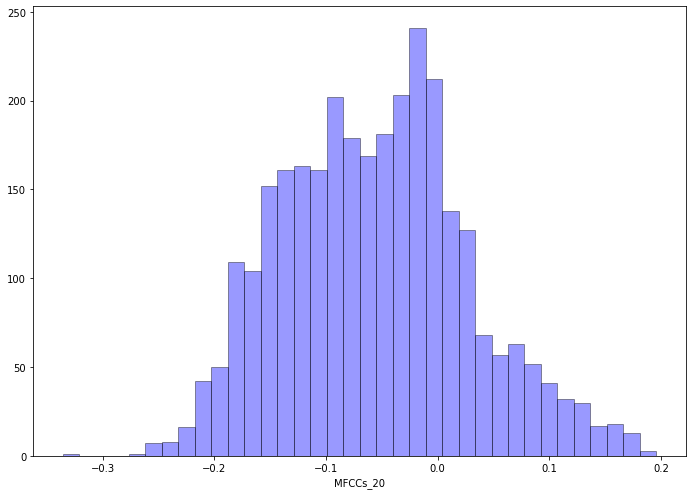

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-6.149343701730816, 4.777558751617679, -2.466516342637682, 1.0831424357421513, 3.4859237822989058, 3.679122753108743, -5.600371208942395, -0.8579520209742801, -0.7818379625523981, 2.943530945270277, -4.229598841040566, -5.888504880706979, -0.6150150237302938, 0.4937588250248592, 6.110649231175467, 1.285990537422078, -3.3838829497566785, 5.681094931266861, 4.114230379757657, -1.7386824867817, 4.294785665801273, 6.089808036732579, -1.2351439453812283, -4.807779306332924, -3.665951797260152, 6.376282178913888, -3.6768536001273855, 0.6605129187275687, 4.118315701004372, 5.62056488381052, -3.051692825289069, -2.8256193468389945, -4.230035563476165, 6.442266070401411, -4.489457761908273, -3.0484489429139416, -2.470867591594647, 3.739976016211061, -2.0061899367342964, -2.9365846547230983, 4.414468087619637, 1.116709260858561, 2.2170251574502995, 3.085055663091864, -2.388414427586277, 3.565074584138032, 5.364684972449336, -2.790020521832345, -5.115779261596345, 6.3

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


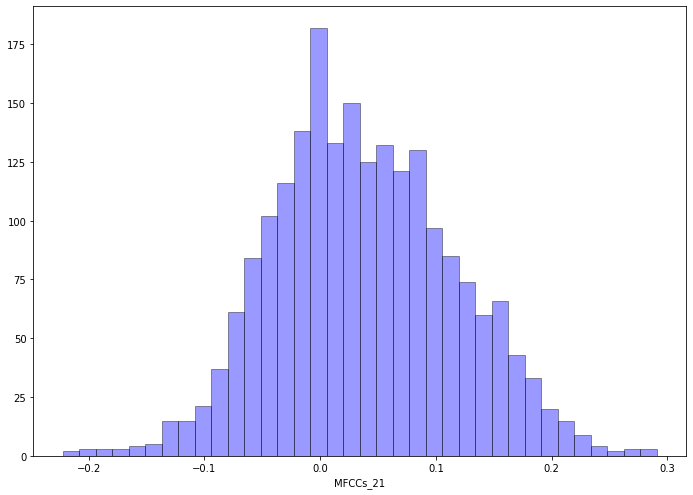

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


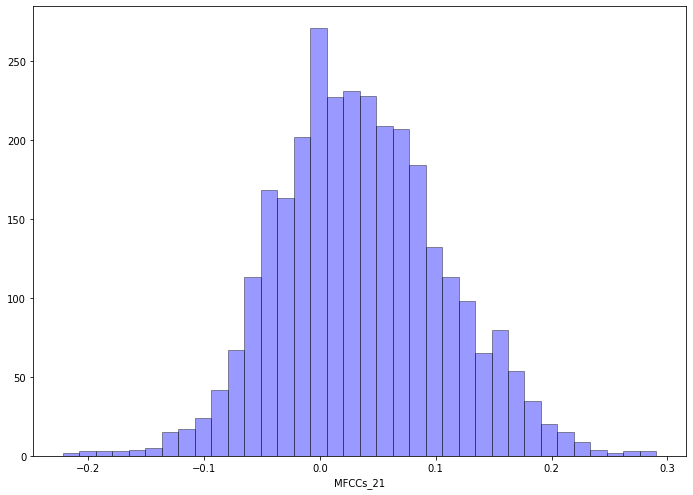

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.17479666244866, 4.0103310014730615, 2.1311220895455723, -4.303188879944818, 3.2641498677192637, -4.224694371884787, -1.7858841775487129, -4.563077301178121, -3.681198744729497, -1.09051733741763, -8.129410571176598, -3.0346452237991333, 5.722331011504656, 7.5318916544794225, -3.392275263156222, 7.496086788906805, 4.607128348369895, 4.870592879330442, -7.054805006495485, 3.2548837559397508, -1.910686089026824, 5.590697929969089, 2.3483239571890477, 1.9938396150181064, -0.2855162670256, -1.0364907540919202, -8.484080790595, -6.431396184077913, -5.3074998552075385, -0.8999767326554489, 8.096027097129012, -4.977348942593698, -2.442258202819337, -3.710944495977033, 5.434523634645455, -1.3940629931860116, 8.456898474345184, 6.960344393038494, -0.6158662929449061, 0.887704565977584, 6.0911713670059, 8.488577864915733, -0.5355510400253376, -4.337133231425735, -1.0572359433971092, 6.95120403211093, -2.078509174531515, -3.355651660494199, 4.470188611830064, 1.39384

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


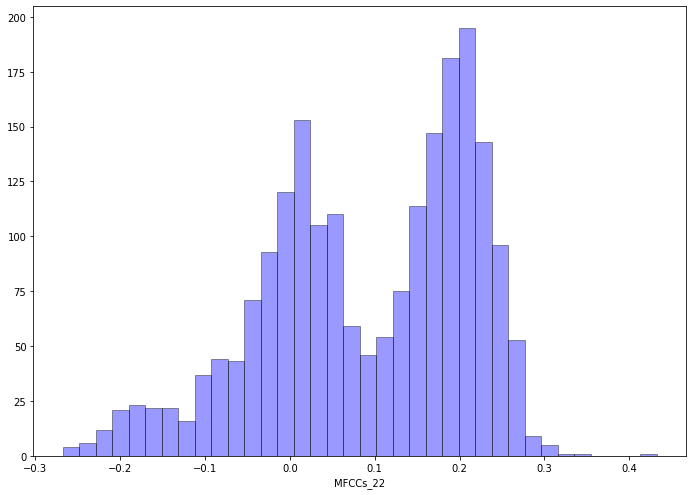

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


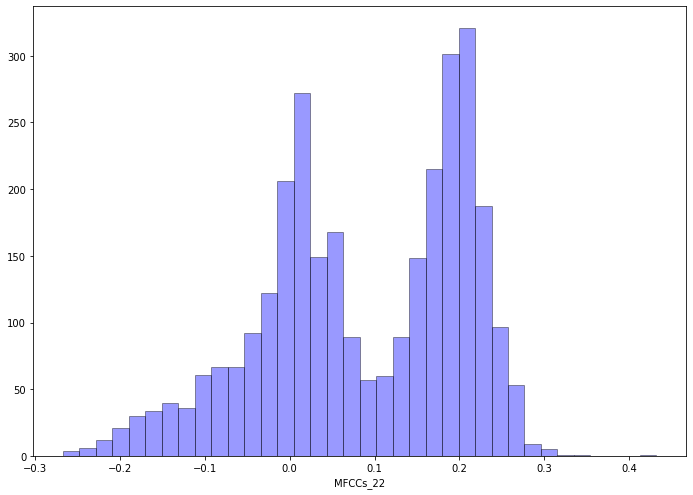

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})



### KNN



In [ ]:
# Dataset to clear

currentDirtyFrogsKNN = dirty_frogs[2].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

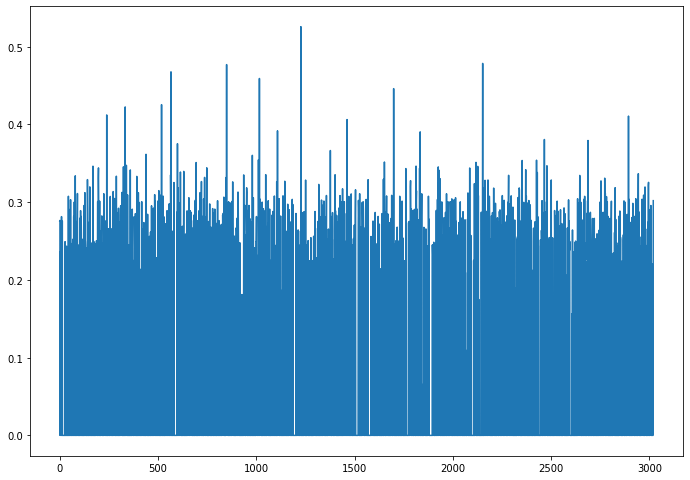

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

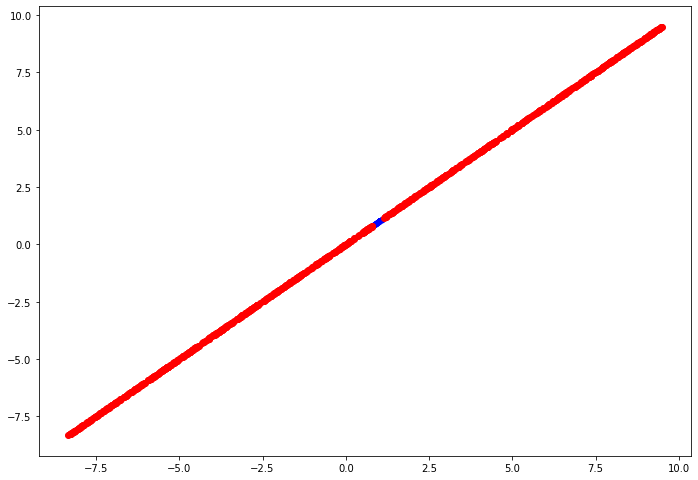

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.115)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsKNN.loc[i,currentAttr] = currentDirtyFrogsKNN[currentAttr].mode()[0]

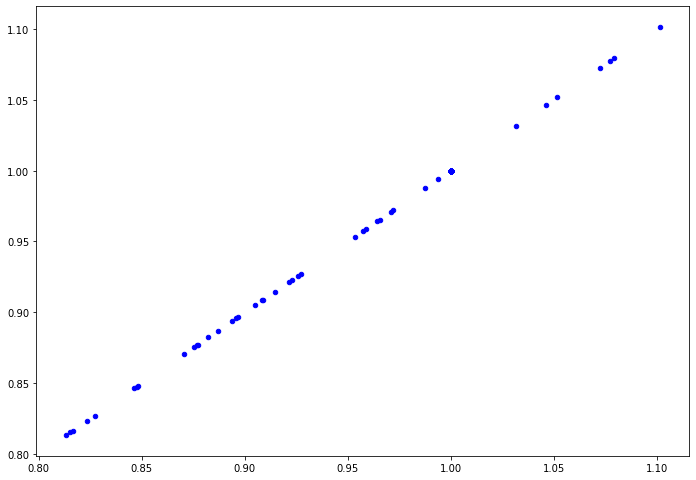

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2' 

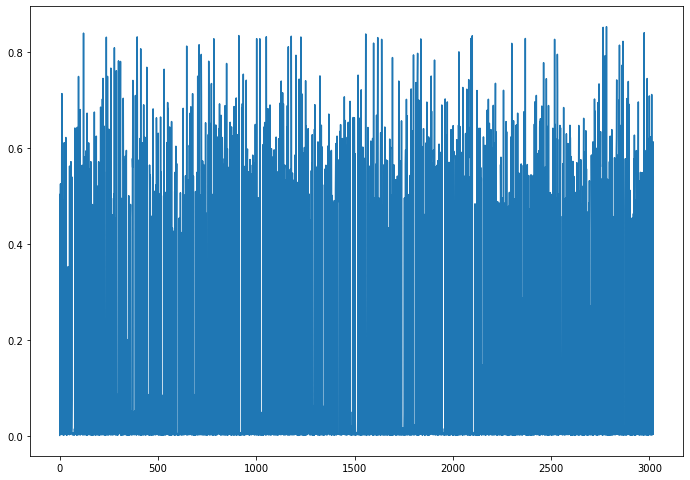

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

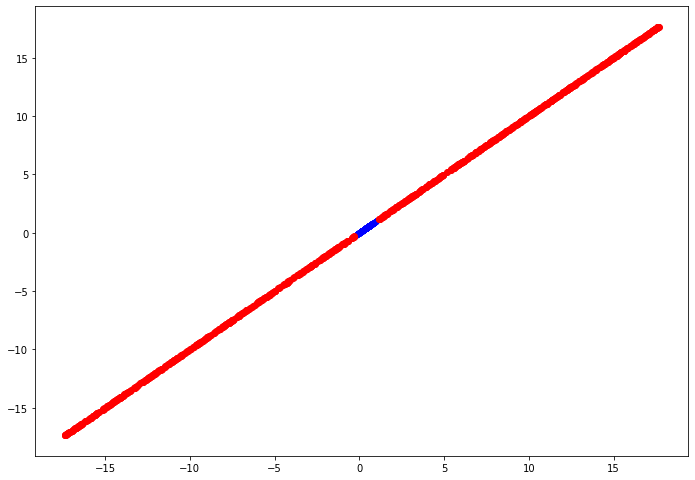

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


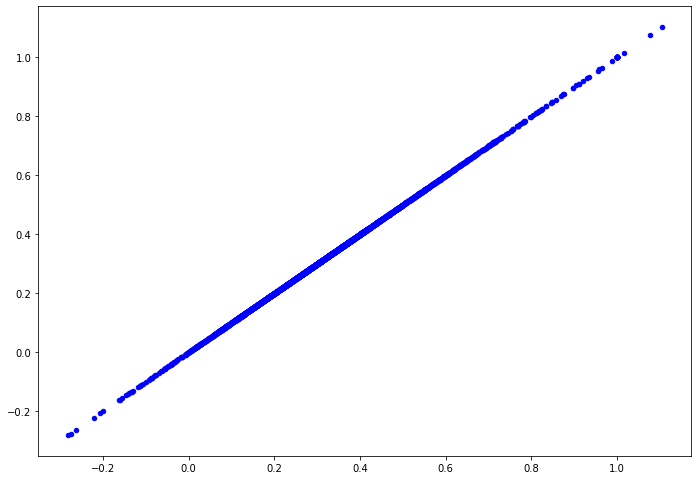

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

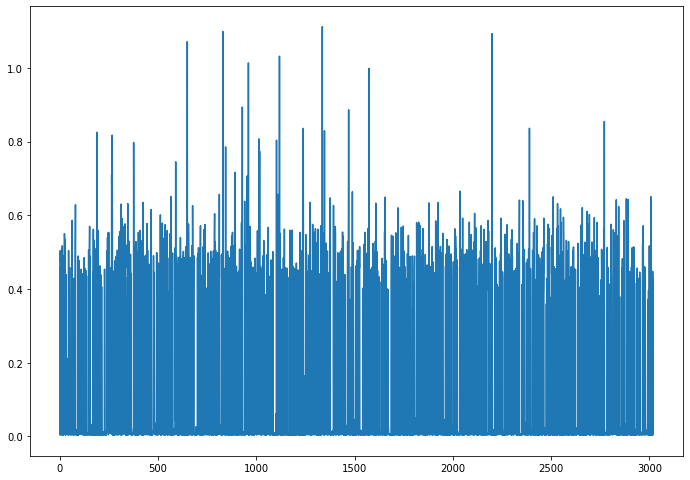

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

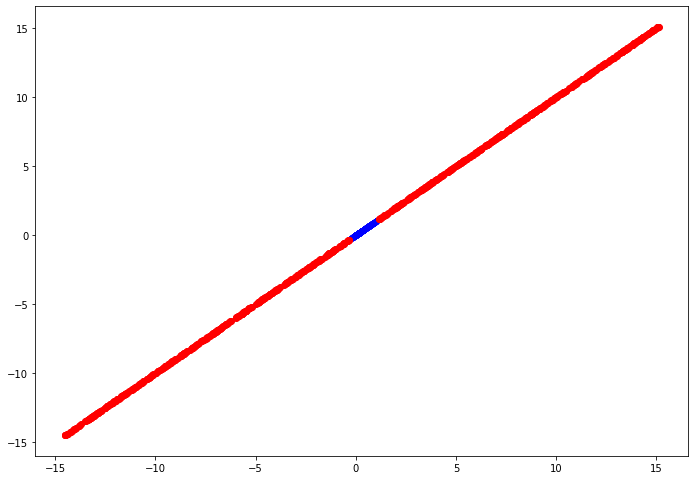

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


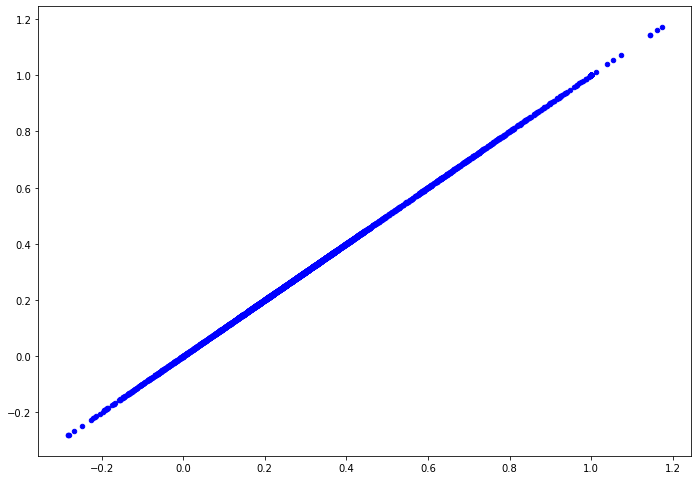

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

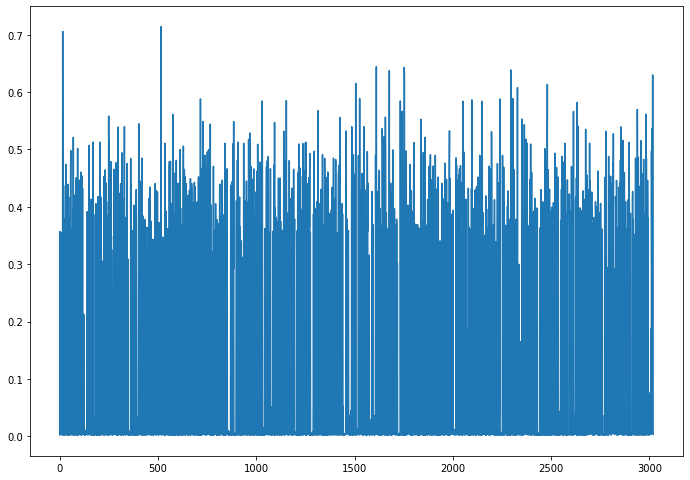

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

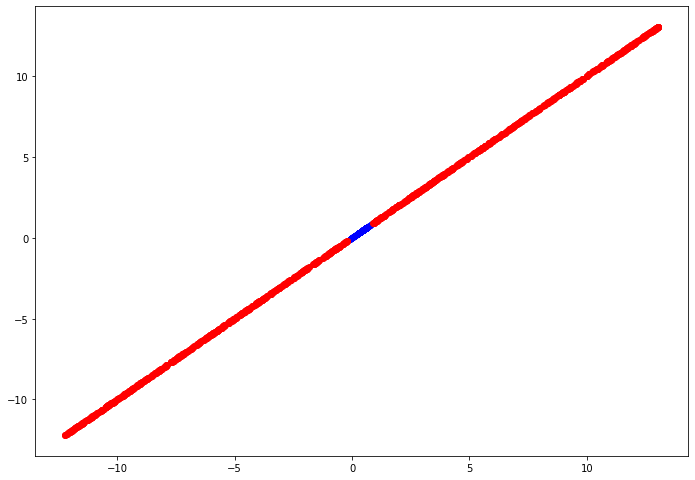

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


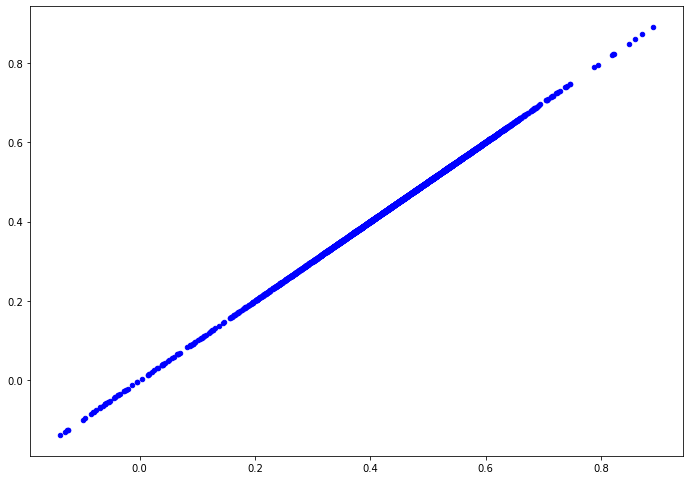

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

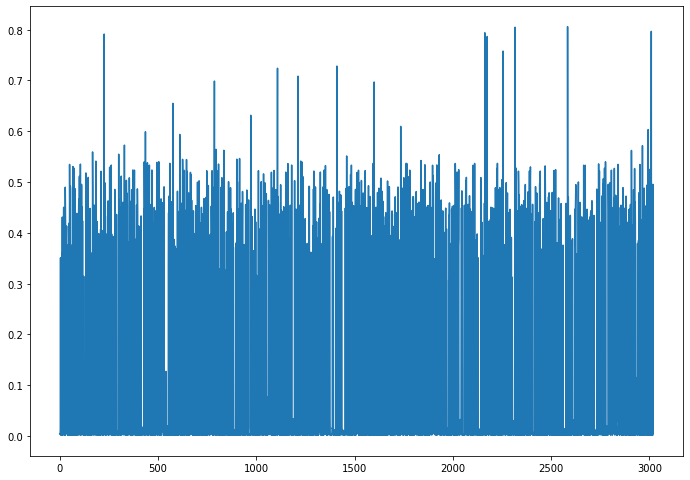

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

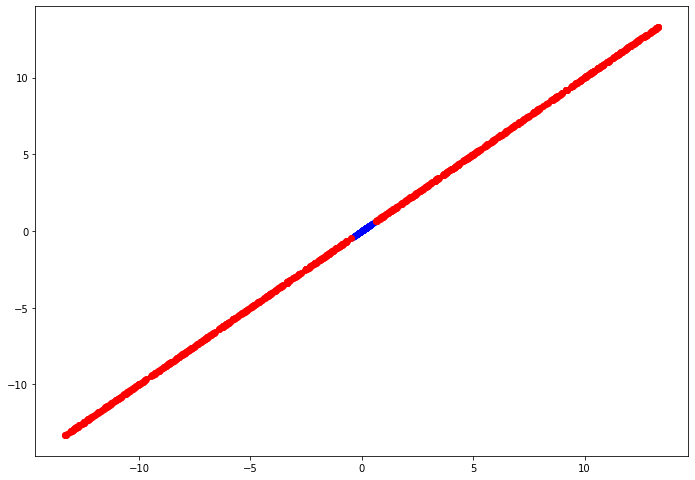

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


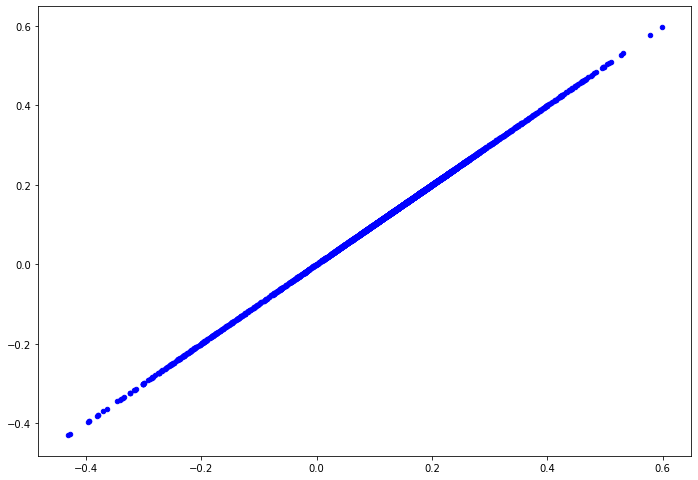

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

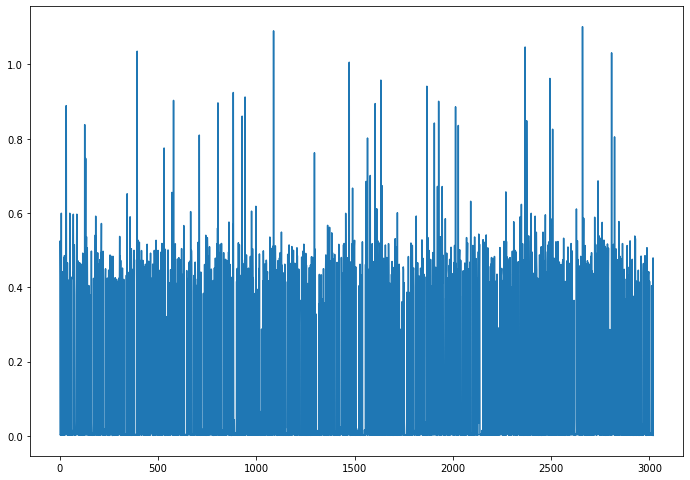

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

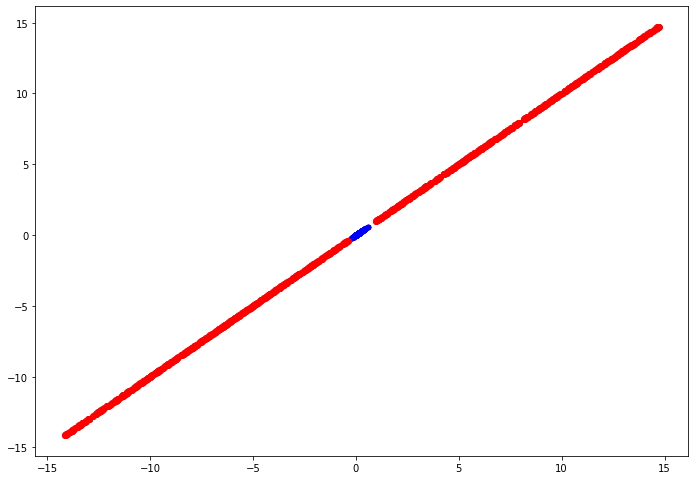

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


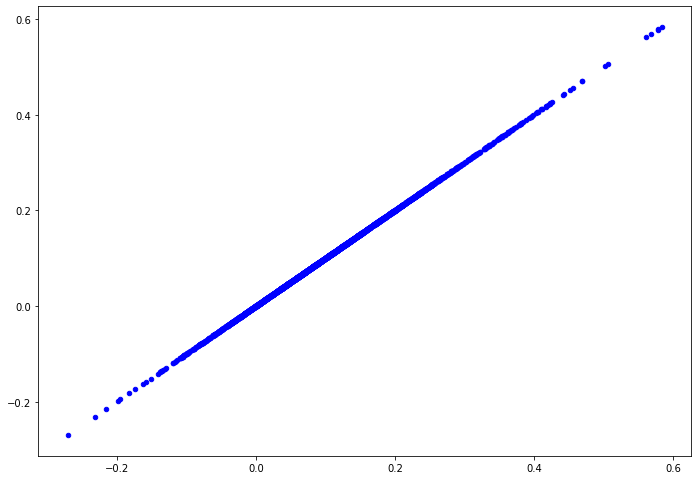

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

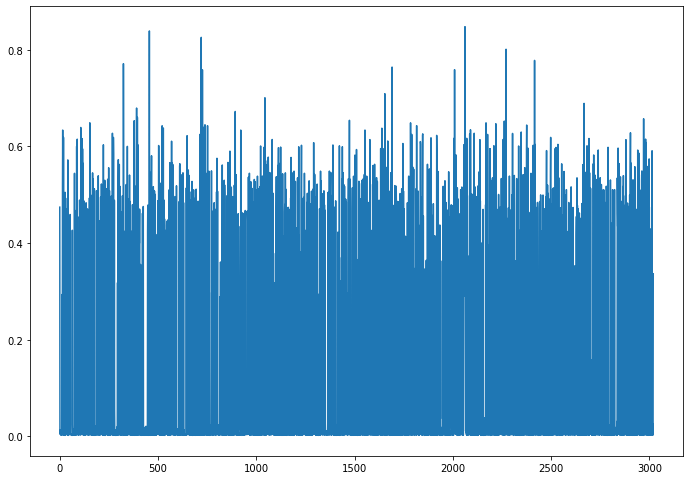

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

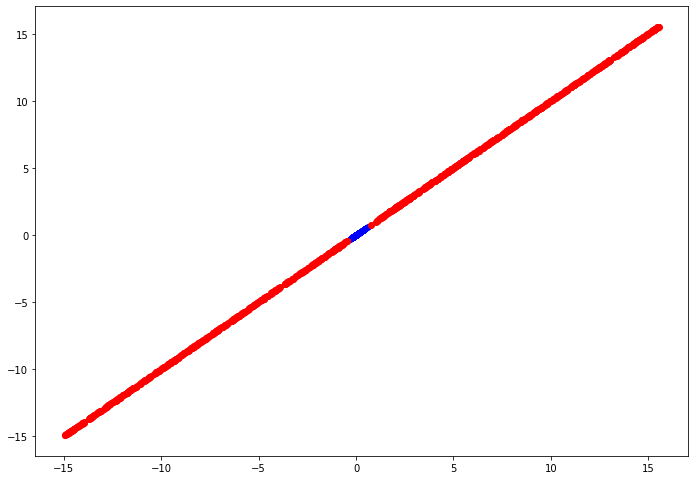

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


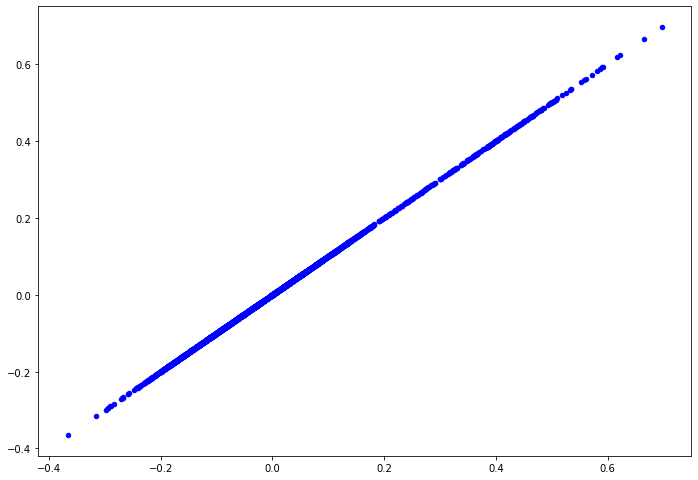

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

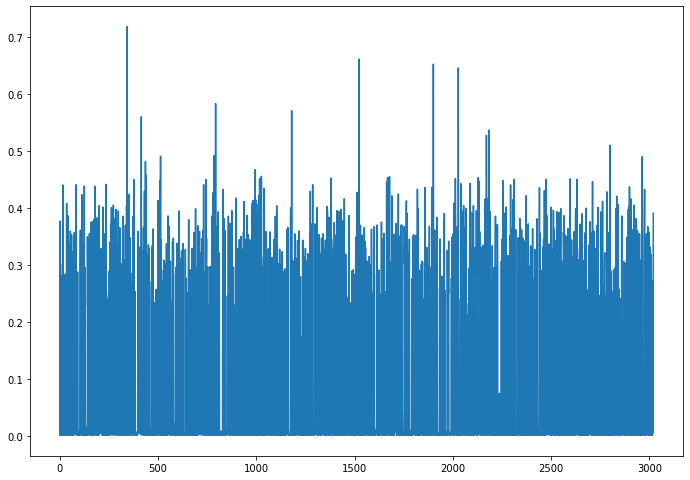

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

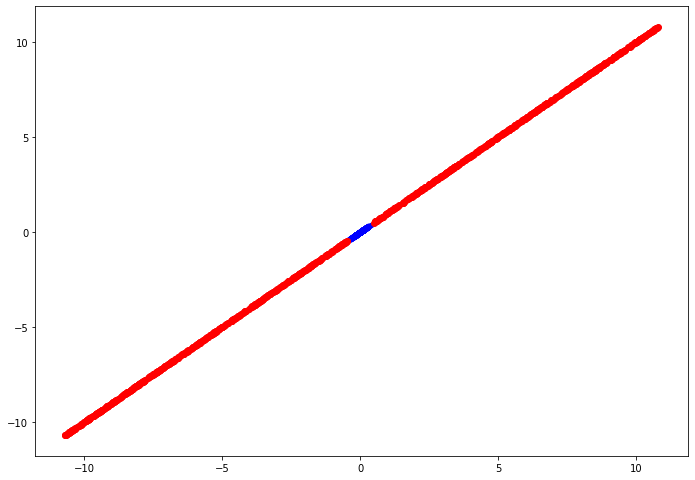

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


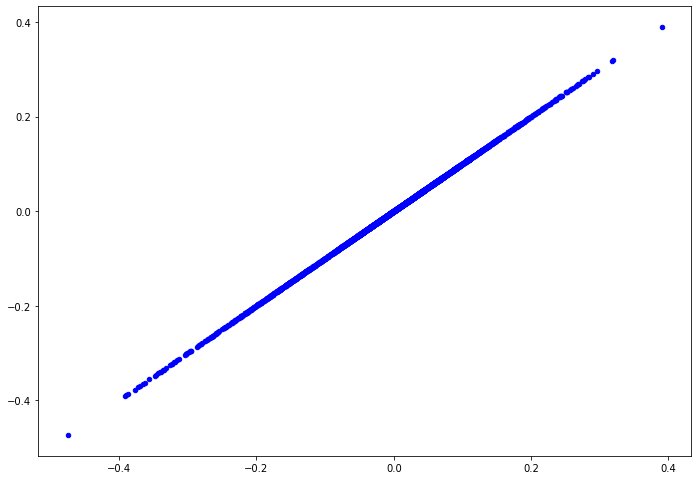

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

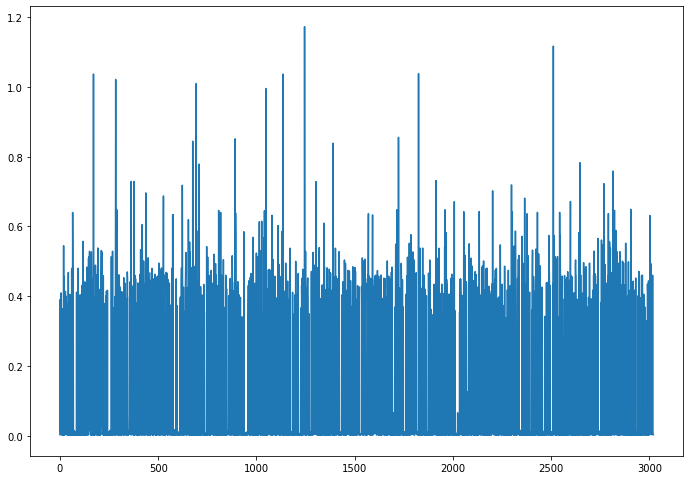

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

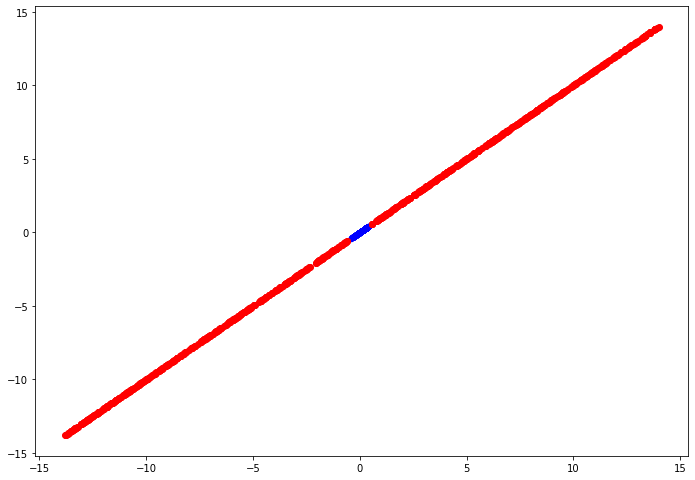

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


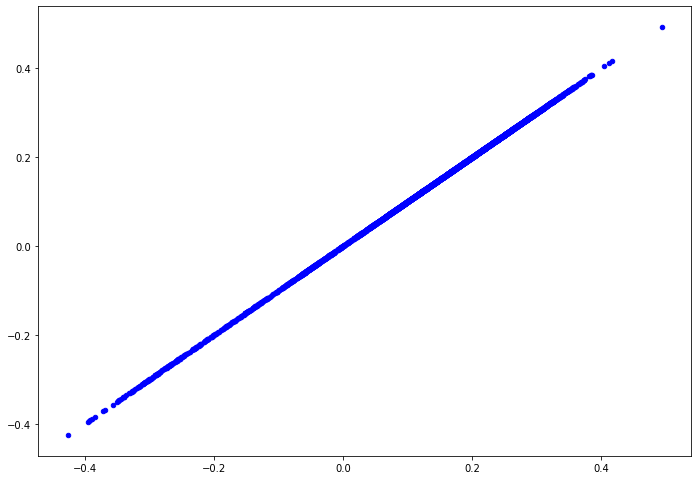

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

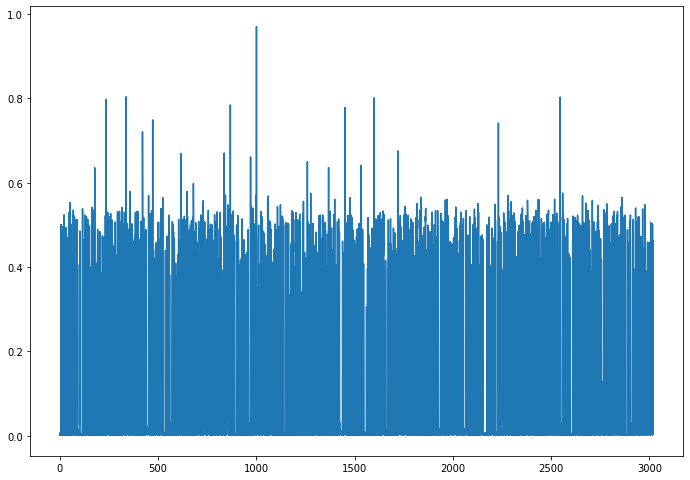

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

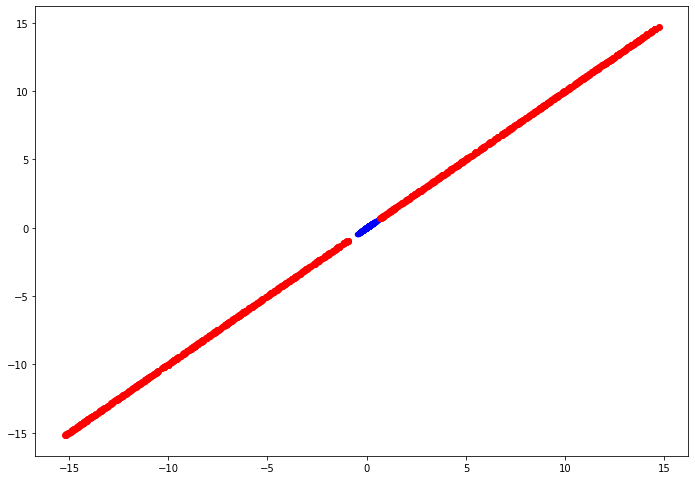

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


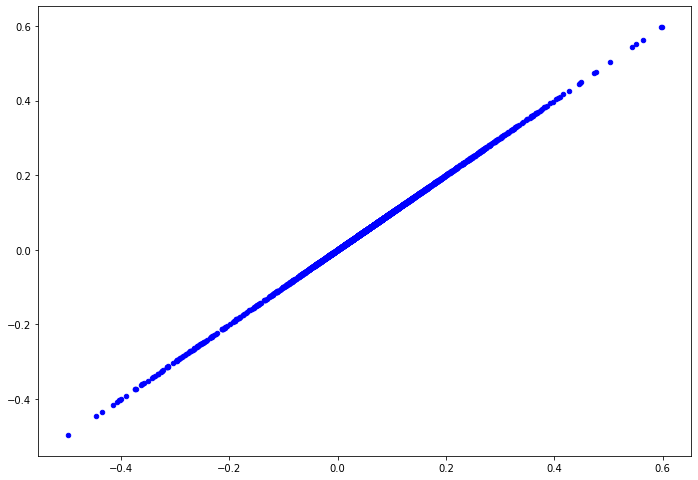

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

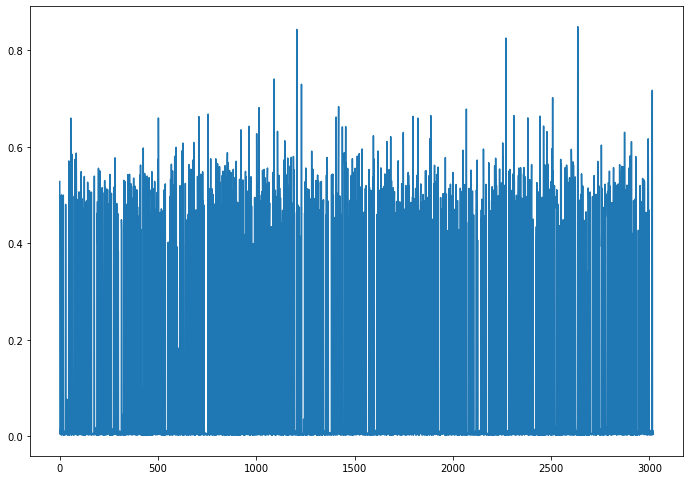

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

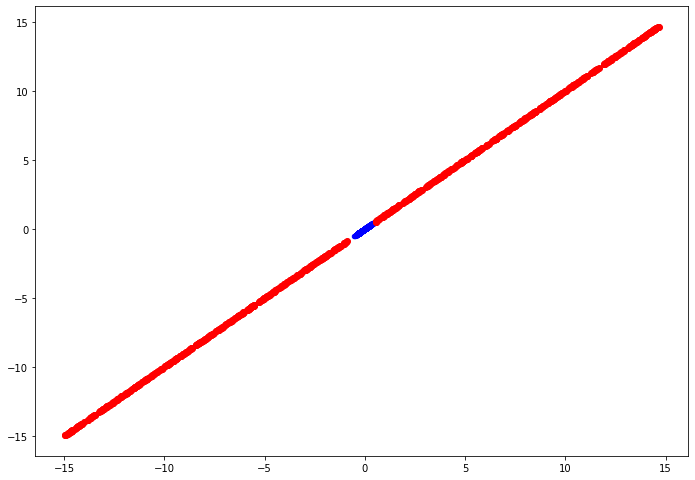

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


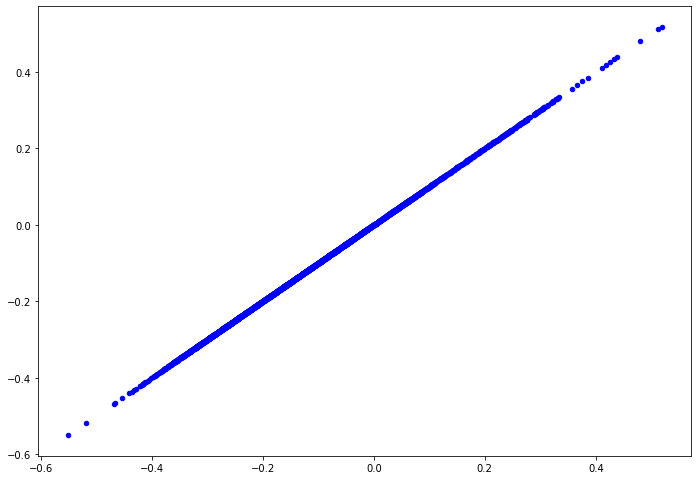

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

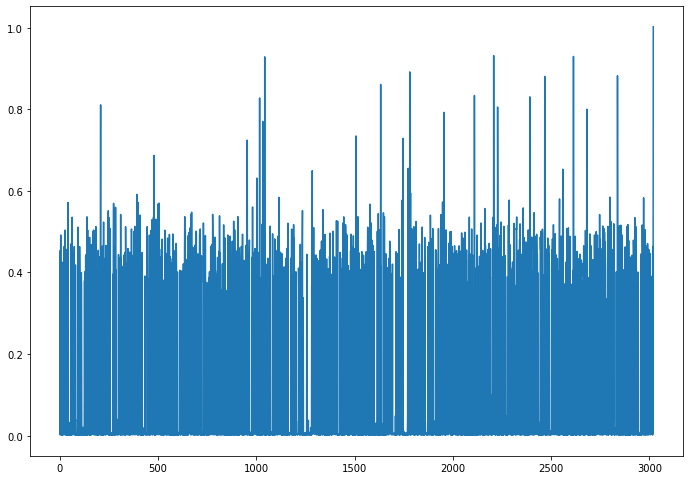

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

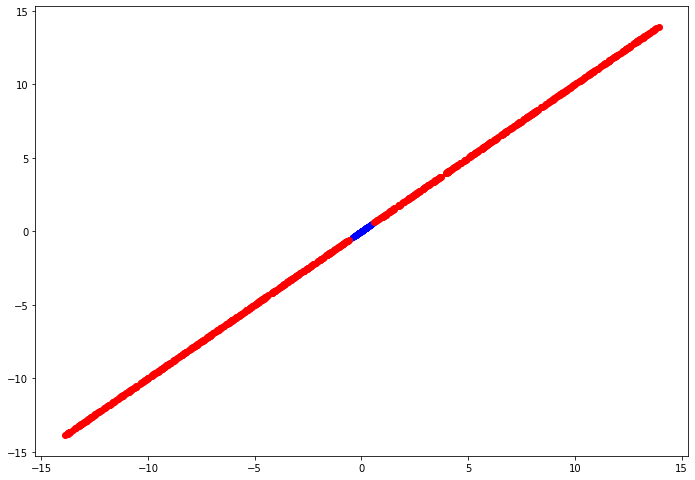

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


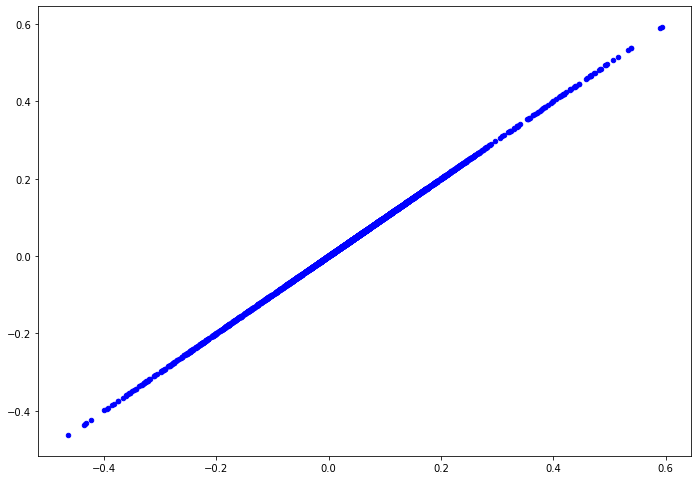

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

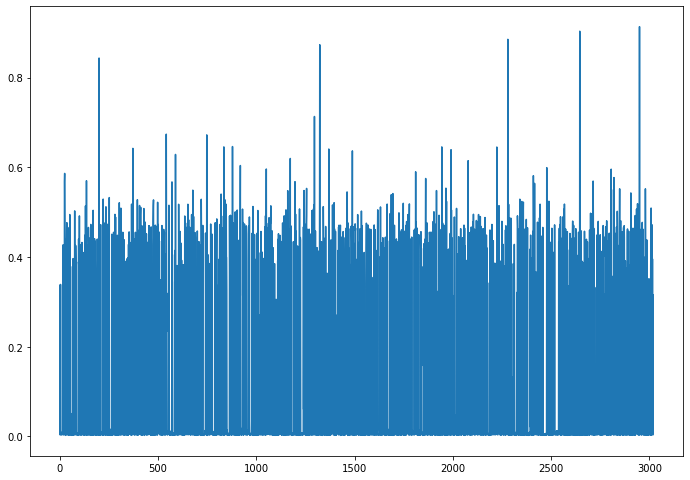

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

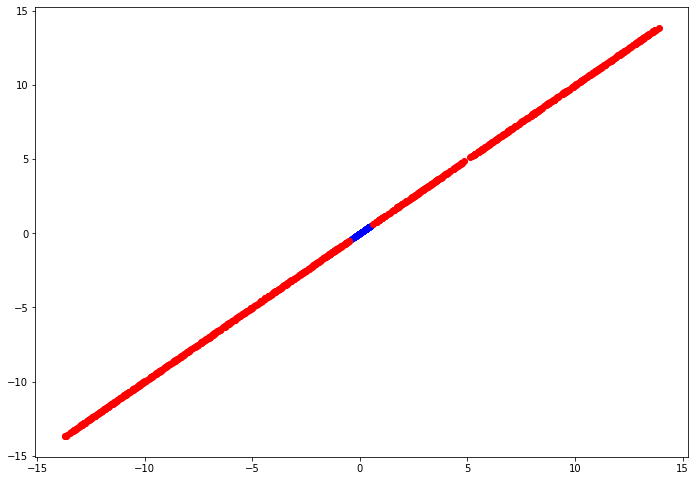

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


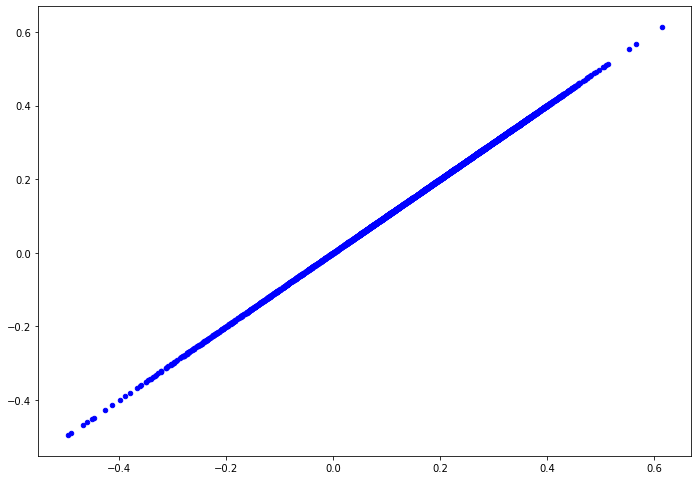

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

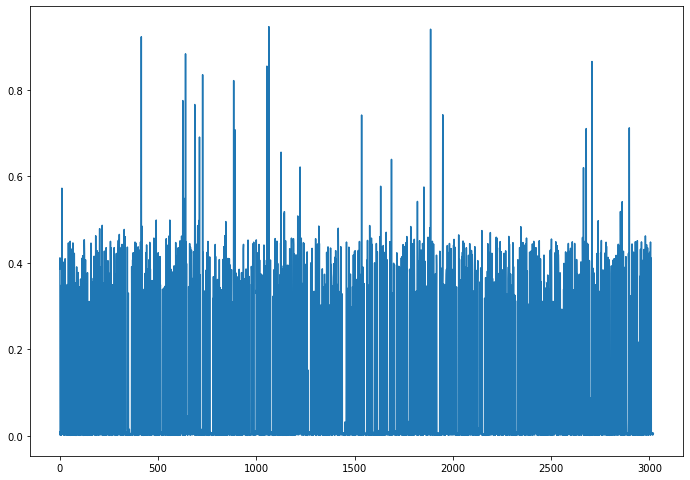

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

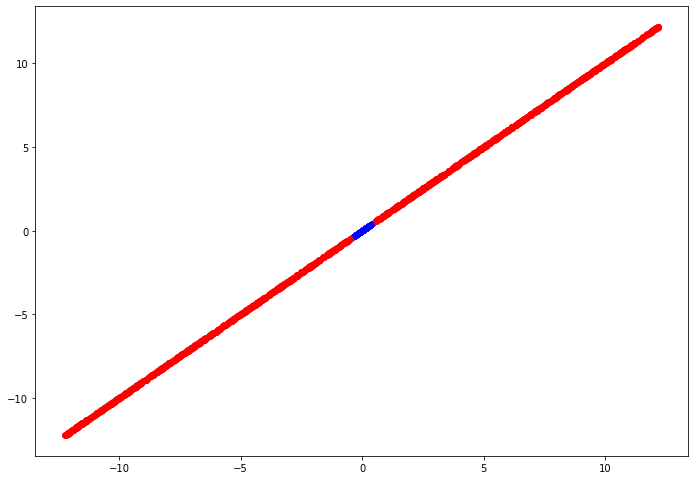

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


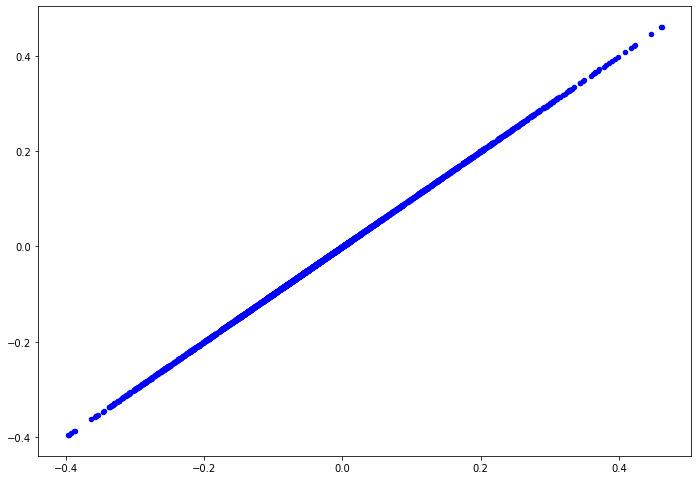

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

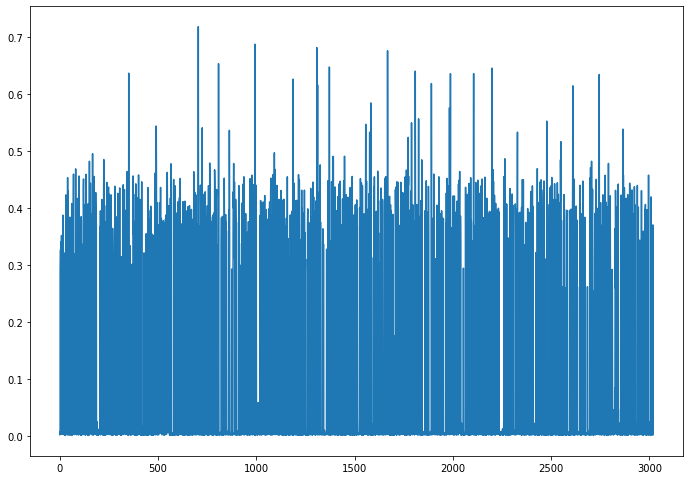

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

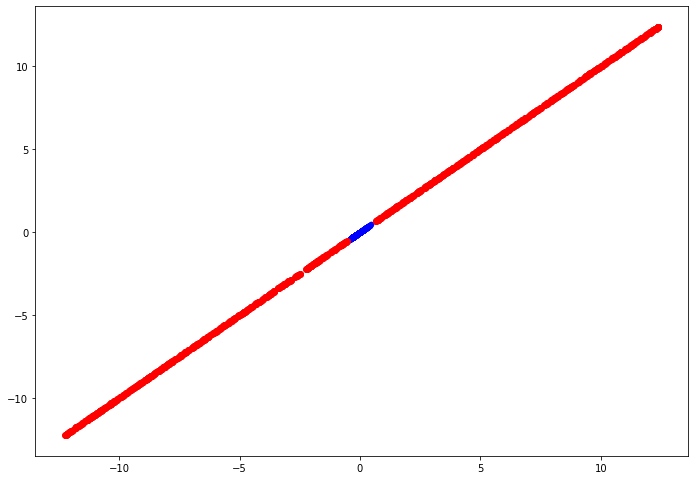

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


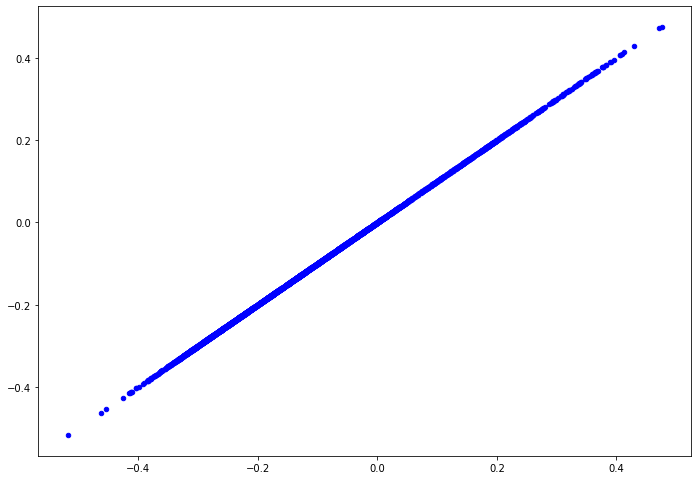

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

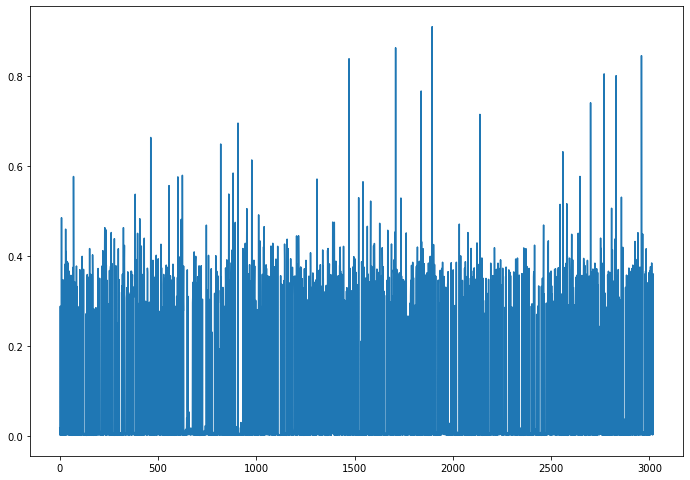

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

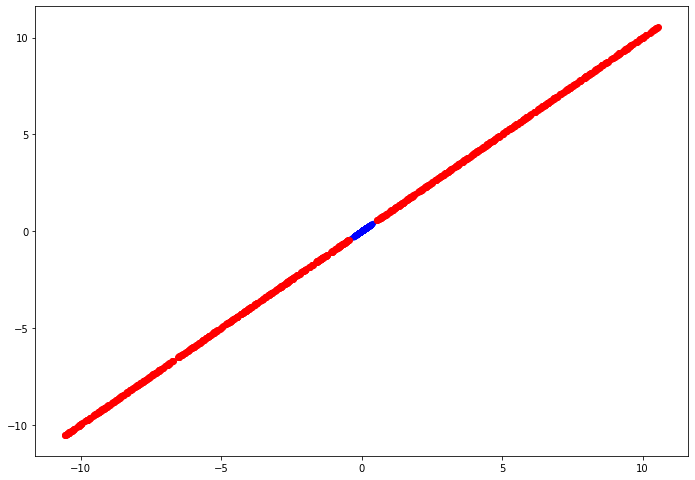

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


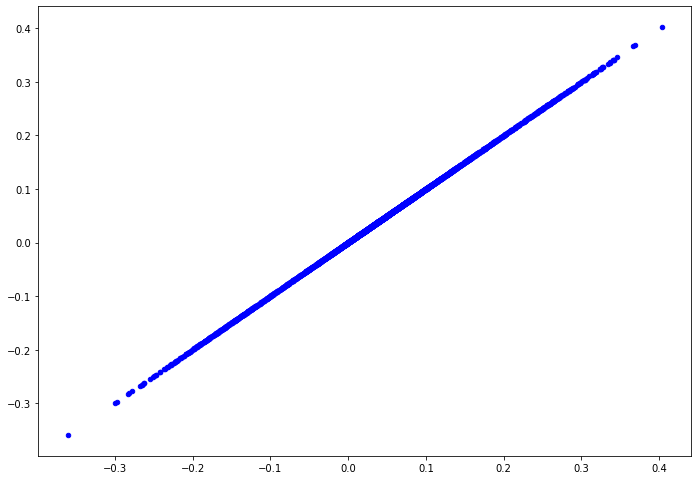

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

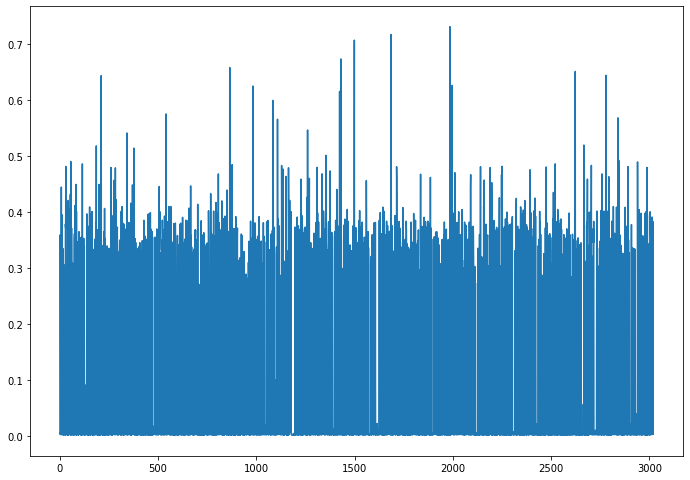

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

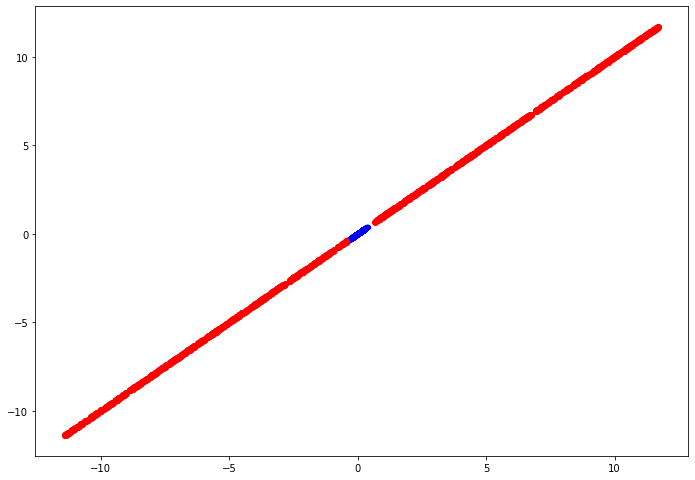

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


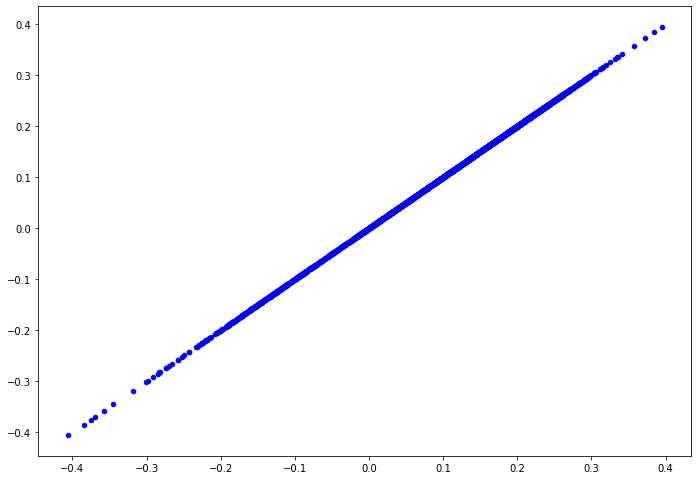

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

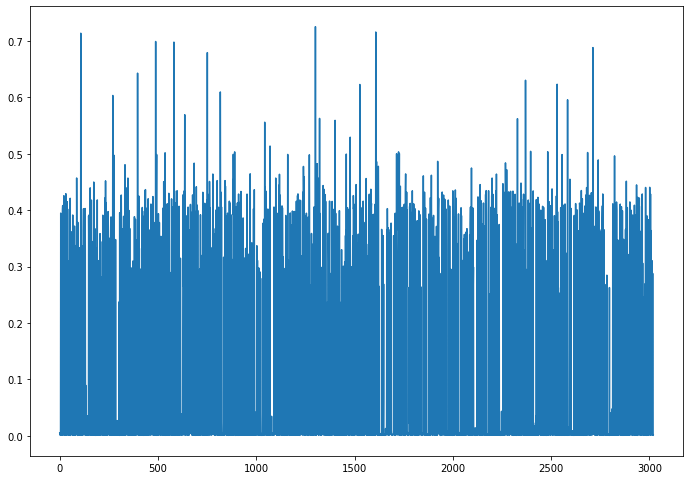

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

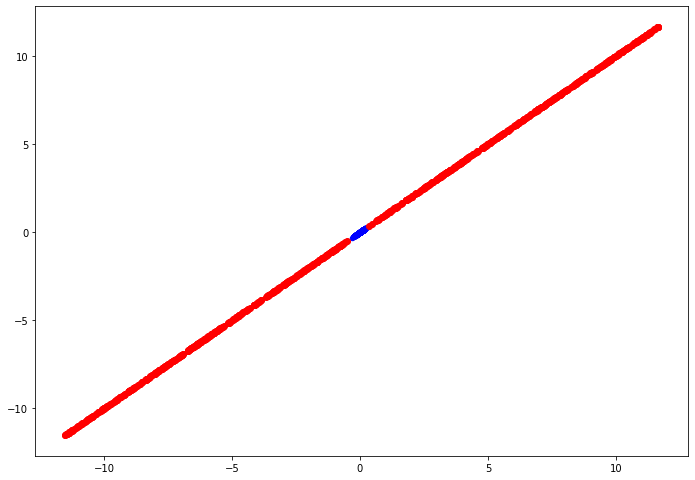

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


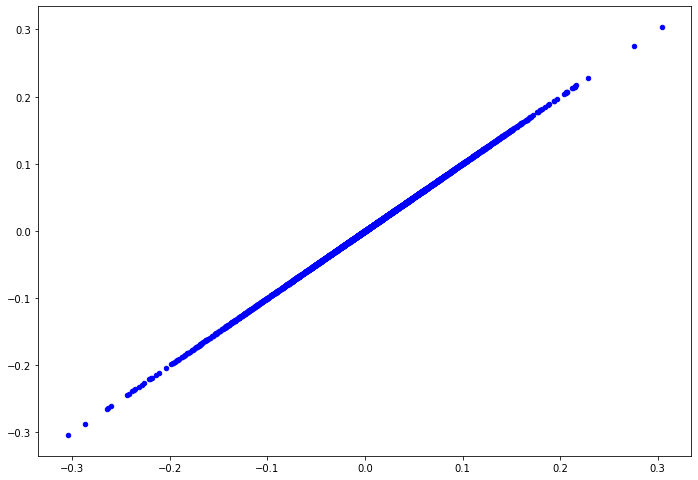

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

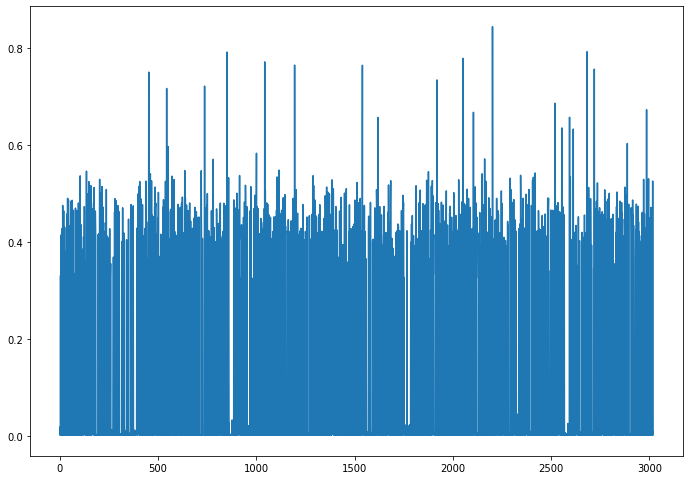

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

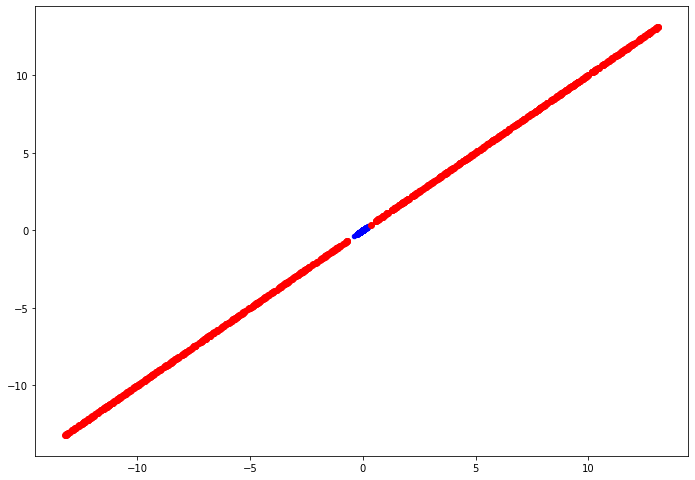

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1675)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


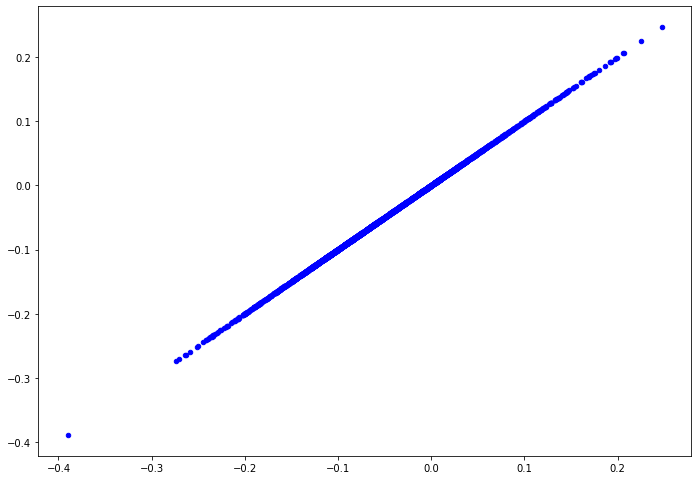

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

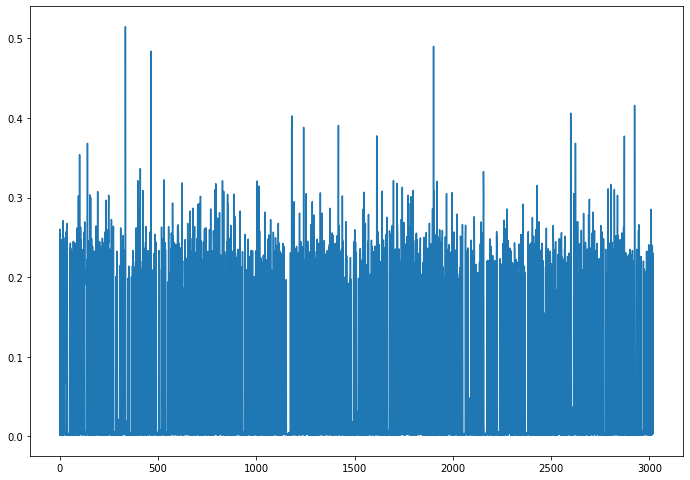

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

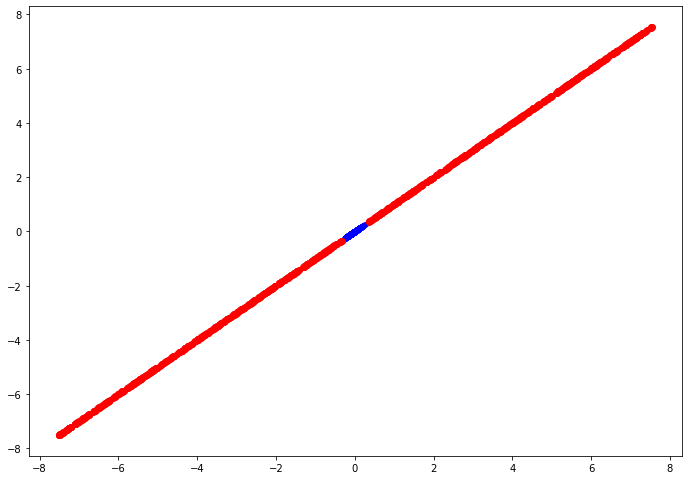

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


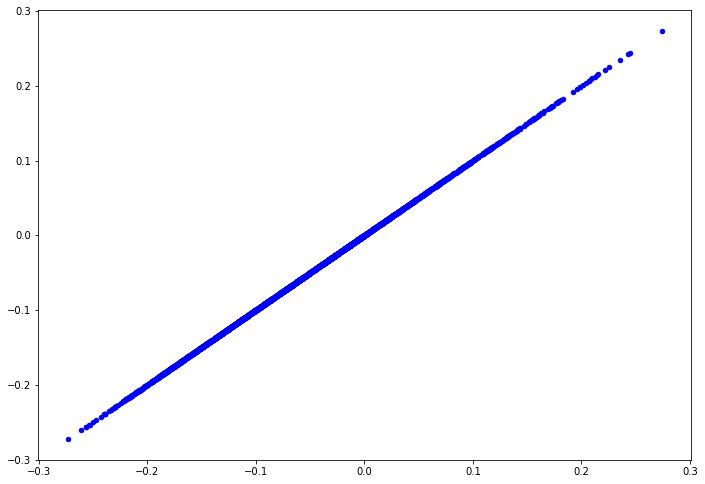

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

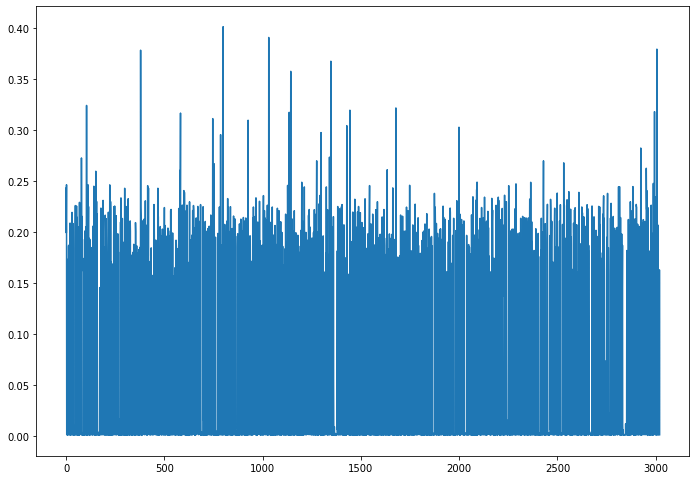

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

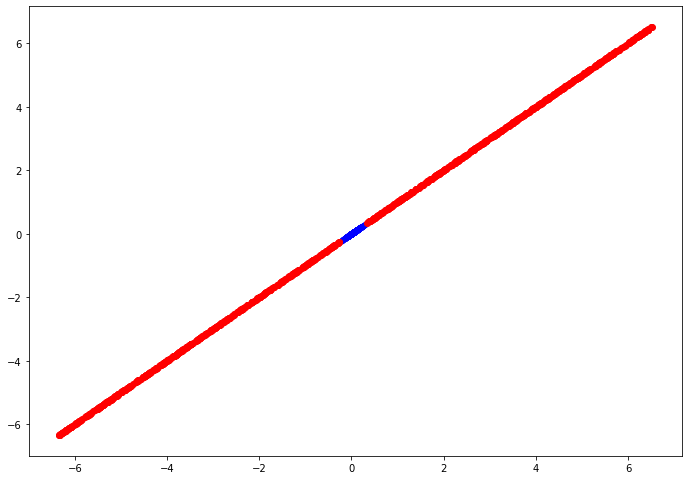

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.08)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


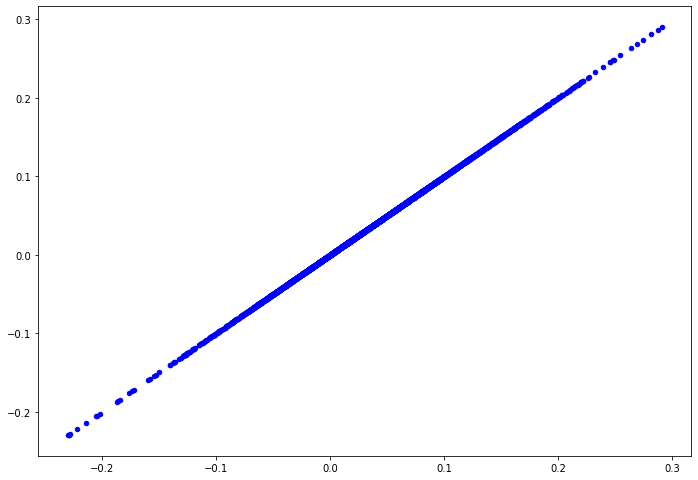

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

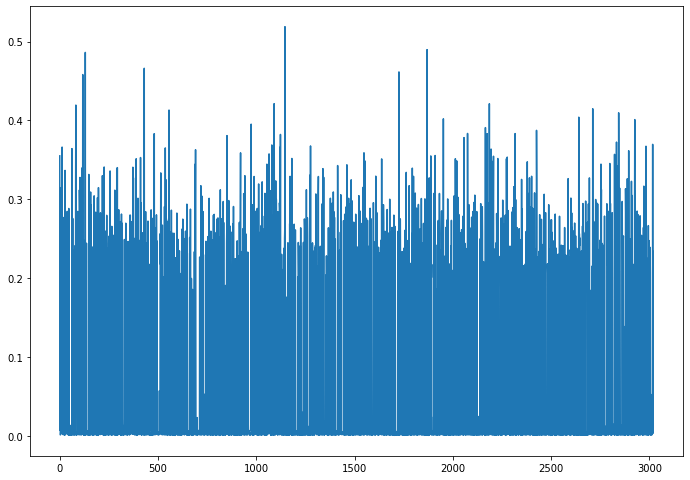

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

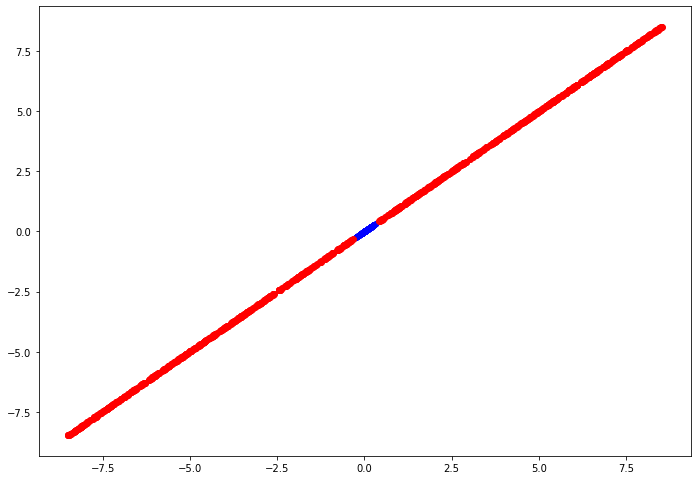

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


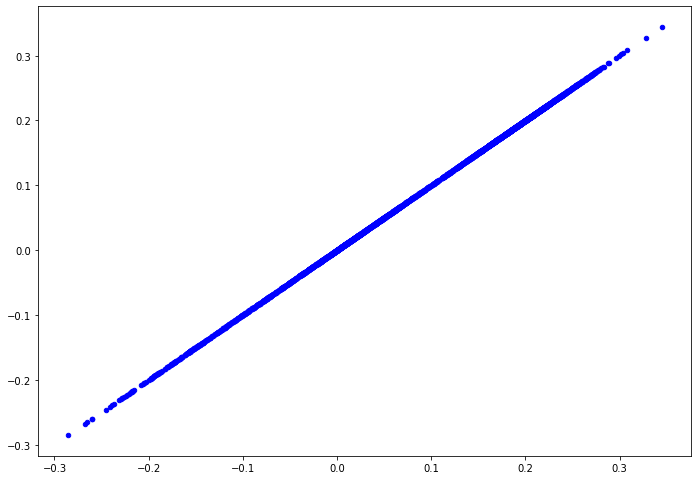

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

### ML algorithm after outlier detection

Z-Score

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsZS)

In [ ]:
# evaluate ZS with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8821582257530619
Recall   : 0.8821582257530619
Precision: 0.8571793475969242
F1 score : 0.8528076787694628


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate ZS with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9321416749420721
Recall   : 0.9321416749420721
Precision: 0.9327627690973826
F1 score : 0.9319778710920693


KNN

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsKNN)

In [ ]:
# evaluate KNN with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8884475339291625
Recall   : 0.8884475339291625
Precision: 0.8764614659546426
F1 score : 0.8615984148288316


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate KNN with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9288315127441245
Recall   : 0.9288315127441245
Precision: 0.9304235270312761
F1 score : 0.9289794761786114


## Accuracy 80%

### ML algorithm before outlier detection

In [ ]:
X_train, y_train = frogsSplitML(dirty_frogs[3])

In [ ]:
# evaluate with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.47600132406487916
Recall   : 0.47600132406487916
Precision: 0.2265772605115181
F1 score : 0.30701498273392974


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9476994372724263
Recall   : 0.9476994372724263
Precision: 0.9497037685257979
F1 score : 0.9481865706215954




### Z-Score



In [ ]:
currentDirtyFrogsZS = dirty_frogs[3].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-1.1543356762743855, -6.941326207845509, 8.558741725642196, 2.2948041441504268, 6.429580823252532, 8.827817561606082, 5.817788667017128, -7.462502522255521, 7.832296998198318, -7.548153147620495, 8.830134544154838, -5.185137819748469, -5.700393782022266, -1.8274602660005612, 2.178946851968164, -3.4409579663542065, -6.525852441671864, 2.368205172588356, 8.755822156739447, 6.247492137487177, 9.169580438860663, -2.757879979131551, -3.4882646201060155, -0.9370826291909378, 5.755721088307773, 8.496635126007341, 6.386924568353136, 4.708067275632722, 6.458299487301716, -1.9240207227122608, -0.6958490158347761, -4.144491267443975, -8.151253811673454, -0.5596017645919096, -4.725075185017859, -7.289087824372856, 2.072767575223041, -1.8157896098984985, -6.595098924728841, 2.952905487366685, 8.835808129568143, -4.439273736094359, -5.708608206689917, 7.525210036471877, 7.697939765308892, 1.5210876044522414, 7.678342479809553, 3.019215259764008, 7.66378937687958, 9.38419

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


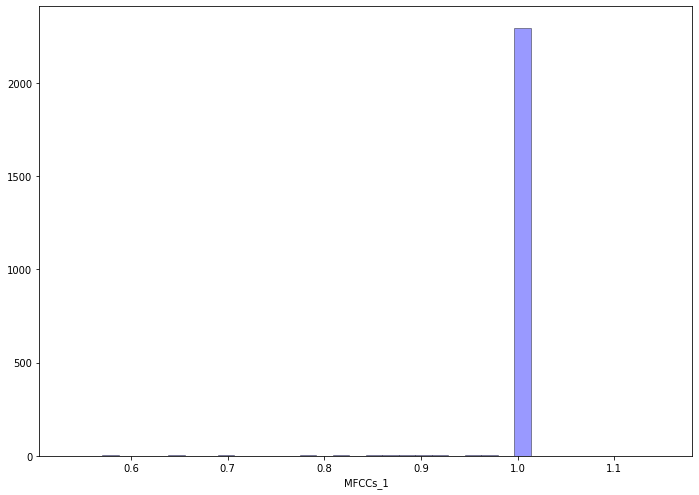

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsZS.loc[i,currentAttr] = currentDirtyFrogsZS[currentAttr].mode()[0]

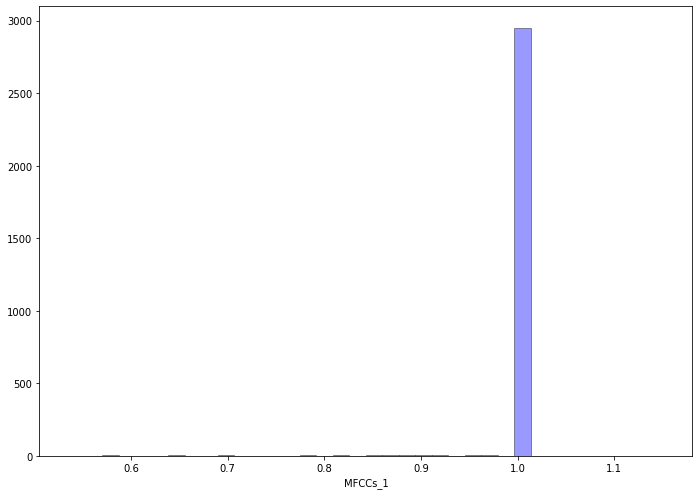

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.4889575029139093, 16.502167258885883, 2.6021991565026585, -0.8523116791717911, -14.858363814700471, 4.826714470280537, 9.44340492454155, 9.66535817722032, 16.313972593209456, -1.922031574558039, 6.320121321472738, 16.210497157177052, -13.372153407791576, 13.511304304195146, -8.846265281881013, 16.471450604793358, 17.004876460890646, -1.8317541101945436, -12.064427299111966, -2.4718284108798816, 14.504064620544934, -11.11920009075376, 2.045455227937717, 17.483864265120925, 6.003951336540109, -16.8331101185927, 9.42713791219235, 17.605392979452994, 2.568198333610676, -13.154135176675036, 6.051827791949297, 6.211586289666784, -6.267664536797172, -6.059205130148969, -8.21446631666208, -13.177780861693808, -1.39897956012722, 12.109100736183256, 9.322996560801014, -15.849581221360308, 12.609228119827357, 16.46976541692875, 7.36138408287027, 10.931695434403228, -3.747333089779636, -16.691175627897707, 17.217586278611286, -4.04607289237331, -11.64575477936612, 12

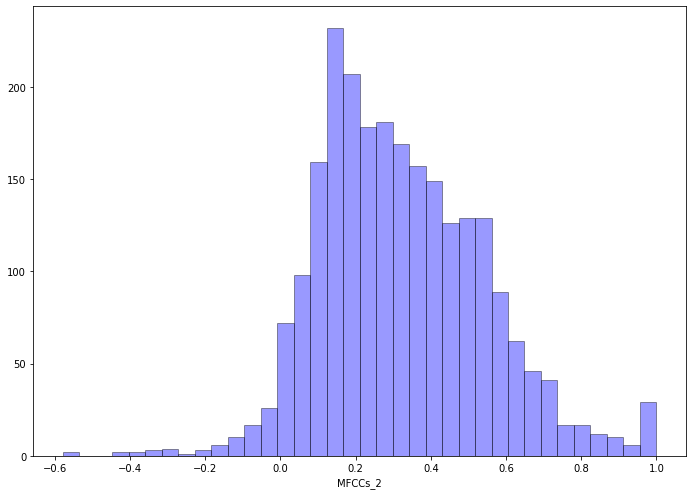

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


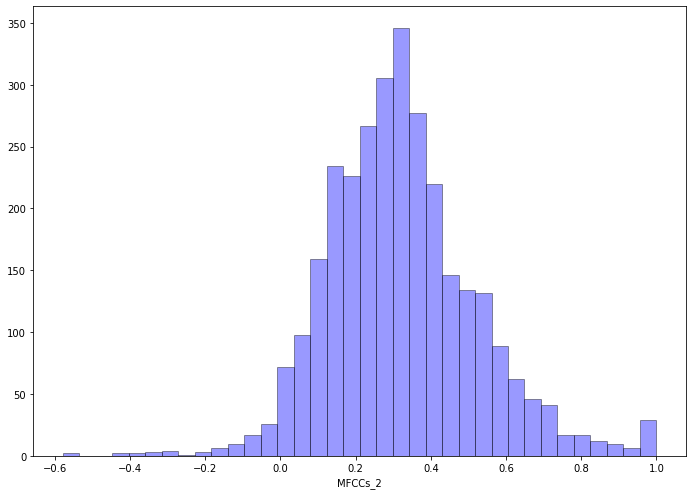

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-11.509897449711758, -14.3103642146421, 13.099629427820732, 5.803664134907103, -4.55069409637491, 14.563553077349608, -11.126664536298543, -3.8960851647284502, -5.626321369082293, -11.451423240609872, 12.501264823233535, 6.250617629141672, -4.920794815105456, -14.292049456036583, 9.55828162123283, -11.28333184006921, 11.44987494071707, 3.915416242813556, -4.547894271103706, -3.9177496478815392, -4.738861086614946, -11.051896023451366, -7.100606910727327, -3.269226308955288, 1.0, -1.315697595680918, 6.771077308955739, -6.580468768543038, 3.3812438977875856, -13.393499686269834, 4.032674092777468, -9.803879988374948, 1.0, 12.468592079827008, 4.424551571454696, 14.823019717277967, -13.921837398646346, 15.069408758095166, 9.557080827063473, 7.20601407067268, -12.334051892028498, 10.412710198821104, -1.9192754704212192, -14.061223261638805, 1.0, 5.982014922532137, -8.721028207857849, 6.555220866033688, 1.0156007941908345, -9.00473994733831, 9.327401428199297, 8.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


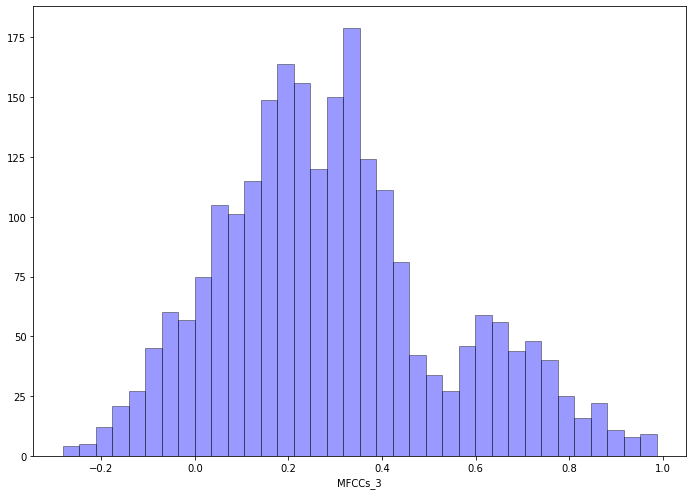

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


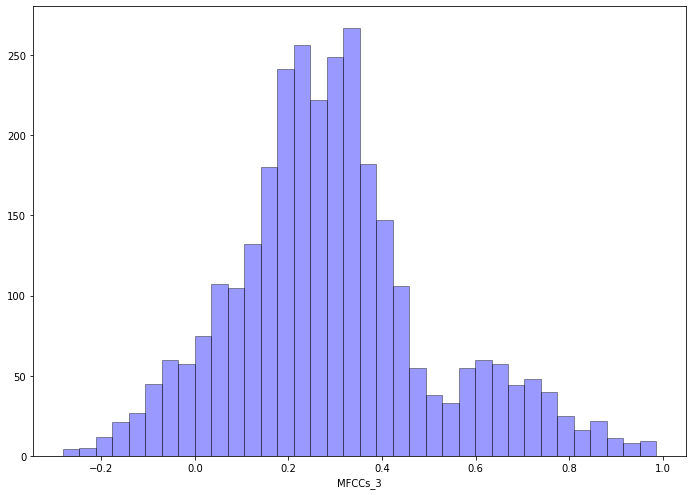

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [2.4255821006427536, -1.890045328526325, 10.866860478108972, -4.283739678065745, 12.379131692690354, -10.384843237078703, 2.0629874202210576, 10.66647619437957, 2.3926169916077957, 10.913696665278223, 6.001223369274522, -11.94900209301048, 11.222736263897213, 3.0904486676329643, 12.013137262205763, -0.6539552857861661, 10.73834871830511, -10.54500704364105, 9.369785861498986, -8.980372657287418, 12.05907151575764, 9.144819561390088, -11.48025745760833, -11.8287302556815, -9.639383991995894, 10.801164000240473, 8.938084776274017, -11.264888302237312, -5.574430384012542, 7.184844047206134, -11.17741419319932, -8.659867084054591, -5.57445538377268, 4.640457095812332, 6.704819675066495, 2.027496474141551, -4.306263186586193, 3.817589806895493, 12.941526404266153, -11.031542519856416, -2.383380297308541, -6.887772778534489, 11.345650850084583, -0.8008021520047759, 6.094244833187172, 2.8516966395440093, 7.412221164986121, 1.6242743290436048, -6.744927619672492, -1

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


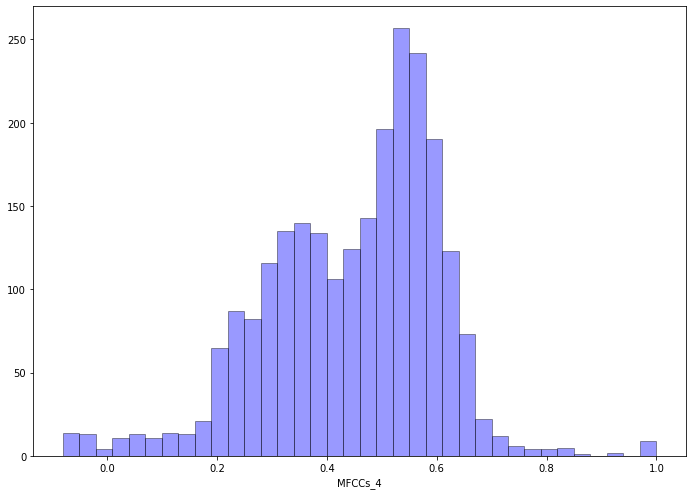

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


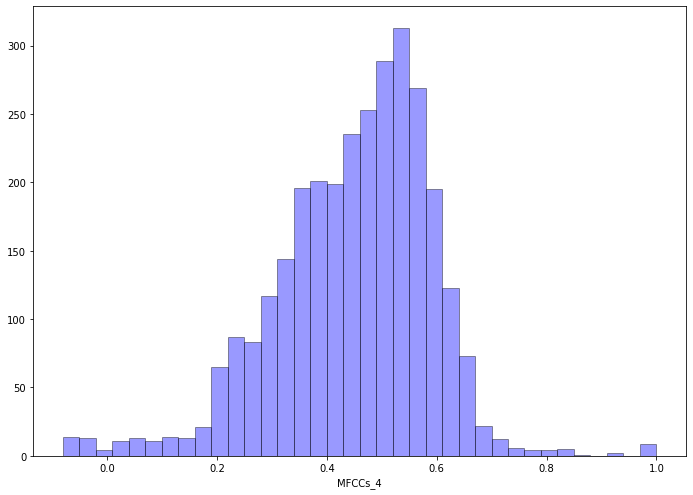

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-4.173678266807279, 8.683335150310198, -4.502817394597129, 10.72199674592838, -4.239614735359179, 3.2614553621330167, -9.452724057798555, 9.935789242296012, -12.716495132725566, 13.241626350843385, -1.2987358186466924, -6.374236198940124, -1.3710572753065442, -13.092457837451288, 2.0720108268987163, -11.177402895170648, -12.96333127354243, 11.490022763539123, -12.214639196085727, 1.0950832217334994, 10.617486134488054, -4.980011808545873, -11.025336536452292, 2.9956493429381594, 8.330218220634245, -5.34587607901554, -5.257167715204512, -0.7798448618475451, -3.810618264820606, 7.0248773749713465, -1.0114251745658542, 7.850306858433294, -11.609231474355944, 6.799526158482841, 10.982475694007904, -3.881120534652789, -10.075378635219936, -8.841831436677007, 10.284432756732055, 6.1961812546073975, -12.977952552545585, -8.412986056508574, -1.1130445319086115, 2.715969227422756, -0.8709542194302689, -2.3153614469214983, 8.830551827525026, 1.7404443440160045, -9.36

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


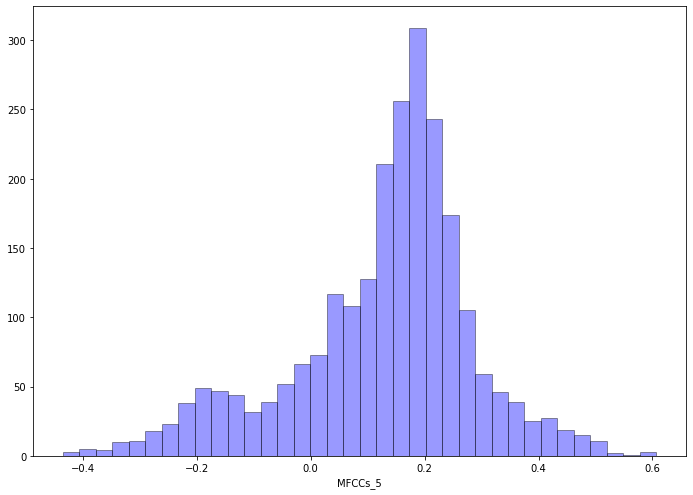

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


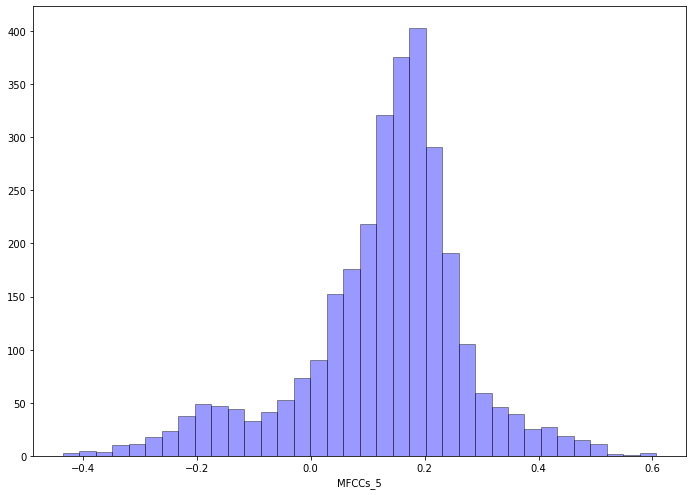

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-12.445571970648404, -11.75360743704341, 10.08840505172236, 8.54738516555441, 2.0030967508802595, 5.093478246400609, 4.46428185725659, 12.929294409372146, -3.652327472341309, -0.6419161716130155, 14.064239218188373, -7.99209233706458, -10.998523710157675, -2.750483768086444, 4.495440495358141, -13.203956272888956, 9.982882010079768, -14.025710842783791, 5.762951821541794, -8.726008353918463, 13.627160153319336, 6.998666609927472, 8.051803094982317, -6.668015927361359, 9.788782692832166, 12.59255793936281, 13.129775687059178, -1.2371694186288575, -6.81996178367308, 5.570622418439865, 10.790870908085294, 14.660793458338883, 7.78545247420967, -9.136981280723788, 5.927104924607699, -6.256792415295126, 9.503764219254483, 3.2027953294063747, 5.790231125307252, 3.213366861336346, 7.430542127759181, 5.48096899950373, -9.964699626539414, -5.8219872127412575, 12.290959618556323, -13.7499140624709, -10.281428619716744, -2.3754439523737165, -8.990982109176109, 11.90074

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


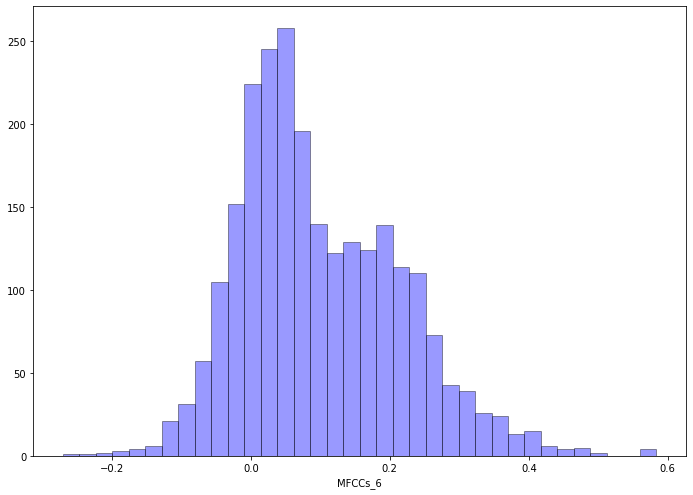

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


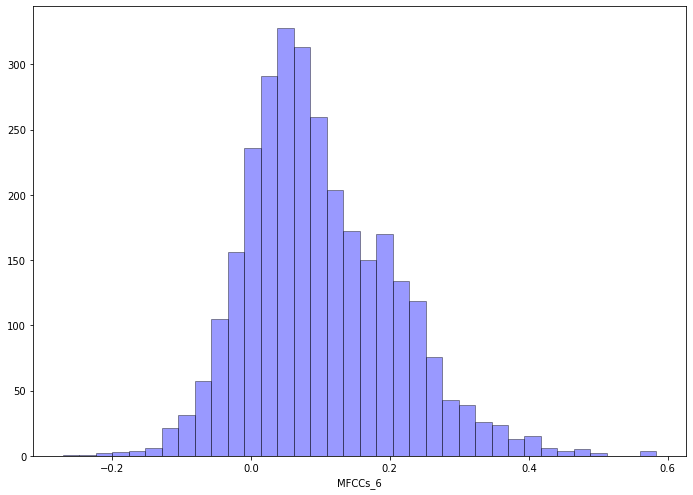

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.15)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-14.244110751876168, 6.481861833746066, -5.421018612477653, -3.8112079530922314, -10.36757092517438, 4.098844989083389, 14.978483768234394, -2.8364906278587405, -0.6271853781882673, 10.227857509445927, 3.174822342671656, 11.815366234501363, -4.682508905838455, 4.496091832323119, -5.844212460482551, -1.9279320925983343, 12.589305389595932, -10.11039054106391, -4.324161688186015, -4.926231390936982, 3.235871867447517, -4.863807762230378, 2.846931172124424, 2.3721900300265784, 6.367249938562075, -11.028635518969113, 1.808013604784494, -10.770663865690889, 15.238442369368364, -7.183468663342251, 5.49171022305914, -7.245334987586102, 2.9363150219569194, 6.413149012187356, 6.6585381381712345, -12.288285328327232, -11.5008074891134, -10.221901238160957, -12.770659766333916, 8.659414980728688, -4.769598611476498, -11.587330399380631, -1.7215819726462769, 12.272859639565942, 8.793451196818923, -4.372703350115666, -13.925022781899417, -8.037604349073018, -6.588033995

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


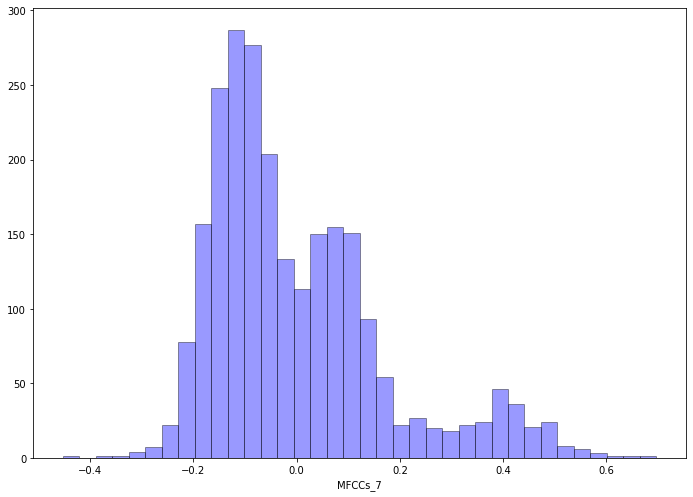

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


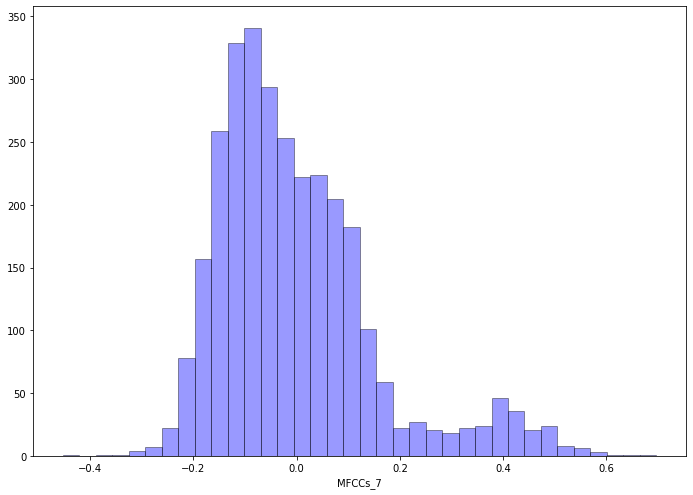

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [4.257698904445799, 5.053779275455019, -10.267092581299606, 4.350107465915431, -0.526924578475823, -0.7503617438814398, -4.228081969624186, -5.899541792997733, -0.4923401646276506, 9.3164488565418, 4.223817829373526, -9.59496003958357, 2.137391928851992, 4.549330789528308, 1.1636547799378023, 7.865362857917773, 7.469925594532822, 2.923804179746808, 5.00664476200152, -3.965668530564532, -7.220773222338438, -5.115837295714285, -0.7039361267573732, 0.7654505554933393, -4.513597657998937, 4.63170476235267, 2.170872025103748, -1.340272890497161, -5.954471133934288, 4.649798197435419, 10.396673714287628, 2.1888398816399617, 4.649044821509189, -2.346805696610863, 8.156179366356678, -0.814134990080218, -9.172651536304953, -8.258629733194923, 8.726316103140807, -0.7914311008139556, 7.84251222784989, 1.2088637658396428, -3.3004190314218, -3.9661834498569055, -2.1850893296473384, 10.705152203127373, 1.8132678974175969, 0.7623933647220603, 8.467774134361928, 4.935504280

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


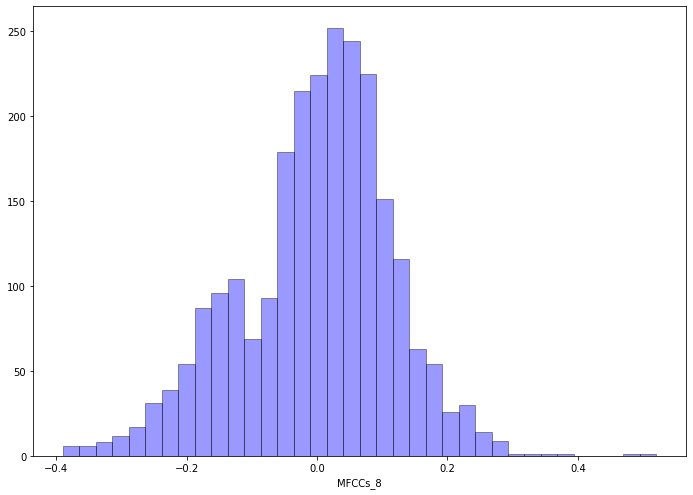

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


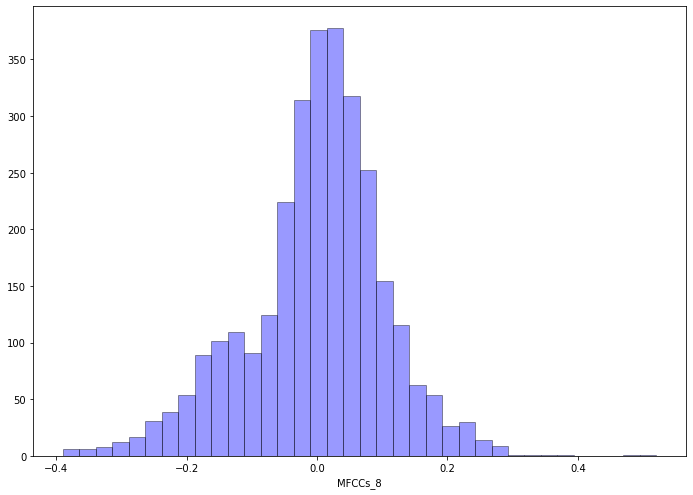

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [11.170914495029017, 8.217217094931417, -5.898232092155761, 5.891742466193363, -7.295559473237433, -5.578928601995409, -11.134189162161606, -10.080908365678512, -3.836312857931725, -7.0535355987841095, -9.115018404948582, -7.591606779729327, -13.46886614571608, -12.23774572975762, 12.986378280316158, 10.281299914983892, -2.4817149626451998, 5.25037698289189, 1.488618996181312, 2.8448615731888625, -3.294243671946244, -6.719207135540539, 2.966945894511403, 2.1869817884909954, -0.7053811294648309, -7.108035024974631, -12.595365744072884, -9.409517200711717, 10.682922812949815, -5.090477346889639, -3.0687551652289784, -6.01611743638114, -1.697626870376595, 8.047715042571703, -0.9337681046704364, -13.003741583233058, -1.9315153484730927, -5.138234623870607, 11.343739158748727, -2.2761851344064006, -6.261499129298339, 5.089708516864659, 11.279311153348536, 8.215817357417986, -6.615756556431441, -6.235164754433876, 2.985081928738722, 13.615108732302804, -12.9772767

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


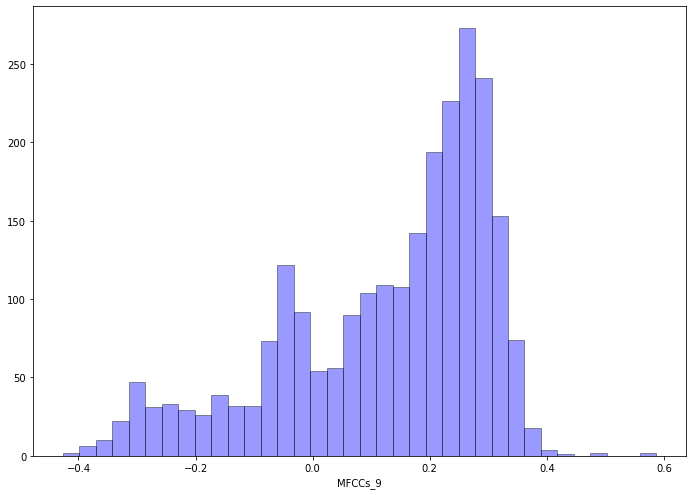

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


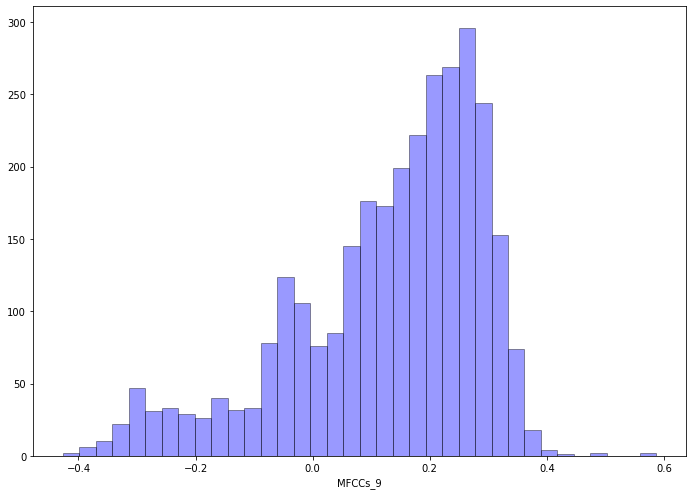

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [12.573853827492286, -6.736065477440002, -13.660826273485908, -6.612542524273845, -9.994142311304364, -10.725458013595118, -8.063063603816506, 7.060038106652833, 12.301945874978824, 4.215866353197365, -2.566675682330926, 11.13846019307238, -8.834268378143026, -1.5044796618677694, -4.202389217999826, 8.552682475874624, -13.715715674925578, -12.241456819284709, 10.085700904524163, -14.01524675229594, 3.3290840855504853, -1.682012972676734, 7.9795614173615395, 11.404562312648114, 4.754771316422421, -7.8371445415264125, 12.545591042511887, -1.8447039983101088, -1.113336878646015, 4.168660712193724, 9.350965966898569, 14.282037079383096, -9.021814658109768, -3.039675183921528, 14.707984663725885, -5.513215544617282, 8.932477961673168, 12.084374450228916, 1.1182186408923531, 5.680607147673348, 8.860459498083882, 5.27221867484919, 3.614603687073064, 12.096176148958357, 14.043663714334356, -4.931573213109395, 5.764258346985462, -7.1588328596782205, 1.830478593713876

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


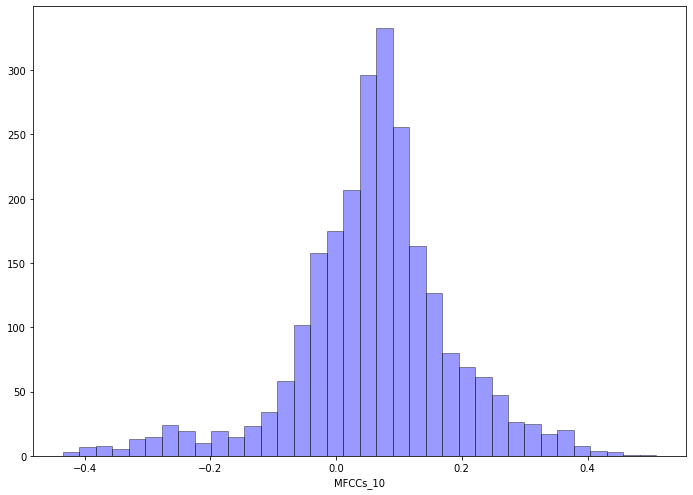

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


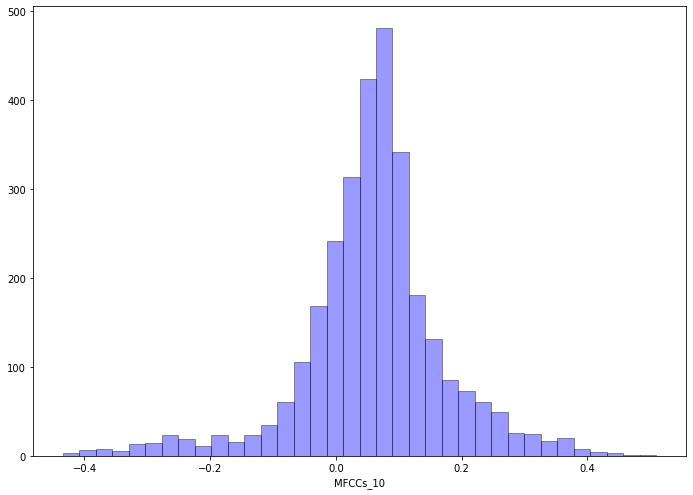

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-10.152528042914687, 4.39552062941201, -12.321932123083265, -12.325927657894256, 13.831995398036108, 9.359835373476292, -13.087797737711876, 3.023566601200244, 1.1711814767272617, 13.922961718551058, -7.336624682652633, 5.461558287892258, 4.482468199711198, 11.281837123639525, -12.832759545414635, 4.602575154474886, -4.250080973667801, -8.278077351916288, -11.620825095462536, -9.289264925164924, 5.922699726228814, 9.686869300505672, -10.706295166328742, 13.283869757452925, -5.236788751226291, 12.014952373950424, 6.396003604737016, 3.802813088192472, 6.297203747275229, 1.95578754392244, -6.150295710081839, 2.286619882466548, -10.489859609306537, 5.150359937021719, 5.979250530052684, -6.760291516014513, -7.666436116371245, -11.483321547654192, 4.902210472397752, 14.105521598257026, -10.618795785296378, -13.20919431122557, -5.957968394346855, 1.975864552376804, 3.1169112556791374, 11.626032165502956, 7.883856989574604, 7.067481026100905, -3.989435928154327, 8.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


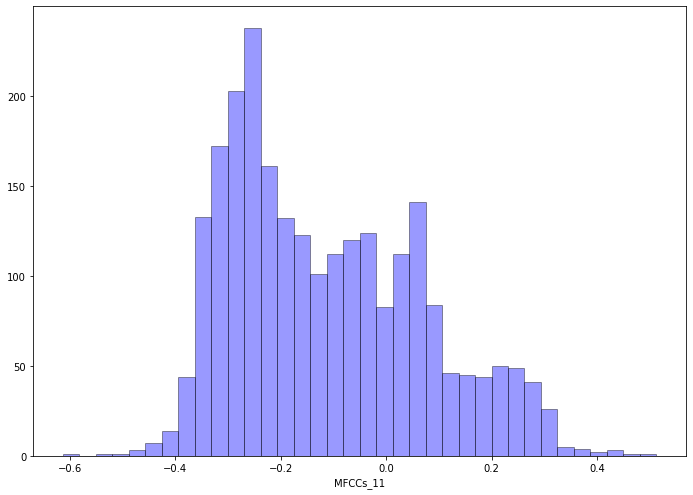

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


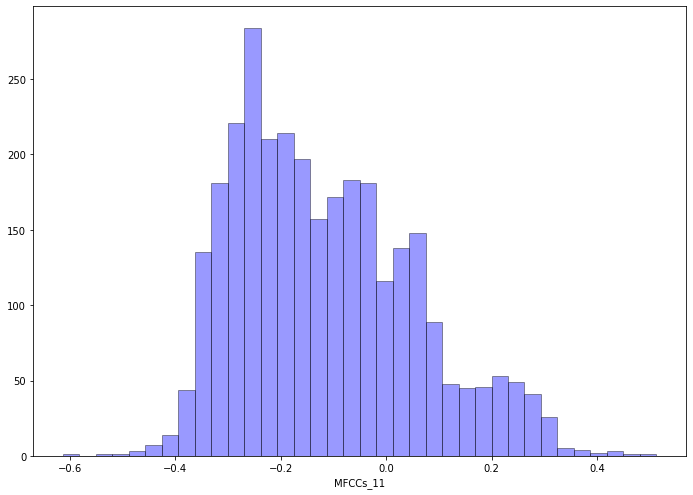

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [11.668197580066629, -2.280215954702367, 1.6990082284100387, 3.511590926189916, -2.3579832116700192, -1.9687107376324475, -11.213484839208968, 2.7423412679901373, 9.022252304363596, 6.6535059385942885, 2.8963536616567174, -4.622534782336279, 10.660754832061084, 3.42031585911996, -8.568715432382737, 12.484747170288523, -12.375979710373464, -12.210573213159352, 13.617372190776518, 10.254405086064018, 10.318029128693492, 9.69870872444243, 7.6678237901488115, -12.37648238022596, -9.305769648581933, 9.716062761732244, 3.923857639040908, -7.574035611804645, -5.803533552720934, -3.2658044894460296, -1.925296934765408, -2.352344688108237, 8.686241161588098, -11.502986682343051, -3.874622379835909, 9.89146544271562, -4.571848380151035, -8.45824994869129, -3.572184264666012, -8.341480385666355, -3.832574930680313, -10.52351505696365, 2.942490145856423, -9.102542791971608, 3.2403210402380216, -4.496326819937581, -13.62887986942248, -1.5466223882706611, 1.01390033446467

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


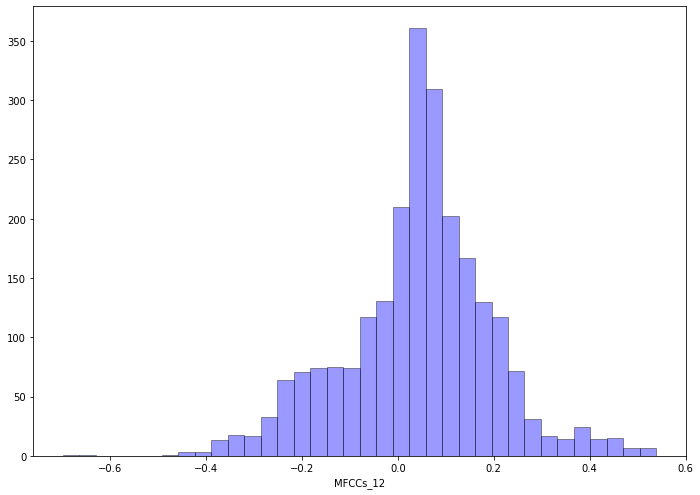

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


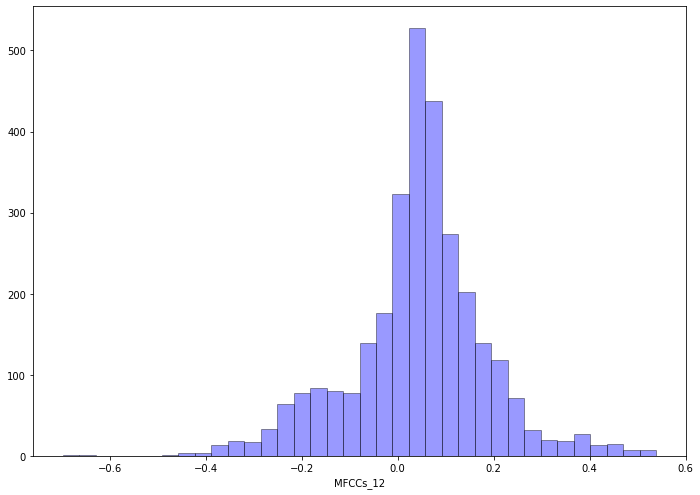

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [4.210760439410789, -4.148330542245972, 10.249955564535028, 12.222598200645448, 3.5118792392220834, 7.212563881969445, 7.483033831502671, -2.21461234620584, -7.03350987285406, 10.894813582715967, -10.935754394981233, -4.458627626648632, 9.725940955306331, 3.672190125269204, 7.305249245029577, 9.858306128773185, -5.860197398938681, -6.518009684686138, -1.8603800093813645, -12.83487377273664, -8.691790358273284, -4.1987523291718265, 6.397996870011545, -0.8887755579344372, -10.36231713827964, 6.575361558149528, -10.033408062536004, 5.3397087274771176, -6.267357783796804, -0.563487770001366, -9.528514874255986, 6.072537397864767, 10.84138099710096, -8.469470317807652, -13.473019275391485, 1.6727037057085592, 9.365897151474584, -10.380723218867953, -10.648881334572827, 4.138651863643273, 7.835946533818012, -11.312445331154262, 4.312328031112435, -3.7439231422724735, -6.06384114307776, -0.9143661994454622, -9.341362651289586, -5.236407979548771, -8.405565808884425

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


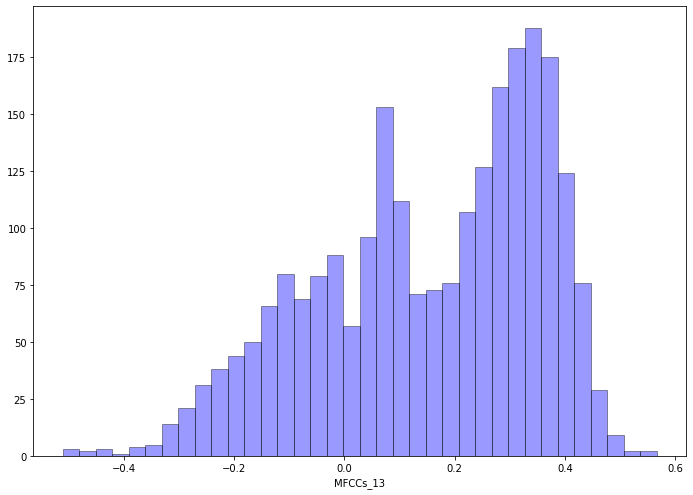

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


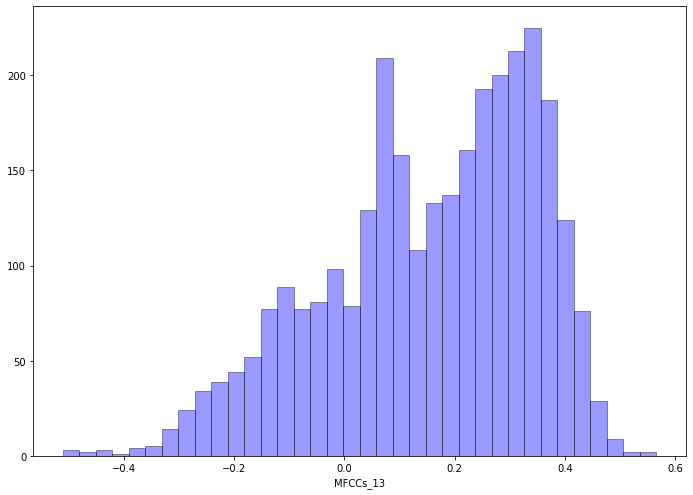

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.14)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-9.224816919953486, -4.983771349942583, 1.8698804468460728, 6.414582214681865, 0.7678399128381305, 2.3818359668199136, -7.31202880319366, 3.055245658393924, 4.9542943875948895, -7.589109195041388, 1.522289031318453, -11.077215859988284, -7.109159406621895, 5.305049777042918, 2.934281496650598, 7.578714380768513, 10.6789249278305, -6.861103478511955, -4.144900772621941, 11.072784076914015, 3.3424307355593994, -10.328443231922058, -10.198722507257733, 9.22721364666872, -2.835741221539992, 6.565324811948963, 7.031118609876592, -10.30769365018983, -10.811459405534404, 6.268189104510059, -5.732169261196286, -5.016600613406157, 7.769190495391957, -6.51146165421598, -2.366931991524824, 11.620069359406262, -8.336970116760401, 4.228400835028251, 9.939958363530286, 3.9769371658463215, 11.602500402124086, 9.202718977641505, 5.33093155014985, 5.025138001823669, -7.739918201994186, 7.386372550814761, 10.77972324725524, 2.072439460025925, 5.850396041355241, -4.8988175421

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


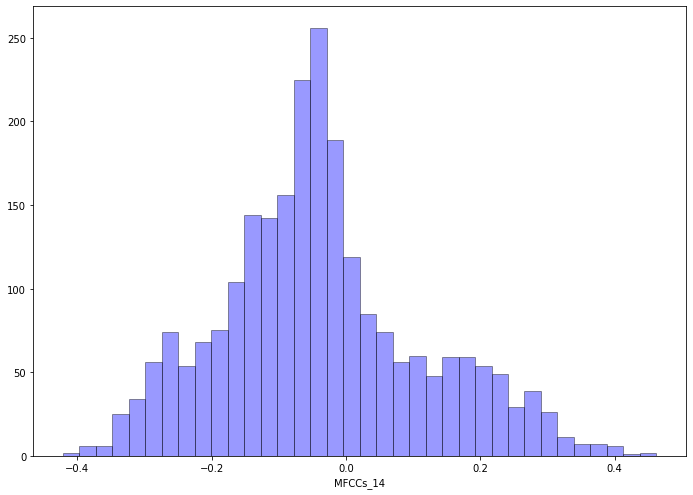

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


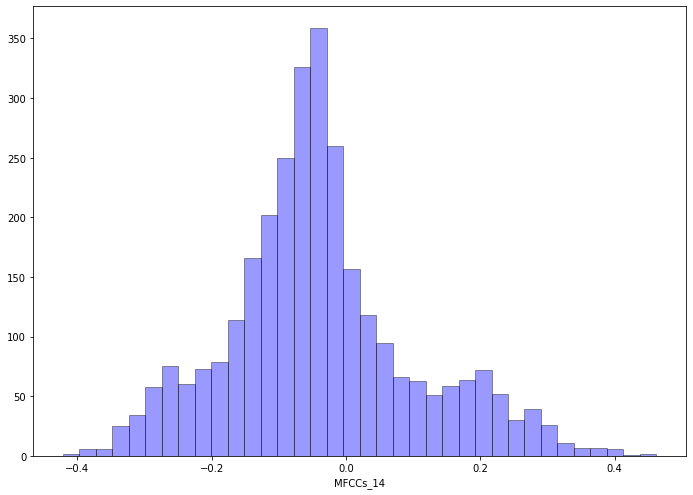

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.165)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [12.18116160296755, -5.967840010518934, -9.157459872142828, -7.708538627701923, 0.8732711960169464, -0.6238729492913304, 4.119374460695381, 4.695980441297668, -7.628848220667272, -11.769534582919691, 5.849776550046094, 8.093291321496354, -5.654450161965751, 12.168457282637853, -4.254463581936452, -8.59311882720484, 3.0677801035194032, 1.2210205904236235, -5.258995753339094, -6.287472760639519, 10.626190956388292, -3.5266301665806417, 3.1294658009432887, 4.786976635336354, -10.08380105521067, 10.79474888469056, -8.206668608711912, -9.63473077685988, -6.330075511891069, 11.838140072490088, 4.579139189422777, 2.9063097312112816, 0.8033654534850215, 8.458856478570256, 8.568287841195396, 10.598228994113718, 7.716499858416186, 7.5972331624704275, 6.619424363034759, 5.814321695011473, -10.599923529492452, 8.175513373256932, -5.478076725092889, 7.316613038299796, -1.8726409273132096, 2.5400668779903293, -1.542803523794202, 3.7575355644457686, 10.787494485038168, 1.7

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


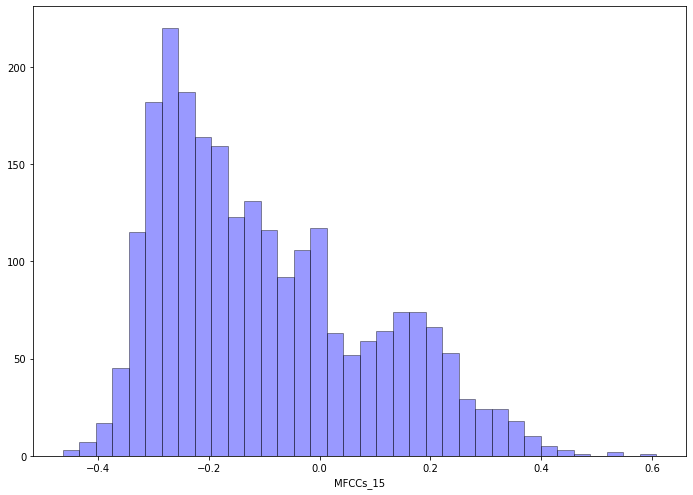

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


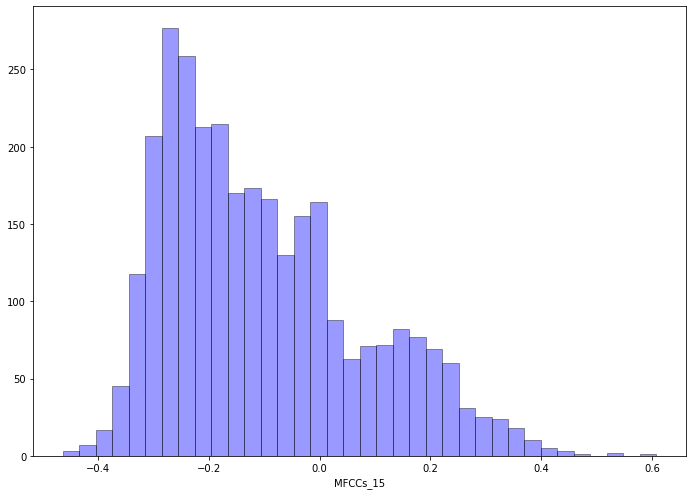

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.16)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-6.789594027983486, -8.254564624658714, 6.74811787582554, -4.721732900966923, -8.566266582829993, 10.461702329518452, -8.82266811457771, 5.929544866151164, 9.51042334691775, -4.272421976487195, 4.362041254966975, 5.076649251043219, -6.796235170027312, -9.390747566877211, 10.51792075217476, 4.378606640582677, -0.7595748381269054, 4.941494744288795, -3.759553389104971, -6.824478128673269, 7.002311675136963, 0.8909805639102284, -1.7507432140525534, 2.3632557911794905, -5.8144576342083, -6.117610736551808, -8.541173343373439, 8.380075291159836, -3.081317166550805, -4.15687365550153, -6.833619854476018, 2.12047835855634, 10.329655891670235, 7.896541659888294, -10.349119082870962, 3.2746128879684866, -1.7771395100023852, -1.8381903866566225, -9.627110015623296, 8.917022234445028, 7.300890871924348, -6.136750611904291, -5.5928767365503536, 8.672877120604102, -7.418214283508086, -3.9772997862516695, 3.800310236729072, -7.3514805424092, -3.380473677942901, -2.421938

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


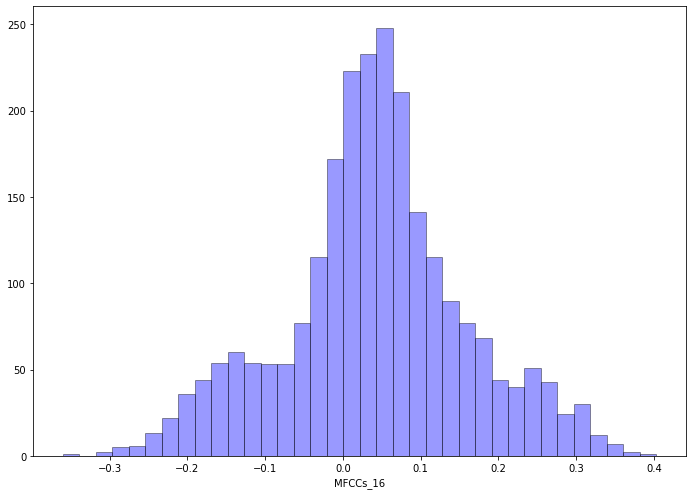

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


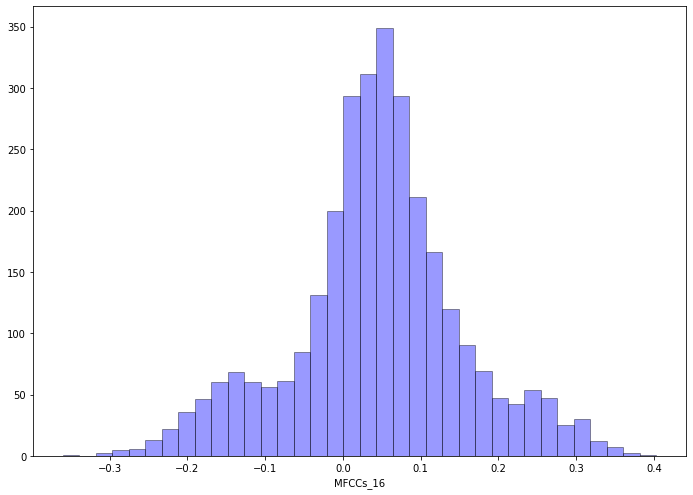

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [8.716782313103986, -2.19157026690473, -10.271305706982538, 3.861153877201055, -1.3481654675720698, 5.35630676942781, -3.6386452195667296, 7.160299355530707, 5.782494467452697, 1.7609231845106368, 10.468607678163115, 11.70222883379426, -2.3443210632748475, -3.8852975864355495, 10.587441788775193, -6.8172726722332, 5.67999253869916, -4.842305474380223, -6.436652967107491, -1.605061272607914, 9.33994631542705, 5.01418410293266, -11.31723806118075, -9.565904330419142, 5.166524542714608, -6.569986914537836, -2.8507174199189453, 1.4831919171967107, -10.863109825758595, 8.122928779407316, -6.735769798793965, -2.2772510580127125, 3.005287273074126, 4.728641448197442, 1.042354084227752, 10.363706297024132, 3.9491303127267967, -0.7972399034033799, 3.479253598360356, -1.9227984082257643, -4.499562965944549, -3.375731163511704, 8.128640664794334, 3.5066805264103147, -9.755593585991562, 2.507616487174103, 2.4723578507278887, 1.4250890482366856, -1.3328768253027548, -10.

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


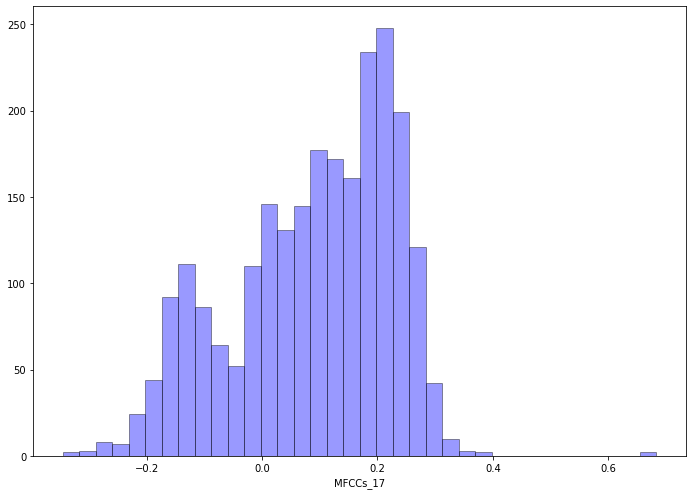

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


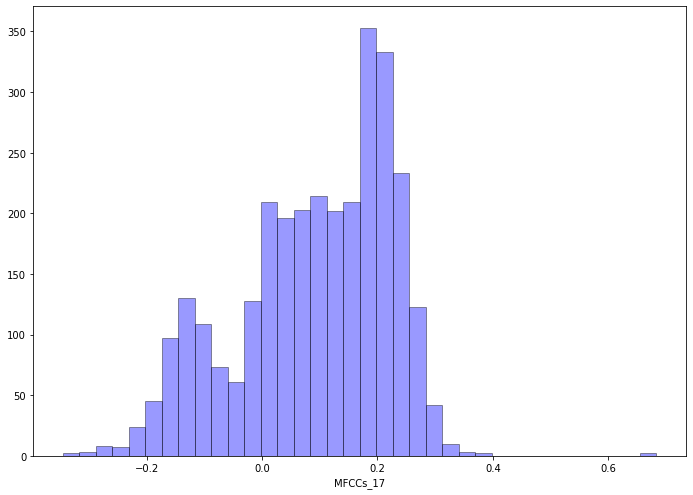

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.135)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [9.397102955455582, -3.1087005469641387, -1.626730414195313, 5.117910585071737, 5.260665017873677, 8.417778394840644, -2.3356450555645782, -4.152207492921958, -9.41951240563888, 8.133172774357996, 10.457318262989054, -4.24723175224136, 5.848580983139724, 1.215469956437574, 2.33544522100866, 4.476224762162731, 4.10092968174382, -8.495485945257789, 10.671285951184236, 2.2522275762258057, 8.761417480579036, 6.421534894323779, 1.2941629654984967, -10.676254043029791, 9.922605789486871, -9.938754100625198, 6.475129443014368, -3.226047094747175, 2.802393220429254, 2.547026194501659, 10.35790041194766, 3.108987638082775, 7.217395281598083, 1.0078229752106922, -6.398670674809017, -7.0372006615181935, -9.21762120839514, 6.667533036688097, -1.3507020223775452, -8.317353413454164, -9.656594796800691, -0.7780126887547105, -8.958978394420207, -8.586457105053167, 9.07993888032526, 9.894970956841624, 4.637377805224095, 8.734200642034454, -3.787663813109493, -4.271439721110

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


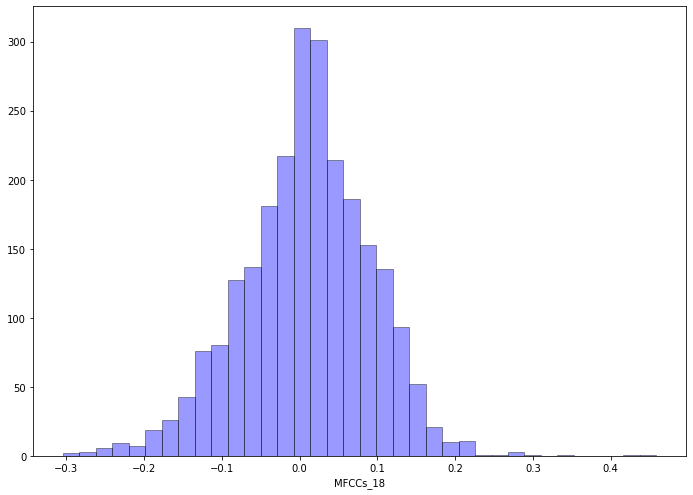

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


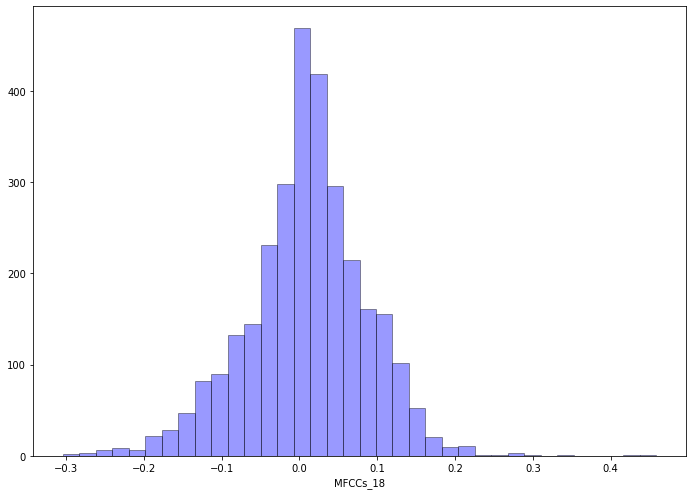

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.14)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [2.511290863880708, -7.558074093944415, 11.365224336667882, -8.92482707106359, -9.533952799178, 0.6058921253572721, -9.819593860755845, -3.0825759736944462, -9.437505358012018, 2.6707663854614028, 3.993636380159252, -9.222817317696196, -7.615970352991364, 4.726353885927882, 1.410603703410811, 3.523176760816715, -7.0758252176747245, -4.061899234879778, 3.867538391420117, 11.08933254108957, 5.52228822629914, -6.130870498309021, 5.419422740833748, -5.924378956274606, -1.3050056731342234, 0.9244658968234172, -6.483519006028904, 6.149559120524394, 5.527578448953467, 3.199056563826882, 2.32518800463136, -3.361579890002414, -1.4447697260916144, -10.461237466532989, 3.831652023911072, 7.923682492968089, 7.676673883854583, -11.295412663596142, -4.507132267594114, -12.440843768337816, 11.945537127736984, 11.808802974277045, 8.555715760149353, 3.545421086062335, -2.844645149029329, -10.915305346576464, -3.982322414509445, -1.9908778905622988, -6.735283406153821, -0.955

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


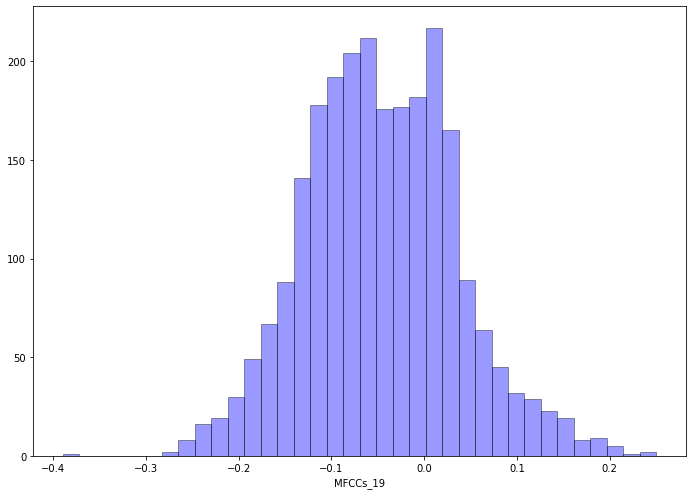

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


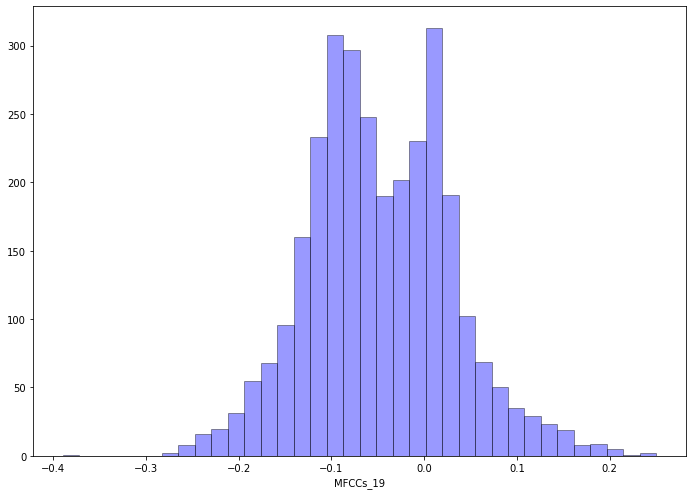

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.16)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.670620205127976, 6.416016642488337, 4.225202745155098, -4.651349102613144, -3.4761109853654237, 2.417013293834941, -6.401838181839337, 3.70630654915111, -5.042547706029491, 4.706745519271642, 1.810322521301172, -2.0915478630548705, 5.170552082780827, 7.130835875939284, 4.240144994983089, -3.9755576208681735, 2.7475027736426805, 1.2879706987433257, 4.940248360629489, 7.218844825115579, -1.157386774706974, -5.130440817525122, 3.157348160433929, -2.08159259636656, -6.172508214058506, -0.6594725365026282, 0.4876341548723641, -6.213340420219771, -0.6503328375001285, 7.186559965422995, -0.7485870809271864, 0.5292607392829519, 0.9409304828577472, -4.494677852638322, -7.1525515313655, 4.411816063708423, 0.3748766427319411, 5.611005623696669, 2.2918878038242747, 0.6421493358806772, -4.450604345188758, 3.291826842237131, 5.101024988169317, -7.058741131055879, -3.287922258205492, -7.013907711130966, -3.0531311799765097, -0.8586488239315795, 3.856141805360118, 2.067

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


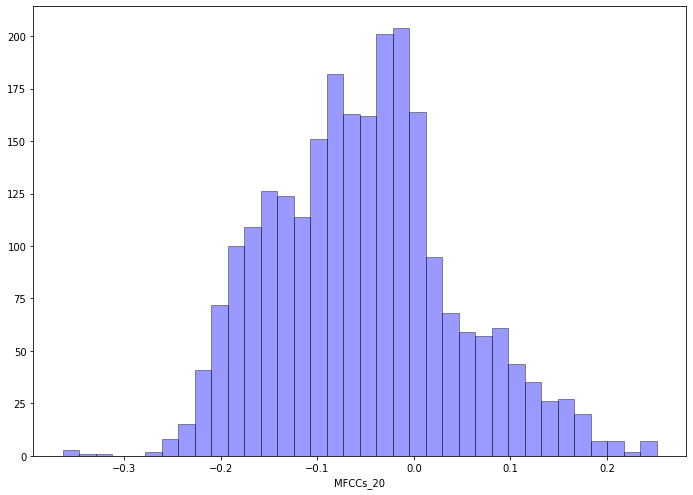

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


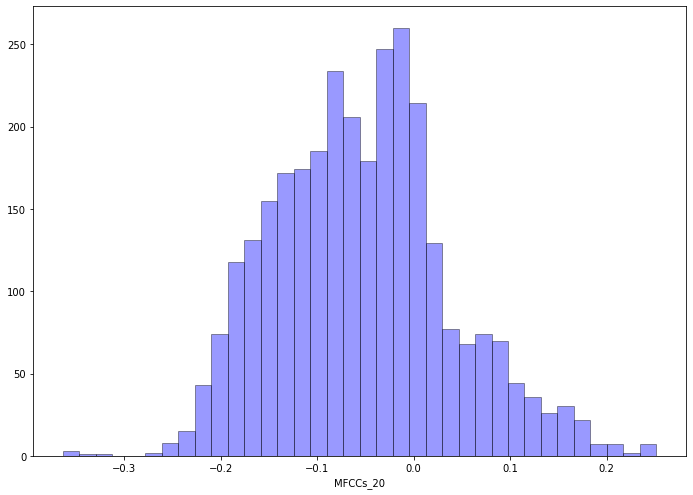

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.15)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-2.907184332855295, -2.9464892740722264, -5.157604691305965, -3.164569423556352, -3.685525929188672, -0.7714374024826167, -6.299150782001999, -5.785204427813372, -3.3186272194151414, -5.861391418584026, 4.700386117305641, 5.189278565910188, 1.165040755085498, -4.658259466470549, -2.78756353537443, -1.7416486935853772, -6.381326467598169, 1.7356213681734878, -2.914396030080113, -5.3427332339179285, -0.7261699757824704, -6.1311966710122245, -2.5425290298312384, 2.3177944853693537, 2.064381643946664, 5.710671589834334, -2.454915829391951, 6.219575019994476, 2.155163384098645, -2.323169820360121, -5.044545712421485, 1.8576348039892925, 0.7732700222419981, 0.6453614805646963, -0.3281096750468864, 1.0272057971946598, 5.647307616458987, 1.1326790538087763, 5.69600356448483, -4.614627904712586, 2.946754852095831, 3.309079040048505, 5.891293568654231, 4.796211212747222, 3.4464757332191143, 1.8871721018031025, 4.486843550142154, 4.882292560758257, 3.574793434402077, 

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


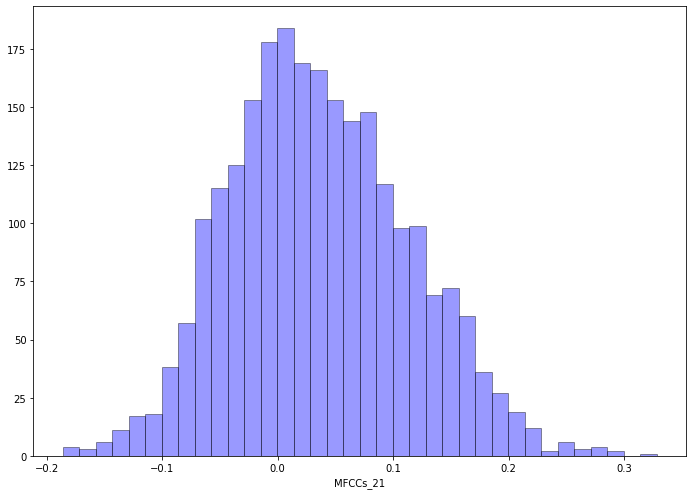

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


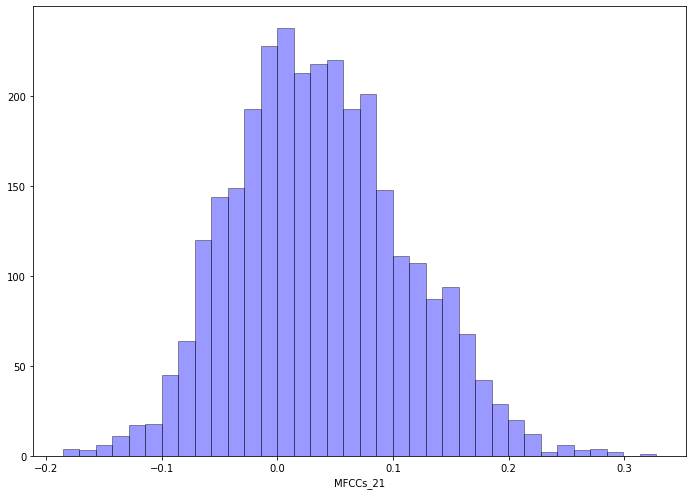

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.165)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [7.879824179920532, 4.395332515935441, 7.060227683612384, 1.449120762308301, -6.87114898323113, 1.530550229030554, -7.533068040291939, -6.985175237657953, -1.9009361233540725, 0.7988730243844546, -3.06650814808658, 2.5576178094323625, -7.14331179882644, 2.703920883310392, -3.618735738516853, -3.2320057671631384, -7.769749548655402, 4.753250955957931, 2.616803442246224, -0.6278506099203955, 5.789954392528745, -3.185022906367128, -1.4681309115545869, -7.136888253759967, -4.451657723386269, 1.5114397489029745, -5.167900014071099, 7.326557406499341, -4.080168801427931, -6.642161402364718, -1.5040132222741365, 2.290646446673215, -3.905543107655614, 6.628822448907384, -0.9418798864031128, -5.731663516872654, 8.184322014892066, -0.6312935544347757, -1.7346959636045698, 1.163758744935924, -1.792517999956348, -7.750490043810333, 7.89237874295276, -7.934433854667105, -0.7967015831986428, -1.1822080144450835, 3.8965978536167794, -2.532414527809496, -1.3336729788387665,

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


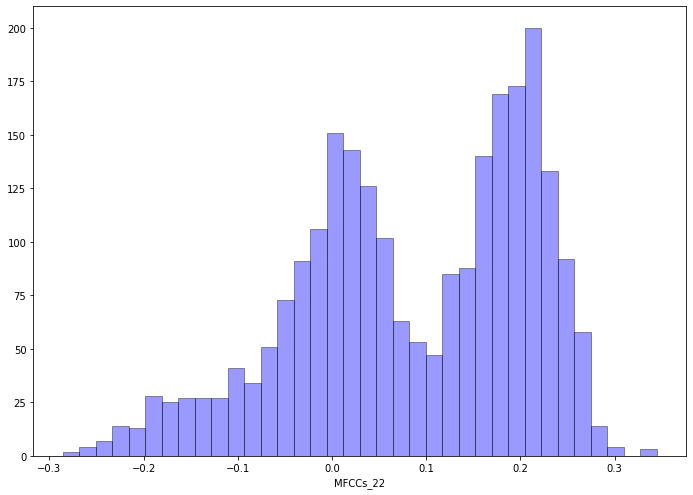

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


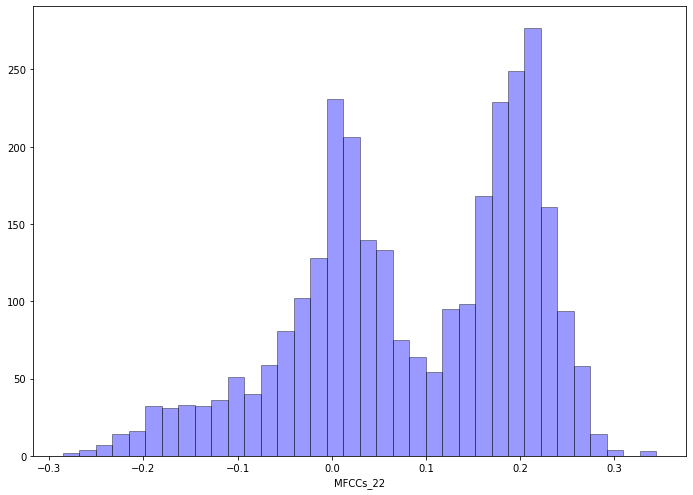

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})



### KNN



In [ ]:
# Dataset to clear

currentDirtyFrogsKNN = dirty_frogs[3].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

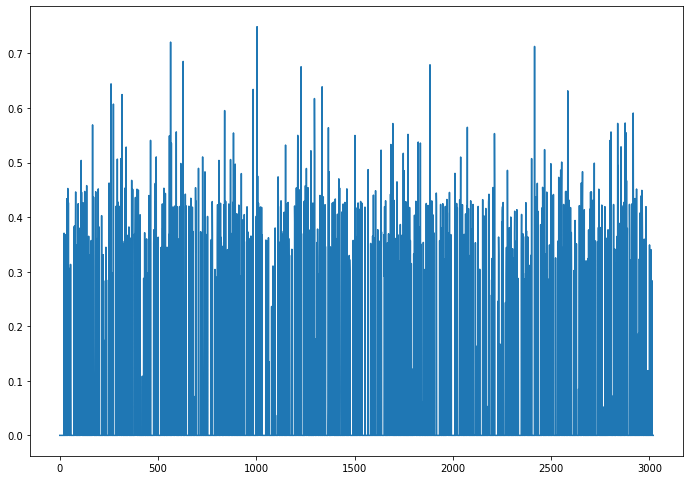

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

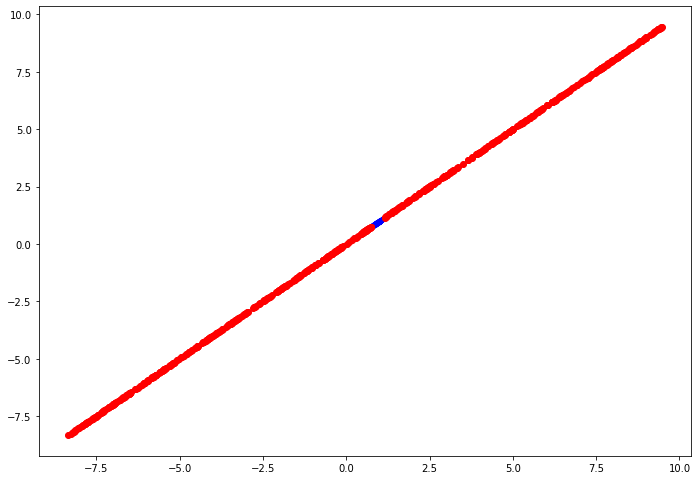

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.115)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsKNN.loc[i,currentAttr] = currentDirtyFrogsKNN[currentAttr].mode()[0]

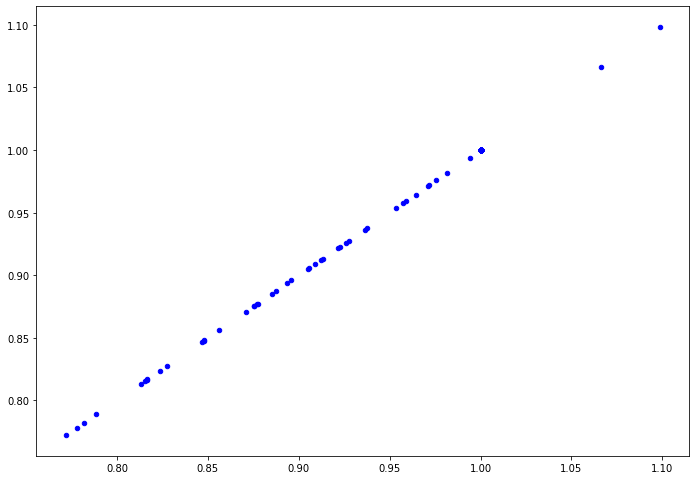

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2' 

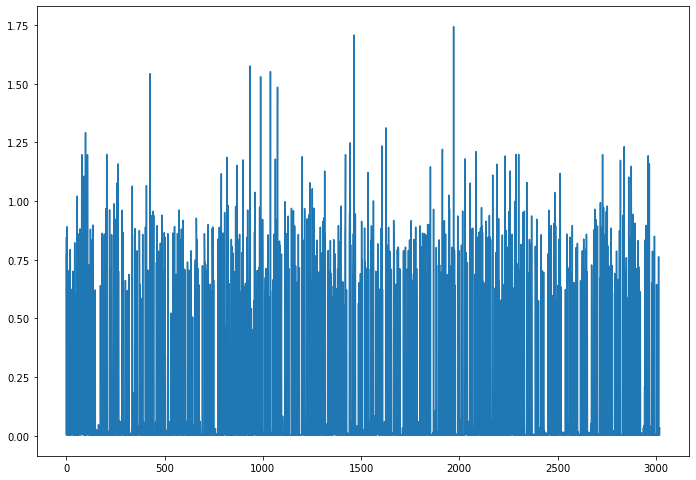

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

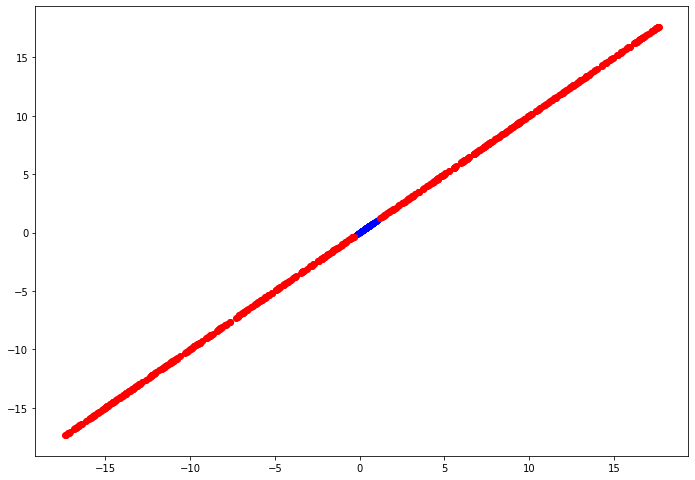

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


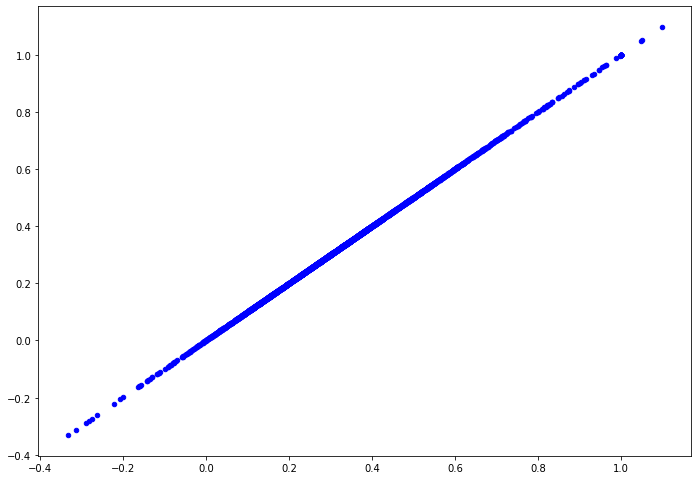

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

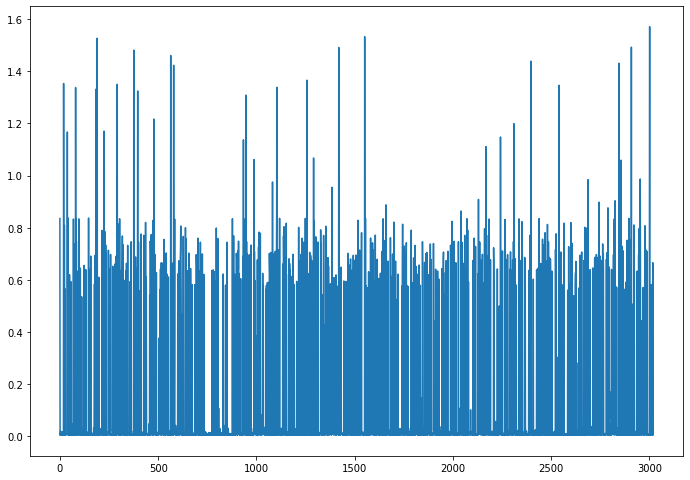

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

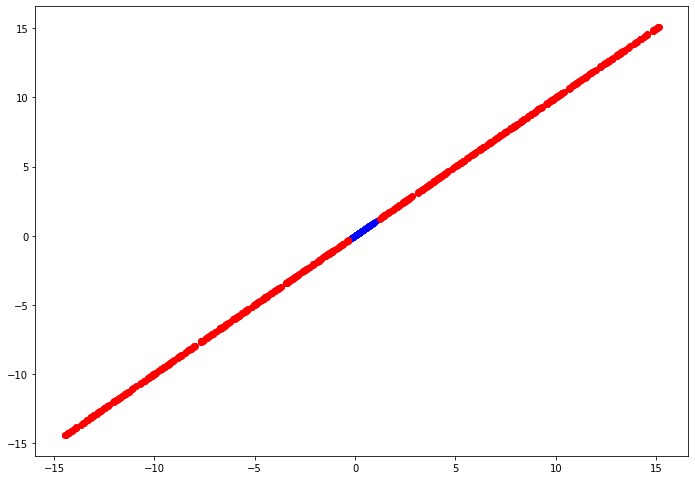

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


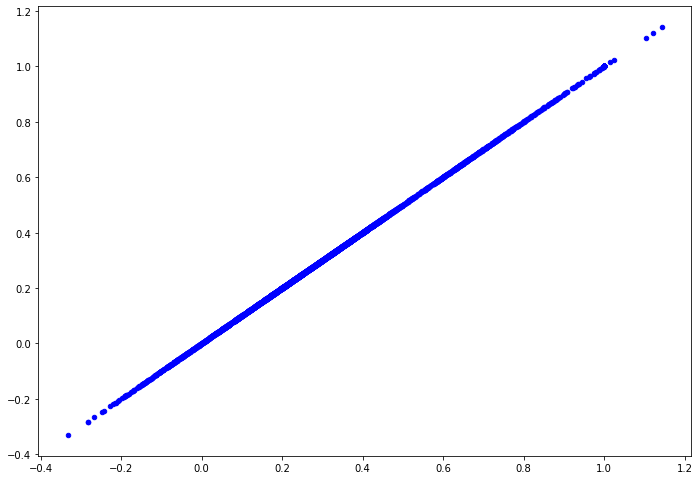

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

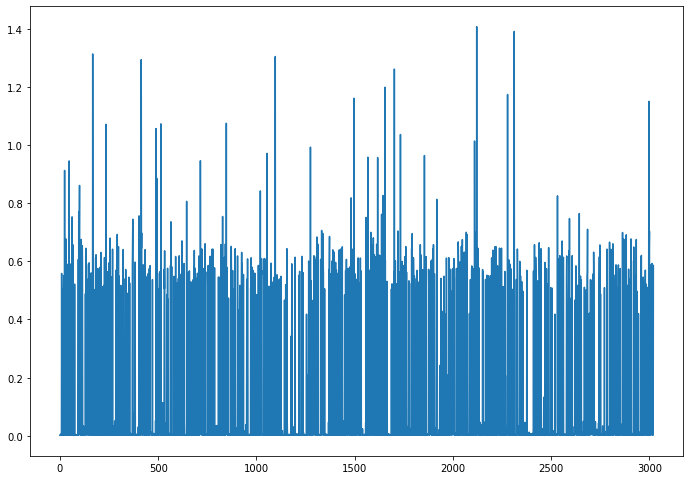

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

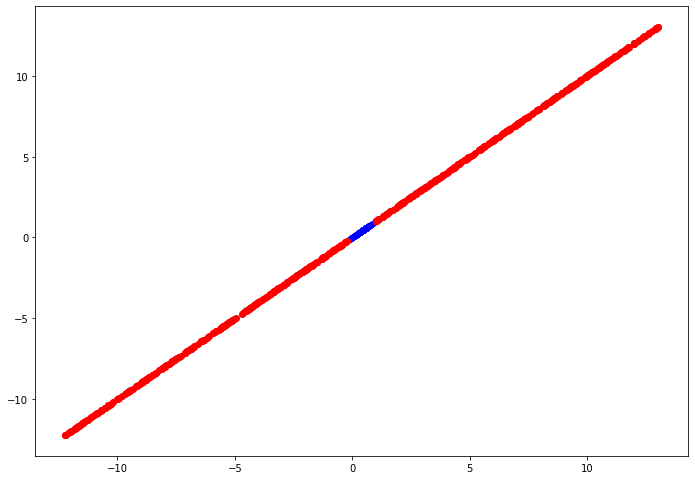

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.17)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


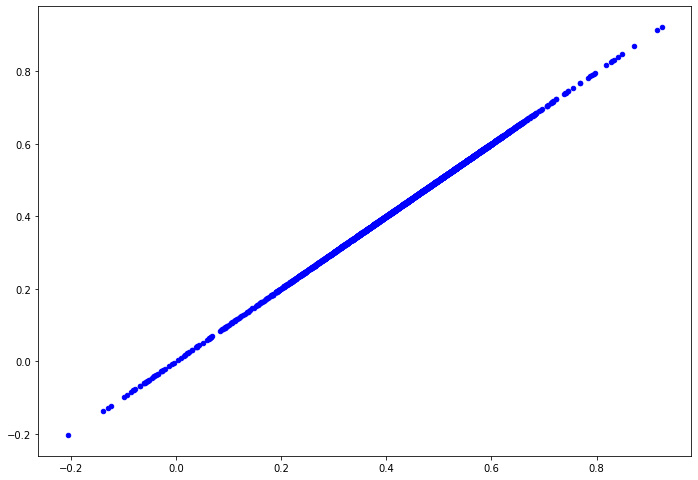

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

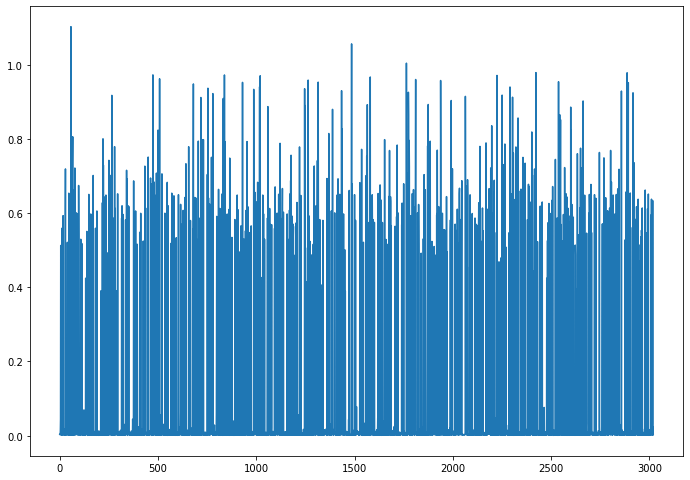

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

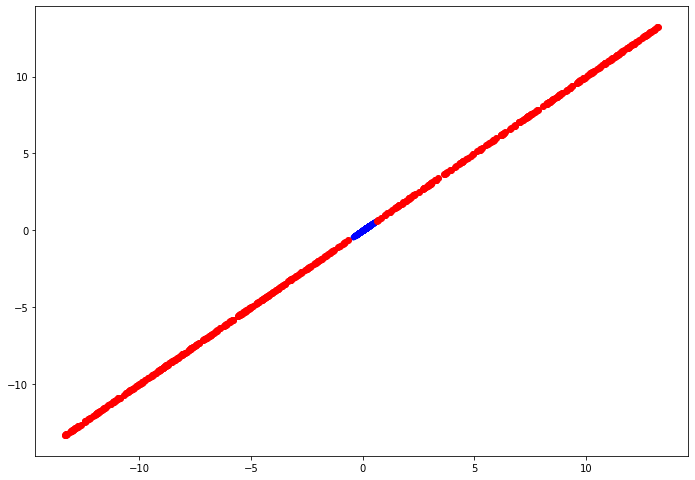

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


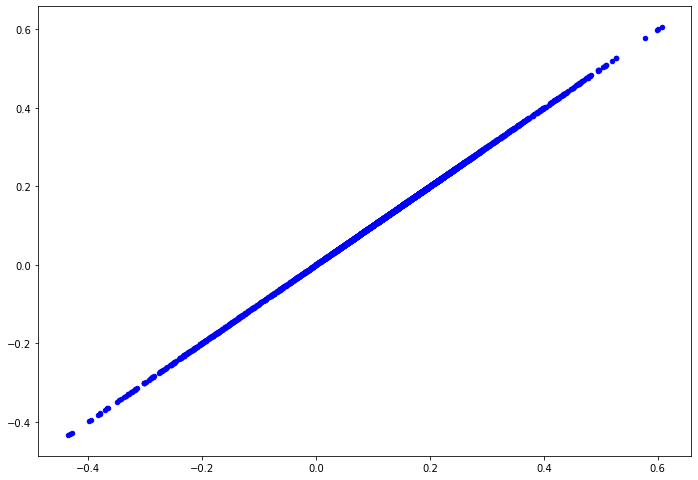

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

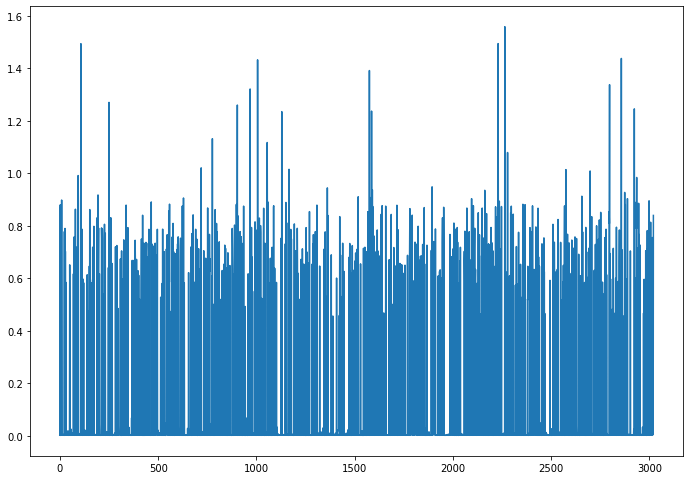

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

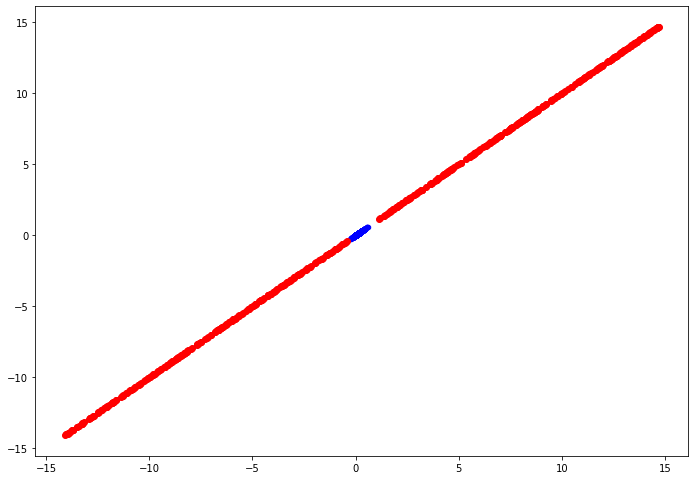

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.185)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


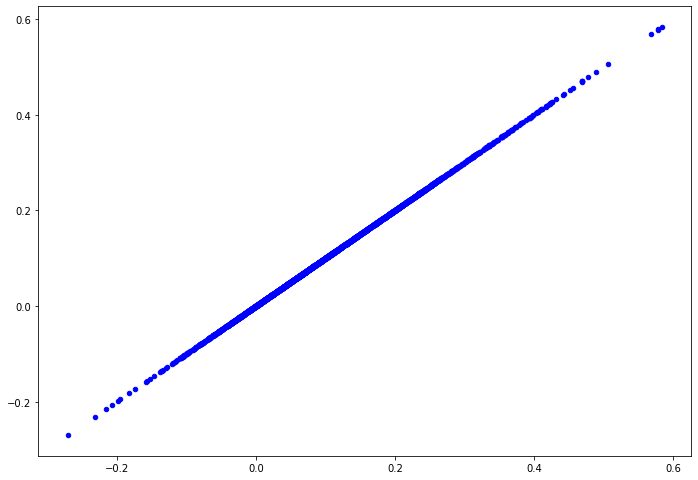

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

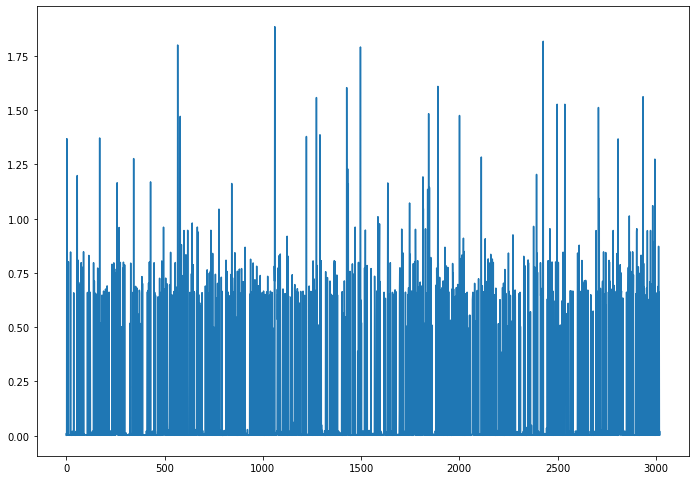

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

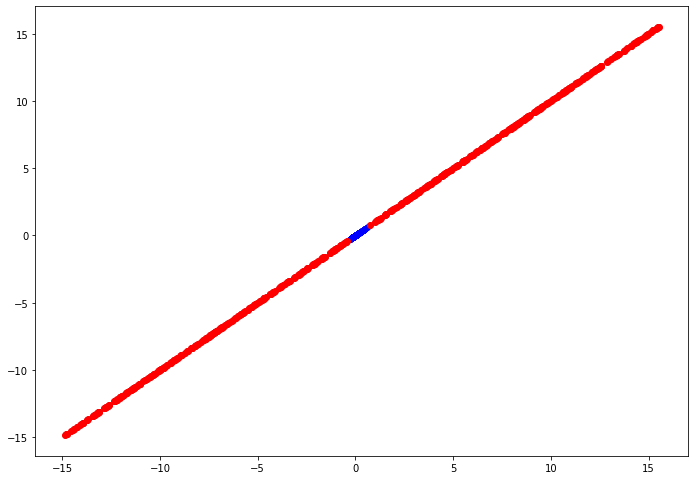

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


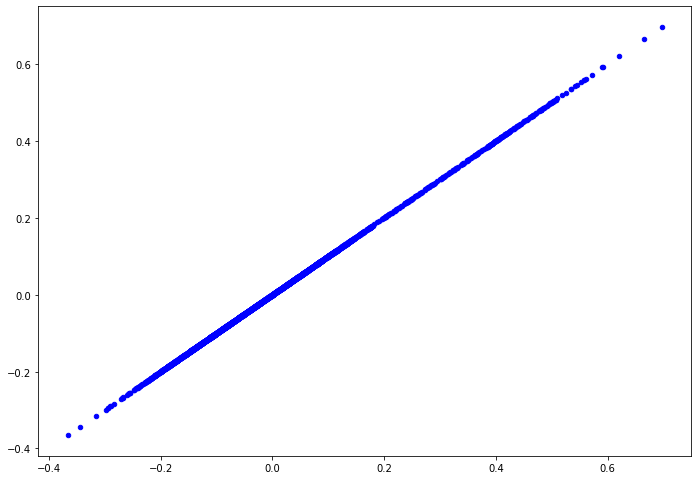

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

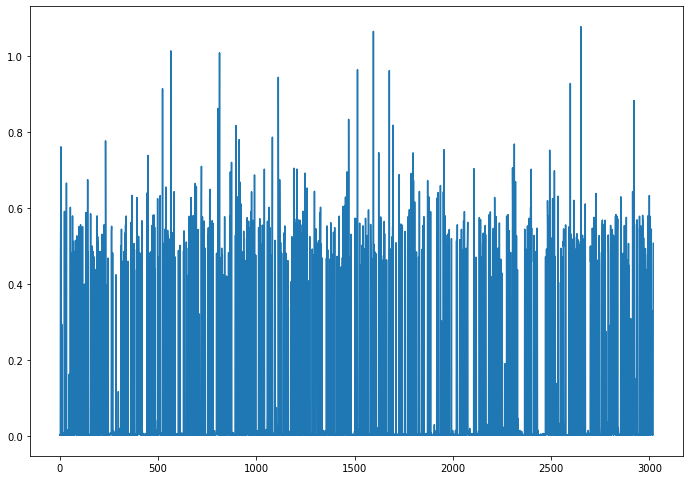

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

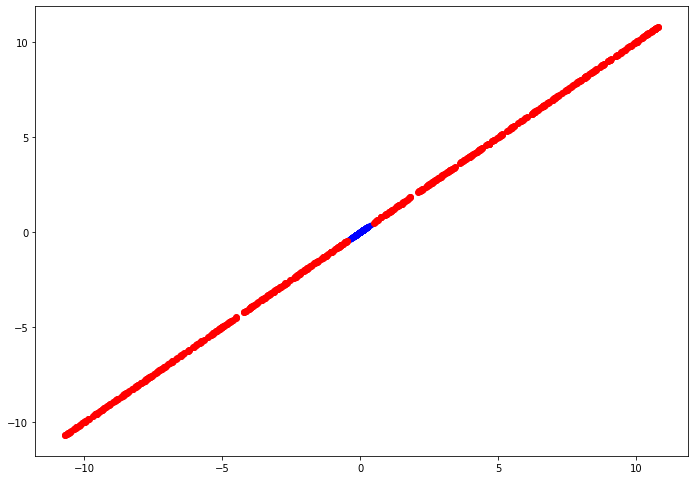

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


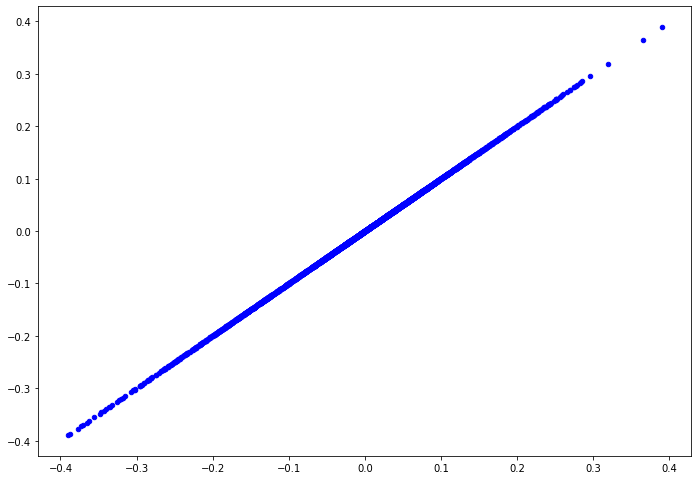

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

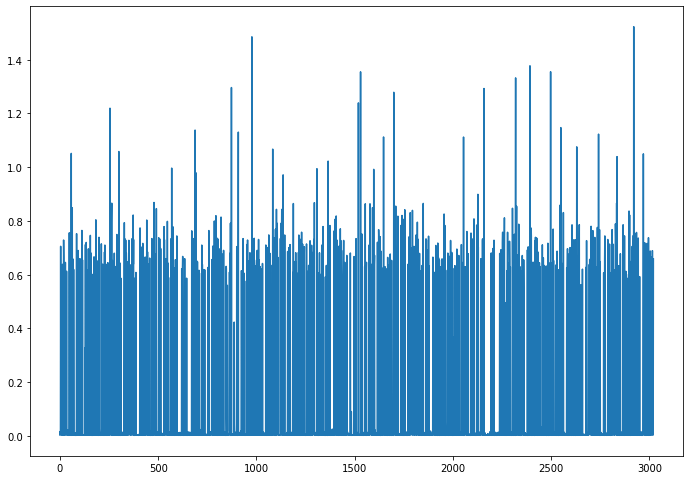

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

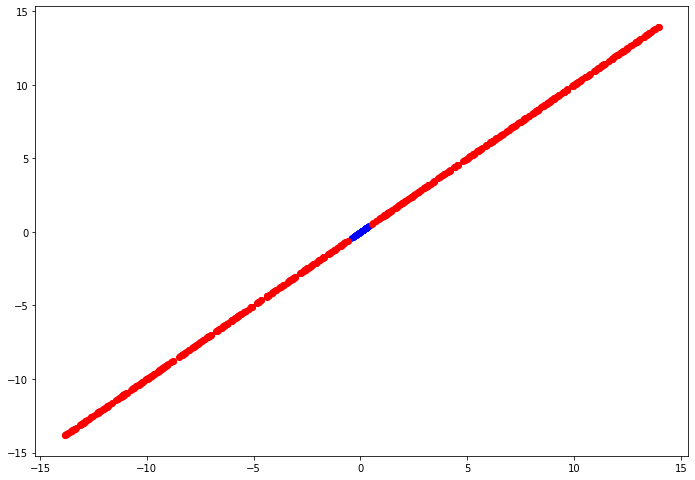

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


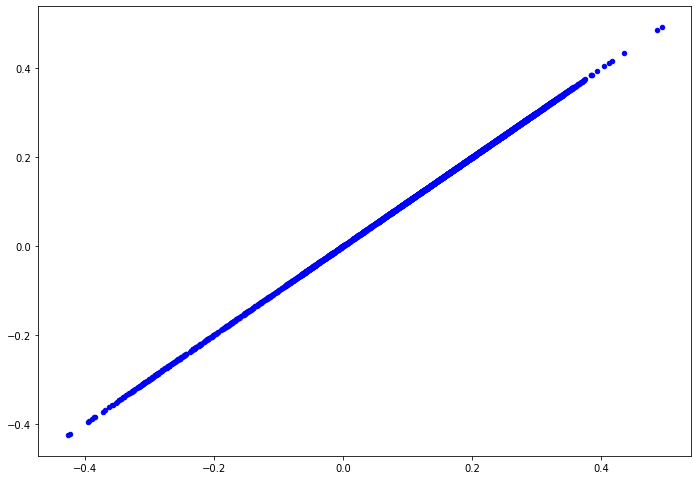

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

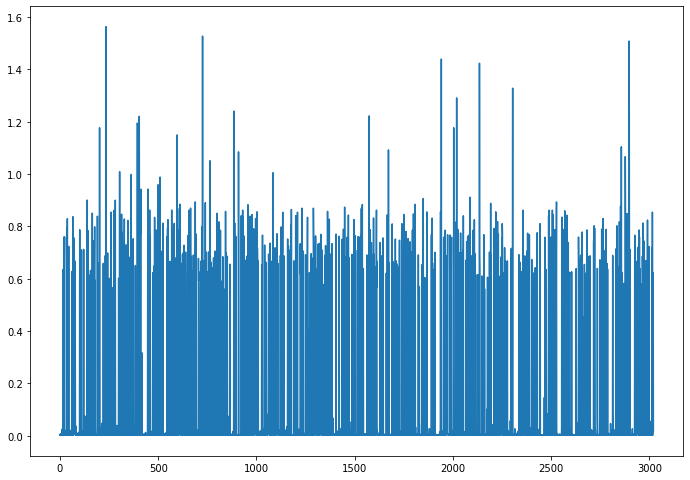

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

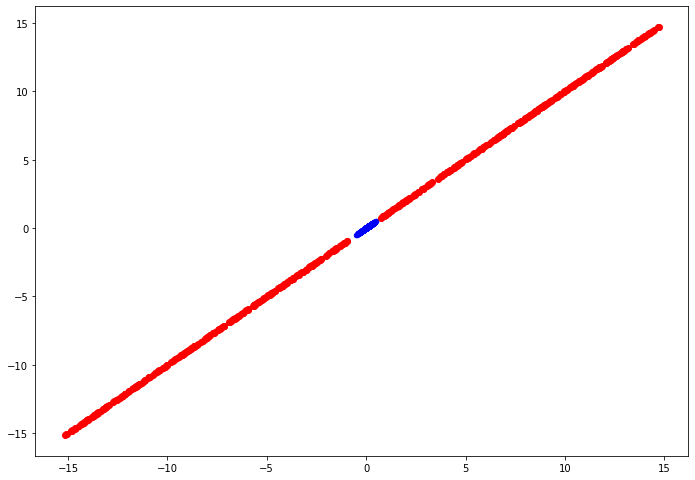

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


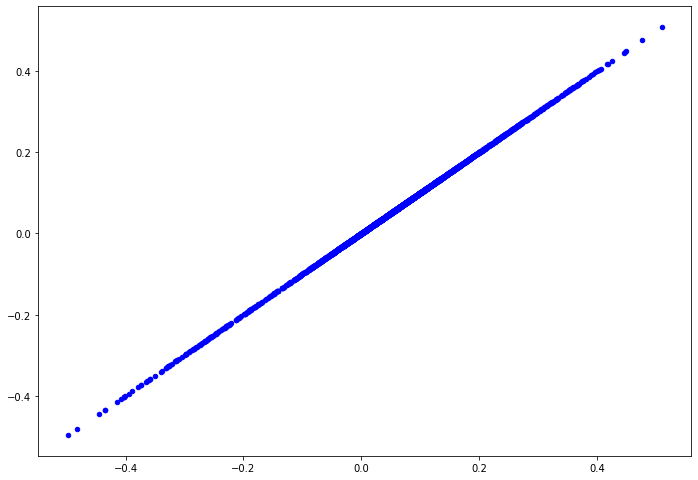

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

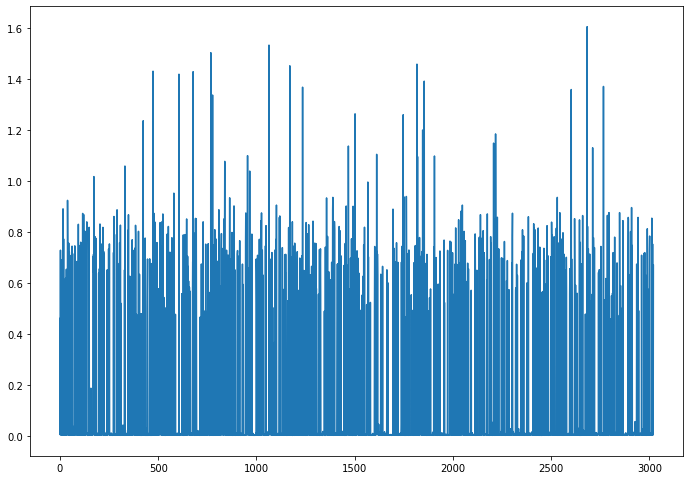

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

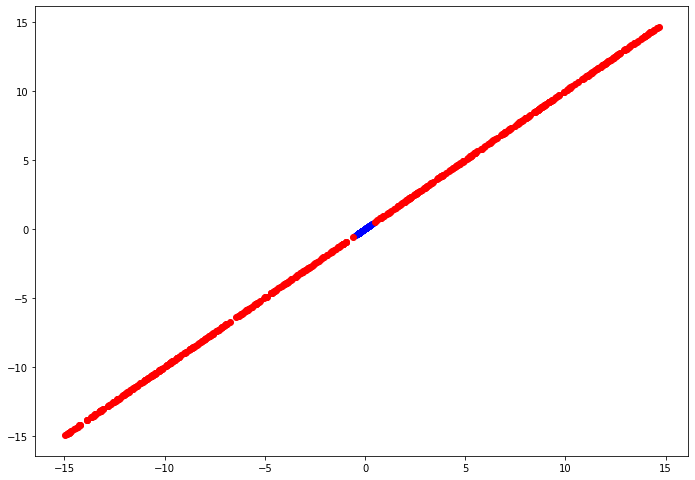

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


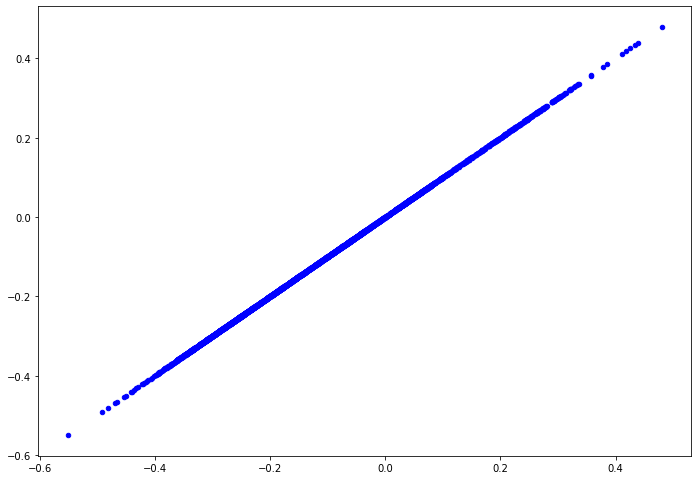

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

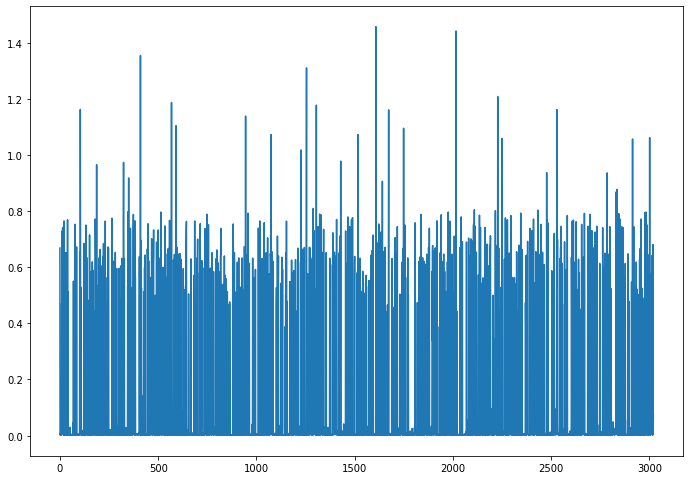

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

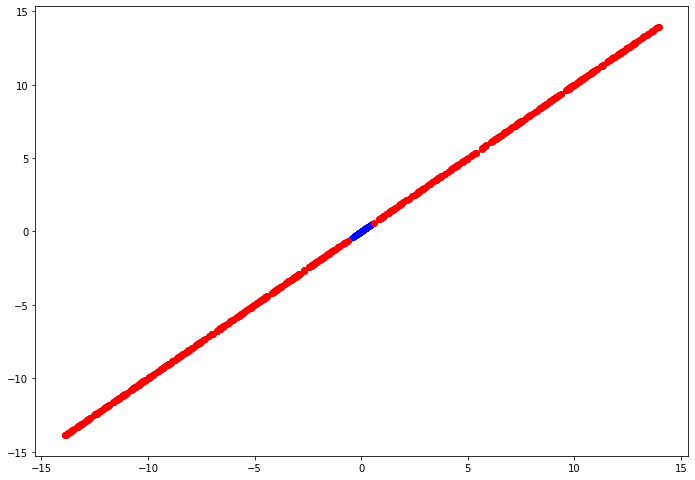

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


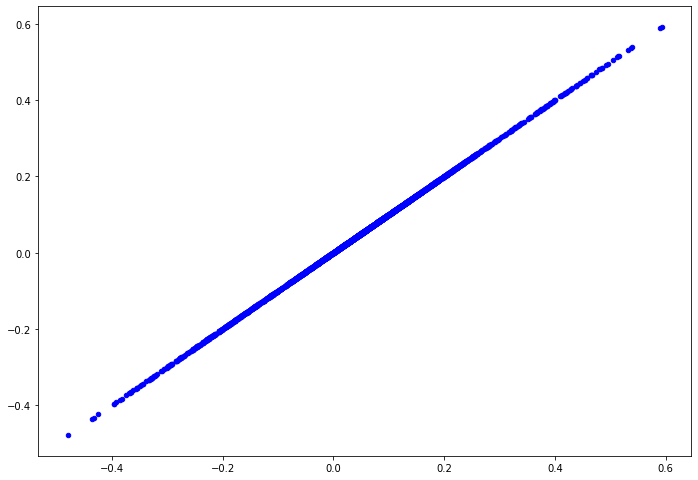

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

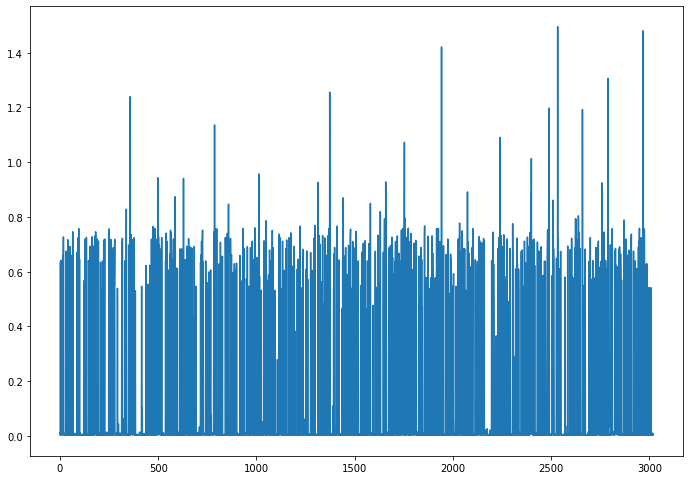

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

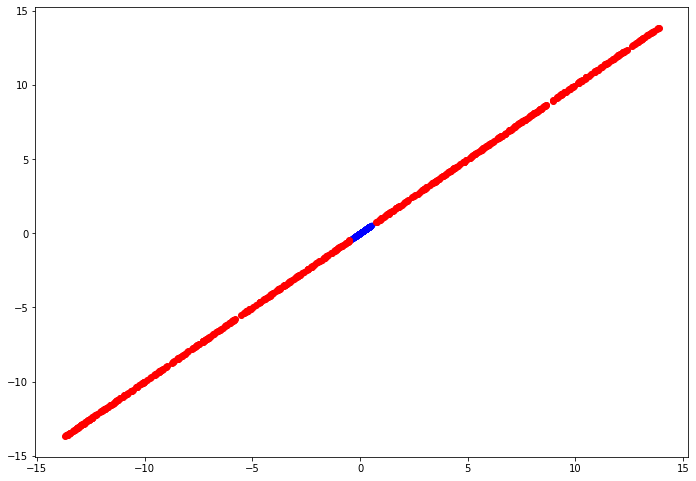

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


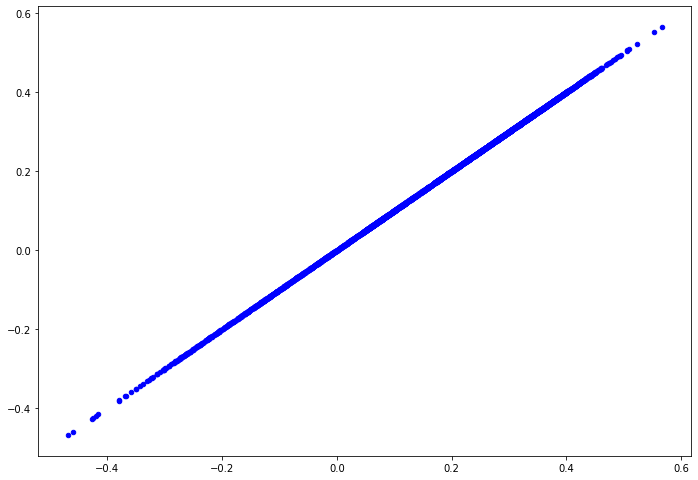

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

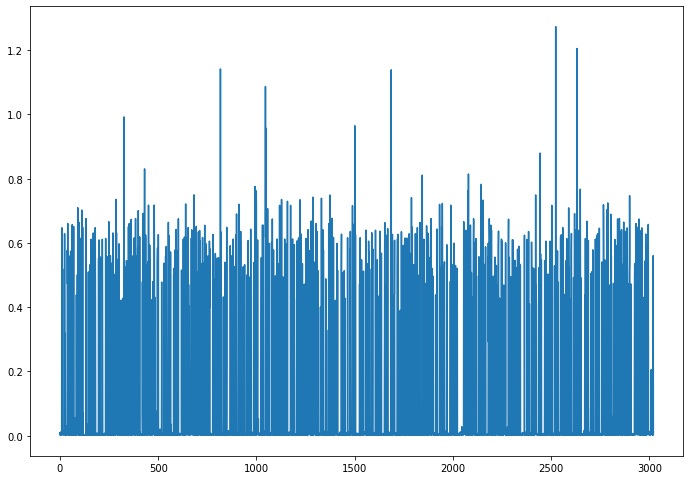

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

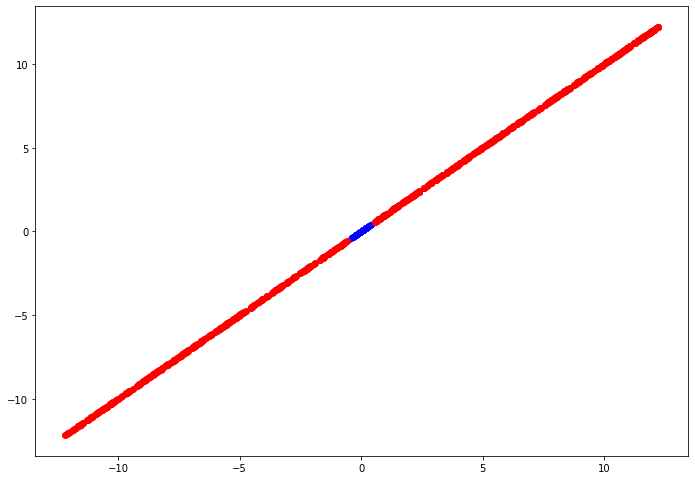

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


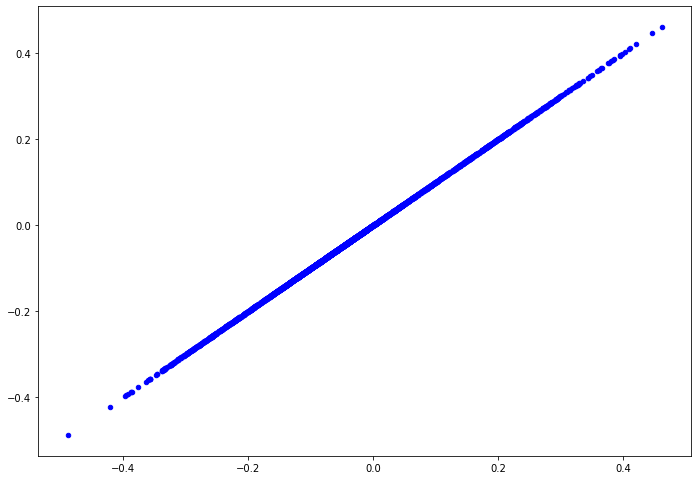

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

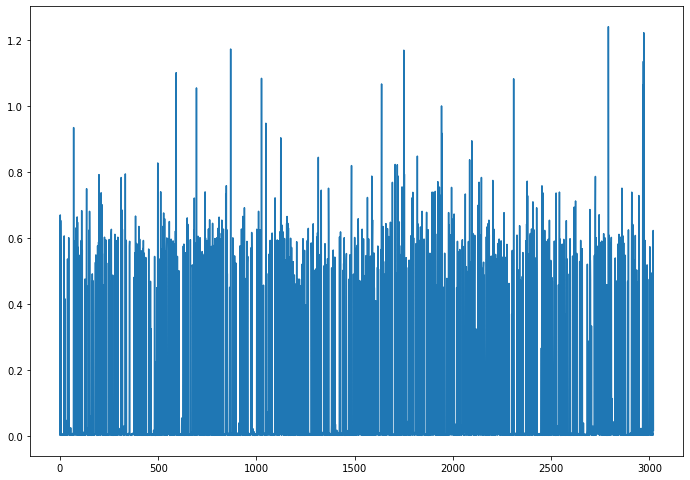

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

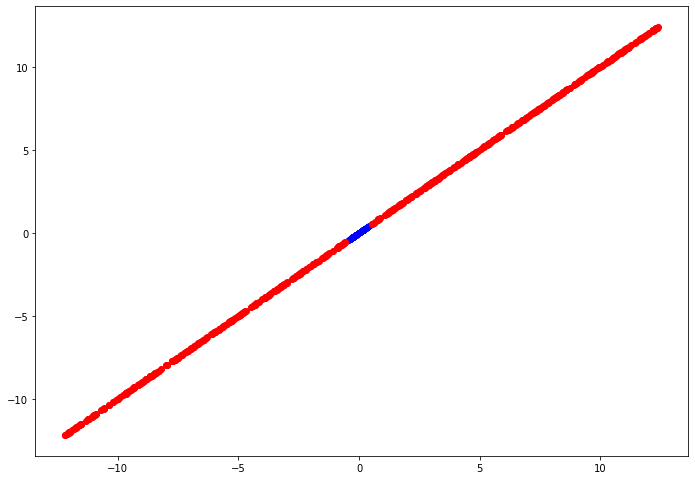

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


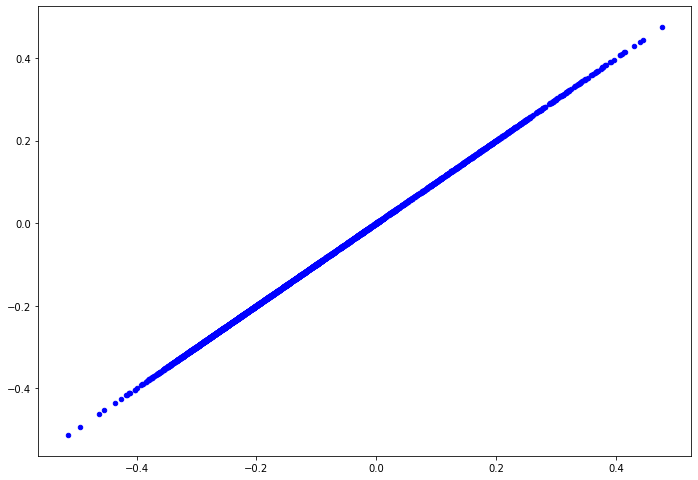

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

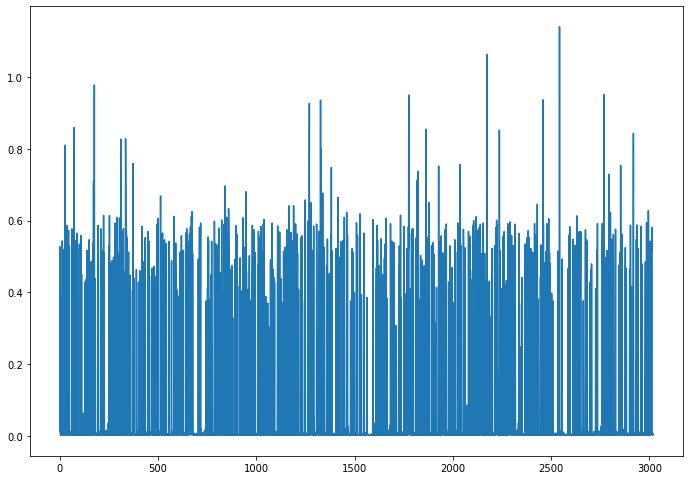

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

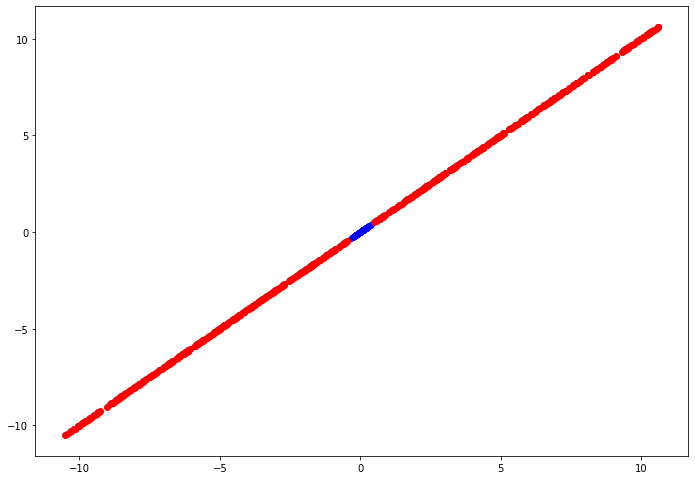

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


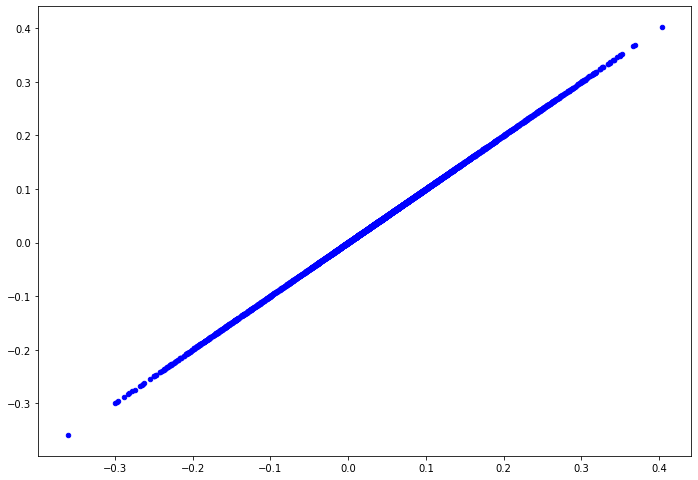

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

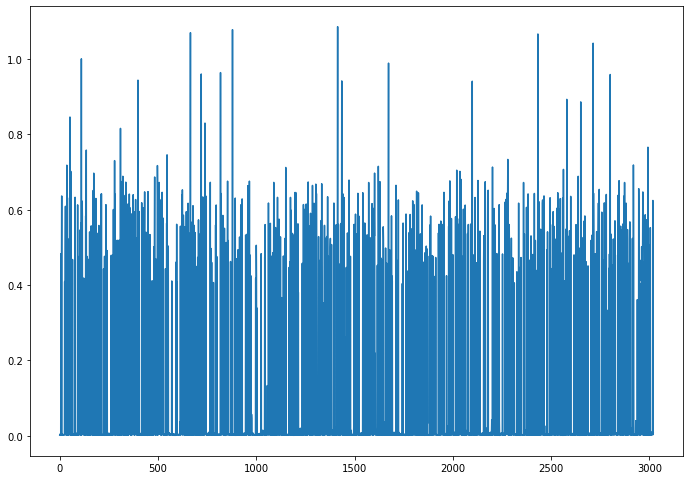

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

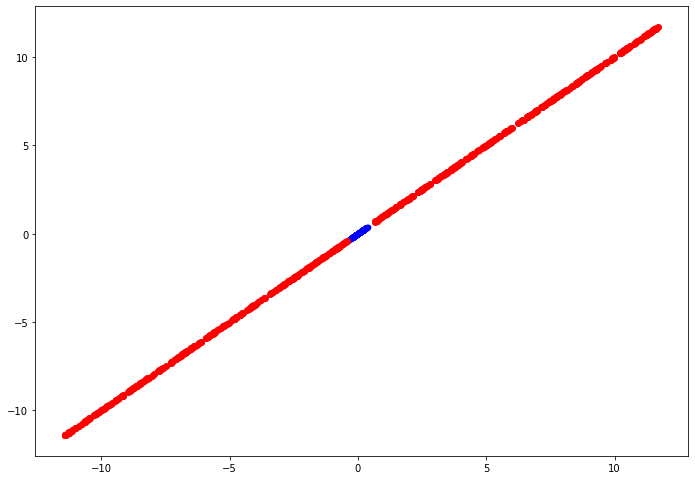

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


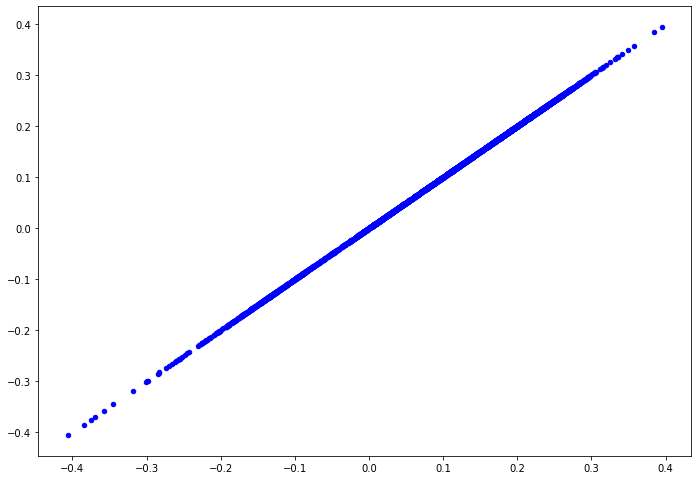

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

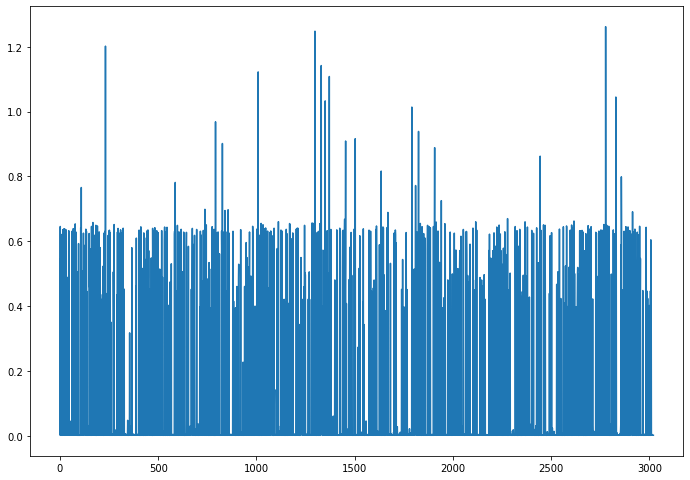

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

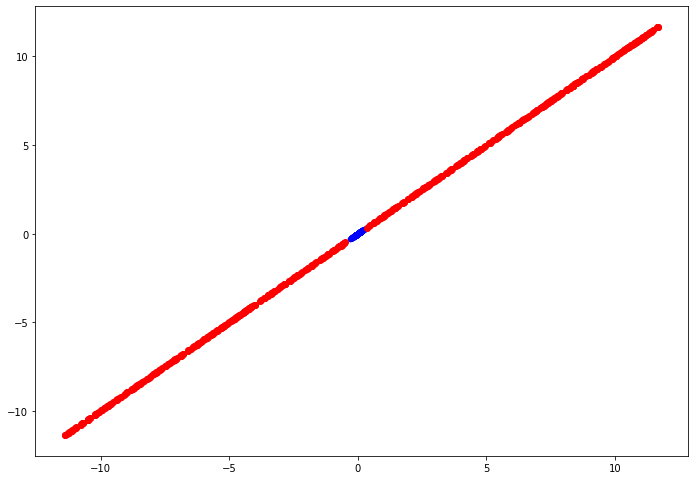

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


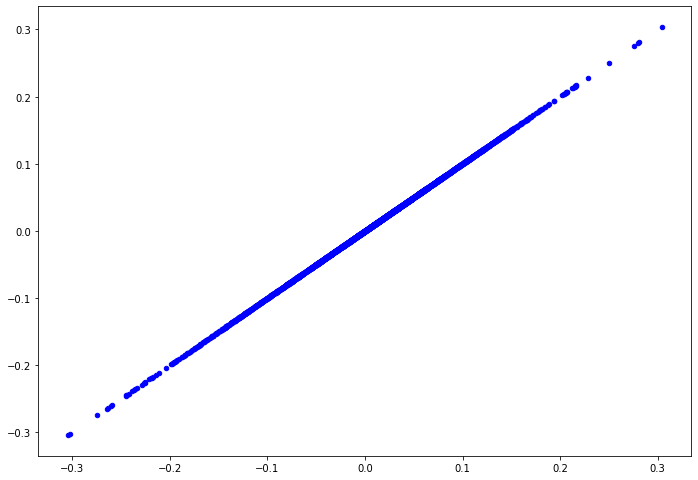

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

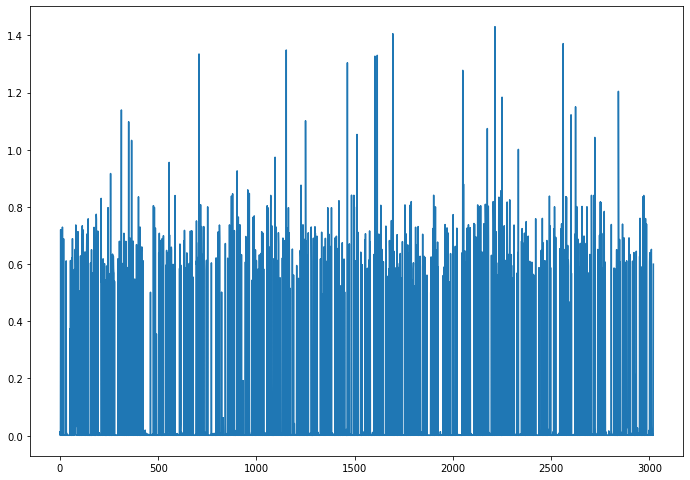

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

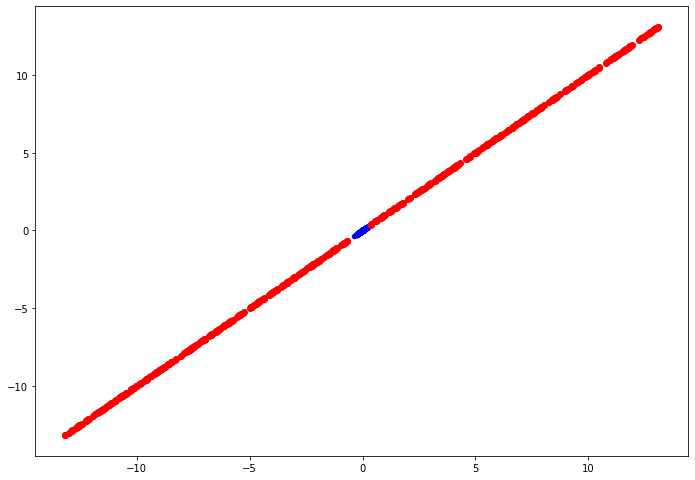

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


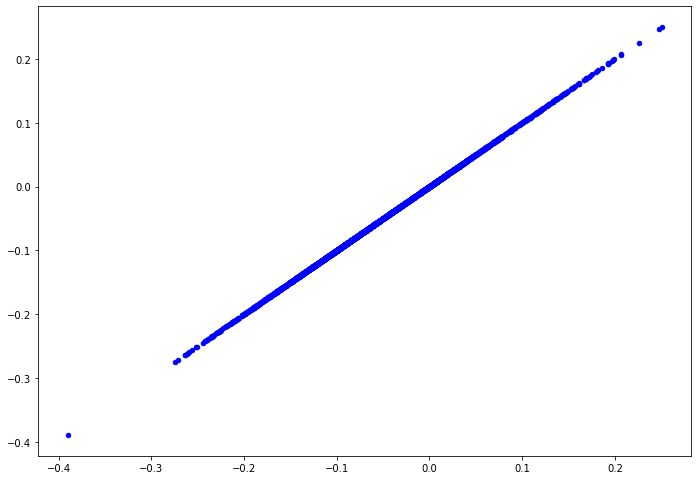

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

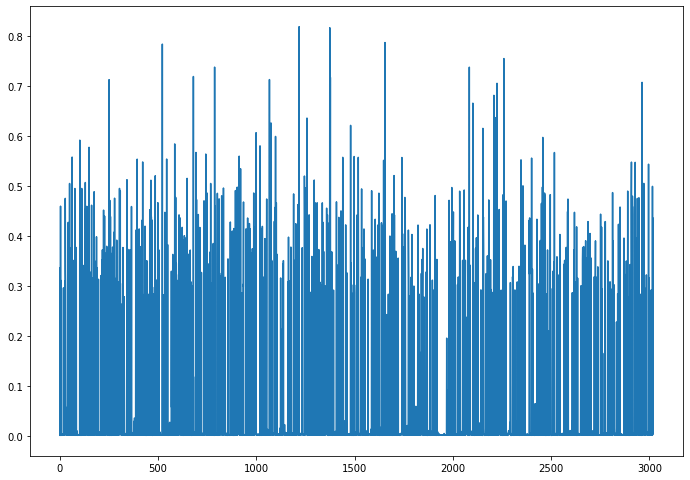

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

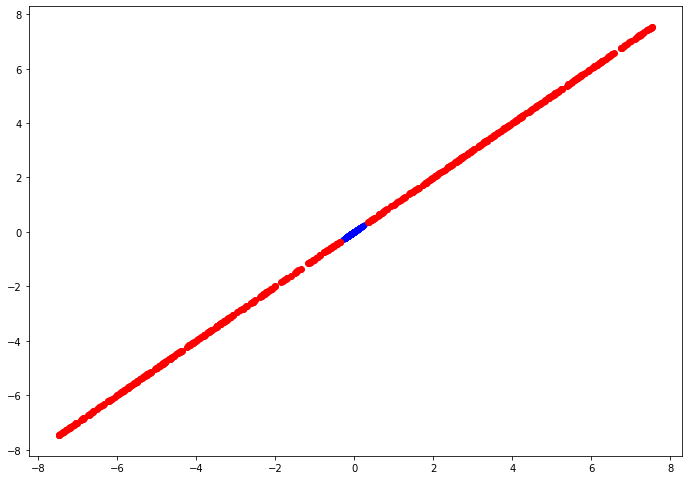

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


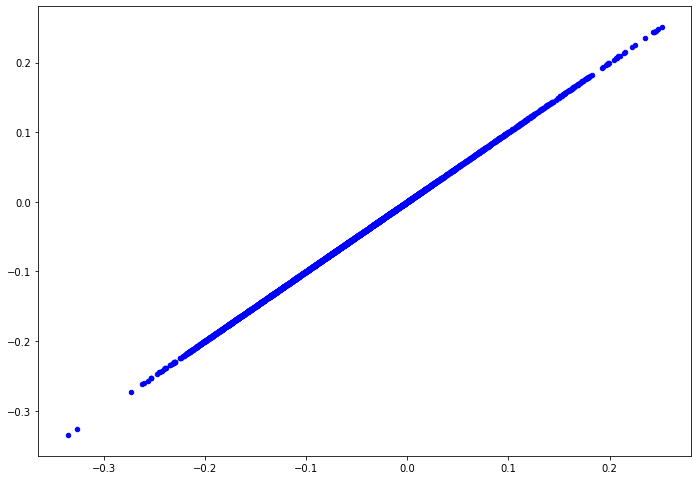

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

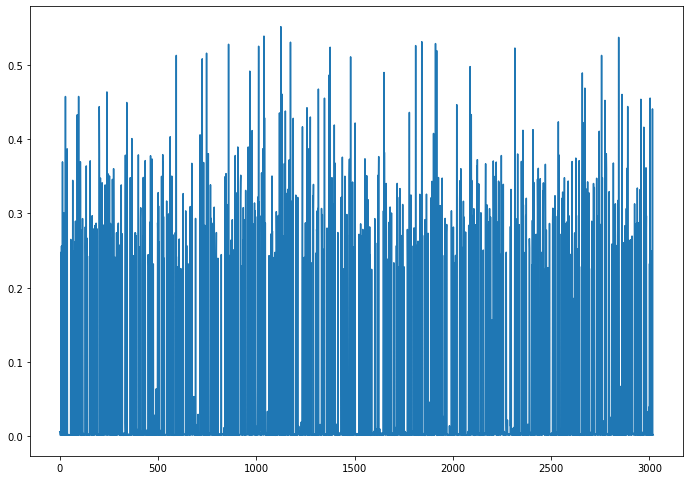

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

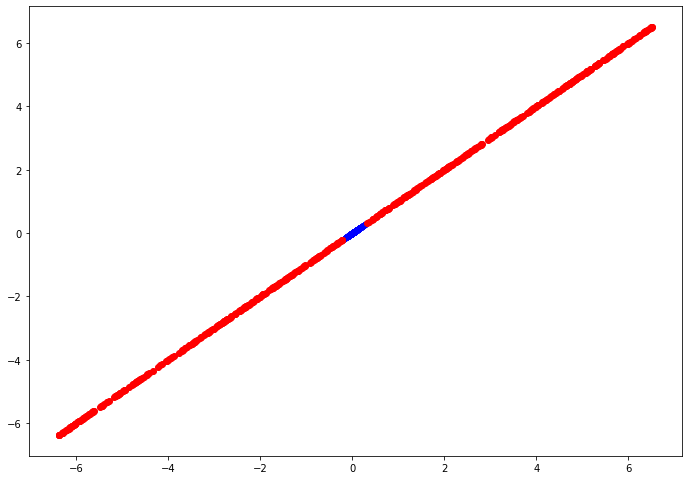

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.08)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


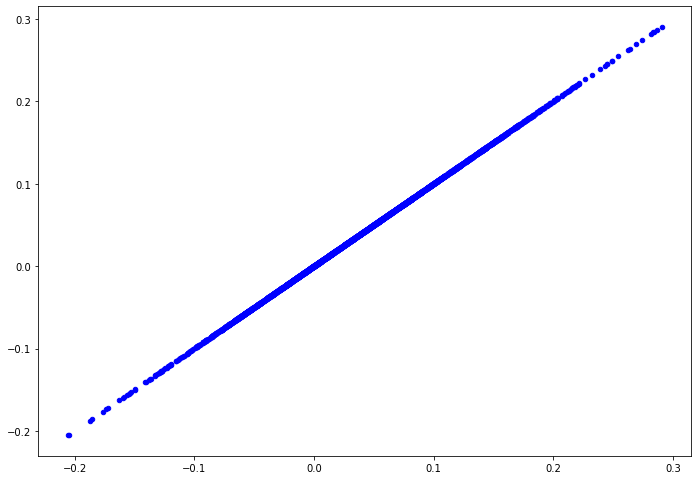

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

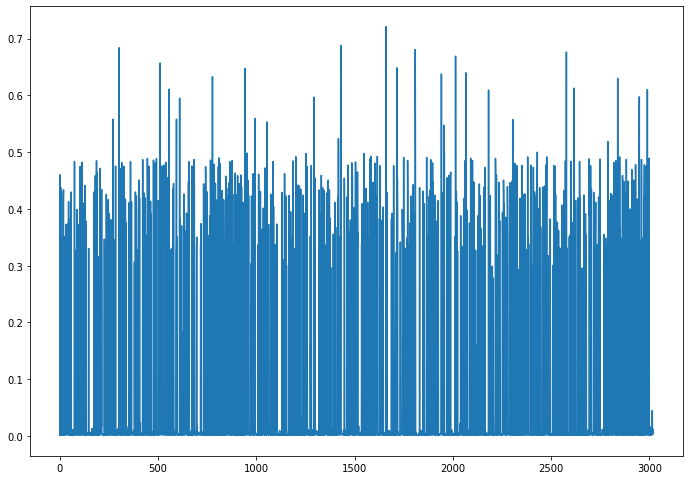

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

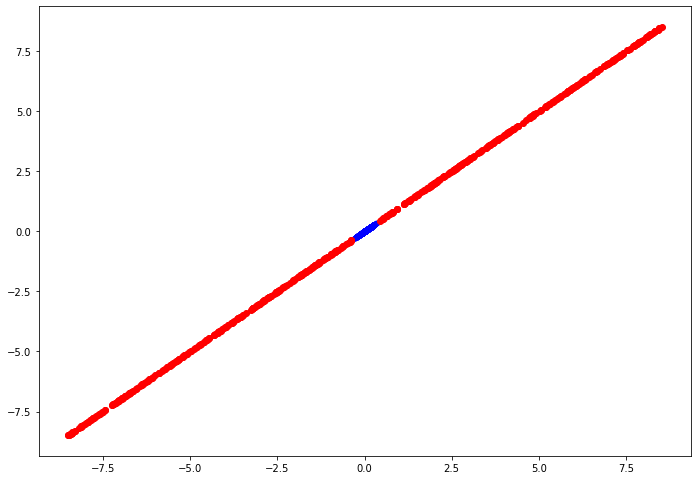

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


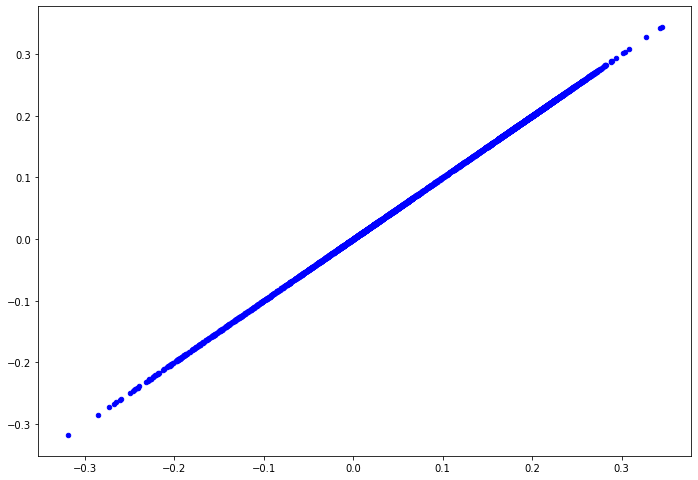

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

### ML algorithm after outlier detection

Z-Score

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsZS)

In [ ]:
# evaluate ZS with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8914266799073155
Recall   : 0.8914266799073155
Precision: 0.8763132289482505
F1 score : 0.8664374405455477


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate ZS with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9655743131413439
Recall   : 0.9655743131413439
Precision: 0.9655251391444559
F1 score : 0.9653615538114384


KNN

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsKNN)

In [ ]:
# evaluate KNN with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8910956636875207
Recall   : 0.8910956636875207
Precision: 0.8728608521345204
F1 score : 0.8667114736292024


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate KNN with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9665673618007282
Recall   : 0.9665673618007282
Precision: 0.9667055272338941
F1 score : 0.9662718445886156


## Accuracy 90%

### ML algorithm before outlier detection

In [ ]:
X_train, y_train = frogsSplitML(dirty_frogs[4])

In [ ]:
# evaluate with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.47600132406487916
Recall   : 0.47600132406487916
Precision: 0.2265772605115181
F1 score : 0.30701498273392974


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.97848394571334
Recall   : 0.97848394571334
Precision: 0.9785848971723785
F1 score : 0.9782559222982775




### Z-Score



In [ ]:
currentDirtyFrogsZS = dirty_frogs[4].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-7.49583630266903, -2.1365665428844265, 3.661540234293337, -1.8343364369617632, 7.744204597786217, 2.6842534741376567, 6.520310277133787, -7.802676975368929, -4.801798269229451, 1.7932592856847285, 2.85720622203115, -4.102140408586867, 8.733777354766799, 8.925337692958838, -5.350838444885284, -7.015629085208103, -1.1512114351785003, -7.88528273915554, -8.141633919125544, -2.310864438767481, -1.3154870699016508, -4.246616327784236, -8.332111104899685, 6.824387960742743, -8.073975976991845, 0.559672114993989, -3.3254560449621486, -1.1823224418271543, 3.6734217624187, -0.543337864144128, 2.568869030258635, 0.0918122707385915, 0.587596033138286, -5.320581151354876, -1.4121178270407393, -1.335975533882093, 5.93921460769108, 2.3222703219113567, 3.2176727579154654, -3.379102921526365, -4.135968890780161, -7.017673207662625, -5.629028448261206, 0.320530675192255, 5.667304831530608, -7.479736412415948, -6.017713146169248, 1.261841287669434, 0.616582336035476, 0.7049

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


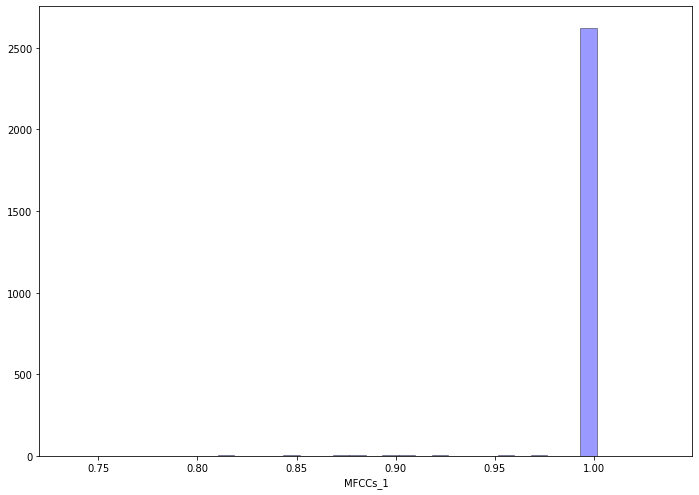

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsZS.loc[i,currentAttr] = currentDirtyFrogsZS[currentAttr].mode()[0]

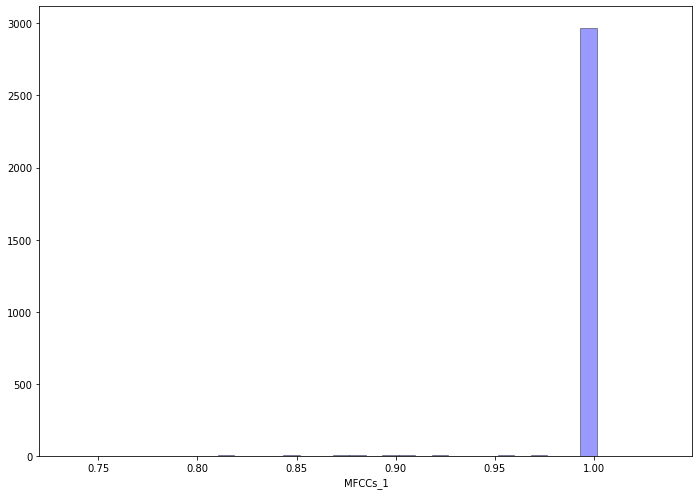

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-1.7665080585492472, 2.766797372307518, -6.657868496117482, 4.473131746907903, 16.238129158533003, 7.657626504190227, -8.195121445339717, 10.422266658105949, -7.53674710345156, 13.468366100408527, -8.756152287908654, 16.932278551278507, 16.841255520966996, 14.963981423361076, -16.402196082828137, -0.8159996587783063, 12.341983125210287, 6.247515561845939, 17.114146479429206, -10.78694783065592, 8.727558815613902, -5.359252768926767, 3.220224779441307, 15.643643435254614, -8.598587685597167, -13.434336286372504, -1.1659826525128487, -7.608402339471562, -6.86366208558395, -11.944461814957284, 12.969279564131362, -10.787416493529204, 1.0, -10.401379477104364, 0.916370412209667, 1.0, 4.791517924689441, 9.647133354861635, -0.312608727445704, -8.50188021664692, 1.105969842386281, -3.5075653204651065, -14.016312308661991, 2.684387169757379, 13.55402126386688, 0.861970458828033, 1.15355189157022, -1.4761685644113545, -5.105999898401953, 3.72186790550132, -1.4152771

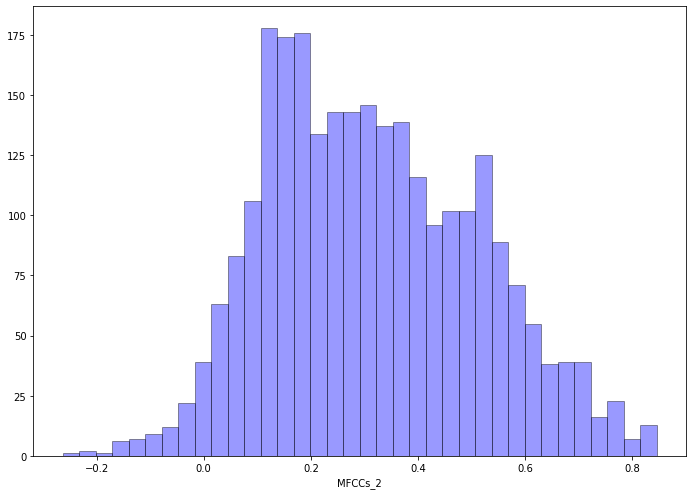

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


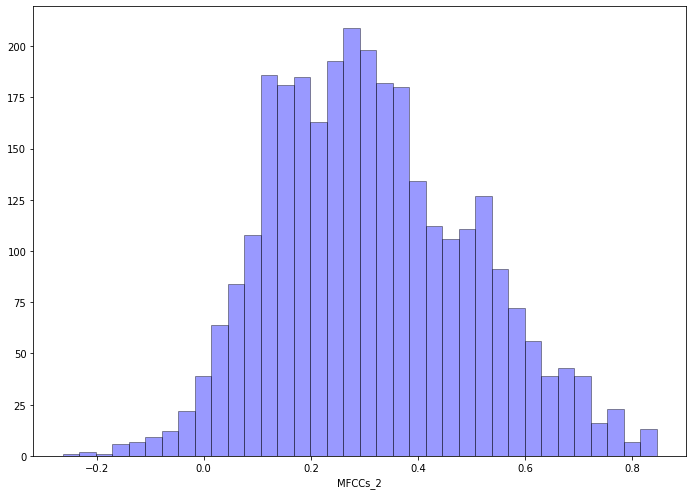

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [5.943183457070956, 5.585283991646478, 0.739748805610759, -8.415652634494307, 11.214165548719626, 8.5840537098899, 13.17370945878137, 1.514139479178133, 5.231309796244772, 6.1828423411610665, 1.0, 0.927010634043209, -7.3499980274621315, 1.0, -1.1708126656970084, 3.1019019506558627, 0.762039148654735, 4.890215694570035, -10.978465891146746, 1.0, 0.909065617044931, 0.837096824719624, 1.0, 0.761216749282267, 11.914640322227743, -3.5577081053901605, 8.912827153548626, -5.587700250536765, -6.27987230721445, 1.0, 0.962062910457533, -4.08624496343853, 4.411054339499738, 0.821012457441184, 6.167927619130337, 0.835569825205776, 7.011091449041921, 14.423349092318295, 7.249095674331458, 1.0, -4.8331174559527295, -11.588166443141144, -3.3336610414474634, 0.885191115841839, 1.0, 6.682965725924722, -0.348452218001203, 8.476910979711898, 0.903986361643703, 0.869443785839763, 0.82789628530843, 0.908895754876146, 1.0, 0.986512096614202, -0.6144061145445026, 7.279632139227333

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


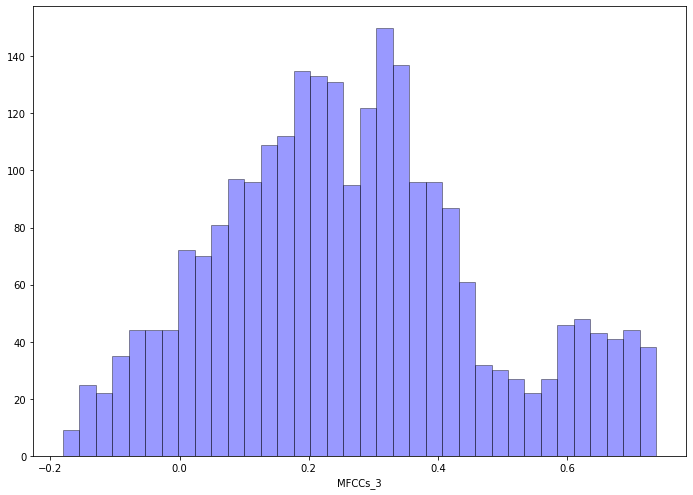

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


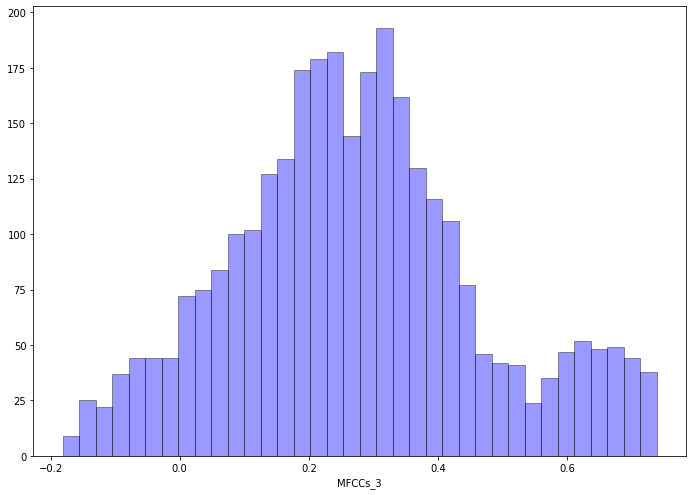

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [10.220415277942829, -1.9057112072198328, -7.504471202399433, -7.129433891502188, 8.61996111673193, 1.7944538725624897, -11.149960101910146, -8.898099254306091, -9.722109117677476, 8.556666403887432, 6.917276607253778, -0.0127325050306961, 1.7463005689931714, -0.0364850585954588, 1.7923029763412588, -6.1157003101180685, -12.017428352617578, -1.0611695132159171, 0.0393690295820109, 3.564606642244049, 0.0589650268584747, -11.179538819050093, 12.726591844088272, -3.1737253632250617, 9.721692243717854, 12.95960913016858, -0.0368450118729069, -7.107020248709751, -6.038812725726596, -0.0508999245554442, -7.026176052061595, -6.898399923584849, 2.1741695395409075, 0.830000572027039, -0.0456467677566578, -7.772754211706792, -0.0277054156805415, 2.4039457506595, -4.2528700329723215, -0.0549451412270513, -2.0593533330909963, 1.5358331519404205, 0.0408143063162158, -11.74002500476404, 0.0561151938842191, -4.365516579930874, -0.0441227288560515, -0.162616835335004, 9.890

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


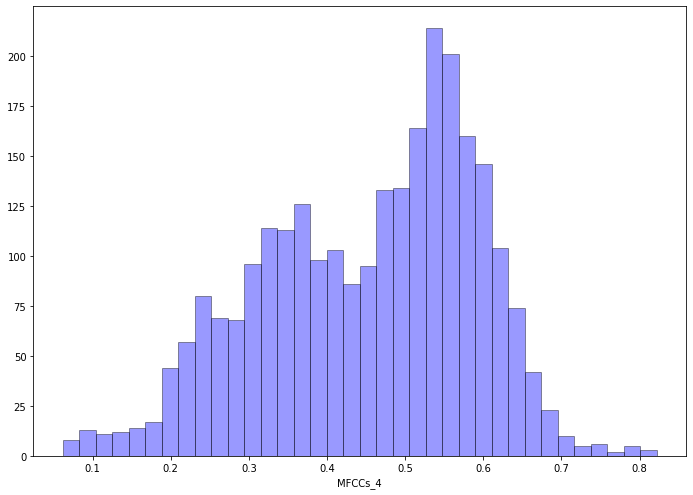

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


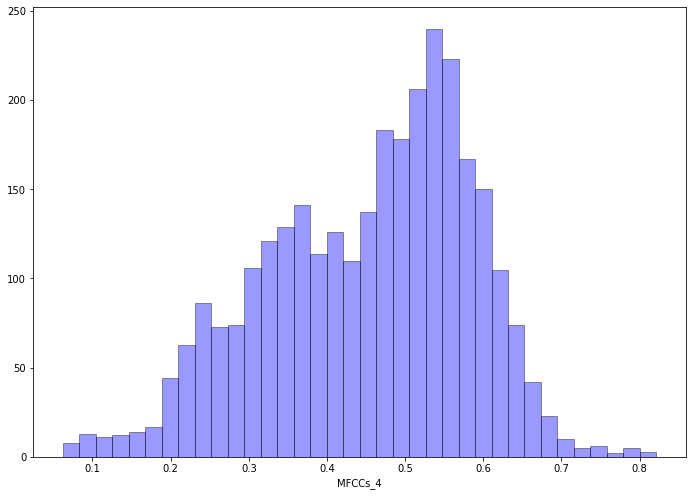

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [11.142223877317363, -2.392691443967168, 8.714331213221657, 6.397675645042558, -8.511380210737961, 9.768794518670092, 3.190702588703598, 2.609280523882132, -3.987786948751637, -9.120089679424645, -4.704712237694471, -10.443165269737015, 3.316596531242508, -11.204673302006873, -3.955657127849124, 9.754442899438612, -3.074613068096939, 8.707446718572342, 3.988859148890244, 8.329044417280727, 5.777633345441242, -12.38311440338691, 2.008955656539836, 4.060627757100317, -12.124392989520206, -10.473939766846003, 5.47645888917172, 4.815152579195951, -11.49051698886256, -7.812711539556903, 5.786155625469432, -4.493280486143101, -8.282303367487632, -0.9704321497066511, 6.381858310571966, -6.75718360430072, -2.183480379103869, -5.200307499996772, 2.3690855848343726, 3.608184748194045, -9.580197963243256, 0.481842625579104, 8.726353941899427, -6.598329734250717, -7.825840661129845, -6.081841629638261, 10.8948662551729, 6.7145178714697416, 3.1368329834171926, -12.058506

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


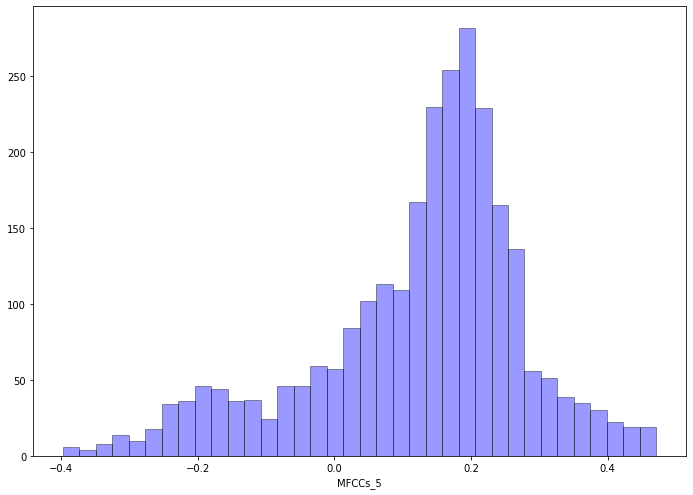

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


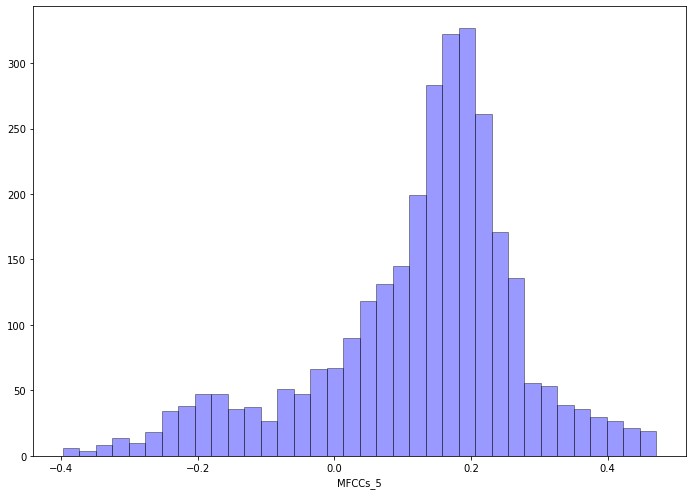

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [7.987272635130081, -6.493765262428177, 11.204104503189797, -4.253705776267697, -8.038826557099387, -12.360205008172583, -11.66096817614563, -12.901651081307264, -13.553125516263483, -5.149241889100503, 1.0194652268674806, -5.887591341168728, -5.843205886411393, 3.804341962064997, -7.357600888428167, -3.3091197567207065, -5.554113205691646, -9.80234390358484, 11.837863711053371, -6.801880573907299, -8.717809900579116, -4.806789895231395, 5.831382610576828, 10.13388016339996, 13.622377489277332, 3.835302900043336, 11.106718888381804, 9.146285135392576, -12.04612885233484, -2.509763141096037, 11.376767795695432, 10.707245802461587, -4.271261403181223, 11.921554398470976, -4.919406236174595, 11.285489922185812, -8.76439181355063, -1.4563709000867675, 5.245933635781784, 10.3205493835069, -0.410416976545143, 10.121079689665184, 11.44845263076376, 10.072864228373394, 2.800376375829638, -11.023149854057923, -4.01092906689866, 10.968082957352008, 5.064760331335315, 

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


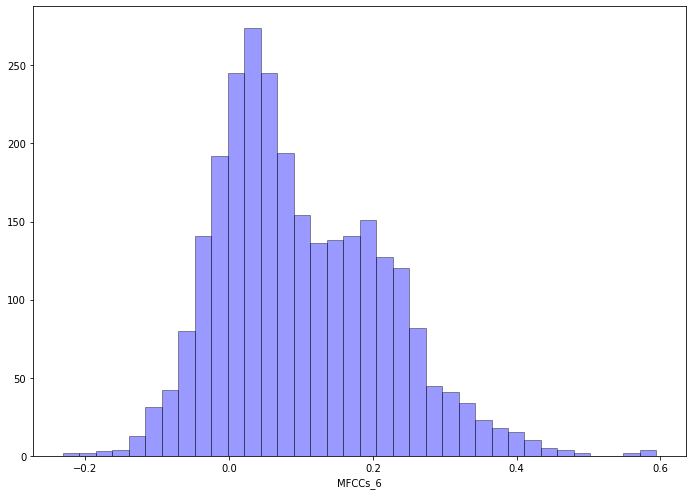

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


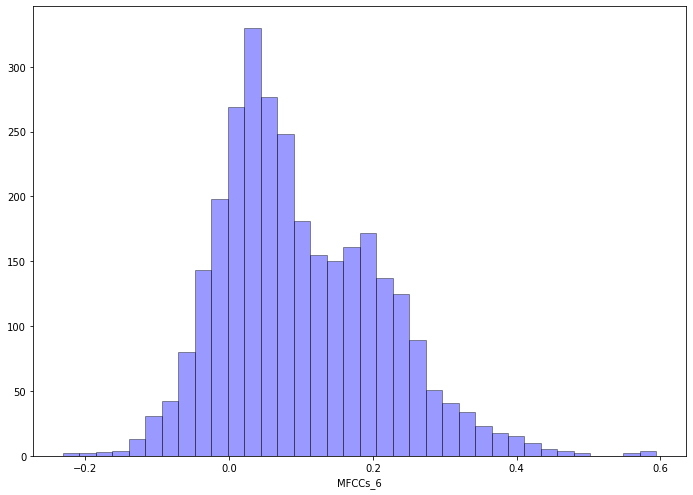

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.15)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-14.082049400339052, 9.170675688423088, -1.0990377241630025, -8.031857274736781, 10.933650122472685, 3.609239258894024, -1.9611651497483749, 4.038109575227806, -13.810598086396883, -10.60361509988089, -14.65280909543104, -6.347490719836825, 11.920802241948016, -2.0819452916112398, 0.463857329048428, 3.51782734800899, 13.556005690964389, 13.985616452761056, 11.802647951973556, 0.607676411757908, 14.640244482889496, 9.727238952316087, 8.339058492414555, -4.316711182287, 13.986333036728931, -9.275364506365293, 4.5144417871402815, 2.2795054571240287, 0.558517077786984, 0.480602401381038, -1.7898244189394887, 0.458859009848796, 5.891485069843683, 1.7850902534304605, -1.6418263575975036, 0.534460246045058, -14.35223352971954, -6.54548201117885, 5.54554984269601, -12.758875188210531, -1.6844058367876205, 1.397555573489796, 5.96985917920176, 0.498195846488516, 1.919458039301131, 0.460843083209158, -1.0126342826009245, 5.555257358182354, -14.241313675656343, 7.50842

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


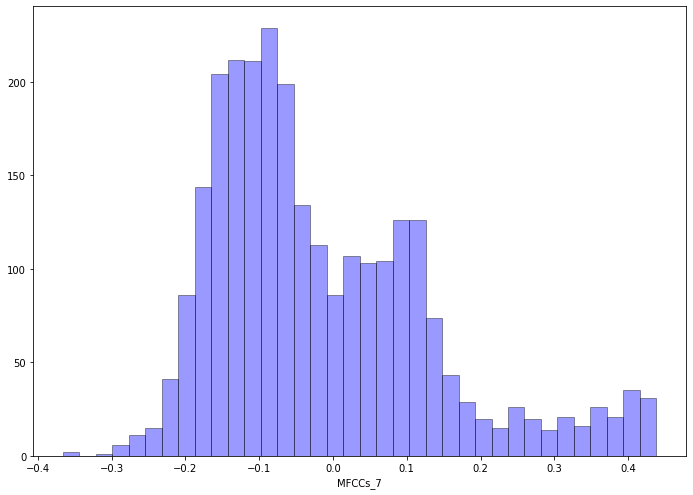

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


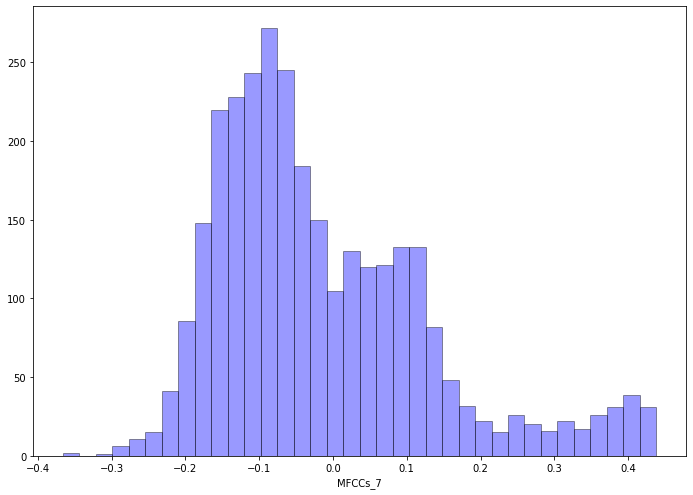

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-0.6466537300164248, -4.60110307912239, 0.9433695622014592, 4.670471129948312, -4.917435251151106, -4.240192239157266, -1.0649458967221026, -6.195506106282474, -0.6170346268000149, 7.3487057372573314, 10.571921131840702, -7.420820877193371, 7.993746339129259, -9.826109323383657, 8.266934600373325, -7.899440738600607, -0.8991897478300572, 0.6524398276937553, -6.27214981365427, -6.017404038568126, 0.365341276040532, -7.946054772630128, -5.908597402145316, 0.8813733377464312, -2.977775980643883, 0.7437666748967824, 4.896880969942513, 3.823923419866013, 2.0327119097842106, 5.518960016907118, -10.104018209758456, -9.468345948884554, -6.930378368672173, -2.5869309382458194, -8.79977634746166, 1.4873049199552058, -3.704003329812068, -9.106273588805358, -8.7652883267408, 3.2116105689472154, -4.135656687212009, -8.987951320527086, 2.568618684611071, 5.287171801390621, 0.7366870851406441, 1.1167130132629537, -0.389962551372862, -5.113328416822627, 10.011781593977044,

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


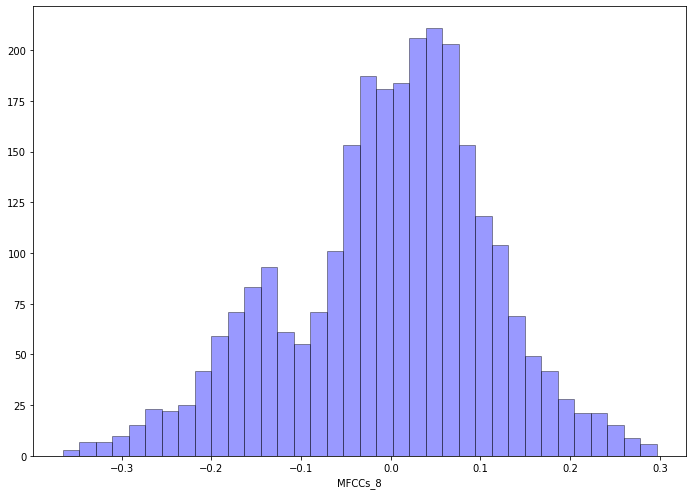

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


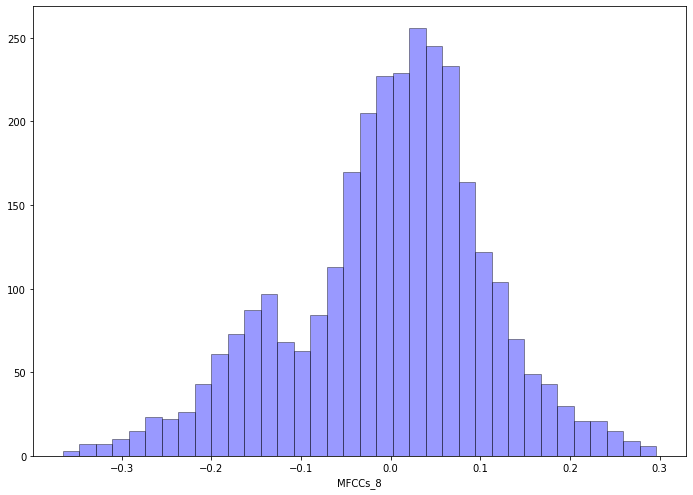

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-6.806187458822984, 4.893489847266788, -4.714049544417465, -4.231395193214134, -4.796700549134073, -6.262508085416372, -13.308840965407915, -2.555084463863832, -6.234264064375314, -4.787932791565932, 13.679509140804926, -6.765390602356115, -7.662496829216192, 12.731275914845256, -6.6448458505195145, -1.089993492769537, 8.338491040828425, -13.059319400223863, 4.556403539338216, 6.4369391691921445, -1.6578710913464594, -9.187589398051523, 1.2373710302574348, 6.14292293065085, -10.666303800474791, 3.917107590778527, 3.812048718465938, -8.238050667787302, 2.561666114804218, -1.884306504888734, -0.426612990245392, 12.893137678285228, -9.46124485627511, 2.553177502815394, 9.089189060232032, -13.548046872454696, 3.5997081171295355, 11.04892256408663, -13.32019165314276, -8.512724983767253, -9.97764340949544, 2.648055643790304, -0.384275046836514, 10.550429177892914, -4.544438468362484, 11.720663871545415, -5.092442561859579, -2.5758355007115394, -7.831279642702371

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


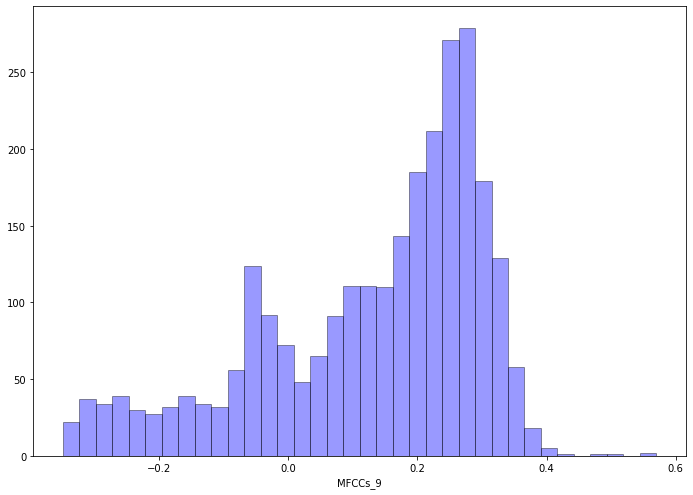

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


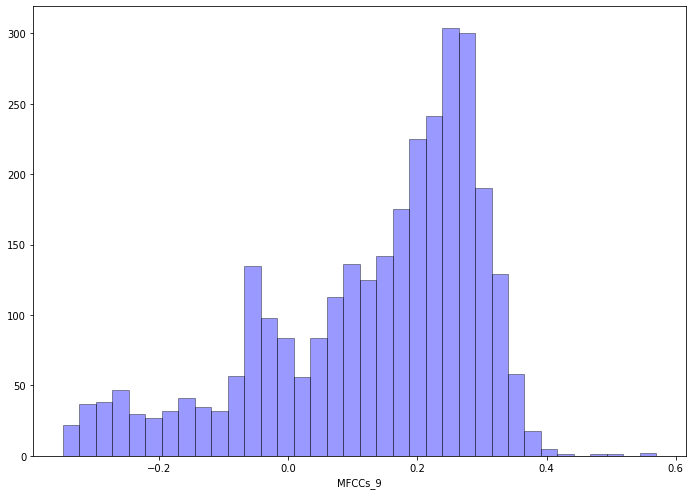

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.125)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-15.175777359261776, 4.3150031025551145, 1.100961582694603, 8.78122562606563, 4.320627879822874, -2.180460672698993, 6.989581698118649, 1.249006499947592, -12.89592979102194, -10.842500045614583, -10.903858738293785, -0.326719233930351, -9.197295395811022, 6.779485492614247, 10.07314844137239, 9.671050896293618, -10.889288341744606, 8.590281715122504, -0.402714145186378, 4.295798813819058, 7.573505436852344, -8.762838682351312, -0.331605206352552, -12.8762143021394, 12.963887390234438, -0.308958890718746, 14.128179501369804, 14.170400678787429, 2.455976644200297, 1.8080831731561848, -4.763197964633861, 6.547931857654722, 8.948308952450374, -0.314696361820224, 10.46919564065128, -0.327361608925838, 13.544140466910813, 14.224015903108354, -0.331652243216982, -6.275639935862516, -0.378558727261308, -10.535146835296311, -8.714355523493683, -12.783141328630316, 12.002566741831464, -0.374324000851844, 9.366331844755774, 2.5114674206287537, 11.951159057589914, -11

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


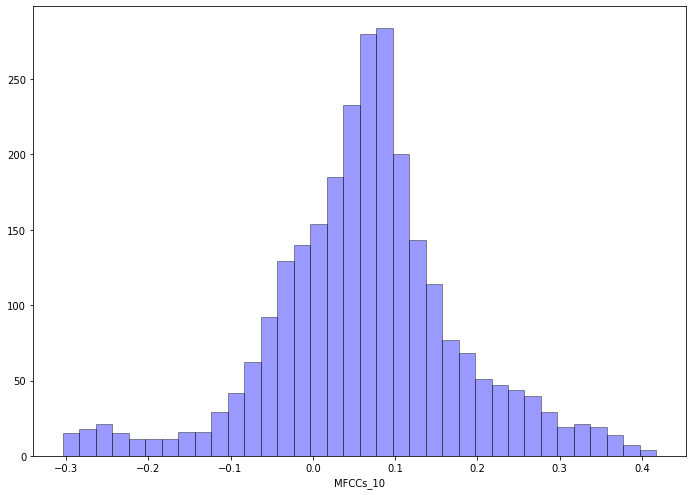

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


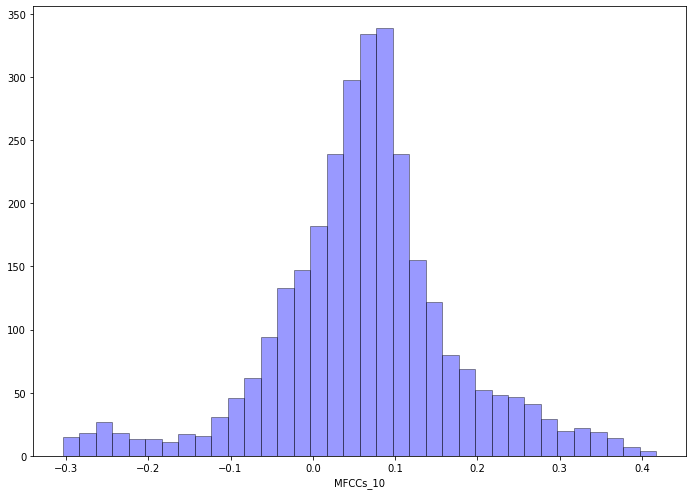

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-3.383182487121644, 13.744475528656732, -6.884922307256355, -13.65843248403419, 7.927682842080716, -6.759542417827122, -14.904190531396225, -1.3589653956061056, -9.13181875476779, -11.678450213920934, 9.98189080681497, -1.2078262516975364, -9.642162020449192, 12.19747600449882, 0.512229100363465, 8.448447089542507, 9.729738264145674, -9.892876326265874, 4.992622196564089, 4.020791152329241, -3.591263951449696, 7.456729505565956, -11.60486434884919, -2.259564689144538, -6.140438788843127, 9.734841070291631, 13.401565523265557, 2.412010918891938, -13.694471005913496, -1.1034301916492415, -6.7474954223704255, -8.861700059433801, 3.3246599270114974, 7.578327518368029, 7.257253637030473, -5.574020532909545, 2.8367728506020824, 8.100053132883478, -9.565363936762402, -2.4171715862237164, 11.454452390864976, 3.680907340088885, 2.070073051027222, 13.50780696320398, -10.412587062697083, 1.9368327356282935, 0.411045011434541, 9.707621253106277, -7.028520308212613, 9.0

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


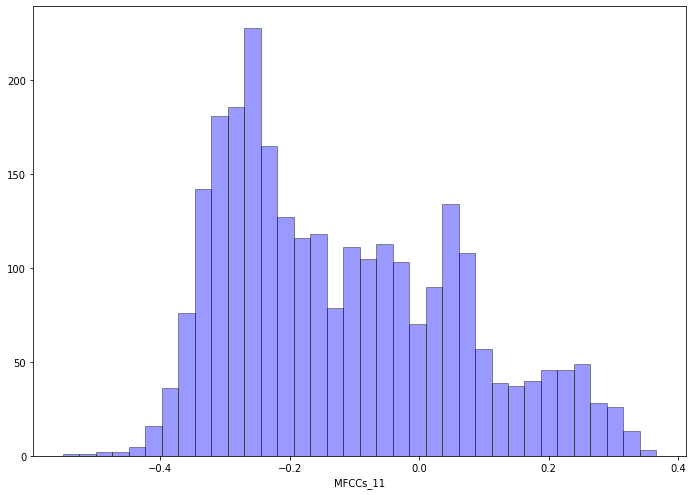

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


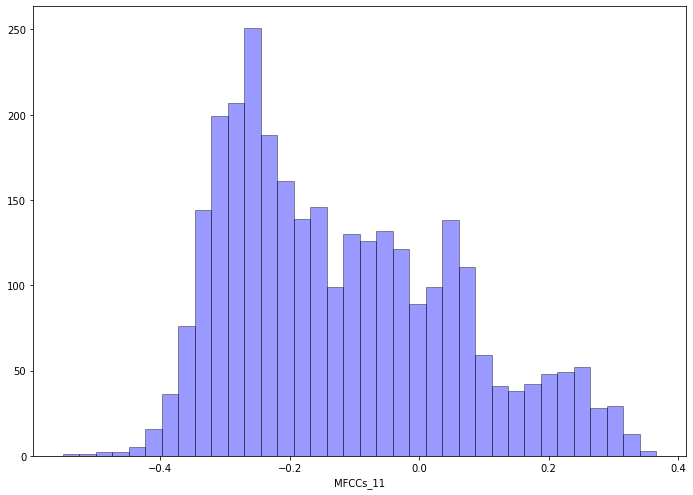

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [8.662513760369757, -10.919532288111713, -11.4173757322392, -0.796766047152051, -0.9151013355103892, 7.315241758622846, 5.278456423114193, 2.0729707071641608, 4.736987591974459, -0.442042164512647, -10.212213990319906, 13.189911258969826, -1.8230585740529133, 6.563538474180407, 5.684793555298467, 6.237228757673798, -6.386964875332201, -7.40880106602976, 7.246132425926303, -3.3074357988504204, 8.700357713344918, -1.4142139098144302, -10.330305307363904, -12.951305167437411, 3.113251920702917, 9.746329448188645, -9.987741750126265, 1.1449182530137525, -12.310888131900814, -13.400166821665692, 13.890772253717005, 0.532822449657576, 9.777933613189637, 13.286840408347407, 10.614096860456335, -13.903994998041156, 5.067122366557223, -1.1189744412491578, -7.132436991542692, -8.234748346693182, -2.546191732667093, -0.478984697560064, 11.597681928974046, 8.918445830559444, 12.384211959839147, -12.720503604917791, 2.591811145279844, -11.43673023655742, 0.60843011481217

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


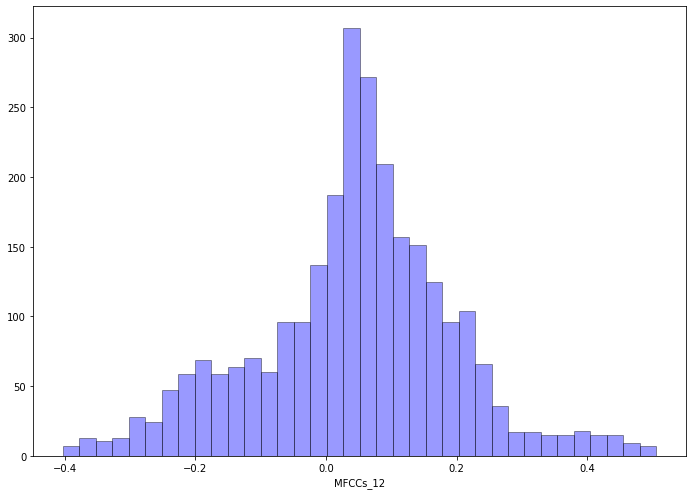

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


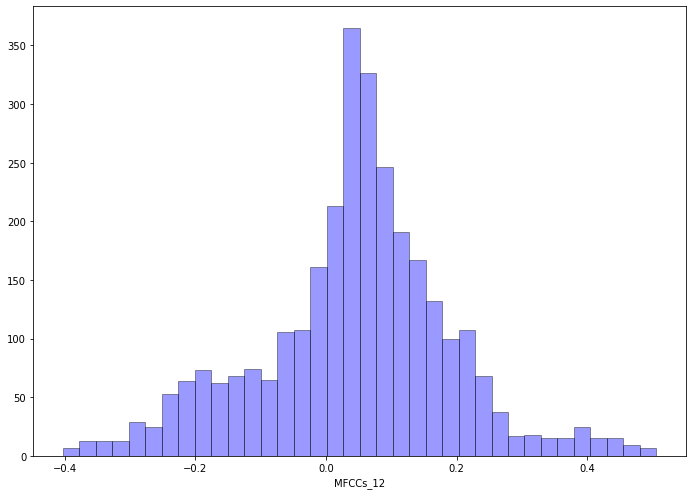

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.5014082624939578, 4.670022323068458, 6.039508639206829, 1.949147964055582, 3.5826067972579083, -11.06931058214693, -0.420323032158108, 2.7406265665434746, -10.832267374049872, -10.83513433775577, 7.773108200376745, -1.828037088023992, -8.436615708710875, 4.033340663546852, -3.771862106736748, -0.36196179954695, 3.86277547692458, -0.563487770001366, -10.553181362740546, -6.389350097796712, 9.75133652775963, -5.368730393778629, -9.99192269132012, -0.398902579349094, -6.378116736029805, -5.220669544068219, -11.49755017325171, 9.6801375807549, 7.323881336610294, 10.180994737713682, -4.410637389357753, 12.648774462124305, -11.23276597335896, -2.4106861613891546, -6.016557640576626, 1.0350890274403857, 1.5136590781824697, 6.164429853465358, -12.882573308582463, 5.103491567036725, 10.756076836359568, -10.309159133289224, -11.985546570413591, -10.96021438180241, -8.245587790391417, -13.2635991528498, 10.964708721743818, -13.429551432070731, -11.330036258301742, -

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


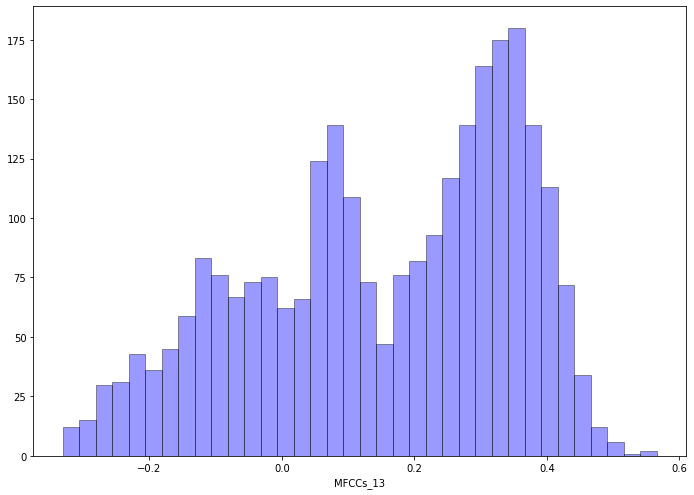

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


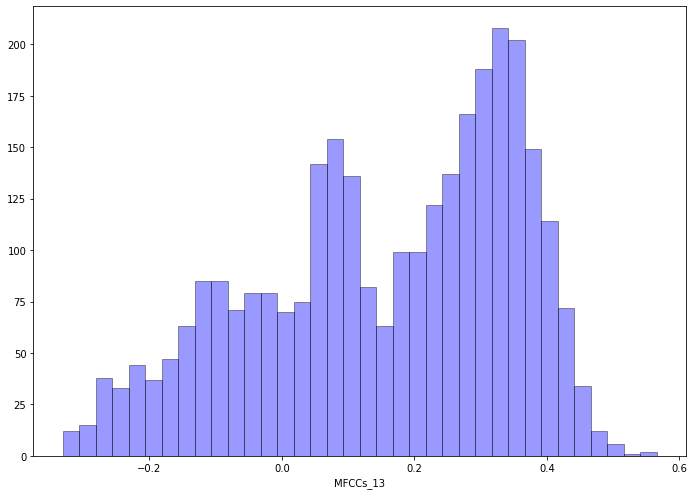

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.14)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [2.9717389908103566, 8.71092976134953, -11.551158629945109, -8.46211146587191, -10.356581404819885, -10.18623693978228, 0.331709712520219, 2.7207909429146264, 5.138039304257596, -0.8558094732011892, 1.4247898641903067, 2.189701090037533, 0.8507277523349792, 0.381636434986654, 0.335923475954116, 12.181142371540297, 3.620243592751665, 0.349816116799096, 2.775169613329863, 11.888779111386423, 1.4359147264706245, 0.347571112200093, -6.467715374958829, 1.31876895890878, -3.044517067721781, -1.1923457861341102, 1.57751978499073, 6.054509150861768, 0.295660195068074, 11.785499017196518, 10.805116279803212, -3.286674346791848, 0.7488837083197112, -0.356441203591938, -11.217541658194936, 0.292203115138246, -9.375836418582283, 9.68365698432076, -0.411386133472875, 5.909052949539469, 0.302489340534151, 10.499669079717425, 5.781665652917854, 0.298110785881355, 0.295491130419886, -6.601537343642332, 6.759792014898329, 8.969041678783876, 0.42376534065931, 1.68907691805324

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


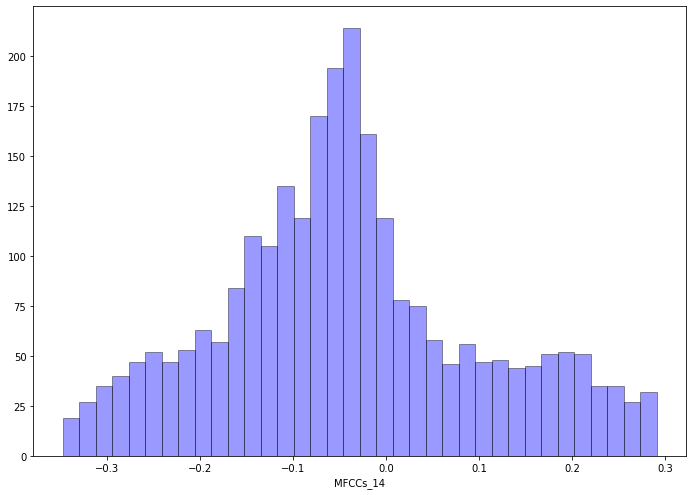

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


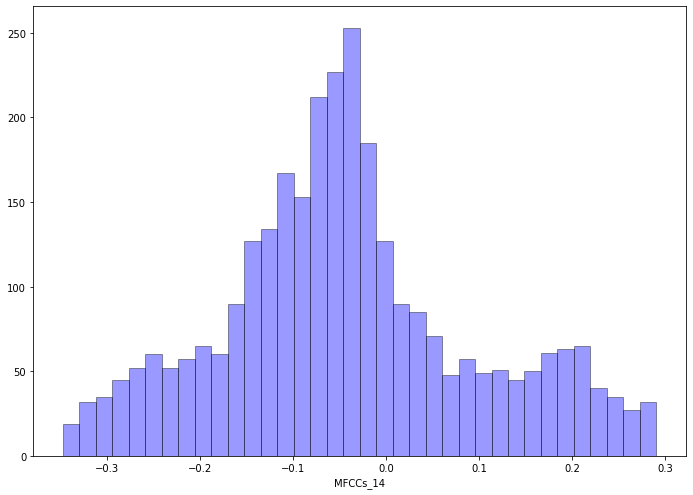

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.165)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [0.303180013361515, 12.201815853145131, 4.305314425632979, 0.280686248633016, 0.395927136913258, 7.165051595878565, 6.769712680320265, -10.10762023281004, 9.595510683845651, 0.298419936381493, -1.302674669340675, -10.274209871331257, -9.72562244882232, -10.89750210591608, 0.289807678635909, 0.339094821641508, 0.413627518224884, -4.18170155295198, 1.5817256128608486, 3.1631708914235497, 0.339347469692141, -11.648837400897282, 3.644453029606867, 9.745856642399604, 2.020032207236475, 4.384047188375015, -10.71435401961452, -7.754603368507788, 0.291757784519157, 2.629253257880636, 0.295322400422938, 0.341783303686422, 1.0819552886923491, 0.359840386654787, -8.58009004442865, 0.36615895998588, 4.57353786757629, -1.964573076872206, -7.170287166107686, 8.463301099643273, -11.163543167471072, 1.9893307069712705, 0.340389164113473, 0.290886266630639, 0.365765833612983, 0.274367680953217, 10.532786595671244, -9.742036608613397, 4.164628093055392, -10.750484204632574, 0

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


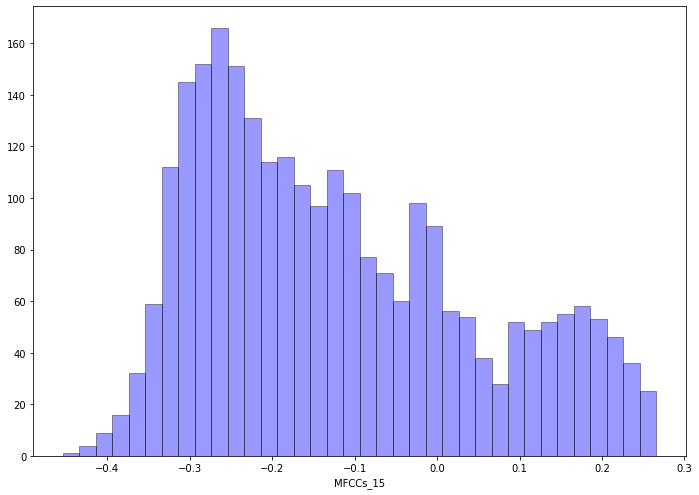

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


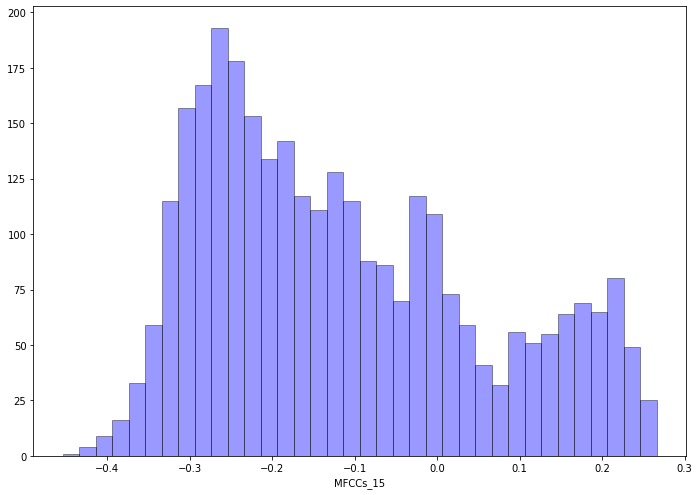

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.16)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-5.462230203572402, 5.148904880620193, 10.367466751075114, -5.053858713549653, 7.853367368912894, -8.02553518936632, -6.920710858006048, -10.52961500217864, -6.633461205368137, 10.612279114990317, -2.266173835572696, 7.956249221913978, -0.29945048876939, -4.137596428473628, -5.26401773040636, 5.10866790890664, 3.9055473540961354, 9.364318933764691, 5.473641431538678, -1.726358276169682, -9.979481900761868, -5.351336999997052, 7.603647996789175, 2.5356415783034647, 0.98796937014177, -8.418310880660233, -5.389755463479653, -8.197230267452127, -5.822512540919447, -8.515834181877725, 1.927928557939136, 2.6532698455760304, 9.06446587440066, -1.6962931023787533, 1.2128709925560477, 9.29187155249434, -4.270568710970026, -1.4347953384923144, -9.37444699572808, -2.601017208311135, -2.9476770050676477, 3.32405863808945, 9.489090945017828, -7.994673041717262, -0.7407506819934113, 1.0358511883423, 1.6673018003771207, 2.365927248330129, 4.660155461740651, -3.12069617127

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


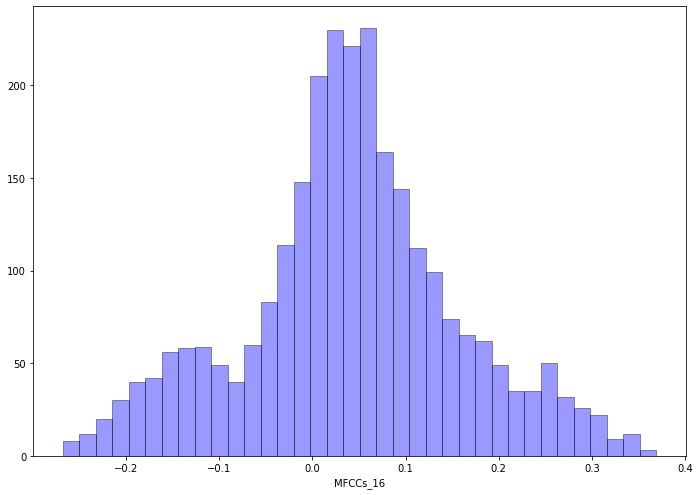

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


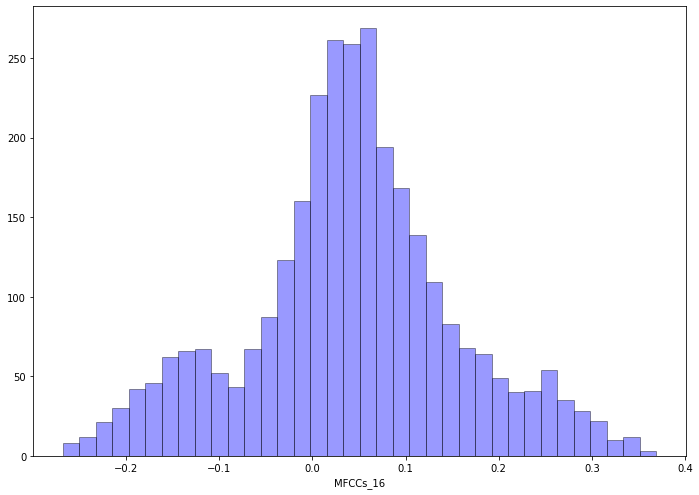

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.17)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-9.82144259050801, 4.002724885821077, 4.174304308443492, -4.945311789356995, -2.330030290193461, 0.973755511233046, -3.2570385730401217, 7.09498952875984, -2.96331612232229, -4.192335670898579, -7.737996923374697, -4.877527816304244, -11.339869079166167, -4.253596497442637, 10.75497020829403, -4.857903261260897, -2.214412961529993, 4.679422965835641, -8.407345922803156, -1.0664731989409884, 11.530373498046815, -2.6792166421269137, -4.0823565759966245, -6.683464928833348, 11.105114660321446, 6.284902642466461, -9.152337271184953, 7.686659606953691, 11.582130851984475, -6.45217881422686, -4.825744530439131, 1.604867730890262, -4.036594441718767, -6.404874278533481, -4.358610221094859, 6.049204359792965, -1.7907503544793748, -2.19224677550174, 9.339303706718908, 7.647860237829853, -1.6107038709980603, -2.1894226257825675, 2.949140669338384, 3.991866143124209, 10.5227880020383, -1.7699817347283613, -0.4285383235967419, -0.37506998028783, -4.7439461814527135, -0

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


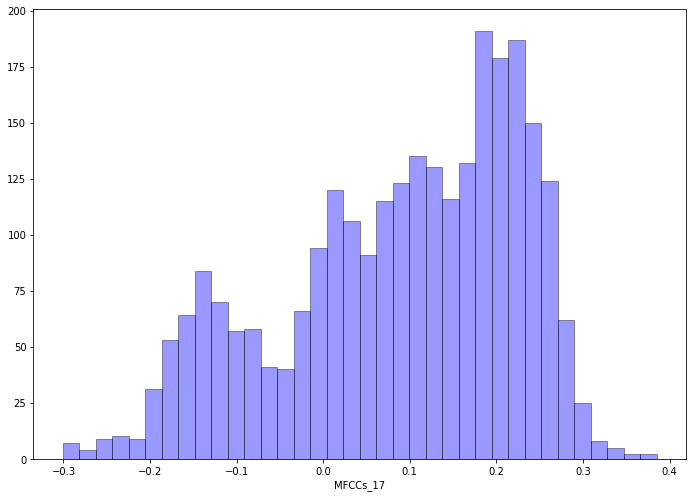

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


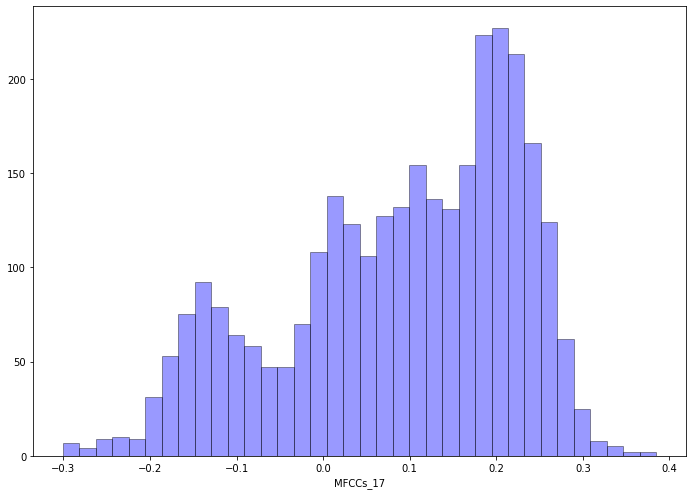

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.135)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-7.281079061340832, -2.785197486368814, 1.862288478268012, -6.949978322618093, -2.6645276680027496, -2.733803799794037, -5.3564169138880775, 9.071249081882447, 3.543425241291033, -6.332896147487814, 10.822116737233063, 10.18905021141182, 1.7944830697685874, -0.699851380623965, -9.371248040274727, 7.581994914720487, -9.949957024167784, 8.75035812653993, -5.424047871269347, 9.613888342978791, -1.9863156375669764, 2.763861581178195, -2.735496103010409, 10.654788880262585, -8.553179003032614, -9.29291365662748, 6.5408456070233765, -2.618180153120081, 11.180733169853577, 6.1709675497461465, 4.593881782074336, -9.608445359246817, -5.681953075482514, 6.249845772464148, 9.90147959107722, -3.866388335746991, -2.970792027921652, 0.22838083456048, 4.241350894586468, -5.838107483425814, 10.52793988443826, 2.3895158873707696, -4.9684863211920085, 0.816939270500621, -4.129701669320307, -4.781676142493897, -0.428829289294236, -7.106570635541979, 9.645160368583744, -5.7571

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


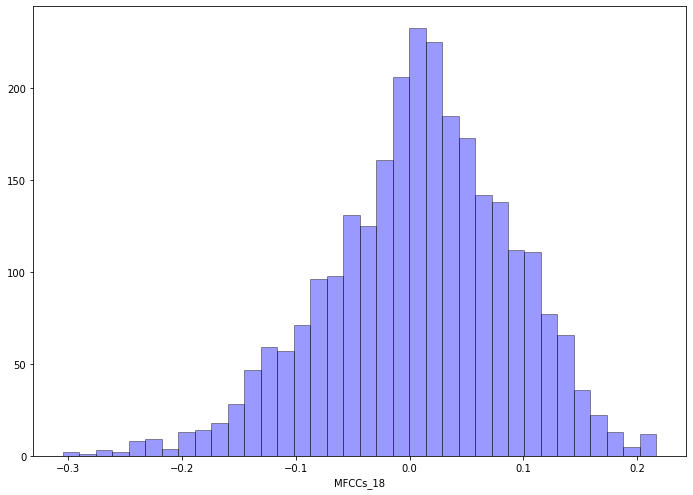

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


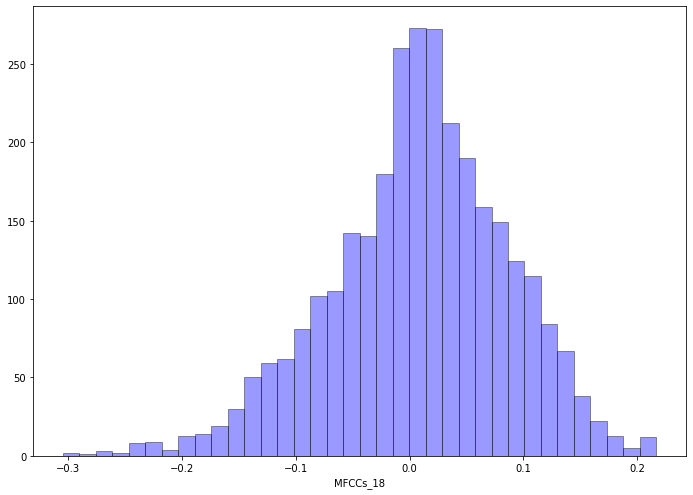

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.14)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-6.126993627589414, -5.965823286290234, 11.418157903202298, 11.489409474654396, -1.585775728971365, -6.376808386943252, 2.6961475356956264, 4.215082403992376, -1.4539954724011004, -9.018087186513782, 10.477741090322835, 3.9742482950922913, -3.5393868807010023, -10.287940907978795, -4.129587156653145, 5.538983754858183, -4.969346277809301, -5.428198436032215, 12.919642791901104, -6.398299226721451, -2.053677204662577, -9.493760260027113, 7.674496735250248, 4.795604570760047, -11.555086731593573, 7.082764722320039, 10.598753587815654, 9.994229291431898, -7.695825893023941, 2.8808497866054497, -2.869477803472517, 7.721412165350181, 3.992425742226115, -11.432770965247308, 2.3237512091409127, -4.162093922126708, -2.680014187500749, -4.643903613818843, 9.226681400594758, -8.889816927366926, -1.2530395050305838, -7.844314442191592, -9.262560949641216, 12.97809116856695, -3.2937602714997336, 6.954625249098629, -2.4586463022118714, -6.106630861373332, -5.73300628333

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


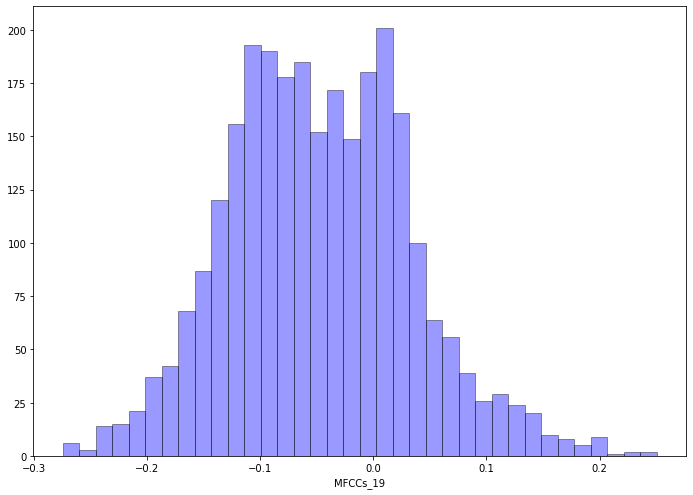

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


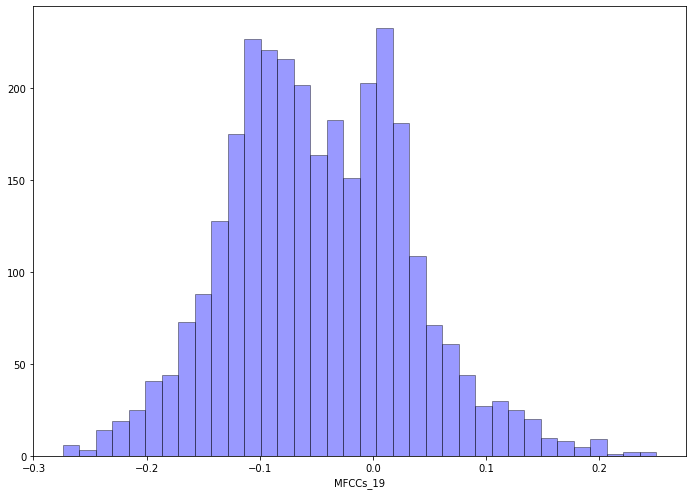

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.16)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [-0.7844921924082522, 3.770059015417263, 7.051945420331853, 5.586878104294993, -6.912071899744444, -3.5126089548722463, 3.9204088477137615, 0.243281577975128, -5.793364943739248, 5.715150560351136, -6.63551772803898, 2.4371676715764314, 1.2158297879019824, 0.206888602568797, 6.7209235375965175, -3.360591293499647, -6.778304758235726, 6.7636394490789415, 4.774279656438108, 7.388729909676725, -7.333470273266088, 4.644740917767393, 0.7983134793270885, -5.445562898645614, 5.270639343604695, -1.2611331723124597, -5.403532856573044, 0.200303169844169, 3.464050955272416, 2.481754965918334, -3.673247921385812, -2.652268755333262, 1.9746387086159995, -3.380613123532245, 3.46224372724214, -7.340659089203108, -5.84136210315701, -6.833833643292864, 0.204003579522582, 0.215260867132465, 0.214159097757466, 1.944226359707219, -5.7398385943054535, -6.808293747457849, -1.4531824146573653, -1.0710204787940008, -1.3598494296591015, 0.197305505333432, -1.946460134513892, -5.751

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


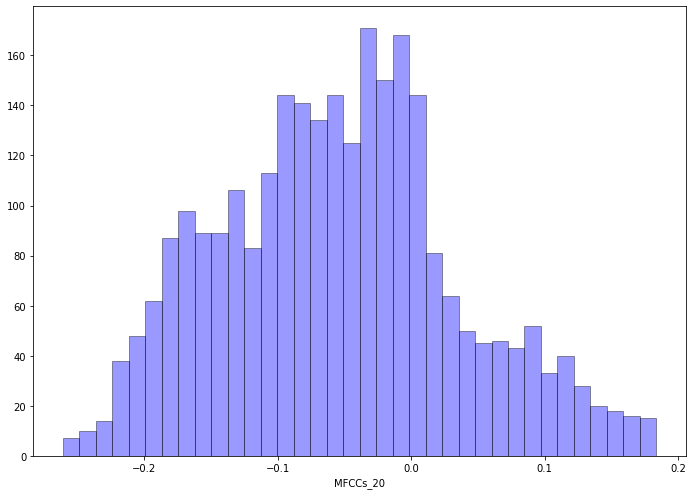

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


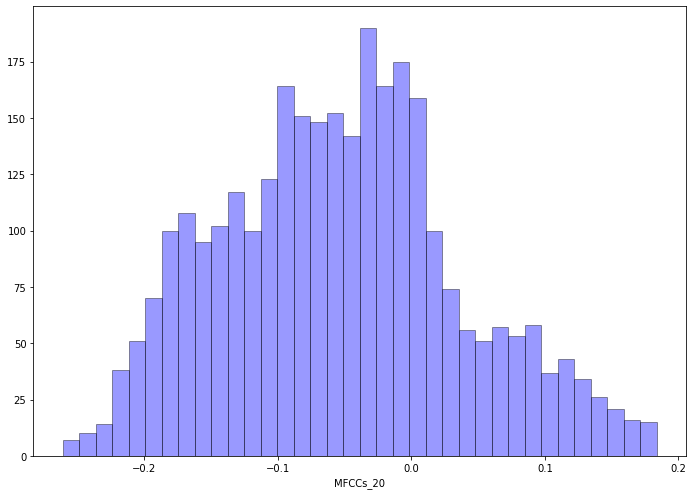

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.15)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [1.3375346580242722, 2.167594655629123, -4.377812090793781, 0.195677804148405, 0.218168228867891, 3.08024894646231, -0.6145988263684323, 6.522307860886235, 4.545725595786863, 1.4343644090890566, -0.214601279988114, -6.150636915703341, -1.3821796595063187, 2.386127082731752, 4.349526715677299, 2.701885963460419, -1.436801768845818, -4.324139283232565, 6.174216879837266, -2.621549927741252, 3.094022408968007, -6.290041833645512, 0.283771777371735, -4.96932159072511, -5.160091813597733, 0.226628914270881, 5.814124795529427, 4.198127571247149, -0.6407602990440218, 2.2966698638345617, -5.295316111622574, 0.191371558821511, 0.219687501577466, 2.4032610577320286, 1.031820881947053, -3.089510125677103, 4.672591841942014, 0.200735386709526, -0.5480265606448995, 1.863377217547341, 0.8137233404539161, 3.7682801130306487, -0.176524100673644, 6.126673971081345, -6.372685749128524, 1.1217987562296918, 3.5733176702552627, 0.562684825678845, -4.869191090231436, -5.237914891

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


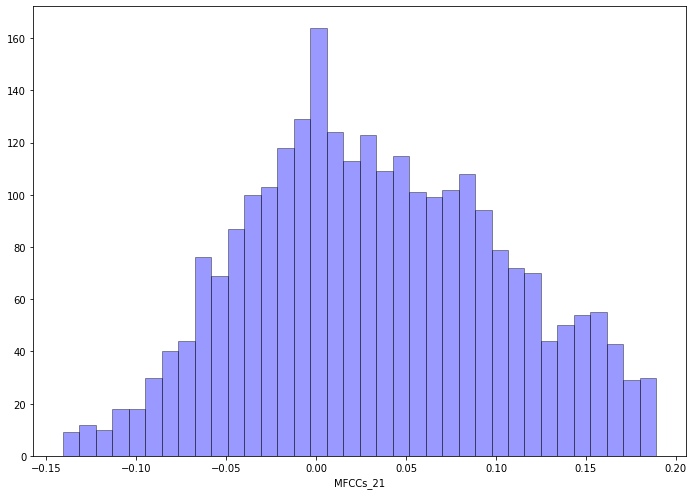

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


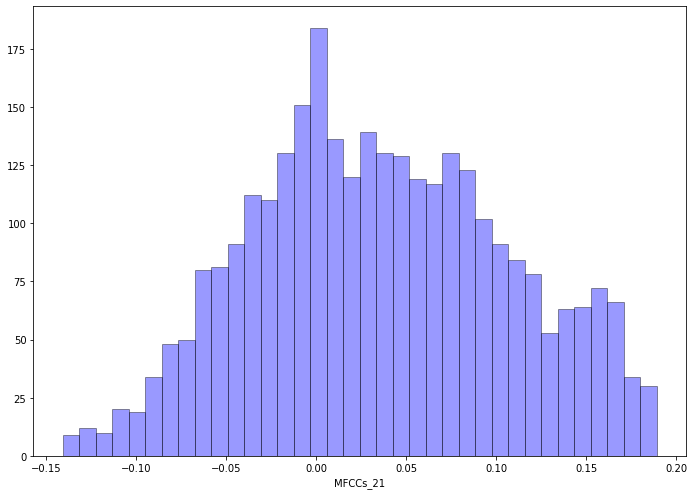

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

In [ ]:
data = currentDirtyFrogsZS[currentAttr].values

outlier_index = ZS(data,0.165)
currentDirtyFrogsZS[currentAttr].iloc[outlier_index] = np.NaN

The detected outliers are:  [3.839733996325495, -0.8713937222790493, -4.5378736085264855, -5.9337926631157565, 8.11098446775503, -1.841805073503676, 5.517254905730425, -0.187127699079851, -2.7790568091914034, -0.197015354687801, 6.196320369272256, -0.193845850757393, -0.2855162670256, -0.208280053666284, -5.427605694934817, -7.356628439291887, 7.058296325443989, -0.188184525716229, -0.191694723772004, 2.819011946111849, -0.218180951336913, -1.004304667232538, -0.218755804058916, 6.414823337329541, 4.3780061183821, -6.007561660321263, -0.203215921776678, 3.407470452663979, 7.729300780075843, -0.212337079720117, 1.021159933439484, 2.437570292646336, 7.96144168583305, -2.525199933859372, -4.044547427136285, -5.547179018509008, -4.097416514632933, -0.196326658931542, -4.107170473762723, -0.205913685791128, -0.227800896117573, 6.654494609433528, -7.479426470960509, 3.2458162566836206, -0.187282136180008, -0.241018612863287, -6.981380150783996, 7.868315313262018, -3.5212111443220597, -0.2280

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


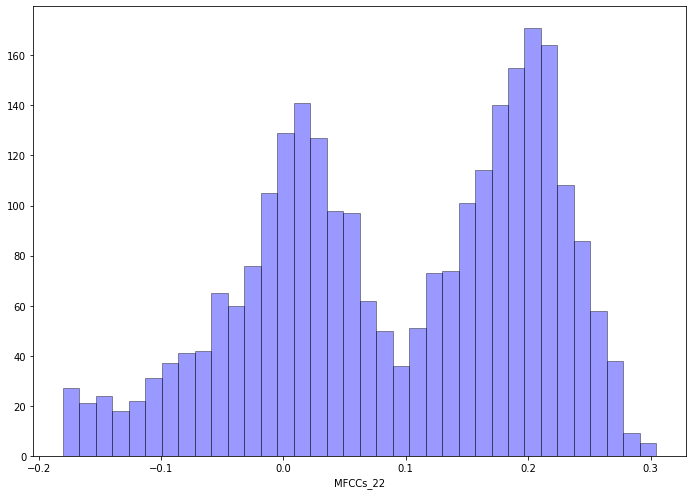

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [ ]:
# impute values for outliers

dfNoString = frogsNoString(currentDirtyFrogsZS)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsZS[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


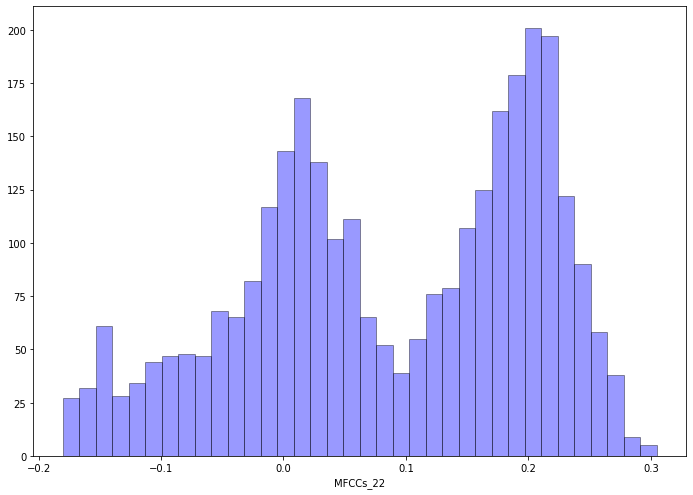

In [ ]:
sns.distplot(currentDirtyFrogsZS[currentAttr], hist=True, kde=False,
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})



### KNN



In [ ]:
# Dataset to clear

currentDirtyFrogsKNN = dirty_frogs[4].copy()

MFCCs_1

In [ ]:
currentAttr = 'MFCCs_1'

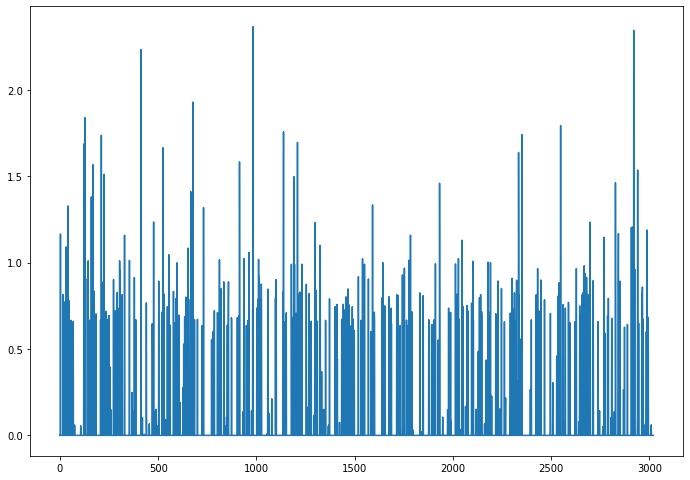

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

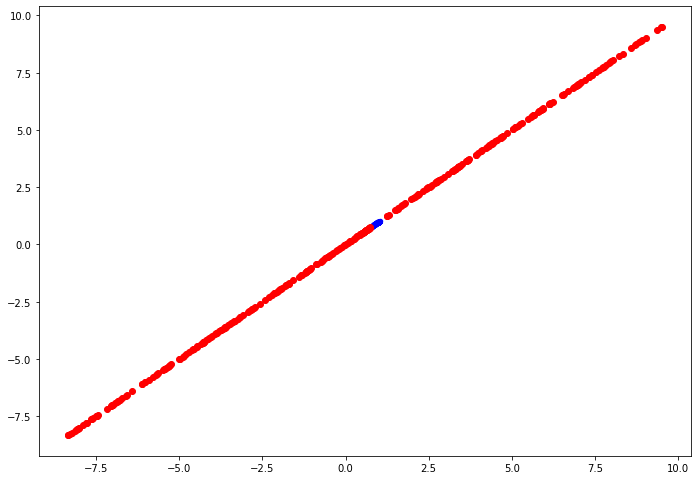

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.115)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
#impute with the mode of currentAttr

for i in outlier_index:
  currentDirtyFrogsKNN.loc[i,currentAttr] = currentDirtyFrogsKNN[currentAttr].mode()[0]

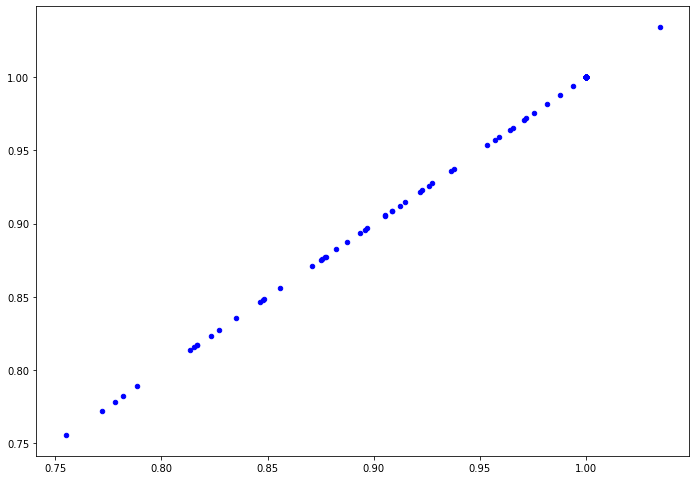

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_2

In [ ]:
currentAttr = 'MFCCs_2' 

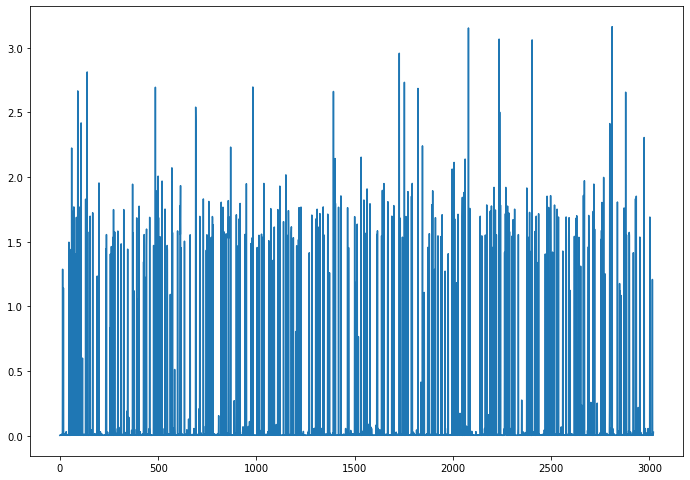

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

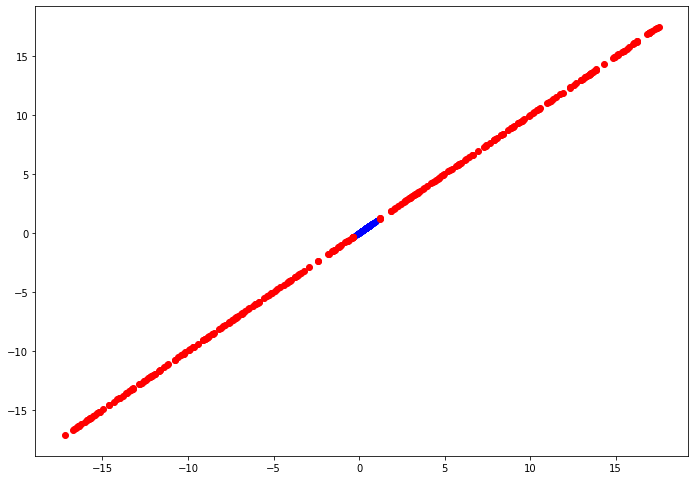

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


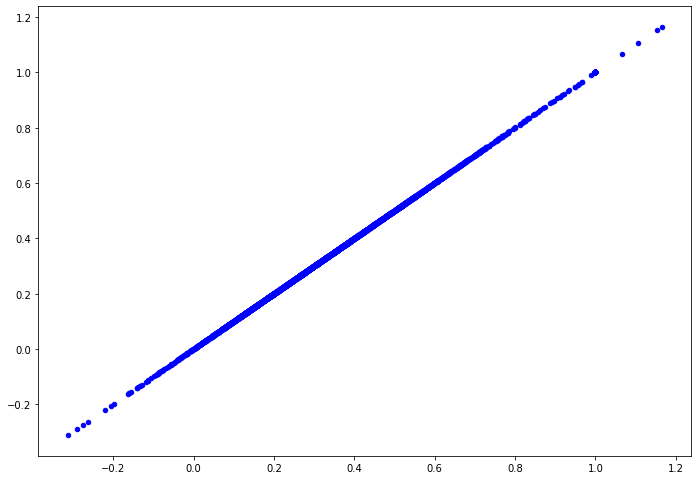

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_3

In [ ]:
currentAttr = 'MFCCs_3'

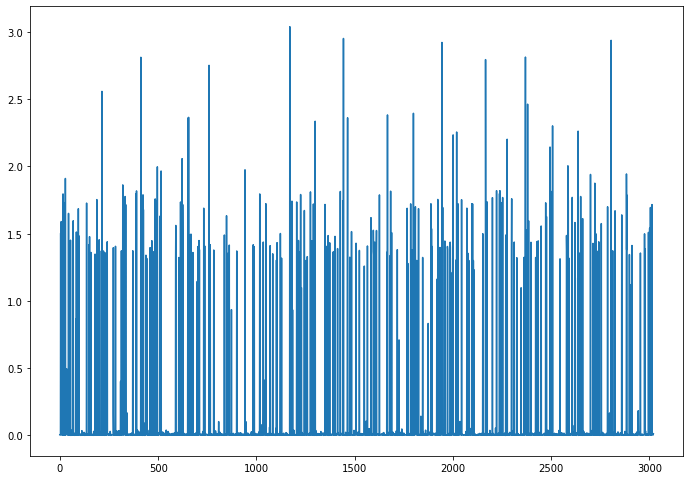

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

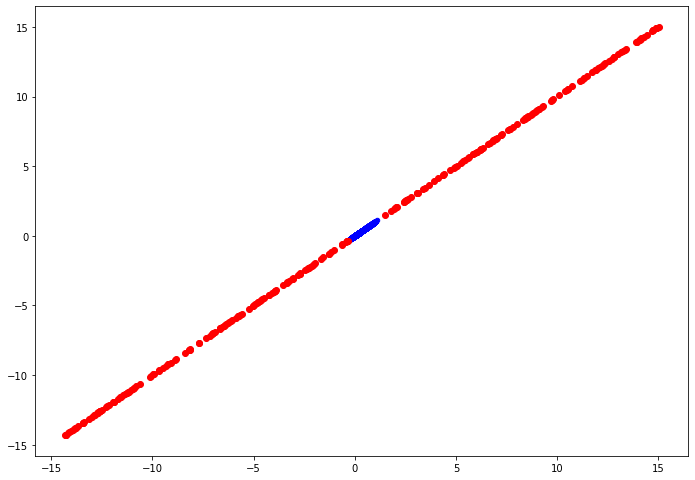

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


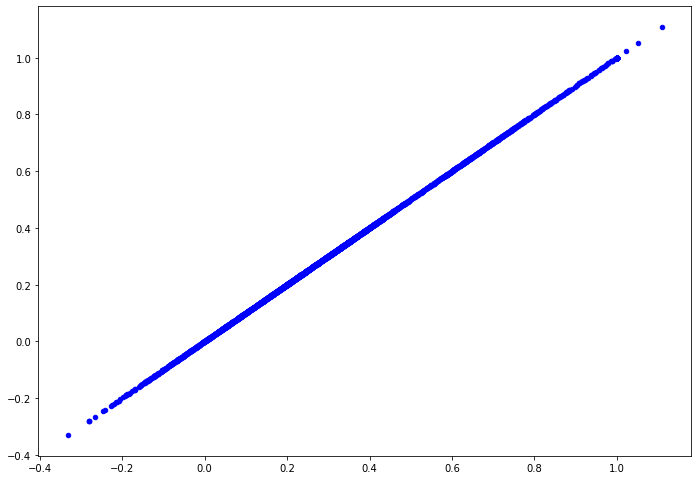

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_4

In [ ]:
currentAttr = 'MFCCs_4'

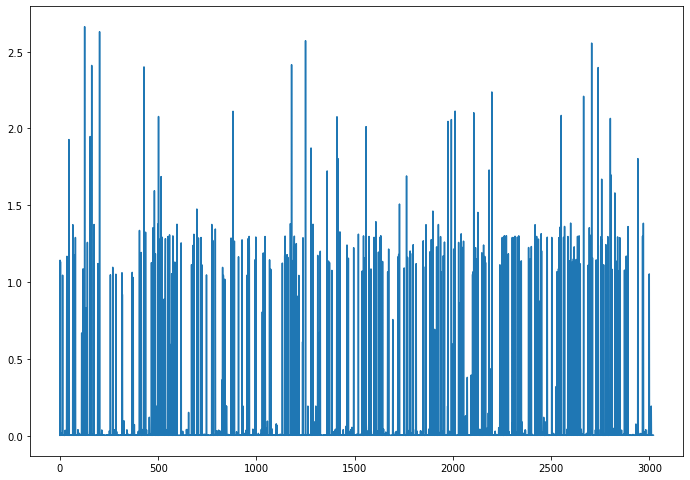

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

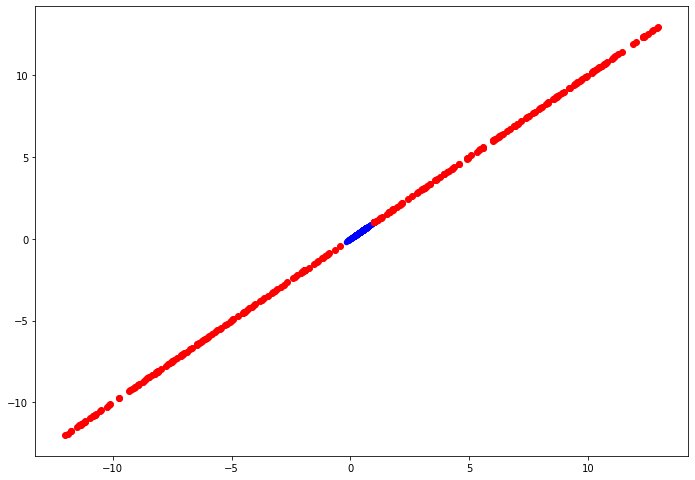

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.17)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


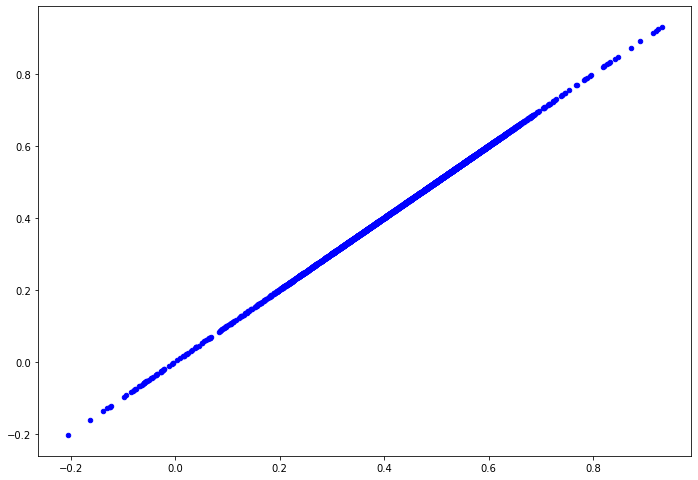

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_5

In [ ]:
currentAttr = 'MFCCs_5'

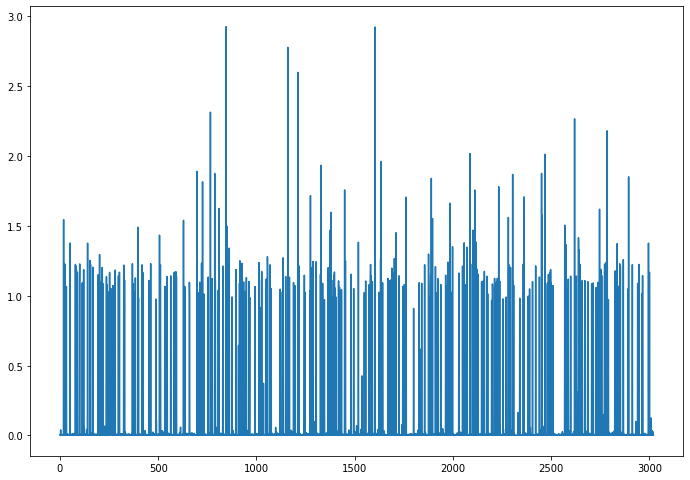

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

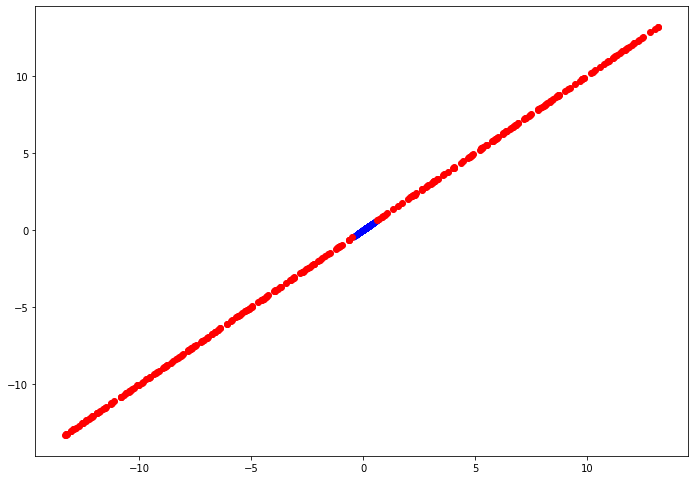

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


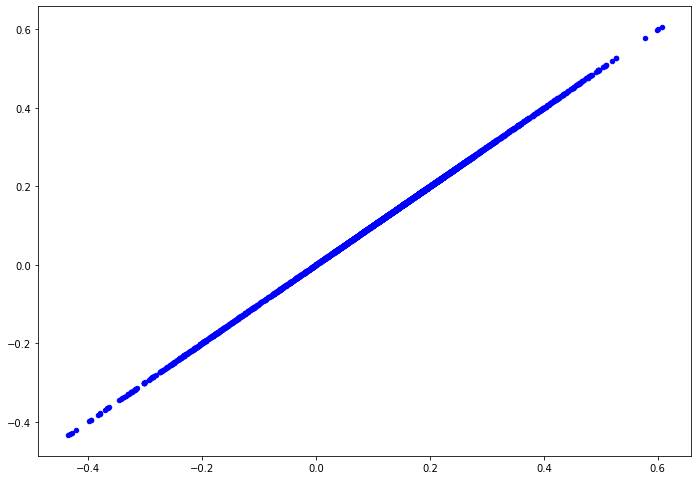

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_6

In [ ]:
currentAttr = 'MFCCs_6'

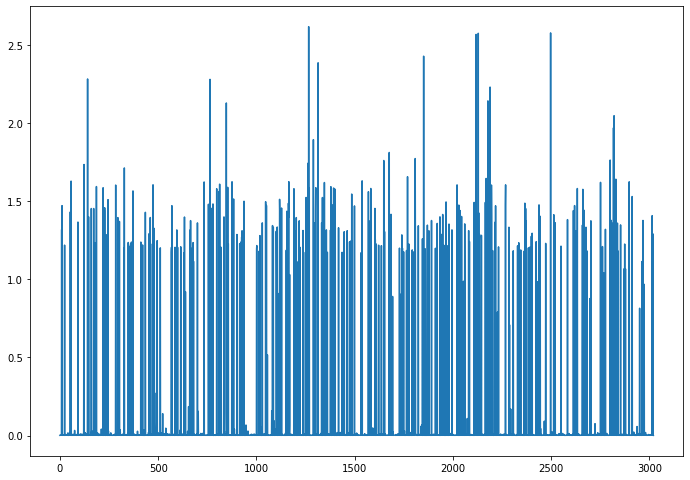

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

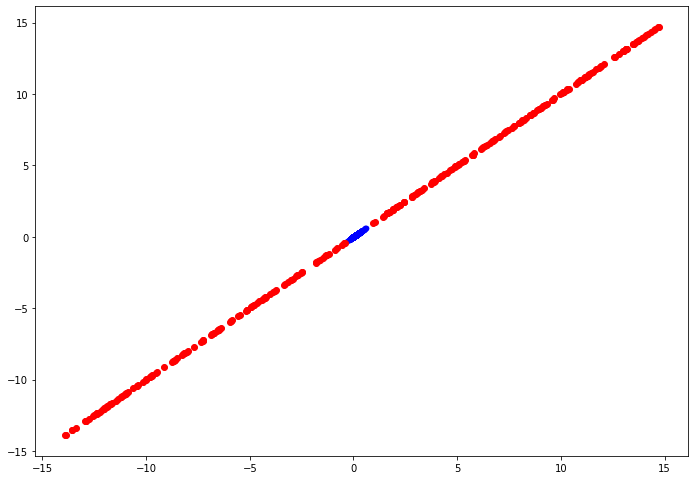

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.185)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


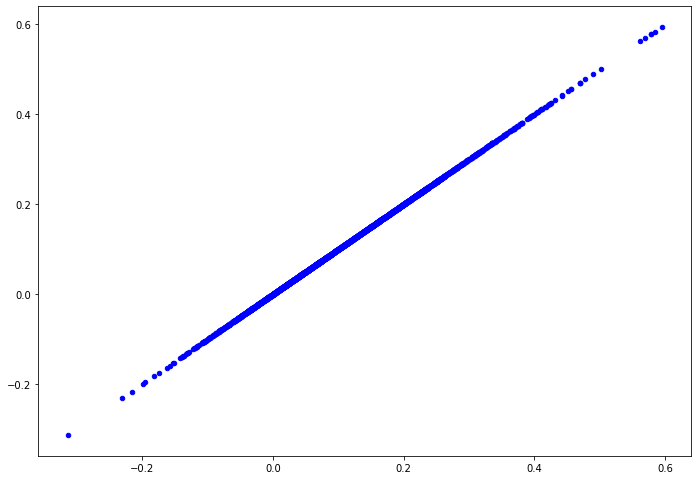

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_7

In [ ]:
currentAttr = 'MFCCs_7'

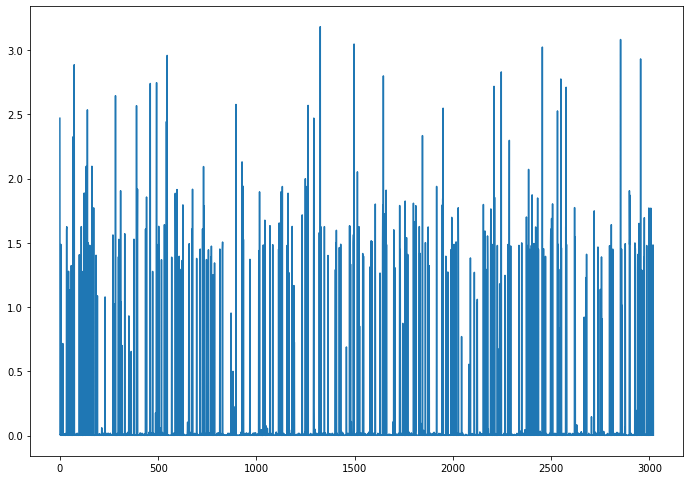

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

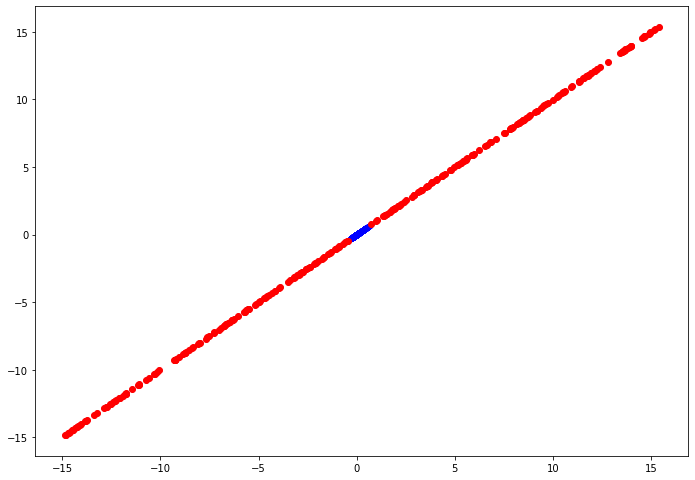

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.19)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


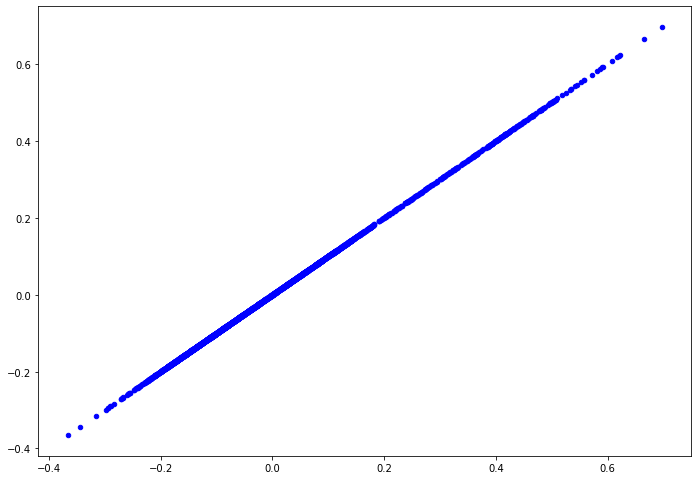

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_8

In [ ]:
currentAttr = 'MFCCs_8'

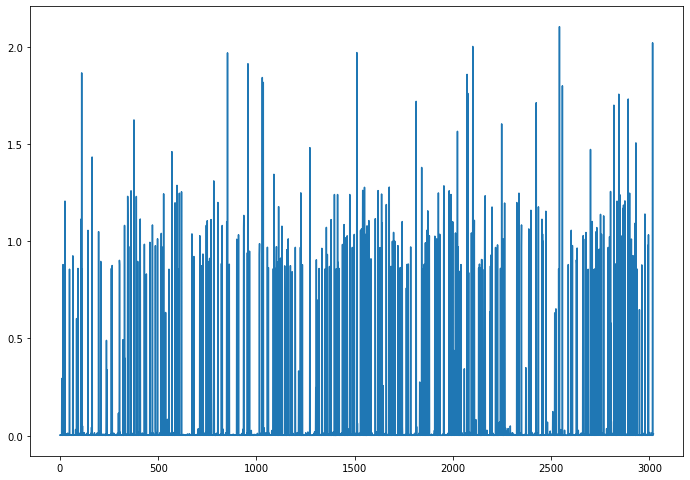

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

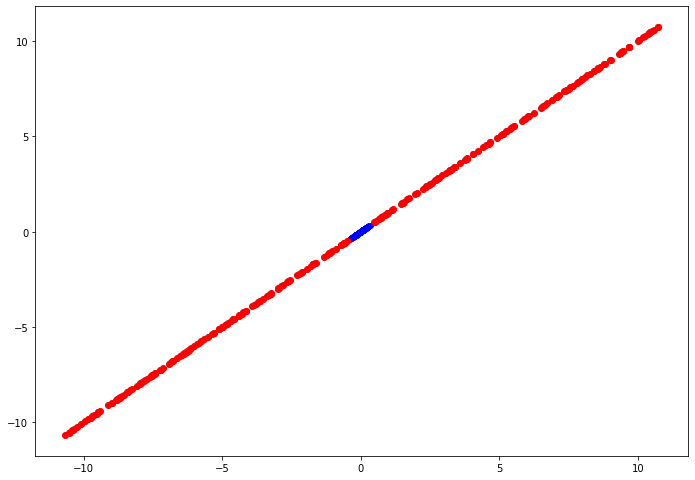

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


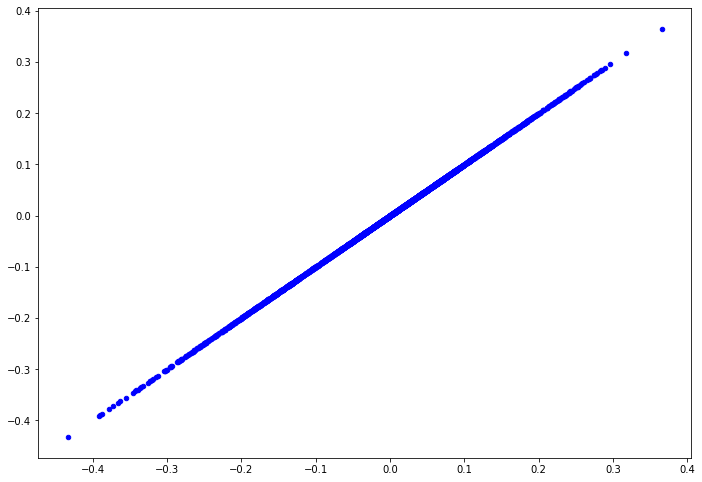

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_9

In [ ]:
currentAttr = 'MFCCs_9'

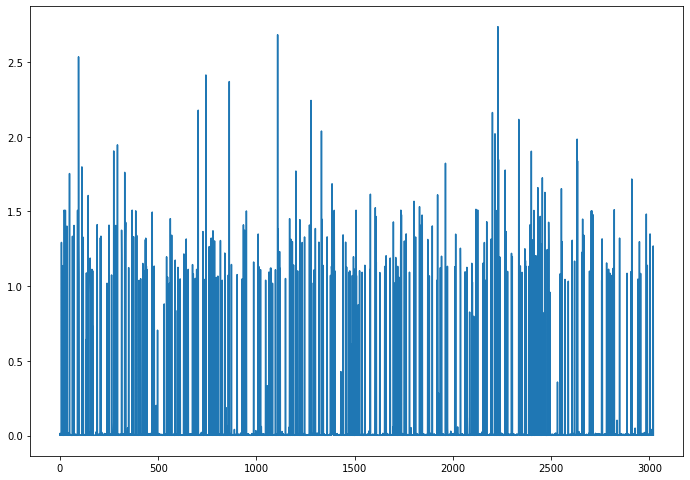

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

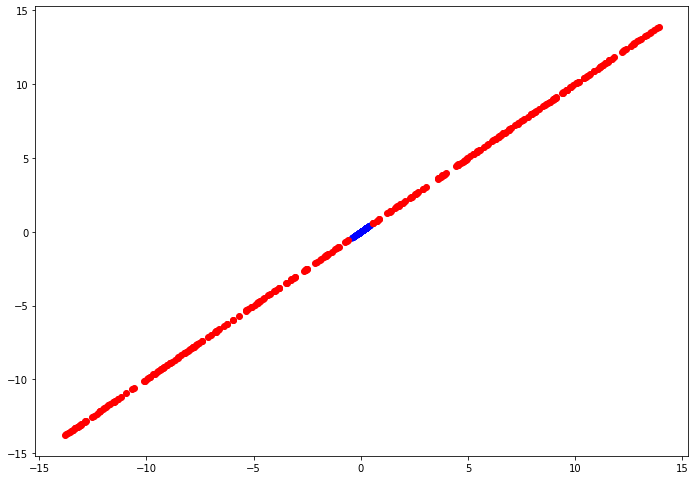

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.175)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


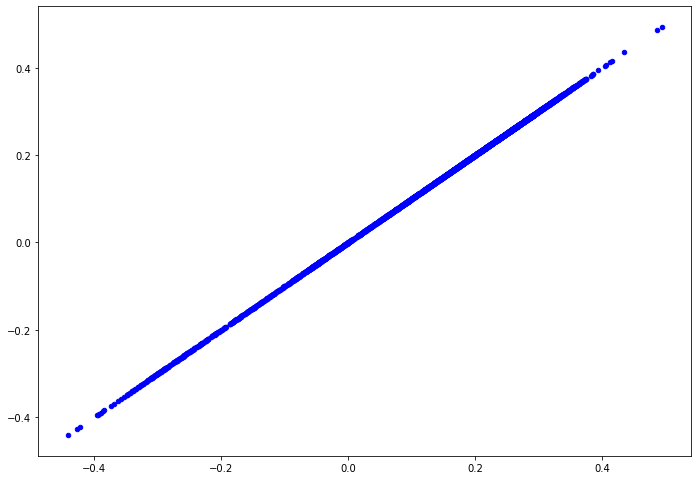

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_10

In [ ]:
currentAttr = 'MFCCs_10'

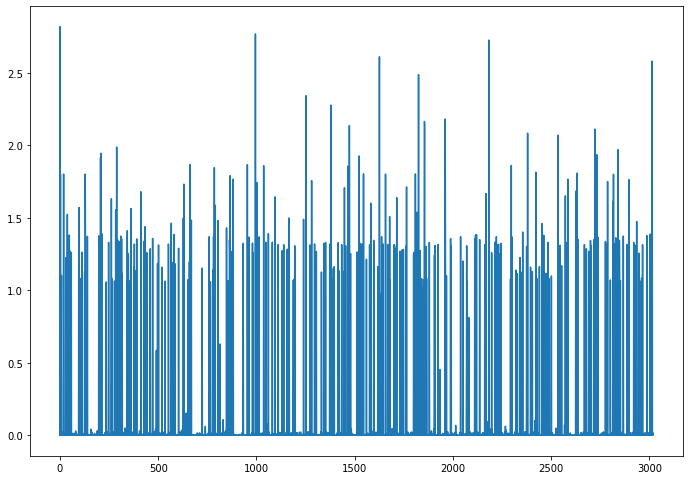

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

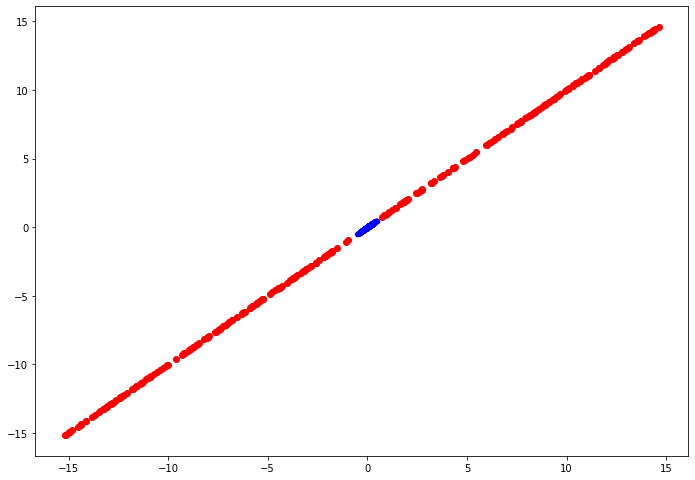

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.2)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


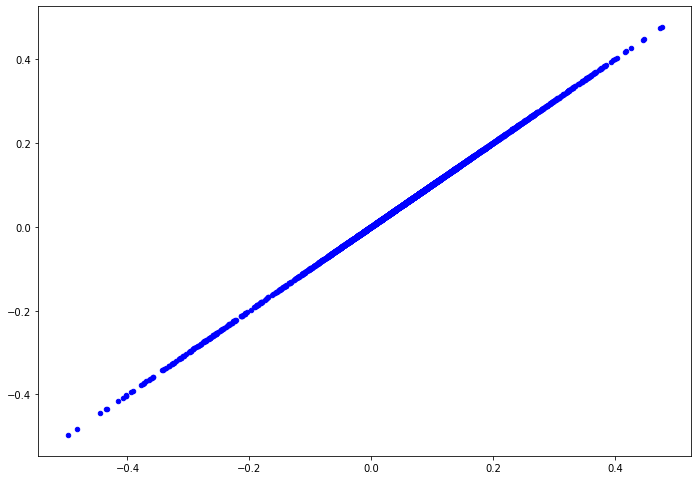

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_11

In [ ]:
currentAttr = 'MFCCs_11'

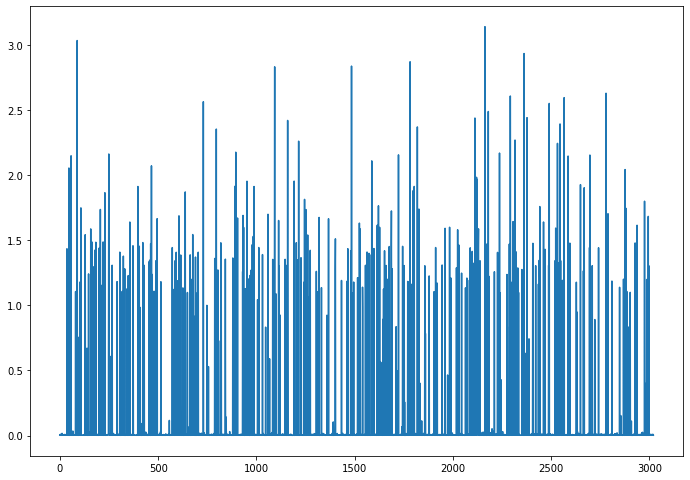

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

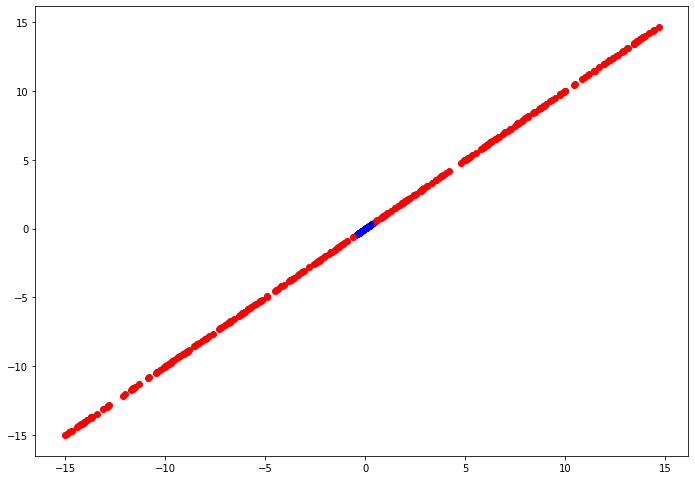

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


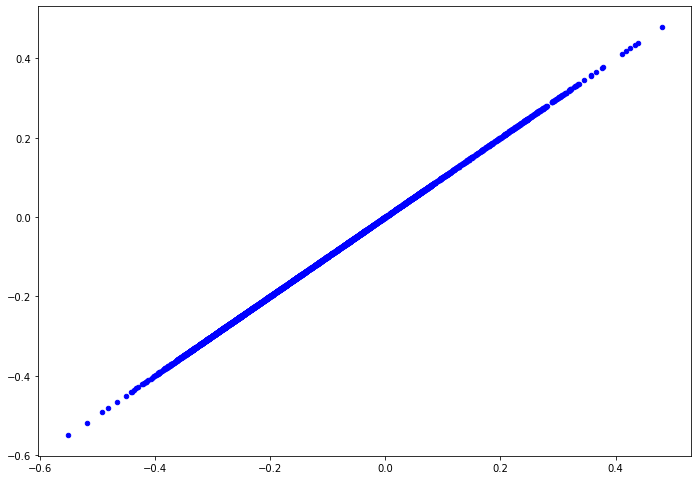

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_12

In [ ]:
currentAttr = 'MFCCs_12'

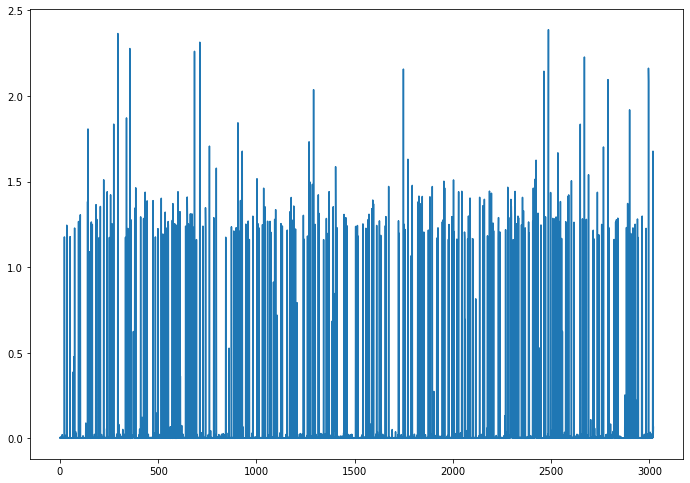

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

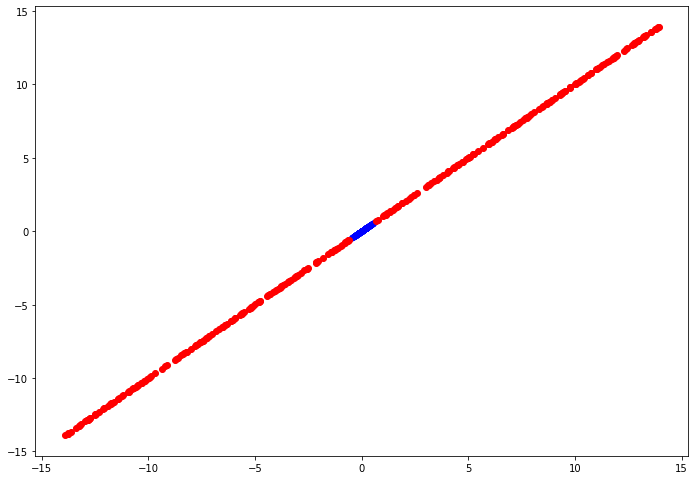

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


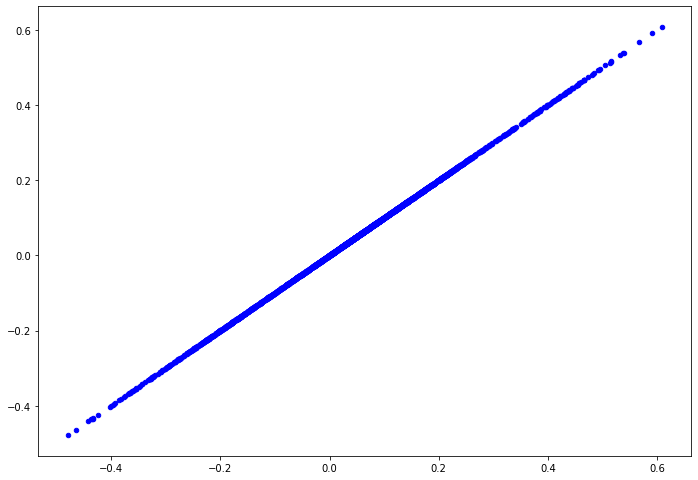

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_13

In [ ]:
currentAttr = 'MFCCs_13'

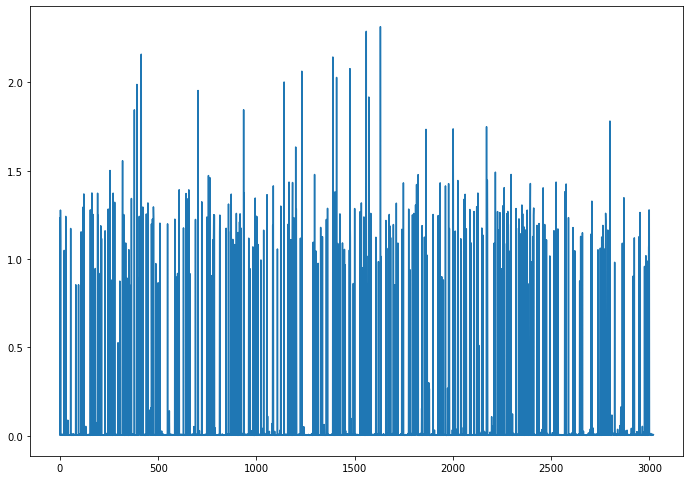

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

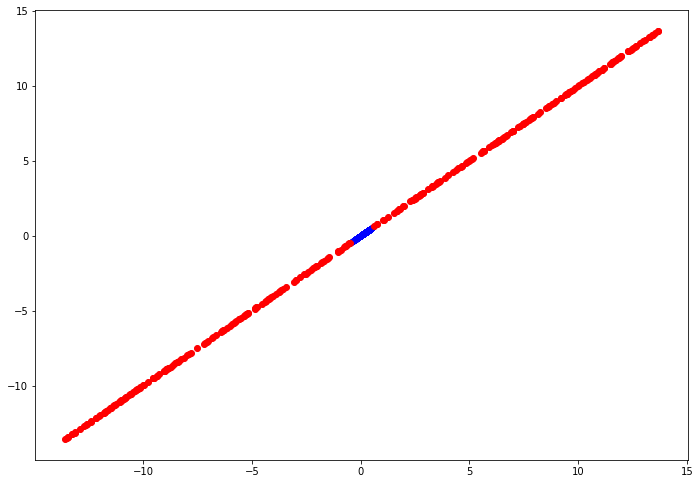

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


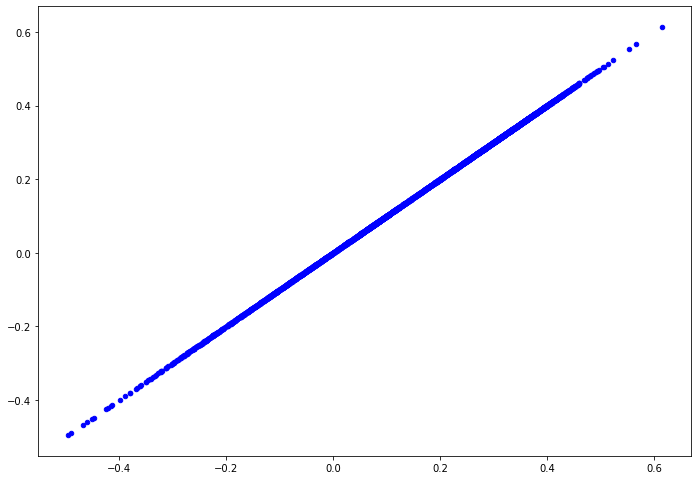

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_14

In [ ]:
currentAttr = 'MFCCs_14'

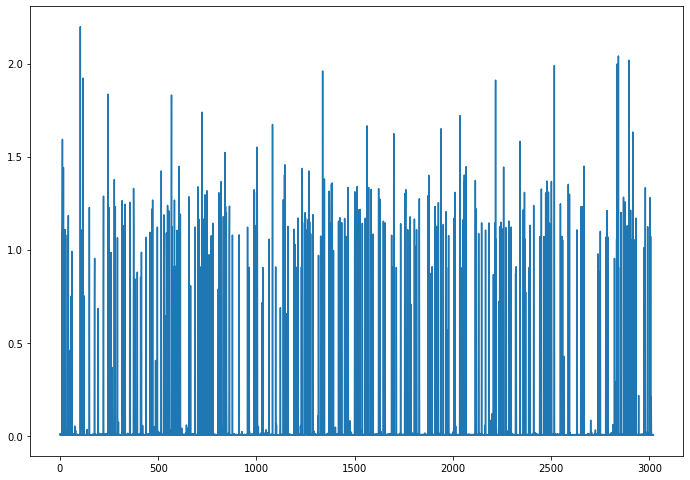

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

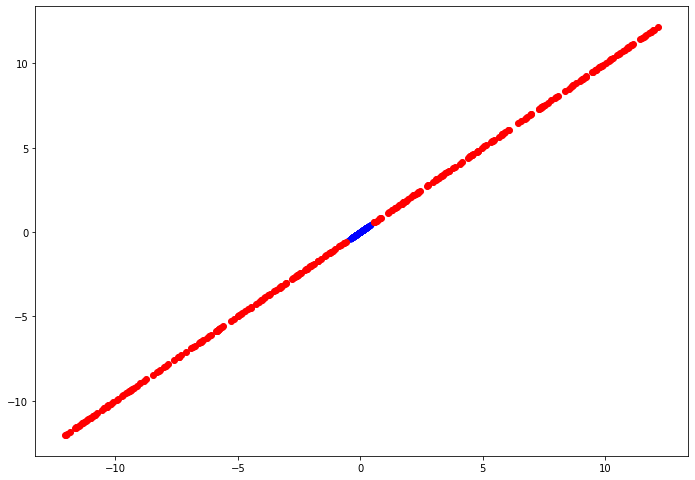

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


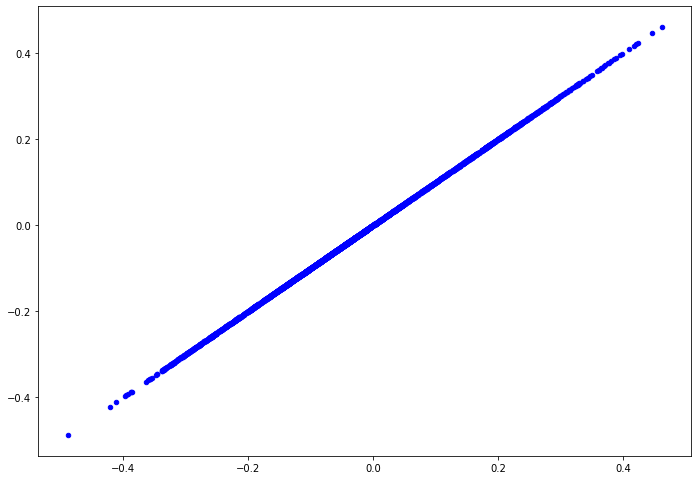

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_15

In [ ]:
currentAttr = 'MFCCs_15'

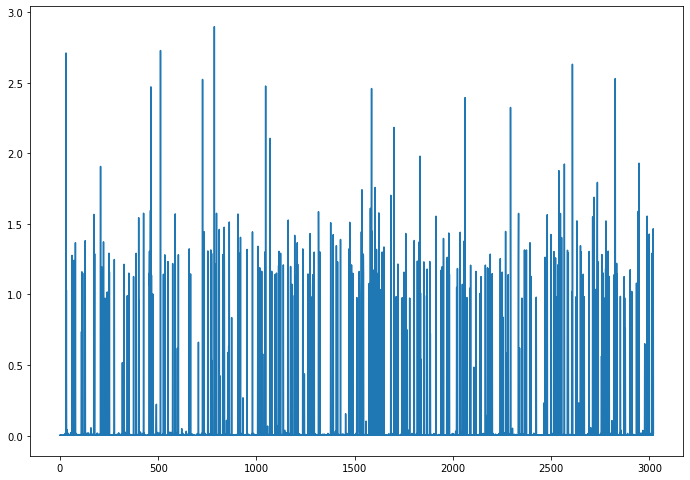

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

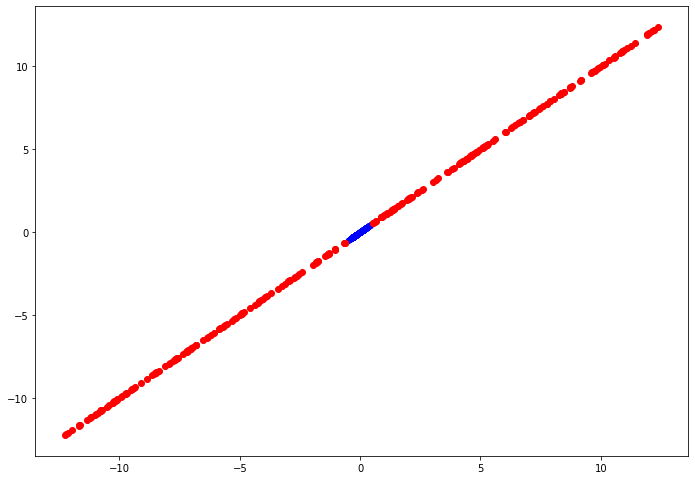

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


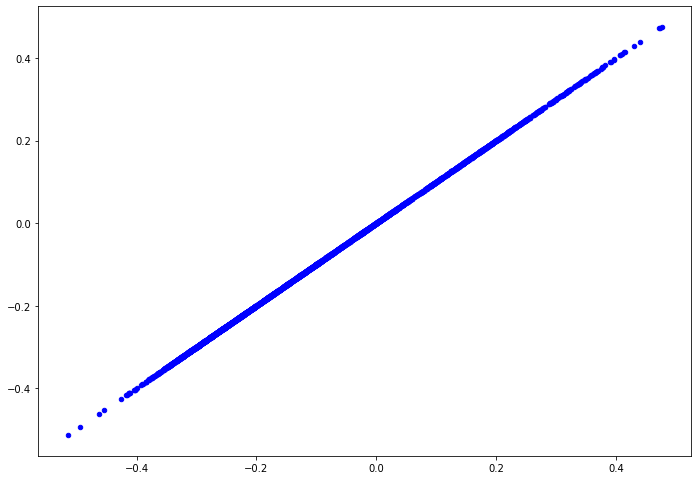

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_16

In [ ]:
currentAttr = 'MFCCs_16'

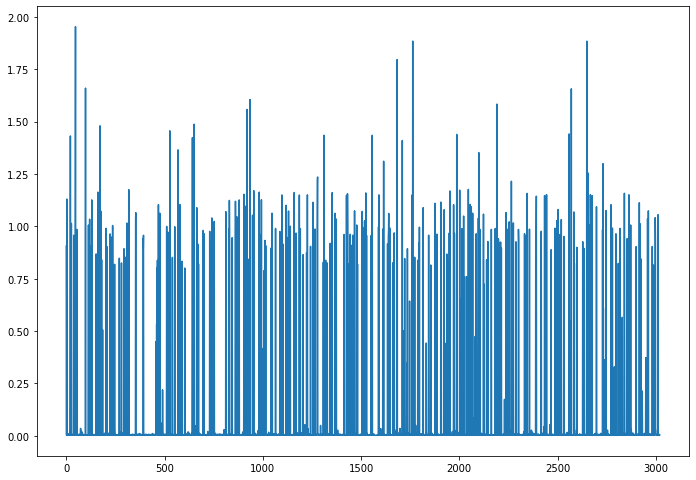

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

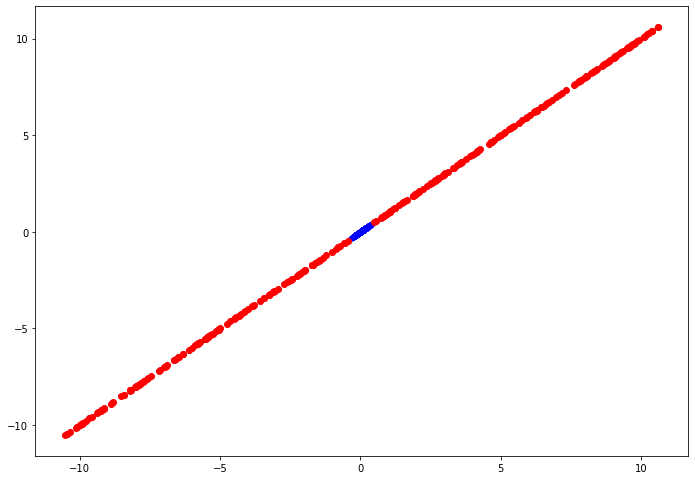

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


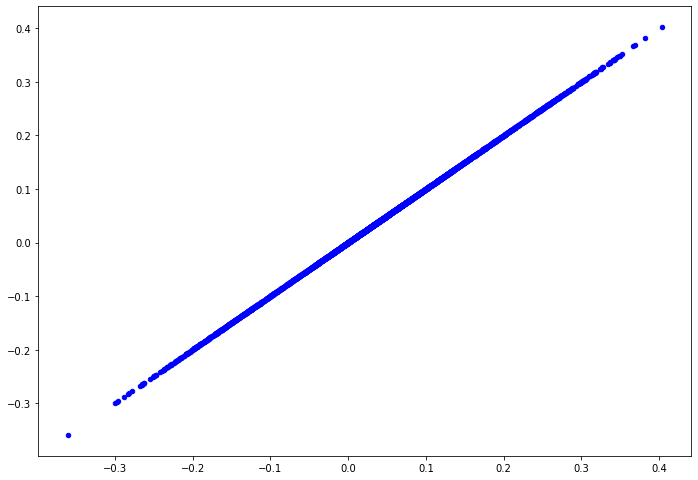

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_17

In [ ]:
currentAttr = 'MFCCs_17'

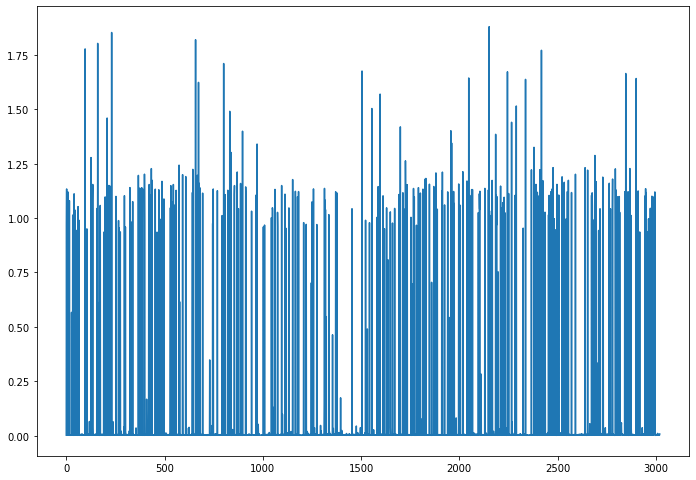

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

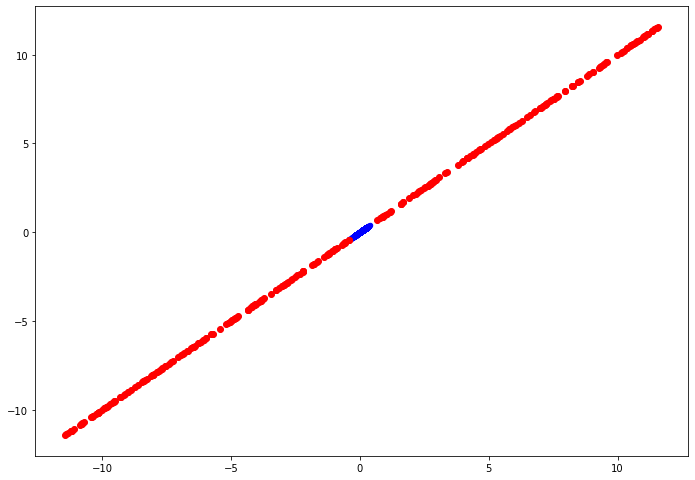

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.15)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


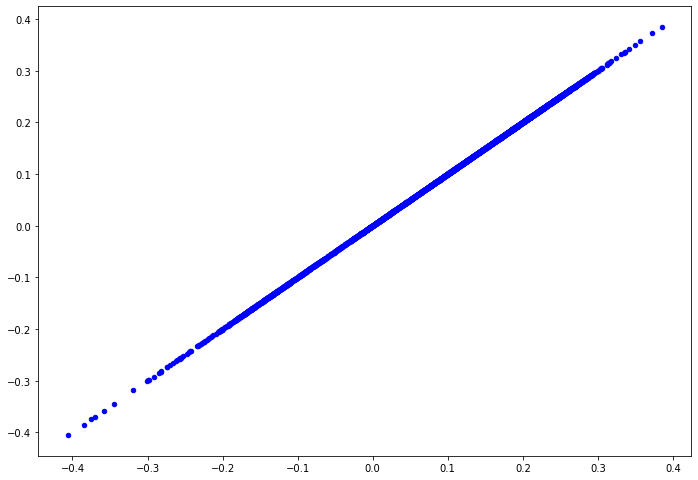

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_18

In [ ]:
currentAttr = 'MFCCs_18'

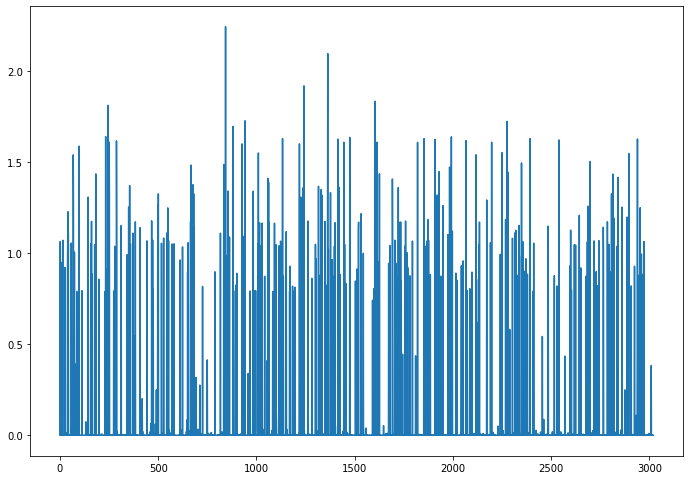

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

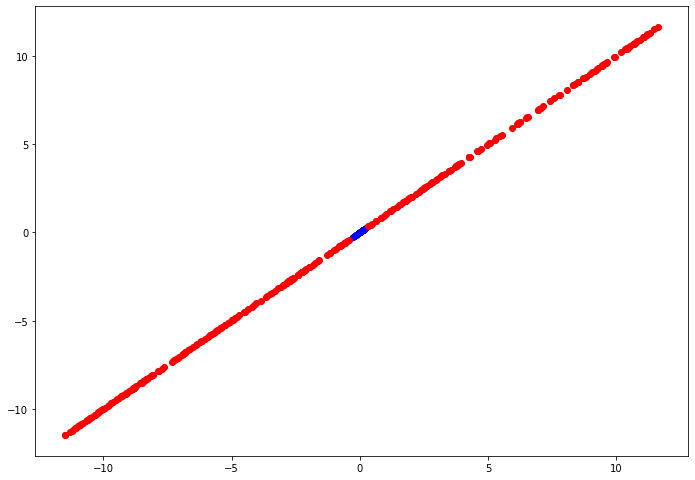

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.13)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


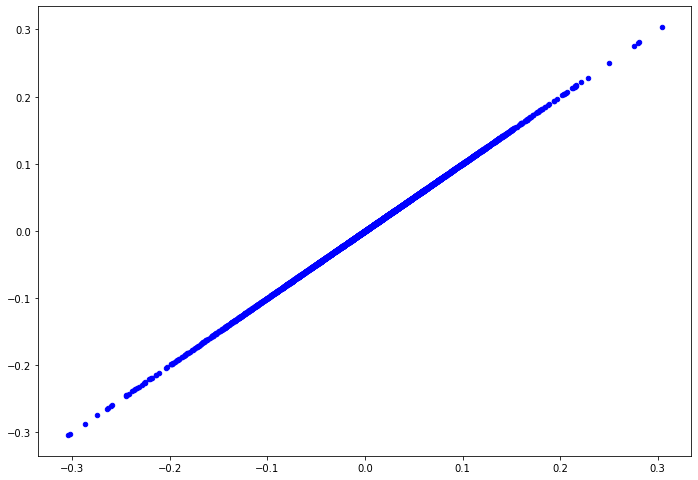

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_19

In [ ]:
currentAttr = 'MFCCs_19'

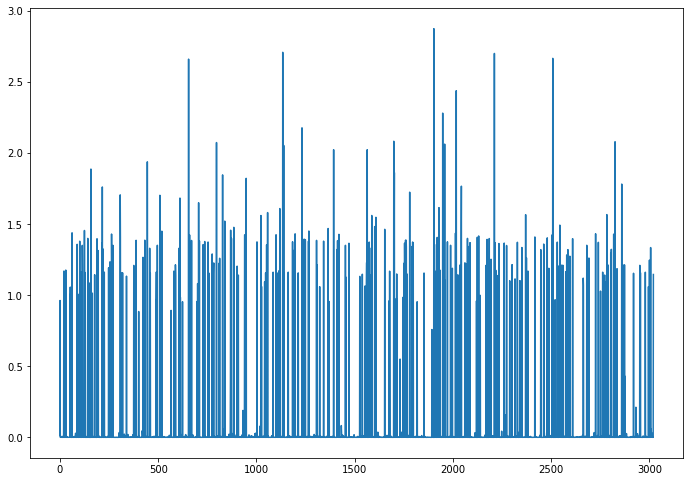

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

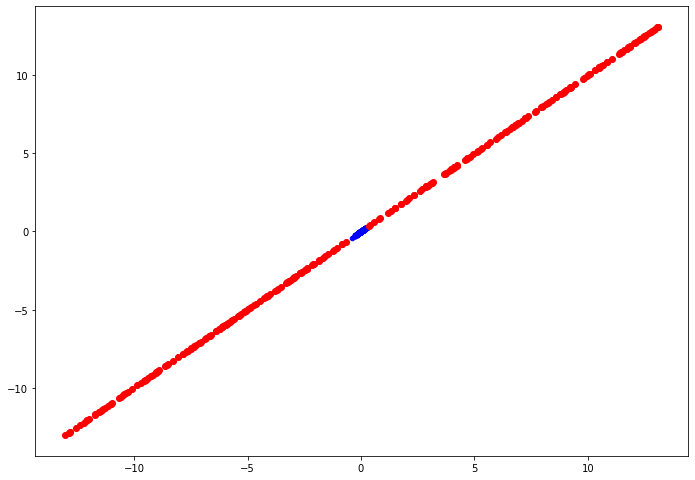

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.18)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


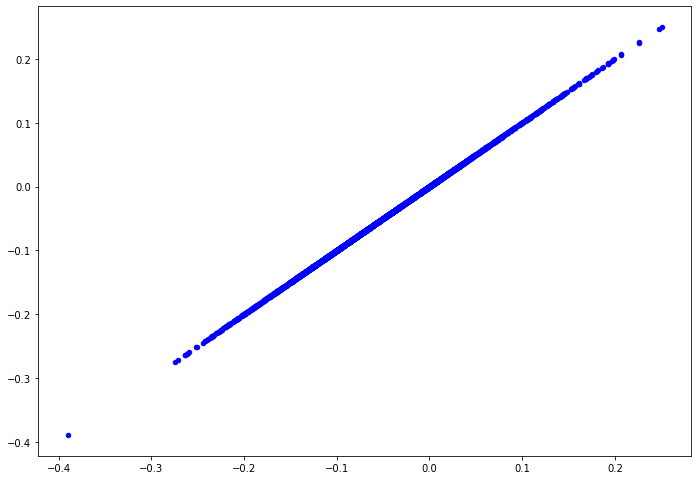

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_20

In [ ]:
currentAttr = 'MFCCs_20'

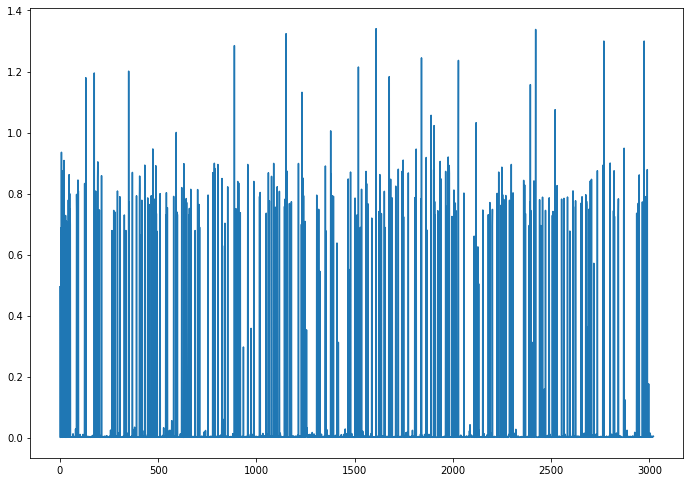

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

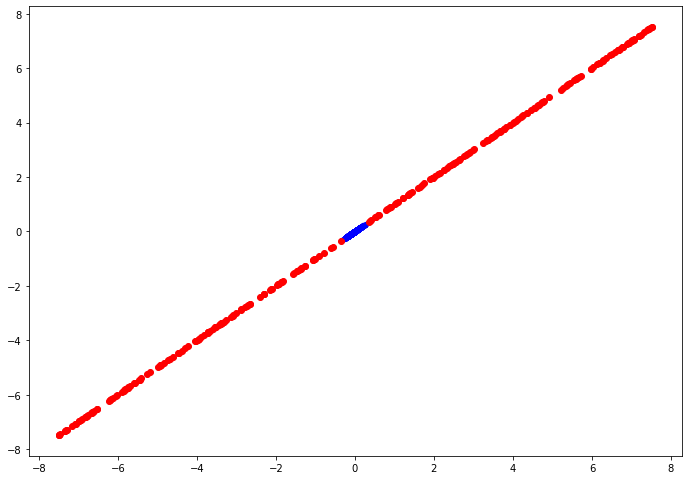

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


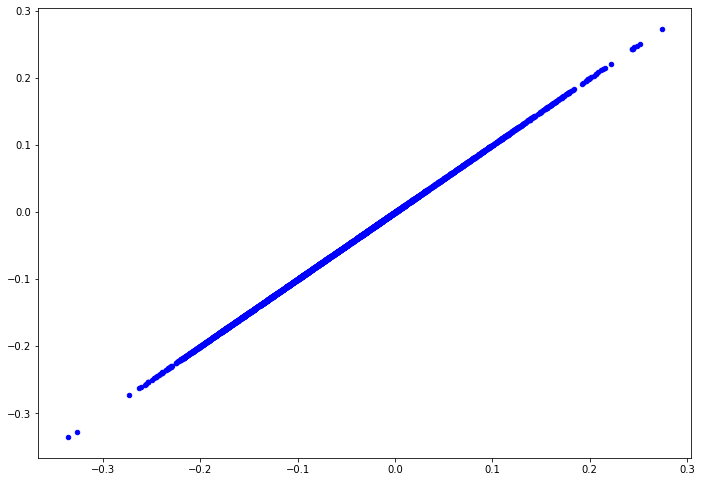

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_21

In [ ]:
currentAttr = 'MFCCs_21'

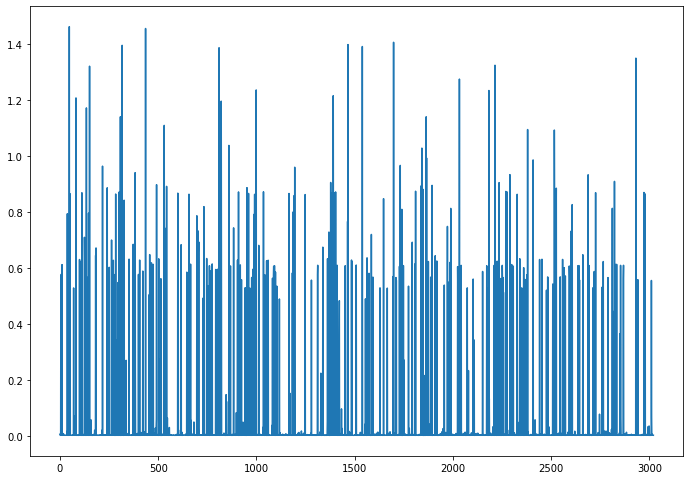

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

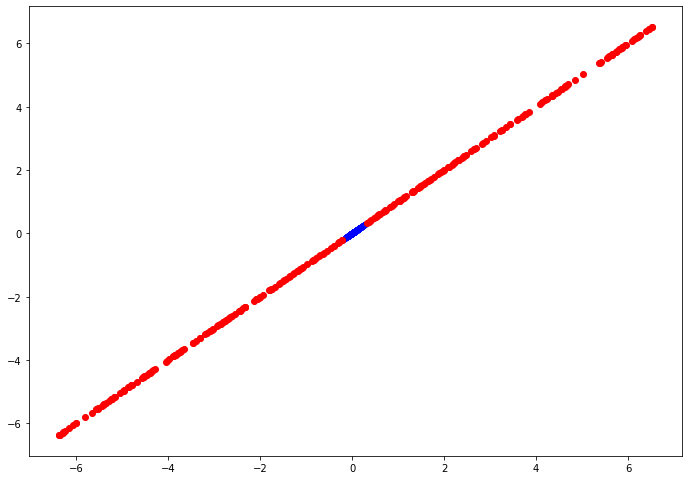

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.08)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


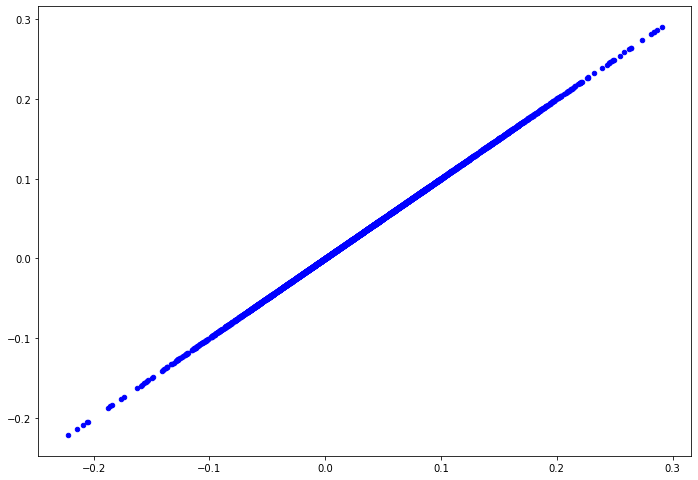

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

MFCCs_22

In [ ]:
currentAttr = 'MFCCs_22'

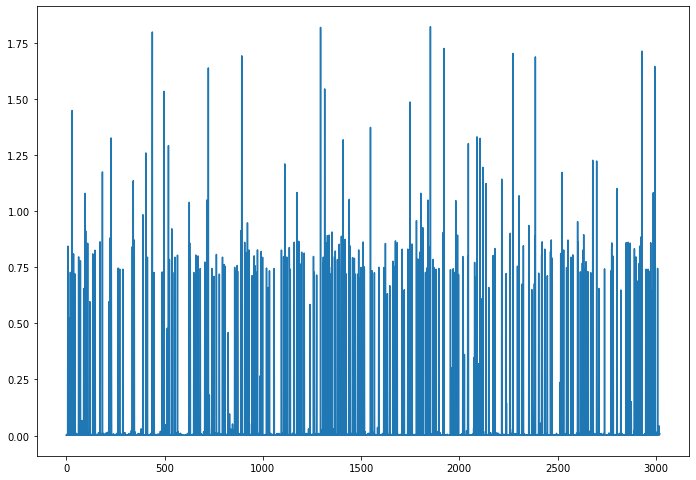

In [ ]:
Xval = currentDirtyFrogsKNN[currentAttr].values.reshape(-1,1)
nbrs = NearestNeighbors(n_neighbors = 60)
# fit model
nbrs.fit(Xval)
# distances and indexes of k-neaighbors from model outputs
distances, indexes = nbrs.kneighbors(Xval)
# plot mean of k-distances of each observation
plt.plot(distances.mean(axis =1))

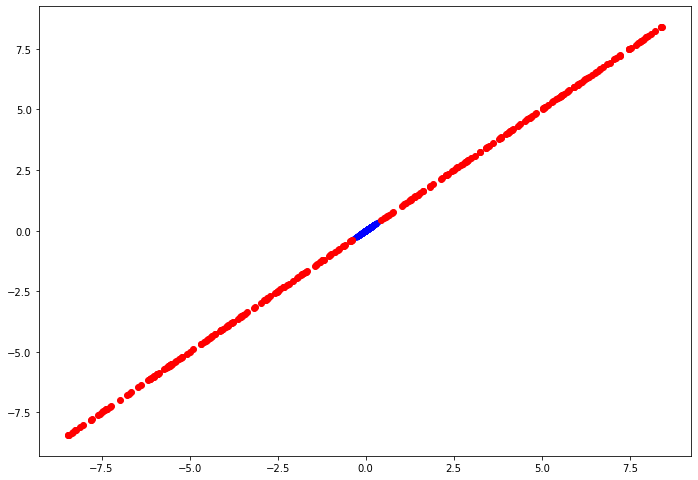

In [ ]:
# find the outliers
outlier_index = np.where(distances.mean(axis = 1) > 0.1)
outlier_values = currentDirtyFrogsKNN.iloc[outlier_index]

# plot data
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

# plot outlier values
plt.scatter(outlier_values[currentAttr], outlier_values[currentAttr], color = "r")

In [ ]:
# impute values for outliers

currentDirtyFrogsKNN[currentAttr].iloc[outlier_index] = np.NaN

dfNoString = frogsNoString(currentDirtyFrogsKNN)
multivariate_impute_pipe = ColumnTransformer([
    ("impute_num", IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10),
                                    max_iter=100), dfNoString.columns)])
df_mice = multivariate_impute_pipe.fit_transform(dfNoString)
df_mice = pd.DataFrame(df_mice, columns=dfNoString.columns)

currentDirtyFrogsKNN[currentAttr] = df_mice[currentAttr]

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


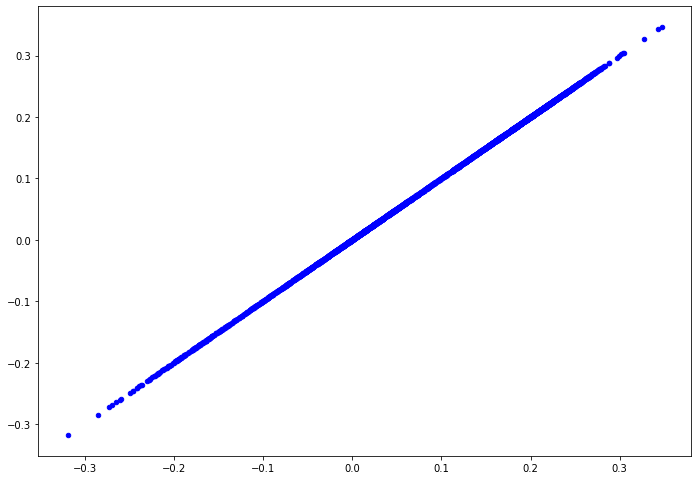

In [ ]:
plt.scatter(currentDirtyFrogsKNN[currentAttr], currentDirtyFrogsKNN[currentAttr], color = "b", s = 20)

### ML algorithm after outlier detection

Z-Score

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsZS)

In [ ]:
# evaluate ZS with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.889109566368752
Recall   : 0.889109566368752
Precision: 0.8775070290324856
F1 score : 0.8632546568434162


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate ZS with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9764978483945713
Recall   : 0.9764978483945713
Precision: 0.9765397360436648
F1 score : 0.9763124772905479


KNN

In [ ]:
X_train, y_train = frogsSplitML(currentDirtyFrogsKNN)

In [ ]:
# evaluate KNN with RidgeClassifier

clf1 = RidgeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf1.predict(X_test)))
print("Recall   :", recall_score(y_test, clf1.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf1.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf1.predict(X_test), average="weighted"))

Accuracy : 0.8930817610062893
Recall   : 0.8930817610062893
Precision: 0.875547635702537
F1 score : 0.8674386574215736


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# evaluate KNN with DecisionTreeClassifier

clf2 = DecisionTreeClassifier().fit(X_train, y_train)

print("Accuracy :", accuracy_score(y_test, clf2.predict(X_test)))
print("Recall   :", recall_score(y_test, clf2.predict(X_test), average="weighted"))
print("Precision:", precision_score(y_test, clf2.predict(X_test), average="weighted"))
print("F1 score :", f1_score(y_test, clf2.predict(X_test), average="weighted"))

Accuracy : 0.9844422376696458
Recall   : 0.9844422376696458
Precision: 0.9844998205351337
F1 score : 0.9843997491727416
